# Seeking Alpha
  
    
## Contents

- ### Introduction（1）
- ### DataSet, Investment Universe and Data Processing（2~3）
- ### Factor Research（4）
- ### Portfolio Construction and Backtest（5~6）

# 1. Introduction（investment ideas）

### Methodology
1. 利用single index model找出alpha（$\alpha$）大的股票。
   - $R_ {it} = \alpha_ {i} + \beta_ {i} R_ {mt} + \epsilon_ {it}$ 
   - $R_ {it}$ 代表資產i在t-1至t期間的簡單報酬率（ROI）.
   - $R_ {mt}$ 代表完全分散風險的投資組合（理應用等權重加權，但這邊為了簡化以發行量加權股價報酬指數替代）在t-1至t期間的簡單報酬率（ROI）  
   
   
2. 找出本益比（PER）小的股票。
3. 利用alpha大且本益比小的前50檔股票，並以等權重方式建構投資組合。
4. 每月再平衡。

### Reference
- Sharpe, William F. (1963). A Simplified Model for Portfolio Analysis. Management Science. 9 (2): 277-93.
- Sharpe, W.F. (1964). Capital asset prices: a theory of market equilibrium under conditions of risk. The Journal of Finance, 19(3), 425-442.
- Jensen, M. C. (1968). The Performance of Mutual Funds in the Period 1945-1964. The Journal of Finance, 23, 389-416.
- Berkin and Swedroe (2016). Your Complete Guide to Factor-Based Investing: The Way Smart Money Invests Today. BAM ALLIANCE Press.
- 葉怡成（2020）。台股研究室：36種投資模型操作績效總體檢！。財經傳訊出版社
- [尋找Alpha](https://www.tejwin.com/insight/%e5%b0%8b%e6%89%bealpha/)

# 2. DataSet and Investment Universe

## Imports & Settings

In [1]:
import pandas as pd
import datetime
import tejapi
import os

# set tej_key and base
tej_key = 'your key'
api_base = 'https://api.tej.com.tw'

os.environ['TEJAPI_KEY'] = tej_key
os.environ['TEJAPI_BASE']= api_base

tejapi.ApiConfig.api_key = tej_key  
tejapi.ApiConfig.api_base = api_base

# set benchmark
benchmark=['IR0001']

# set calendar
calendar_name = 'TEJ_XTAI'

# set bundle name
bundle_name = 'tquant'

# 取得回測資料所需原始資料
start = '2005-01-01'
end = '2023-08-25'

# 由文字型態轉為Timestamp，供回測使用
tz = 'UTC'
start_dt, end_dt = pd.Timestamp(start, tz = tz), pd.Timestamp(end, tz = tz)

# 設定os.environ['mdate'] = start+' '+end，供ingest bundle使用
os.environ['mdate'] = start_dt.strftime('%Y-%m-%d')+' '+end_dt.strftime('%Y-%m-%d')

## Investment Universe

- 資料期間設定為**2005-01-01~2023-08-25**
- 設定`os.environ['ticker']=公司碼`，供後續**ingest bundle**用。這邊僅使用上述時間段內**曾經上市**的公司做為樣本。

In [2]:
attr = tejapi.fastget('TWN/APISTKATTR',
                      mdate={'gte':start,
                             'lte':end},
                      opts={'columns':['coid','mdate','idx_twn50','idx_mcap',
                                       'mkt','stktp_e']},
                      paginate=True)

In [3]:
StockList = (attr.
             query('(mkt=="TWSE") & (stktp_e=="Common Stock")').
             coid.
             unique().
             tolist())

print(len(StockList))

1138


In [4]:
os.environ['ticker'] = ' '.join(StockList + benchmark)

In [5]:
os.environ['ticker']

'1101 1102 1103 1104 1107 1108 1109 1110 1201 1203 1204 1207 1210 1212 1213 1215 1216 1217 1218 1219 1220 1225 1227 1229 1231 1232 1233 1234 1235 1236 1256 1262 1301 1303 1304 1305 1306 1307 1308 1309 1310 1311 1312 1313 1314 1315 1316 1319 1321 1323 1324 1325 1326 1337 1338 1339 1340 1341 1342 1402 1408 1409 1410 1413 1414 1416 1417 1418 1419 1423 1432 1434 1435 1436 1437 1438 1439 1440 1441 1442 1443 1444 1445 1446 1447 1449 1450 1451 1452 1453 1454 1455 1456 1457 1459 1460 1462 1463 1464 1465 1466 1467 1468 1469 1470 1471 1472 1473 1474 1475 1476 1477 1503 1504 1506 1507 1512 1513 1514 1515 1516 1517 1519 1520 1521 1522 1523 1524 1525 1526 1527 1528 1529 1530 1531 1532 1533 1535 1536 1537 1538 1539 1540 1541 1558 1560 1568 1582 1583 1587 1589 1590 1592 1597 1598 1601 1603 1604 1605 1606 1608 1609 1611 1612 1613 1614 1615 1616 1617 1618 1626 1701 1702 1704 1707 1708 1709 1710 1711 1712 1713 1714 1715 1716 1717 1718 1720 1721 1722 1723 1724 1725 1726 1727 1729 1730 1731 1732 1733 1734

## Ingest

In [6]:
!zipline ingest -b tquant

Merging daily equity files:


[2023-08-31 02:45:17.404610] INFO: zipline.data.bundles.core: Ingesting tquant.


# 3. Data Processing

## Imports & Settings

In [7]:
import warnings
warnings.filterwarnings('ignore')

In [8]:
from time import time
import numpy as np
from logbook import Logger, StderrHandler, INFO
import matplotlib.pyplot as plt

from zipline import run_algorithm

from zipline.utils.run_algo import  (get_transaction_detail,
                                     get_record_vars)

from zipline.api import (attach_pipeline,
                         pipeline_output,
                         date_rules,
                         time_rules,
                         record,
                         schedule_function,
                         commission,
                         slippage,
                         set_slippage,
                         set_commission,
                         order_target,
                         order_target_percent,
                         sid,
                         symbols,
                         symbol,
                         get_datetime,
                         set_benchmark,
                         get_open_orders,
                         cancel_order)

from zipline.sources.TEJ_Api_Data import (get_Treasury_Return,
                                          get_Benchmark_Return)

from TejToolAPI.TejToolAPI import *

from zipline.utils.calendar_utils import get_calendar

from zipline.data import bundles
from zipline.data.data_portal import DataPortal, get_bundle

from zipline.pipeline import Pipeline, CustomFactor, CustomClassifier
from zipline.pipeline.data import Column, DataSet, EquityPricing
from zipline.pipeline.domain import TW_EQUITIES 
from zipline.pipeline.loaders.frame import DataFrameLoader
from zipline.pipeline.loaders import EquityPricingLoader
from zipline.pipeline.engine import SimplePipelineEngine
from zipline.finance.commission import PerDollar

import empyrical as ep

# 設定log顯示方式
log_handler = StderrHandler(format_string='[{record.time:%Y-%m-%d %H:%M:%S.%f}]: ' +
                            '{record.level_name}: {record.func_name}: {record.message}',
                            level=INFO)
log_handler.push_application()
log = Logger('Algorithm')

## Access other datasets in Pipeline and create factor

### Tej-tool-api

利用Tej-tool-api的`get_history_data()`方法取得其他資料。
<br>

- **Market**：市場別。
- **ROI**：報酬率。
- **PER_TEJ**：TEJ計算之本益比。

In [9]:
col = ['Market',
       'ROI',
       'PER_TEJ']

df_TEJ = get_history_data(ticker = StockList+benchmark,
                          columns = col,
                          start = start_dt,
                          end = end_dt,
                          transfer_to_chinese = False)

col = list(df_TEJ.columns.drop(['mdate','coid']))

## Data transformation for pipeline

In [10]:
# 使用`loads other datasets`前先檢查外部資料與bundle的公司碼，若外部資料有bundle沒有的公司碼，`loads other datasets()`會報錯。

other_datasets_coid=list(df_TEJ.coid.unique())
bundle_coid=list(StockList+benchmark)

# 獲取存在於other_datasets_coid中但不存在於bundle_coid中的元素
diff = list(set(other_datasets_coid).difference(set(bundle_coid)))

if len(diff)>0:
    print('請確認：','外部資料有但bundle沒有的公司碼(需處理)',diff)

In [11]:
# 用來讀取先前ingest的bundle資料，後續就可以利用 `asset_finder.lookup_symbols(symbols, as_of_date=None)`取得`sid`資訊 
bundle = bundles.load(bundle_name)


def load_other_datasets(df_data, bundle, columns):
        
    dict_data = {}    
    df_data['coid']=df_data['coid'].astype(str)    
       
    for i in columns:
        if columns!=['coid','mdate']:               
            df_data1 = df_data[['coid', 'mdate']+[i]].set_index(['coid', 'mdate'])
            symbols = df_data1.index.get_level_values(0).unique().tolist()  
            assets = bundle.asset_finder.lookup_symbols(symbols, as_of_date=None)    
            sids = pd.Int64Index([asset.sid for asset in assets])
            symbol_map = dict(zip(symbols, sids))
            dict_data[i] = (df_data1[i]
                .unstack('coid')
                .rename(columns=symbol_map)
                .tz_localize('UTC')
                           )
            
    return dict_data

dict_data = load_other_datasets(df_TEJ, bundle, col) 

## Define Custom Dataset

In [12]:
class OtherDatasets(DataSet):
     
    Market = Column(dtype=object)    
    ROI = Column(dtype=float)  
    PER_TEJ = Column(dtype=float)
 
    domain = TW_EQUITIES

In [13]:
# `_column_names`：該屬性可以用來取得`DataSet`物件下定義的所有`Column`.
OtherDatasets()._column_names

frozenset({'Market', 'PER_TEJ', 'ROI'})

## Pipeline Loaders

In [14]:
custom_loader = {}

inputs=[
        OtherDatasets.Market,
        OtherDatasets.ROI,
        OtherDatasets.PER_TEJ,  
        ]

for i in inputs:
    custom_loader[i]=DataFrameLoader(column=i,
                                     baseline=dict_data[i.name])
custom_loader

{OtherDatasets<TW>.Market::object: <zipline.pipeline.loaders.frame.DataFrameLoader at 0x1858c22e130>,
 OtherDatasets<TW>.ROI::float64: <zipline.pipeline.loaders.frame.DataFrameLoader at 0x1858c22ea60>,
 OtherDatasets<TW>.PER_TEJ::float64: <zipline.pipeline.loaders.frame.DataFrameLoader at 0x18601a7d3a0>}

## Create CustomFactor

In [15]:
from scipy.stats import linregress
from zipline.errors import IncompatibleTerms
from numpy import broadcast_arrays

from zipline.assets import Asset
from zipline.pipeline.filters import SingleAsset, StaticAssets
from zipline.pipeline.term import AssetExists
from zipline.pipeline.sentinels import NotSpecified
from zipline.utils.input_validation import (
    expect_types,
    expect_dtypes,
    expect_bounded
)
from zipline.utils.numpy_utils import (
    float64_dtype,
    int64_dtype,
    object_dtype,
)


ALLOWED_DTYPES = (float64_dtype, int64_dtype)

        
class _RollingLinearRegressionOfRoi(CustomFactor):
    
    params = ("allowed_missing_days",)
    outputs = ["alpha", "beta", "r_value", "p_value", "stderr", "count"]
    
        
    @expect_dtypes(dependent=ALLOWED_DTYPES,
                   independent=ALLOWED_DTYPES)
    @expect_types(allowed_missing_days=int,
                  regression_length=int,
                  target=Asset)
    @expect_bounded(allowed_missing_days=(3, 30),
                    regression_length=(2, None),)
    def __new__(cls,
                dependent,
                independent,
                market,
                regression_length,
                allowed_missing_days,
                target,
                mask=NotSpecified):    
        
#         ndim:The dimensions of the term's output (1D or 2D).
        if independent.ndim == 2 and dependent.mask is not independent.mask:
            raise IncompatibleTerms(term_1=dependent, term_2=independent)
            
        return super(_RollingLinearRegressionOfRoi, cls).__new__(
            cls,
            inputs=[dependent, independent, market],
            window_length=regression_length,
            allowed_missing_days=allowed_missing_days,
            mask=mask,
        )
    
    @property
    def target(self):
        """Get the target of the calculation."""
        return self.inputs[1].asset   
    
    def compute(self, today, assets, out, dependent, independent, market, allowed_missing_days):
        
        alpha = out.alpha
        beta = out.beta
        r_value = out.r_value
        p_value = out.p_value
        stderr = out.stderr
        count = out.count

        def regress(y, x):
            regr_results = linregress(y=y,
                                      x=x)
            # `linregress` returns its results in the following order:
            # slope, intercept, r-value, p-value, stderr, count
            alpha[i] = regr_results[1]
            beta[i] = regr_results[0]
            r_value[i] = regr_results[2]
            p_value[i] = regr_results[3]
            stderr[i] = regr_results[4]
            count[i] = len(x)

        # If `independent` is a Slice or single column of data, broadcast it
        # out to the same shape as `dependent`, then compute column-wise. This
        # is efficient because each column of the broadcasted array only refers
        # to a single memory location.
        independent = broadcast_arrays(independent, dependent)[0]
                
        if self.target.symbol=='IR0001':
            target_market='TWSE'
        elif self.target.symbol=='IR0043':
            target_market='OTC'
            
        for i in range(len(out)):
            if np.all(market[-allowed_missing_days:,i]==np.full((allowed_missing_days,), target_market)):

                y = dependent[:, i]
                x = independent[:, i]
                
                # Remove missing values from array y
                y_cleaned = y[~np.isnan(y)]
                # Remove corresponding data from array x as well
                x_cleaned = x[~np.isnan(y)]
                   
                regress(y=y_cleaned,
                        x=x_cleaned)     
                
    def __repr__(self):
        return "{}(target={}, length={}, allowed_missing_days={})".format(
            type(self).__name__,
            self.target,
            self.window_length,
            self.params["allowed_missing_days"],
        ) 
    
class Roi(CustomFactor):
    
    window_safe = True
    inputs =  [OtherDatasets.ROI] 

    def compute(self, today, assets, out, ROI):
        out[:] = ROI[-1]


class Market(CustomClassifier):
#     CustomFactor dtype need to de float64_dtype

    dtype = object_dtype
    window_safe = True
    inputs = [OtherDatasets.Market] 

    def compute(self, today, assets, out, Market):
        out[:] = Market[-1]        

class RollingLinearRegressionOfRoi(_RollingLinearRegressionOfRoi):
    
#     Determines if a term is safe to be used as a windowed input.   
    window_safe = True
        
    def __new__(cls, regression_length, allowed_missing_days, target, mask=NotSpecified):
        # Use the `SingleAsset` filter here because it protects against
        # inputting a non-existent target asset.
        
        returns = Roi(
            window_length=regression_length,
            mask=(AssetExists() | SingleAsset(asset=target)),
        )
        
        market = Market(
            window_length=regression_length,
            mask=(AssetExists()),
        )
    
        return super(RollingLinearRegressionOfRoi, cls).__new__(
            cls,
            dependent=returns,
            independent=returns[target],
            market=market,
            regression_length=regression_length,
            allowed_missing_days=allowed_missing_days,
            target=target,
            mask=mask,
        )

### Parameters
- reg_length：以**過去63個交易日**資料計算。
- allowed_missing_days：上市**滿3日**始計算。
- target：為發行量加權股價報酬指數（**symbol='IR0001'**）

利用滾動回歸（Rolling regression），並以發行量加權股價報酬指數的ROI為自變數，個股的ROI為應變數，rolling window為63日得出alpha（$\alpha$）值。

In [16]:
reg_length = 63         
allowed_missing_days = 3

### Output
- alpha_zscore：將股票利用alpha（$\alpha$）值由**低至高**進行排序（`rank`），並將排序值**標準化**（`zscore`）。
- PER_zscore：將股票利用本益比（PER_TEJ）值由**高至低**進行排序（`rank(ascending=False)`），並將排序值**標準化**（`zscore`）。
- signals：alpha_zscore + PER_zscore，也就是合成出來的因子。

In [23]:
def compute_signals():  
    
    target = bundle.asset_finder.lookup_symbol('IR0001', as_of_date=None)
        
    rlrr_TWSE = RollingLinearRegressionOfRoi(regression_length=reg_length,
                                             allowed_missing_days=allowed_missing_days,
                                             target=target)
    
    beta = rlrr_TWSE.beta
    alpha = rlrr_TWSE.alpha
    count = rlrr_TWSE.count
    
    PER_zscore = OtherDatasets.PER_TEJ.latest.rank(ascending=False, method='min').zscore()
    alpha_zscore = alpha.rank(method='min').zscore()

    return Pipeline(columns = {
        'Market':OtherDatasets.Market.latest,
        'PER_TEJ':OtherDatasets.PER_TEJ.latest,
        'beta':beta,    
        'alpha':alpha,
        'alpha_zscore':alpha_zscore,
        'PER_zscore':PER_zscore,
        'count':count,
        'signals':alpha_zscore+PER_zscore
    }, 
                   )

## Create Pipeline

In [24]:
## Set the dataloader and create a Pipeline engine 
pricing_loader = EquityPricingLoader.without_fx(bundle.equity_daily_bar_reader,
                                                bundle.adjustment_reader)

In [25]:
# Define the function for the get_loader parameter
def choose_loader(column):
    if column.name in EquityPricing._column_names:
        return pricing_loader
    elif column.name in OtherDatasets._column_names:     
        return custom_loader[column]
    else:
        raise Exception('Column not available')

In [26]:
# Create a Pipeline engine
engine = SimplePipelineEngine(get_loader = choose_loader,
                              asset_finder = bundle.asset_finder,
                              default_domain = TW_EQUITIES)

In [27]:
# set backtest date
# CustomFactor用作時須確保有完整63日(reg_length)資料可以計算，故將`engine.run_pipeline`的start_date往前平移，形成algo_start_dt。
TEJ_XTAI = get_calendar(calendar_name)
algo_start_dt = TEJ_XTAI.sessions_window(TEJ_XTAI.next_open(pd.Timestamp(start)).strftime('%Y-%m-%d'),
                                         +reg_length+1)[-1]
algo_end_dt = end_dt

algo_start_dt, algo_end_dt

(Timestamp('2005-04-13 00:00:00+0000', tz='UTC', freq='C'),
 Timestamp('2023-08-25 00:00:00+0000', tz='UTC'))

## Pipeline result

In [28]:
# run_pipeline
pipeline_result = engine.run_pipeline(compute_signals(),
                                      algo_start_dt,
                                      algo_end_dt)

In [29]:
pipeline_result

Market    PER_TEJ      beta  \
2005-04-13 00:00:00+00:00 Equity(0 [1101])        TWSE    18.0600  0.892396   
                          Equity(1 [1102])        TWSE     7.2700  1.324692   
                          Equity(2 [1103])        TWSE    10.5300  0.959428   
                          Equity(3 [1104])        TWSE     8.6300  0.766428   
                          Equity(4 [1107])        TWSE        NaN  0.536131   
...                                                ...        ...       ...   
2023-08-25 00:00:00+00:00 Equity(1134 [9945])     TWSE    13.1885  0.465539   
                          Equity(1135 [9946])     TWSE    36.0179  0.244296   
                          Equity(1136 [9955])     TWSE    92.9401 -0.167359   
                          Equity(1137 [9958])     TWSE  1009.1181  0.796423   
                          Equity(1138 [IR0001])   TWSE    16.8103  1.000000   

                                                    alpha  alpha_zscore  \
2005-04-13 00:00:00+00:00 Equity(0 [1101])      -0.195099     -0.680893   
                          Equity(1 [1102])      -0.098559     -0.258441   
                          Equity(2 [1103])      -0.298386     -1.088435   
                          Equity(3 [1104])      -0.015928      0.129221   
                          Equity(4 [1107])      -0.374357     -1.292206   
...                                                   ...           ...   
2023-08-25 00:00:00+00:00 Equity(1134 [9945])   -0.152666     -0.718896   
                          Equity(1135 [9946])   -0.103493     -0.370018   
                          Equity(1136 [9955])   -0.223320     -1.078346   
                          Equity(1137 [9958])    0.544675      1.561143   
                          Equity(1138 [IR0001])  0.000000      0.472222   

                                                 PER_zscore  count   signals  
2005-04-13 00:00:00+00:00 Equity(0 [1101])        -0.950187   63.0 -1.631080  
                          Equity(1 [1102])         1.402948   63.0  1.144507  
                          Equity(2 [1103])         0.401614   63.0 -0.686821  
                          Equity(3 [1104])         1.035792   63.0  1.165013  
                          Equity(4 [1107])              NaN   63.0       NaN  
...                                                     ...    ...       ...  
2023-08-25 00:00:00+00:00 Equity(1134 [9945])      0.834950   63.0  0.116054  
                          Equity(1135 [9946])     -0.774535   63.0 -1.144554  
                          Equity(1136 [9955])     -1.311031   63.0 -2.389376  
                          Equity(1137 [9958])     -1.676984   63.0 -0.115841  
                          Equity(1138 [IR0001])    0.312667   63.0  0.784889  

[3878446 rows x 8 columns]

## Data transformation for Alphalens

### Factor

In [30]:
# 整理因子資料
factor = pipeline_result['signals']

In [31]:
factor

2005-04-13 00:00:00+00:00  Equity(0 [1101])        -1.631080
                           Equity(1 [1102])         1.144507
                           Equity(2 [1103])        -0.686821
                           Equity(3 [1104])         1.165013
                           Equity(4 [1107])              NaN
                                                      ...   
2023-08-25 00:00:00+00:00  Equity(1134 [9945])      0.116054
                           Equity(1135 [9946])     -1.144554
                           Equity(1136 [9955])     -2.389376
                           Equity(1137 [9958])     -0.115841
                           Equity(1138 [IR0001])    0.784889
Name: signals, Length: 3878446, dtype: float64

### Price

In [32]:
df_bundle = get_bundle(bundle_name=bundle_name,
                       calendar_name=calendar_name,
                       start_dt=start_dt,
                       end_dt=end_dt)
df_bundle

,date,sid,symbol,asset,open,high,low,close,volume,open_adj,...,close_adj,volume_adj,dividend_payouts.amount,dividend_payouts.declared_date,dividend_payouts.div_percent,dividend_payouts.pay_date,dividend_payouts.record_date,dividends.ratio,splits.ratio,mergers.ratio
0,2005-01-03 00:00:00+00:00,0,1101,Equity(0 [1101]),20.90,21.70,20.90,21.40,3.605600e+07,5.587,...,5.721,5.458796e+07,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN
1,2005-01-03 00:00:00+00:00,1,1102,Equity(1 [1102]),22.40,22.80,22.30,22.70,1.351900e+07,5.288,...,5.358,2.096057e+07,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN
2,2005-01-03 00:00:00+00:00,2,1103,Equity(2 [1103]),15.50,15.90,15.40,15.70,7.326000e+06,8.243,...,8.349,8.902607e+06,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN
3,2005-01-03 00:00:00+00:00,3,1104,Equity(3 [1104]),13.00,13.20,12.90,13.20,4.696000e+06,4.115,...,4.179,7.679000e+06,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN
4,2005-01-03 00:00:00+00:00,4,1107,Equity(4 [1107]),0.70,0.70,0.70,0.70,0.000000e+00,1.160,...,1.160,0.000000e+00,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5232561,2023-08-25 00:00:00+00:00,1134,9945,Equity(1134 [9945]),33.10,35.25,33.10,34.50,1.064300e+07,33.100,...,34.500,1.064300e+07,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN
5232562,2023-08-25 00:00:00+00:00,1135,9946,Equity(1135 [9946]),13.85,13.90,13.65,13.75,1.840000e+05,13.850,...,13.750,1.840000e+05,0.42773,2023-08-10 00:00:00+00:00,1.0,2023-09-20 00:00:00+00:00,2023-08-28 00:00:00+00:00,0.969665,NaN,NaN
5232563,2023-08-25 00:00:00+00:00,1136,9955,Equity(1136 [9955]),22.30,22.30,21.85,21.85,2.060000e+05,22.300,...,21.850,2.060000e+05,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN
5232564,2023-08-25 00:00:00+00:00,1137,9958,Equity(1137 [9958]),142.50,145.00,137.50,144.00,3.542000e+06,142.500,...,144.000,3.542000e+06,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN


In [33]:
# 整理價格資料
prices = df_bundle[df_bundle['symbol']!=benchmark[0]]   # 排掉benchmark
prices = (prices[['date','asset','open_adj']].
                  set_index(['date','asset']).
                  unstack().
                  loc[:,'open_adj'])
prices

asset,Equity(0 [1101]),Equity(1 [1102]),Equity(2 [1103]),Equity(3 [1104]),Equity(4 [1107]),Equity(5 [1108]),Equity(6 [1109]),Equity(7 [1110]),Equity(8 [1201]),Equity(9 [1203]),...,Equity(1128 [9939]),Equity(1129 [9940]),Equity(1130 [9941]),Equity(1131 [9942]),Equity(1132 [9943]),Equity(1133 [9944]),Equity(1134 [9945]),Equity(1135 [9946]),Equity(1136 [9955]),Equity(1137 [9958])
date,,,,,,,,,,,,,,,,,,,,,
2005-01-03 00:00:00+00:00,5.587,5.288,8.243,4.115,1.16,5.347,5.193,6.767,9.842,6.530,...,9.774,6.069,6.214,12.700,11.118,10.347,1.458,NaN,14.877,NaN
2005-01-04 00:00:00+00:00,5.721,5.335,8.349,4.163,1.16,5.488,5.241,6.841,10.161,7.243,...,9.910,6.458,6.255,12.670,11.633,10.298,1.536,NaN,14.929,NaN
2005-01-05 00:00:00+00:00,5.587,5.217,8.083,4.005,1.16,5.263,5.026,6.655,9.723,6.694,...,9.876,6.380,6.173,12.552,11.324,10.396,1.468,NaN,14.980,NaN
2005-01-06 00:00:00+00:00,5.560,5.146,8.083,4.005,1.16,5.347,5.121,6.544,9.523,6.502,...,9.842,6.264,6.173,12.552,11.118,10.298,1.458,NaN,15.084,NaN
2005-01-07 00:00:00+00:00,5.560,5.146,8.136,4.084,1.16,5.347,5.241,6.618,9.643,6.584,...,10.114,6.303,6.173,12.552,11.272,10.298,1.507,NaN,14.774,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-21 00:00:00+00:00,35.000,39.350,19.000,28.750,NaN,16.150,18.050,18.800,19.250,41.100,...,99.300,28.600,173.500,144.500,90.200,19.750,33.200,13.575,22.200,138.0
2023-08-22 00:00:00+00:00,35.550,39.850,18.950,29.200,NaN,16.200,18.150,18.900,19.000,41.000,...,101.000,28.550,175.000,145.000,90.600,19.700,33.700,13.672,22.000,141.0
2023-08-23 00:00:00+00:00,35.500,39.600,18.550,28.500,NaN,16.050,18.100,19.050,19.050,41.250,...,100.500,28.500,174.500,142.500,89.300,19.700,33.300,13.527,21.850,138.0


# 4. Factor Research

## Imports & Settings

In [34]:
import alphalens 
from alphalens.utils import get_clean_factor_and_forward_returns
from alphalens.tears import *

## Data Preprocessing for Alphalens

- 以下案例將持有期（`periods`）設定為1、5、22、63、126天
- 因子利用`factor`資料中的`signal`分為10組（`quantiles`=10）。

In [35]:
HOLDING_PERIODS = (1,5,22,63,126)
QUANTILES = 10

alphalens_data = get_clean_factor_and_forward_returns(factor=factor,
                                                      prices=prices,
                                                      periods=HOLDING_PERIODS,
                                                      quantiles=QUANTILES,
                                                     )

Dropped 8.6% entries from factor data: 8.6% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


- 下表中的`date`為日期；`asset`為股票代碼；1D、5D、22D、63D、126D為持有期；`factor`為因子值，數字越大代表alpha越大且PER越小，預期帶來更高的報酬；`factor_quantile`為樣本分組的組別。
- 其中alpha最大且PER最小的公司分到第10組；alpha最小且PER最大的公司分到第1組。

In [36]:
alphalens_data

1D        5D       22D  \
date                      asset                                               
2005-04-13 00:00:00+00:00 Equity(0 [1101])    -0.002862  0.005519  0.030049   
                          Equity(1 [1102])    -0.007215 -0.056071 -0.026799   
                          Equity(2 [1103])    -0.007974 -0.111930 -0.095983   
                          Equity(3 [1104])    -0.015548 -0.101431 -0.101431   
                          Equity(5 [1108])     0.019987 -0.031312 -0.088830   
...                                                 ...       ...       ...   
2023-02-17 00:00:00+00:00 Equity(1133 [9944])  0.004879  0.007344 -0.004930   
                          Equity(1134 [9945]) -0.005682  0.014773 -0.189773   
                          Equity(1135 [9946])  0.000000  0.037943  0.004177   
                          Equity(1136 [9955])  0.012165  0.046229  0.301703   
                          Equity(1137 [9958])  0.035176  0.070352 -0.010050   

                                                    63D      126D    factor  \
date                      asset                                               
2005-04-13 00:00:00+00:00 Equity(0 [1101])     0.070932  0.247138 -1.631080   
                          Equity(1 [1102])     0.012162  0.008040  1.144507   
                          Equity(2 [1103])    -0.027983  0.128028 -0.686821   
                          Equity(3 [1104])    -0.070336 -0.089339  1.165013   
                          Equity(5 [1108])    -0.058850 -0.023984 -1.035702   
...                                                 ...       ...       ...   
2023-02-17 00:00:00+00:00 Equity(1133 [9944])  0.100457  0.009193  1.115325   
                          Equity(1134 [9945]) -0.190909 -0.247727 -0.255233   
                          Equity(1135 [9946])  0.253155  0.205291 -1.141161   
                          Equity(1136 [9955])  0.270073  0.085158 -0.625859   
                          Equity(1137 [9958]) -0.009045  0.432161  0.328243   

                                               factor_quantile  
date                      asset                                 
2005-04-13 00:00:00+00:00 Equity(0 [1101])                   2  
                          Equity(1 [1102])                   8  
                          Equity(2 [1103])                   3  
                          Equity(3 [1104])                   8  
                          Equity(5 [1108])                   3  
...                                                        ...  
2023-02-17 00:00:00+00:00 Equity(1133 [9944])                8  
                          Equity(1134 [9945])                4  
                          Equity(1135 [9946])                3  
                          Equity(1136 [9955])                4  
                          Equity(1137 [9958])                6  

[3546824 rows x 7 columns]

## Analysis


### Returns
這邊預期採用**long only strategy**，並將`long_short`設定為False且後續皆會採用非demeaned的平均報酬率（觀察絕對報酬率）進行計算。

#### summary
- 在五種持有期之下，`Ann. alpha`的結果顯示因子能獲得正的超額報酬；其中，持有期為22D時超額報酬最高。以`beta`來看，在五種持有期之下，beta皆為<1，代表其與市場的關聯性較小。
- 從平均及累積報酬來看，在任一個持有期之下，第10組報酬率皆優於其餘各組別，顯示此因子可以區分出贏家股及輸家股。此外，多空對沖報酬率均劣於單純做多第10組的報酬，因此在此回測期間較不適合使用多空對沖策略。
- 因子加權的效果劣於單純做多第10組的策略，因為第10組的報酬率優於其他組，納入其他組的股票只會拉低投組報酬，因此因子加權方式在這邊並不好用。
- 所以後續會使用持有期為22D、純做多第10組股票為基礎當作投資策略進行回測。

### Information

#### summary
- 在三種持有期之下，`IC Mean`皆為正，且IC序列的p-value皆呈現顯著，代表因子與持有期報酬間呈現顯著正相關，具預測能力。然而，在持有期為22D、63D、126D之下`IC Mean`並達到>0.3的標準。
- 在五種持有期之下，IC在時間序列上大多的時間點皆為正（除金融海嘯外），代表因子在不同時間段均能維持預測能力。
- 在持有期為1D及5D之下，下半年因子預測力明顯較差，然而其餘持有期沒有明顯的月份效應。

### Turnover

#### summary
- 在所有持有期之下top quantile（Quantile 10）的因子周轉率幾乎是最低，代表若選擇該兩組股票建構投組其隱藏成本較低。
- Autocorrelation在持有期從22D增加至63D或126D時有很明顯的下降，代表在該持有期之下因子前後期相關性較低，投資組合容易面臨頻繁的持股調整。

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.454532,-1.530472,-2.455286,0.378302,356564,10.053050
2,-2.220171,-0.872502,-1.562624,0.229505,354536,9.995872
3,-1.533535,-0.411541,-0.948506,0.179689,354102,9.983636
4,-0.965944,0.016761,-0.464631,0.142694,354482,9.994350
5,-0.470246,0.337976,-0.074236,0.113644,354907,10.006332
6,-0.101381,0.642381,0.258620,0.110633,353486,9.966268
7,0.199349,1.020992,0.606035,0.123495,354072,9.982790
8,0.548156,1.460551,0.991728,0.144665,354512,9.995196
9,0.870793,2.083845,1.453541,0.181397,354126,9.984313


Returns Analysis


,1D,5D,22D,63D,126D
Ann. alpha,0.014,0.038,0.046,0.043,0.036
beta,-0.009,-0.077,-0.089,-0.053,-0.022
Mean Period Wise Return Top Quantile (bps),8.055,8.334,8.551,8.438,8.221
Mean Period Wise Return Bottom Quantile (bps),6.529,5.292,4.828,4.616,4.580
Mean Period Wise Spread (bps),1.526,3.385,4.231,4.163,3.746


<Figure size 432x288 with 0 Axes>

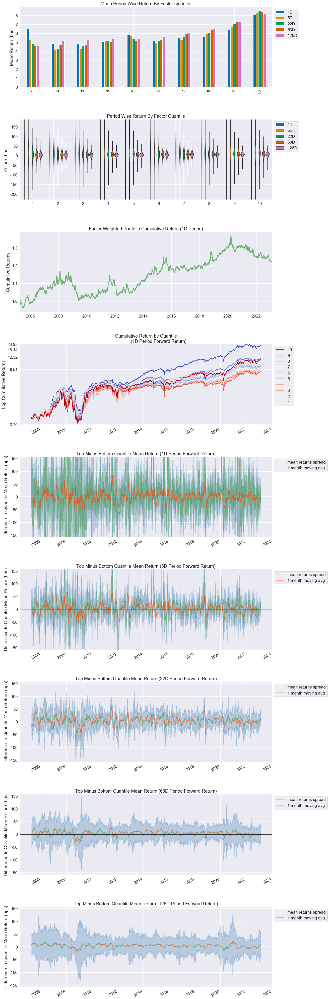

Information Analysis


,1D,5D,22D,63D,126D
IC Mean,0.004,0.013,0.032,0.055,0.068
IC Std.,0.083,0.100,0.114,0.098,0.092
Risk-Adjusted IC,0.049,0.132,0.276,0.565,0.735
t-stat(IC),3.274,8.777,18.318,37.480,48.787
p-value(IC),0.001,0.000,0.000,0.000,0.000
IC Skew,-0.013,-0.146,-0.295,-0.375,-0.664
IC Kurtosis,0.807,1.013,0.179,0.545,1.003


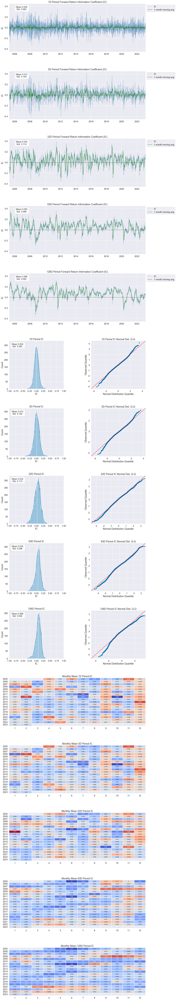

Turnover Analysis


,1D,5D,22D,63D,126D
Quantile 1 Mean Turnover,0.094,0.207,0.427,0.698,0.698
Quantile 2 Mean Turnover,0.224,0.424,0.659,0.809,0.821
Quantile 3 Mean Turnover,0.286,0.509,0.732,0.852,0.857
Quantile 4 Mean Turnover,0.318,0.549,0.765,0.875,0.878
Quantile 5 Mean Turnover,0.330,0.558,0.769,0.885,0.890
Quantile 6 Mean Turnover,0.335,0.564,0.770,0.882,0.890
Quantile 7 Mean Turnover,0.318,0.544,0.753,0.870,0.877
Quantile 8 Mean Turnover,0.280,0.498,0.719,0.847,0.856
Quantile 9 Mean Turnover,0.212,0.408,0.648,0.809,0.819
Quantile 10 Mean Turnover,0.087,0.195,0.417,0.694,0.724


,1D,5D,22D,63D,126D
Mean Factor Rank Autocorrelation,0.987,0.942,0.788,0.5,0.463


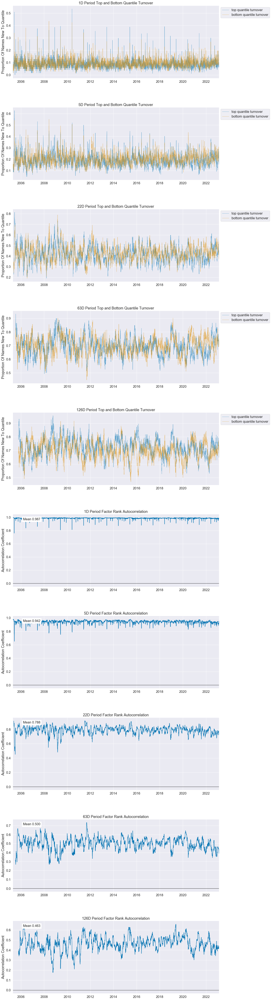

In [37]:
create_full_tear_sheet(alphalens_data,
                       long_short=False,
                       by_group=False)

## Conclusion
- 這是一個有效因子，可以進行後續回測，考慮持有期22天的ic值>0.03，且Top Quantile的mean return最高，所以**回測時換股頻率先訂為1個月**。
- 考量因子加權的累積報酬率並沒有優於單純以等權重方式做多第Top Quantile組股票的累積報酬率，故**投資策略先預設購買第9組股票，並以等權重加權**。

# 5. Portfolio Construction and Backtest

利用Alphalens分析完後確認了因子是有效的，本節就可以利用這個因子來進行回測。

## Pipeline

以下的pipeline與第3節的類似，且Pipeline將會輸出**每天因子計算結果**及**布林值的買賣訊號**用來進行後續回測及分析。

#### `compute_signals`

**具體來說，這裡的`compute_signals()`作了以下幾件事情：**
- 利用`signal`建立布林值訊號，並命名為'longs'。其中，符合條件（`top(50)`）的股票會回傳True，其餘回傳False。
- 利用`mask`參數排除在該時點非上市的股票。

In [38]:
def compute_signals():

    target = bundle.asset_finder.lookup_symbol('IR0001', as_of_date=None)
        
    rlrr_TWSE = RollingLinearRegressionOfRoi(regression_length=reg_length,
                                             allowed_missing_days=allowed_missing_days,
                                             target=target)
    
    twse_filter = (OtherDatasets.Market.latest.eq('TWSE'))

    mask = StaticAssets([symbol(i) for i in StockList]) & (twse_filter)
            
    alpha = rlrr_TWSE.alpha
    PER_zscore = OtherDatasets.PER_TEJ.latest.rank(ascending=False, method='min', mask=mask).zscore()
    alpha_zscore = alpha.rank(method='min', mask=mask).zscore()
    signal = PER_zscore+alpha_zscore
    
    longs = signal.top(50, mask=mask)
    
    return Pipeline(columns = {
            'longs':longs, 
            'twse_filter':twse_filter,
            'alpha_zscore':alpha_zscore,
            'PER_zscore':PER_zscore,
            'signal':signal}
                       )

## 5.2 initialize

- 設定再平衡日期：回測時希望**每月**調整持股，故這邊產出每月第一個交易日日期（`tradeday`），供後續回測使用。
- 目標槓桿：0.8
- 滑價：VolumeShareSlippage
  - volume_limit = 0.1（每日成交量限制10%）
  - price_impact = 0.1

In [39]:
# 交易傭金
commission_cost = 0.001425 + 0.003 / 2
# 目標槓桿
max_lev = 0.8
# 滑價
volume_limit = 0.1
price_impact = 0.1   
# 設定再平衡日期
freq = 'MS'   # QS-JUL  MS W
_tradeday = list(pd.date_range(start=algo_start_dt, end=end_dt, freq=freq))
tradeday = [get_calendar(calendar_name).next_open(pd.Timestamp(i)).strftime('%Y-%m-%d') if \
           get_calendar(calendar_name).is_session(i)==False else i.strftime('%Y-%m-%d') for i in _tradeday]
tradeday

['2005-05-03',
 '2005-06-01',
 '2005-07-01',
 '2005-08-01',
 '2005-09-02',
 '2005-10-03',
 '2005-11-01',
 '2005-12-01',
 '2006-01-02',
 '2006-02-03',
 '2006-03-01',
 '2006-04-03',
 '2006-05-02',
 '2006-06-01',
 '2006-07-03',
 '2006-08-01',
 '2006-09-01',
 '2006-10-02',
 '2006-11-01',
 '2006-12-01',
 '2007-01-02',
 '2007-02-01',
 '2007-03-01',
 '2007-04-02',
 '2007-05-02',
 '2007-06-01',
 '2007-07-02',
 '2007-08-01',
 '2007-09-03',
 '2007-10-01',
 '2007-11-01',
 '2007-12-03',
 '2008-01-02',
 '2008-02-01',
 '2008-03-03',
 '2008-04-01',
 '2008-05-02',
 '2008-06-02',
 '2008-07-01',
 '2008-08-01',
 '2008-09-01',
 '2008-10-01',
 '2008-11-03',
 '2008-12-01',
 '2009-01-05',
 '2009-02-02',
 '2009-03-02',
 '2009-04-01',
 '2009-05-04',
 '2009-06-01',
 '2009-07-01',
 '2009-08-03',
 '2009-09-01',
 '2009-10-01',
 '2009-11-02',
 '2009-12-01',
 '2010-01-04',
 '2010-02-01',
 '2010-03-01',
 '2010-04-01',
 '2010-05-03',
 '2010-06-01',
 '2010-07-01',
 '2010-08-02',
 '2010-09-01',
 '2010-10-01',
 '2010-11-

In [40]:
def initialize(context):
    """
    Called once at the start of the algorithm.
    Setup: register pipeline, schedule rebalancing, and set trading params
    """
    
    context.min_positions = 0
    context.universe = [symbol(i) for i in StockList]  
    context.trades = {}

#     再平衡日期
    context.tradeday = tradeday
    
#     交易成本    
    set_slippage(slippage.VolumeShareSlippage(volume_limit = volume_limit,
                                              price_impact = price_impact))
    set_commission(commission.PerDollar(cost=commission_cost))
    
#     benchmark  
    set_benchmark(symbol(benchmark[0]))
    
#     schedule_function
    schedule_function(func=rebalance,
                      date_rule=date_rules.every_day(),
                      time_rule=time_rules.market_open)
    
    schedule_function(func=record_vars,
                      date_rule=date_rules.every_day(),
                      time_rule=time_rules.market_close)
    
#     pipeline
    pipeline = compute_signals()
    attach_pipeline(pipeline, 'signals')

## 5.3 before_trading_start

In [41]:
def before_trading_start(context, data):
    """
    Called every day before market open.(after initialize on the first day).
    Run factor pipeline
    """
    
    output = pipeline_output('signals')
    context.output = output

## 5.4 rebalance

`rebalance()`為自創的函數，負責建立買賣策略、調整投資組合部位，並作為`schedule_function()`的參數。具體來說，這裡的`rebalance()`作了以下幾件事情：

- 月初的時候（`context.tradeday`）：
  - 先清掉取消上一個月未成交（完全成交）的單。
  - 使用Pipeline產出的結果（即`context.output['longs']`）產出欲作多的清單。
  - 生成`context.divest`變數，紀錄帳上現在有部位但在未來這期沒有要持有的股票。
  - 透過`order_target()`方法出清`context.divest`中有記錄的股票。
  - 透過`order_target_percent()`方法，並透過交易前一日的收盤價來計算所需購買的股數，且每檔股票的預期權重相等。

In [42]:
def rebalance(context, data):
    """
    Execute orders according to schedule_function() date & time rules.
    """
    
    print('Current date(rebalance)＝' + str(get_datetime().date())) 
   
    context.list_longs = []
    context.divest = []
    context.month_weights = pd.Series(data={})
    
    
#     月初再平衡
    if get_datetime().strftime('%Y-%m-%d') in context.tradeday: 
        print('Current date(trade)＝' + str(get_datetime().date())) 
        
#         取消未成交的單        
        open_orders = get_open_orders()
        for asset in open_orders:
            for i in open_orders[asset]:
                cancel_order(i)                
                log.info('Cancel_order:' + \
                         " created: " + str(i.created.strftime('%Y-%m-%d')) + \
                         " asset: " + str(i.sid) + \
                         ", amount: " + str(i.amount)+ \
                         ", filled: " + str(i.filled))         

     
    #     建立買進清單   
        context.list_longs = list(set(context.output['longs'][context.output['longs']==True].index.to_list()))   

    #     建立賣出清單      
        context.divest = list(set(context.portfolio.positions.keys()) - set(context.list_longs)) 


    #     建立策略    
        context.N = len(context.list_longs)

        if context.N > context.min_positions:       
            for i in context.divest:
                order_target(i, 0)
            for i in context.list_longs:
                order_target_percent(i, 1 / context.N * max_lev)

        else:
            print('long positions=0')
   
    #     記錄每月月初權重         
        context.month_weights = context.portfolio.current_portfolio_weights      
           
    else:
        pass

#     記錄每日權重         
    context.weights = context.portfolio.current_portfolio_weights  

## 5.5 紀錄資料

In [43]:
def record_vars(context, data):
    """
    Plot variables at the end of each day.
    """
            
    record(leverage=context.account.leverage,
           longs=context.output.longs,
           list_longs=context.list_longs,
           weights=context.weights,
           month_weights=context.month_weights,
           list_divest=context.divest,         
           twse_filter=context.output.twse_filter,
           alpha_zscore=context.output.alpha_zscore,        
           PER_zscore=context.output.PER_zscore,
           signal=context.output.signal,
           )

## 5.6 自行客製化圖表

In [44]:
def analyze(context, perf):
    
    fig = plt.figure(figsize=(16, 24), dpi=400)
    
    # First chart(累積報酬)
    ax = fig.add_subplot(811) 
    ax.set_title('Strategy Results') 
    ax.plot(perf['algorithm_period_return'], linestyle='-', 
                label='algorithm period return', linewidth=3.0)
    ax.plot(perf['benchmark_period_return'], linestyle='-', 
                label='benchmark period return', linewidth=3.0)
    ax.legend()
    ax.grid(False)
    
    # Second chart(returns)
    ax = fig.add_subplot(812, sharex=ax)       
    ax.plot(perf['returns'], linestyle='-', 
                label='returns', linewidth=3.0)
    ax.legend()
    ax.grid(False)

    # Third chart(ending_cash)->觀察是否超買
    ax = fig.add_subplot(813, sharex=ax)
    ax.plot(perf['ending_cash'], 
            label='ending_cash', linestyle='-', linewidth=3.0)
    ax.axhline(y=1,c='r',linewidth=1)
    ax.legend()
    ax.grid(False)

    # Forth chart(shorts_count)->觀察是否放空
    ax = fig.add_subplot(814, sharex=ax)
    ax.plot(perf['shorts_count'], 
            label='shorts_count', linestyle='-', linewidth=3.0)
    ax.axhline(y=0,c='r',linewidth=1)
    ax.legend()
    ax.grid(False)
    
    # Fifth chart(longs_count)
    ax = fig.add_subplot(815, sharex=ax)
    ax.plot(perf['longs_count'], 
            label='longs_count', linestyle='-', linewidth=3.0)
    ax.axhline(y=1,c='r',linewidth=1)
    ax.legend()
    ax.grid(False)    
    
    # Sixth chart(weights)->觀察每日持股權重
    ax = fig.add_subplot(816, sharex=ax)        
    weights = pd.concat([df.to_frame(d) for d, df in perf['weights'].dropna().items()],axis=1).T
    
    for i in weights.columns:
        df = weights.loc[:,i]
        ax.scatter(df.index,df.values,marker='.', s=5, c='grey', label='daily_weights')
    
    ax.legend(['daily_weights'])
    ax.grid(False)
    
    # Seventh chart(weights)->觀察月持股權重
    ax = fig.add_subplot(817, sharex=ax)        
    month_weights = pd.concat([df.to_frame(d) for d, df in perf['month_weights'].dropna().items()],axis=1).T
    
    for i in month_weights.columns:
        df = month_weights.loc[:,i]
        ax.scatter(df.index, df.values,marker='.', s=5, c='grey', label='month_weights')
        
    ax.legend(['month_weights'])
    ax.grid(False)
    fig.tight_layout()
    
    # Eighth chart(MDD)
    ax = fig.add_subplot(818, sharex=ax) 
    
    window = 252
 
    mdd = ep.stats.roll_max_drawdown(perf['returns'],
                                     window=window)
    mdd_x = mdd.sort_index().round(10).idxmin()
    mdd_y = mdd.min()

    ax.plot(mdd, 
        label='portfolio(MDD = {})'.format(round(ep.max_drawdown(perf['returns']),4)), 
        linestyle='-', 
        color='black',
        linewidth=3.0)
    
   
    benchmark_mdd = ep.stats.roll_max_drawdown(perf['benchmark_return'],
                                               window=window)
    benchmark_mdd_x = benchmark_mdd.sort_index().round(10).idxmin()
    benchmark_mdd_y = benchmark_mdd.min()

    ax.plot(benchmark_mdd, 
        label='benchmark(MDD = {})'.format(round(ep.max_drawdown(perf['benchmark_return']),4)), 
        linestyle='-.', 
        color='gray',
        linewidth=3.0)
      
    ax.set_title(label='{} days max drawdown'.format(window))
    ax.legend()
    ax.grid(False)

## 5.7 Treasury

In [45]:
# 以下使用第一銀行(5844)一年期定存利率作為無風險利率。
treasury_returns = get_Treasury_Return(start = algo_start_dt,
                                      end = end,
                                      rate_type = 'Time_Deposit_Rate',                     
                                      term = '1y',
                                      symbol = '5844')
treasury_returns

mdate
2005-04-13 00:00:00+00:00    0.000067
2005-04-14 00:00:00+00:00    0.000067
2005-04-15 00:00:00+00:00    0.000067
2005-04-18 00:00:00+00:00    0.000067
2005-04-19 00:00:00+00:00    0.000067
                               ...   
2023-08-21 00:00:00+00:00    0.000062
2023-08-22 00:00:00+00:00    0.000062
2023-08-23 00:00:00+00:00    0.000062
2023-08-24 00:00:00+00:00    0.000062
2023-08-25 00:00:00+00:00    0.000062
Length: 4530, dtype: float64

## 5.8 Backtesting

In [46]:
algo_start_dt = pd.Timestamp(tradeday[0], tz='UTC')
end = algo_end_dt

print('\n reg_length =', reg_length,
      '\n allowed_missing_days =', allowed_missing_days,
      '\n freq =',freq,
      '\n start =',algo_start_dt,
      '\n end =',algo_end_dt,
      '\n max_lev =',max_lev,
      '\n commission_cost',commission_cost,
      '\n volume_limit',volume_limit,
      '\n price_impact',price_impact,
      '\n universe',StockList)


 reg_length = 63 
 allowed_missing_days = 3 
 freq = MS 
 start = 2005-05-03 00:00:00+00:00 
 end = 2023-08-25 00:00:00+00:00 
 max_lev = 0.8 
 commission_cost 0.002925 
 volume_limit 0.1 
 price_impact 0.1 
 universe ['1101', '1102', '1103', '1104', '1107', '1108', '1109', '1110', '1201', '1203', '1204', '1207', '1210', '1212', '1213', '1215', '1216', '1217', '1218', '1219', '1220', '1225', '1227', '1229', '1231', '1232', '1233', '1234', '1235', '1236', '1256', '1262', '1301', '1303', '1304', '1305', '1306', '1307', '1308', '1309', '1310', '1311', '1312', '1313', '1314', '1315', '1316', '1319', '1321', '1323', '1324', '1325', '1326', '1337', '1338', '1339', '1340', '1341', '1342', '1402', '1408', '1409', '1410', '1413', '1414', '1416', '1417', '1418', '1419', '1423', '1432', '1434', '1435', '1436', '1437', '1438', '1439', '1440', '1441', '1442', '1443', '1444', '1445', '1446', '1447', '1449', '1450', '1451', '1452', '1453', '1454', '1455', '1456', '1457', '1459', '1460', '1462', '146

In [47]:
start_t = time()
results = run_algorithm(start=algo_start_dt,            
                        end=end,                          
                        initialize=initialize,
                        before_trading_start=before_trading_start,
                        analyze=analyze,
                        capital_base=1e7,
                        data_frequency='daily',
                        bundle=bundle_name,
                        treasury_returns=treasury_returns,
                        trading_calendar=get_calendar(calendar_name),
                        custom_loader=custom_loader)


print('Duration: {:.2f}s'.format(time() - start_t))

Current date(rebalance)＝2005-05-03
Current date(trade)＝2005-05-03
Current date(rebalance)＝2005-05-04
Current date(rebalance)＝2005-05-05
Current date(rebalance)＝2005-05-06
Current date(rebalance)＝2005-05-09
Current date(rebalance)＝2005-05-10
Current date(rebalance)＝2005-05-11
Current date(rebalance)＝2005-05-12
Current date(rebalance)＝2005-05-13
Current date(rebalance)＝2005-05-16
Current date(rebalance)＝2005-05-17
Current date(rebalance)＝2005-05-18
Current date(rebalance)＝2005-05-19
Current date(rebalance)＝2005-05-20
Current date(rebalance)＝2005-05-23
Current date(rebalance)＝2005-05-24
Current date(rebalance)＝2005-05-25
Current date(rebalance)＝2005-05-26
Current date(rebalance)＝2005-05-27
Current date(rebalance)＝2005-05-30
Current date(rebalance)＝2005-05-31
Current date(rebalance)＝2005-06-01
Current date(trade)＝2005-06-01


[2023-08-31 03:26:10.695831]: INFO: earn_dividends: Equity(616 [3023]), cash_dividend amount: 0.55, pay_date: 2005-07-22, div_owed: 2413.9500000000003
[2023-08-31 03:26:10.696830]: INFO: handle_split: after split: asset: Equity(616 [3023]), amount: 5508, cost_basis: 26.66, last_sale_price: 37.300000000000004
[2023-08-31 03:26:10.697830]: INFO: handle_split: returning cash: 19.61


Current date(rebalance)＝2005-06-02
Current date(rebalance)＝2005-06-03
Current date(rebalance)＝2005-06-06
Current date(rebalance)＝2005-06-07
Current date(rebalance)＝2005-06-08
Current date(rebalance)＝2005-06-09
Current date(rebalance)＝2005-06-10
Current date(rebalance)＝2005-06-13
Current date(rebalance)＝2005-06-14


[2023-08-31 03:26:11.088831]: INFO: handle_split: after split: asset: Equity(674 [3271]), amount: 5135, cost_basis: 28.48, last_sale_price: 38.4
[2023-08-31 03:26:11.088831]: INFO: handle_split: returning cash: 2.25
[2023-08-31 03:26:11.139830]: INFO: earn_dividends: Equity(641 [3048]), cash_dividend amount: 2.1, pay_date: 2005-07-22, div_owed: 13141.800000000001


Current date(rebalance)＝2005-06-15
Current date(rebalance)＝2005-06-16
Current date(rebalance)＝2005-06-17
Current date(rebalance)＝2005-06-20
Current date(rebalance)＝2005-06-21


[2023-08-31 03:26:11.390830]: INFO: earn_dividends: Equity(1065 [8249]), cash_dividend amount: 2.2, pay_date: 2005-08-12, div_owed: 7541.6
[2023-08-31 03:26:11.391830]: INFO: handle_split: after split: asset: Equity(1065 [8249]), amount: 3816, cost_basis: 42.39, last_sale_price: 59.4
[2023-08-31 03:26:11.392830]: INFO: handle_split: returning cash: 12.82


Current date(rebalance)＝2005-06-22
Current date(rebalance)＝2005-06-23
Current date(rebalance)＝2005-06-24
Current date(rebalance)＝2005-06-27
Current date(rebalance)＝2005-06-28


[2023-08-31 03:26:11.637830]: INFO: earn_dividends: Equity(951 [6289]), cash_dividend amount: 1.4844, pay_date: 2005-07-18, div_owed: 10135.483199999999
[2023-08-31 03:26:11.639830]: INFO: handle_split: after split: asset: Equity(951 [6289]), amount: 7206, cost_basis: 21.79, last_sale_price: 26.05
[2023-08-31 03:26:11.639830]: INFO: handle_split: returning cash: 11.28
[2023-08-31 03:26:11.688830]: INFO: earn_dividends: Equity(331 [2360]), cash_dividend amount: 1.708772, pay_date: 2005-07-29, div_owed: 10080.046027999999
[2023-08-31 03:26:11.690830]: INFO: handle_split: after split: asset: Equity(331 [2360]), amount: 6050, cost_basis: 26.11, last_sale_price: 28.900000000000002
[2023-08-31 03:26:11.690830]: INFO: handle_split: returning cash: 8.32


Current date(rebalance)＝2005-06-29
Current date(rebalance)＝2005-06-30
Current date(rebalance)＝2005-07-01
Current date(trade)＝2005-07-01


[2023-08-31 03:26:11.941830]: INFO: earn_dividends: Equity(270 [2207]), cash_dividend amount: 4.0, pay_date: 2005-08-10, div_owed: 9020.0
[2023-08-31 03:26:11.998830]: INFO: earn_dividends: Equity(1130 [9941]), cash_dividend amount: 2.7, pay_date: 2005-08-09, div_owed: 14139.900000000001
[2023-08-31 03:26:12.053830]: INFO: earn_dividends: Equity(173 [1704]), cash_dividend amount: 1.2, pay_date: 2005-08-05, div_owed: 11566.8
[2023-08-31 03:26:12.054830]: INFO: earn_dividends: Equity(258 [2103]), cash_dividend amount: 1.65, pay_date: 2005-08-24, div_owed: 16602.3
[2023-08-31 03:26:12.054830]: INFO: earn_dividends: Equity(542 [2820]), cash_dividend amount: 1.05, pay_date: 2005-08-03, div_owed: 15987.300000000001


Current date(rebalance)＝2005-07-04
Current date(rebalance)＝2005-07-05
Current date(rebalance)＝2005-07-06
Current date(rebalance)＝2005-07-07


[2023-08-31 03:26:12.174830]: INFO: earn_dividends: Equity(166 [1615]), cash_dividend amount: 0.32, pay_date: 2005-08-10, div_owed: 5516.8
[2023-08-31 03:26:12.233830]: INFO: earn_dividends: Equity(322 [2351]), cash_dividend amount: 0.8, pay_date: 2005-09-01, div_owed: 10753.6


Current date(rebalance)＝2005-07-08
Current date(rebalance)＝2005-07-11
Current date(rebalance)＝2005-07-12
Current date(rebalance)＝2005-07-13


[2023-08-31 03:26:12.350834]: INFO: earn_dividends: Equity(97 [1463]), cash_dividend amount: 0.5, pay_date: 2005-08-18, div_owed: 11768.5
[2023-08-31 03:26:12.404830]: INFO: earn_dividends: Equity(397 [2430]), cash_dividend amount: 2.4, pay_date: 2005-08-15, div_owed: 9727.199999999999
[2023-08-31 03:26:12.455830]: INFO: earn_dividends: Equity(415 [2449]), cash_dividend amount: 0.984, pay_date: 2005-08-31, div_owed: 5888.256
[2023-08-31 03:26:12.457830]: INFO: handle_split: after split: asset: Equity(415 [2449]), amount: 6926, cost_basis: 20.44, last_sale_price: 30.6
[2023-08-31 03:26:12.457830]: INFO: handle_split: returning cash: 15.26
[2023-08-31 03:26:12.513830]: INFO: earn_dividends: Equity(611 [3018]), cash_dividend amount: 0.8, pay_date: 2005-08-10, div_owed: 9592.0


Current date(rebalance)＝2005-07-14
Current date(rebalance)＝2005-07-15
Current date(rebalance)＝2005-07-19
Current date(rebalance)＝2005-07-20


[2023-08-31 03:26:12.566831]: INFO: earn_dividends: Equity(246 [2030]), cash_dividend amount: 0.5, pay_date: 2005-08-19, div_owed: 4217.0
[2023-08-31 03:26:12.567830]: INFO: earn_dividends: Equity(603 [3010]), cash_dividend amount: 3.0, pay_date: 2005-08-30, div_owed: 10785.0
[2023-08-31 03:26:12.568831]: INFO: handle_split: after split: asset: Equity(246 [2030]), amount: 9957, cost_basis: 17.33, last_sale_price: 19.85
[2023-08-31 03:26:12.568831]: INFO: handle_split: returning cash: 2.79
[2023-08-31 03:26:12.569831]: INFO: handle_split: after split: asset: Equity(603 [3010]), amount: 3852, cost_basis: 46.75, last_sale_price: 60.0
[2023-08-31 03:26:12.569831]: INFO: handle_split: returning cash: 23.81
[2023-08-31 03:26:12.625832]: INFO: earn_dividends: Equity(684 [3356]), cash_dividend amount: 3.3, pay_date: 2005-09-20, div_owed: 5649.599999999999
[2023-08-31 03:26:12.627831]: INFO: handle_split: after split: asset: Equity(684 [3356]), amount: 2157, cost_basis: 83.16, last_sale_price: 

Current date(rebalance)＝2005-07-21
Current date(rebalance)＝2005-07-22
Current date(rebalance)＝2005-07-25
Current date(rebalance)＝2005-07-26


[2023-08-31 03:26:12.782831]: INFO: earn_dividends: Equity(111 [1477]), cash_dividend amount: 3.0982, pay_date: 2005-08-12, div_owed: 12324.639599999999
[2023-08-31 03:26:12.782831]: INFO: earn_dividends: Equity(1120 [9930]), cash_dividend amount: 2.0, pay_date: 2005-08-25, div_owed: 13134.0
[2023-08-31 03:26:12.783831]: INFO: handle_split: after split: asset: Equity(111 [1477]), amount: 4177, cost_basis: 41.26, last_sale_price: 44.550000000000004
[2023-08-31 03:26:12.783831]: INFO: handle_split: returning cash: 22.95
[2023-08-31 03:26:12.784831]: INFO: handle_split: after split: asset: Equity(1120 [9930]), amount: 6849, cost_basis: 24.9, last_sale_price: 27.2
[2023-08-31 03:26:12.784831]: INFO: handle_split: returning cash: 17.12


Current date(rebalance)＝2005-07-27
Current date(rebalance)＝2005-07-28
Current date(rebalance)＝2005-07-29
Current date(rebalance)＝2005-08-01
Current date(trade)＝2005-08-01


[2023-08-31 03:26:13.024833]: INFO: earn_dividends: Equity(339 [2368]), cash_dividend amount: 0.4854206, pay_date: 2005-08-29, div_owed: 5286.230334
[2023-08-31 03:26:13.024833]: INFO: earn_dividends: Equity(586 [2911]), cash_dividend amount: 0.199999, pay_date: 2005-09-09, div_owed: 2177.789111
[2023-08-31 03:26:13.026832]: INFO: handle_split: after split: asset: Equity(339 [2368]), amount: 11418, cost_basis: 13.97, last_sale_price: 16.05
[2023-08-31 03:26:13.026832]: INFO: handle_split: returning cash: 4.84
[2023-08-31 03:26:13.026832]: INFO: handle_split: after split: asset: Equity(397 [2430]), amount: 4424, cost_basis: 40.42, last_sale_price: 49.2
[2023-08-31 03:26:13.027832]: INFO: handle_split: returning cash: 16.12
[2023-08-31 03:26:13.027832]: INFO: handle_split: after split: asset: Equity(586 [2911]), amount: 11327, cost_basis: 15.14, last_sale_price: 16.2
[2023-08-31 03:26:13.027832]: INFO: handle_split: returning cash: 14.46
[2023-08-31 03:26:13.173831]: INFO: earn_dividends

Current date(rebalance)＝2005-08-02
Current date(rebalance)＝2005-08-03
Current date(rebalance)＝2005-08-04
Current date(rebalance)＝2005-08-08


[2023-08-31 03:26:13.464831]: INFO: handle_split: after split: asset: Equity(110 [1476]), amount: 11749, cost_basis: 15.13, last_sale_price: 17.85
[2023-08-31 03:26:13.465831]: INFO: handle_split: returning cash: 0.91
[2023-08-31 03:26:13.565831]: INFO: earn_dividends: Equity(621 [3028]), cash_dividend amount: 0.999218, pay_date: 2005-09-12, div_owed: 9724.389576000001


Current date(rebalance)＝2005-08-09
Current date(rebalance)＝2005-08-10
Current date(rebalance)＝2005-08-11
Current date(rebalance)＝2005-08-12


[2023-08-31 03:26:13.566831]: INFO: handle_split: after split: asset: Equity(621 [3028]), amount: 10273, cost_basis: 17.2, last_sale_price: 19.6
[2023-08-31 03:26:13.566831]: INFO: handle_split: returning cash: 4.87
[2023-08-31 03:26:13.673832]: INFO: earn_dividends: Equity(191 [1725]), cash_dividend amount: 0.3, pay_date: 2005-09-15, div_owed: 2676.0
[2023-08-31 03:26:13.675832]: INFO: handle_split: after split: asset: Equity(191 [1725]), amount: 10563, cost_basis: 16.14, last_sale_price: 21.0
[2023-08-31 03:26:13.675832]: INFO: handle_split: returning cash: 2.61
[2023-08-31 03:26:13.727831]: INFO: earn_dividends: Equity(59 [1402]), cash_dividend amount: 1.0, pay_date: 2005-09-23, div_owed: 6815.0
[2023-08-31 03:26:13.728831]: INFO: earn_dividends: Equity(648 [3055]), cash_dividend amount: 2.49774, pay_date: 2005-10-18, div_owed: 10757.766179999999
[2023-08-31 03:26:13.728831]: INFO: earn_dividends: Equity(1107 [9914]), cash_dividend amount: 0.599999, pay_date: 2005-09-26, div_owed: 5

Current date(rebalance)＝2005-08-15
Current date(rebalance)＝2005-08-16
Current date(rebalance)＝2005-08-17
Current date(rebalance)＝2005-08-18


[2023-08-31 03:26:13.784831]: INFO: earn_dividends: Equity(458 [2493]), cash_dividend amount: 0.3, pay_date: 2005-09-14, div_owed: 3155.4
[2023-08-31 03:26:13.785831]: INFO: handle_split: after split: asset: Equity(458 [2493]), amount: 11071, cost_basis: 13.78, last_sale_price: 15.9
[2023-08-31 03:26:13.785831]: INFO: handle_split: returning cash: 7.86
[2023-08-31 03:26:13.944833]: INFO: earn_dividends: Equity(314 [2342]), cash_dividend amount: 1.0, pay_date: 2005-10-14, div_owed: 15121.0
[2023-08-31 03:26:13.944833]: INFO: earn_dividends: Equity(413 [2447]), cash_dividend amount: 1.10202, pay_date: 2005-10-17, div_owed: 6847.95228
[2023-08-31 03:26:13.945832]: INFO: handle_split: after split: asset: Equity(344 [2374]), amount: 9068, cost_basis: 19.01, last_sale_price: 18.400000000000002
[2023-08-31 03:26:13.945832]: INFO: handle_split: returning cash: 9.51
[2023-08-31 03:26:13.946832]: INFO: handle_split: after split: asset: Equity(413 [2447]), amount: 6439, cost_basis: 26.14, last_sa

Current date(rebalance)＝2005-08-19
Current date(rebalance)＝2005-08-22
Current date(rebalance)＝2005-08-23
Current date(rebalance)＝2005-08-24


[2023-08-31 03:26:14.005831]: INFO: earn_dividends: Equity(408 [2441]), cash_dividend amount: 2.0860669, pay_date: 2005-10-06, div_owed: 9545.8421344
[2023-08-31 03:26:14.007832]: INFO: handle_split: after split: asset: Equity(408 [2441]), amount: 5073, cost_basis: 27.31, last_sale_price: 34.5
[2023-08-31 03:26:14.007832]: INFO: handle_split: returning cash: 22.87
[2023-08-31 03:26:14.113832]: INFO: earn_dividends: Equity(12 [1210]), cash_dividend amount: 0.30575184, pay_date: 2005-09-23, div_owed: 5359.21825152


Current date(rebalance)＝2005-08-25
Current date(rebalance)＝2005-08-26
Current date(rebalance)＝2005-08-29
Current date(rebalance)＝2005-08-30
Current date(rebalance)＝2005-08-31
Current date(rebalance)＝2005-09-02
Current date(trade)＝2005-09-02
Current date(rebalance)＝2005-09-05
Current date(rebalance)＝2005-09-06
Current date(rebalance)＝2005-09-07
Current date(rebalance)＝2005-09-08
Current date(rebalance)＝2005-09-09


[2023-08-31 03:26:14.858832]: INFO: handle_split: after split: asset: Equity(353 [2383]), amount: 20889, cost_basis: 8.93, last_sale_price: 8.620000000000001
[2023-08-31 03:26:14.859832]: INFO: handle_split: returning cash: 7.47


Current date(rebalance)＝2005-09-12
Current date(rebalance)＝2005-09-13
Current date(rebalance)＝2005-09-14
Current date(rebalance)＝2005-09-15
Current date(rebalance)＝2005-09-16
Current date(rebalance)＝2005-09-19
Current date(rebalance)＝2005-09-20
Current date(rebalance)＝2005-09-21
Current date(rebalance)＝2005-09-22
Current date(rebalance)＝2005-09-23
Current date(rebalance)＝2005-09-26
Current date(rebalance)＝2005-09-27
Current date(rebalance)＝2005-09-28
Current date(rebalance)＝2005-09-29


[2023-08-31 03:26:15.458832]: INFO: rebalance: Cancel_order: created: 2005-09-02 asset: Equity(581 [2904]), amount: 74000, filled: 64300
[2023-08-31 03:26:15.459832]: INFO: rebalance: Cancel_order: created: 2005-09-02 asset: Equity(216 [1808]), amount: 14263, filled: 6400


Current date(rebalance)＝2005-09-30
Current date(rebalance)＝2005-10-03
Current date(trade)＝2005-10-03
Current date(rebalance)＝2005-10-04


[2023-08-31 03:26:15.664832]: INFO: earn_dividends: Equity(490 [2542]), cash_dividend amount: 0.1, pay_date: 2005-10-31, div_owed: 769.0
[2023-08-31 03:26:15.666832]: INFO: handle_split: after split: asset: Equity(490 [2542]), amount: 8781, cost_basis: 20.02, last_sale_price: 22.7
[2023-08-31 03:26:15.666832]: INFO: handle_split: returning cash: 18.09


Current date(rebalance)＝2005-10-05
Current date(rebalance)＝2005-10-06
Current date(rebalance)＝2005-10-07
Current date(rebalance)＝2005-10-11
Current date(rebalance)＝2005-10-12
Current date(rebalance)＝2005-10-13
Current date(rebalance)＝2005-10-14
Current date(rebalance)＝2005-10-17
Current date(rebalance)＝2005-10-18
Current date(rebalance)＝2005-10-19
Current date(rebalance)＝2005-10-20
Current date(rebalance)＝2005-10-21
Current date(rebalance)＝2005-10-24
Current date(rebalance)＝2005-10-25
Current date(rebalance)＝2005-10-26
Current date(rebalance)＝2005-10-27
Current date(rebalance)＝2005-10-28


[2023-08-31 03:26:16.621833]: INFO: rebalance: Cancel_order: created: 2005-10-03 asset: Equity(581 [2904]), amount: -64300, filled: -38700
[2023-08-31 03:26:16.622833]: INFO: rebalance: Cancel_order: created: 2005-10-03 asset: Equity(216 [1808]), amount: 8716, filled: 6200


Current date(rebalance)＝2005-10-31
Current date(rebalance)＝2005-11-01
Current date(trade)＝2005-11-01
Current date(rebalance)＝2005-11-02
Current date(rebalance)＝2005-11-03
Current date(rebalance)＝2005-11-04
Current date(rebalance)＝2005-11-07
Current date(rebalance)＝2005-11-08
Current date(rebalance)＝2005-11-09
Current date(rebalance)＝2005-11-10
Current date(rebalance)＝2005-11-11
Current date(rebalance)＝2005-11-14
Current date(rebalance)＝2005-11-15
Current date(rebalance)＝2005-11-16


[2023-08-31 03:26:23.190836]: INFO: handle_split: after split: asset: Equity(110 [1476]), amount: 10692, cost_basis: 14.66, last_sale_price: 16.9
[2023-08-31 03:26:23.191836]: INFO: handle_split: returning cash: 4.84


Current date(rebalance)＝2005-11-17
Current date(rebalance)＝2005-11-18
Current date(rebalance)＝2005-11-21
Current date(rebalance)＝2005-11-22
Current date(rebalance)＝2005-11-23
Current date(rebalance)＝2005-11-24
Current date(rebalance)＝2005-11-25
Current date(rebalance)＝2005-11-28
Current date(rebalance)＝2005-11-29
Current date(rebalance)＝2005-11-30
Current date(rebalance)＝2005-12-01
Current date(trade)＝2005-12-01
Current date(rebalance)＝2005-12-02
Current date(rebalance)＝2005-12-05
Current date(rebalance)＝2005-12-06
Current date(rebalance)＝2005-12-07
Current date(rebalance)＝2005-12-08
Current date(rebalance)＝2005-12-09


[2023-08-31 03:26:24.083837]: INFO: handle_split: after split: asset: Equity(1065 [8249]), amount: 3045, cost_basis: 49.22, last_sale_price: 58.0
[2023-08-31 03:26:24.084837]: INFO: handle_split: returning cash: 46.87


Current date(rebalance)＝2005-12-12
Current date(rebalance)＝2005-12-13
Current date(rebalance)＝2005-12-14
Current date(rebalance)＝2005-12-15
Current date(rebalance)＝2005-12-16


[2023-08-31 03:26:24.479837]: INFO: earn_dividends: Equity(22 [1227]), cash_dividend amount: 1.1, pay_date: 2006-01-25, div_owed: 13335.300000000001


Current date(rebalance)＝2005-12-19
Current date(rebalance)＝2005-12-20
Current date(rebalance)＝2005-12-21
Current date(rebalance)＝2005-12-22
Current date(rebalance)＝2005-12-23
Current date(rebalance)＝2005-12-26
Current date(rebalance)＝2005-12-27
Current date(rebalance)＝2005-12-28
Current date(rebalance)＝2005-12-29
Current date(rebalance)＝2005-12-30
Current date(rebalance)＝2006-01-02
Current date(trade)＝2006-01-02
Current date(rebalance)＝2006-01-03
Current date(rebalance)＝2006-01-04
Current date(rebalance)＝2006-01-05
Current date(rebalance)＝2006-01-06
Current date(rebalance)＝2006-01-09
Current date(rebalance)＝2006-01-10
Current date(rebalance)＝2006-01-11
Current date(rebalance)＝2006-01-12
Current date(rebalance)＝2006-01-13
Current date(rebalance)＝2006-01-16
Current date(rebalance)＝2006-01-17
Current date(rebalance)＝2006-01-18
Current date(rebalance)＝2006-01-19
Current date(rebalance)＝2006-01-20
Current date(rebalance)＝2006-01-23
Current date(rebalance)＝2006-01-24
Current date(rebalance)＝

[2023-08-31 03:26:35.715843]: INFO: earn_dividends: Equity(165 [1614]), cash_dividend amount: 1.5, pay_date: 2006-07-05, div_owed: 13605.0


Current date(rebalance)＝2006-05-19
Current date(rebalance)＝2006-05-22
Current date(rebalance)＝2006-05-23
Current date(rebalance)＝2006-05-24
Current date(rebalance)＝2006-05-25
Current date(rebalance)＝2006-05-26
Current date(rebalance)＝2006-05-29
Current date(rebalance)＝2006-05-30
Current date(rebalance)＝2006-06-01
Current date(trade)＝2006-06-01
Current date(rebalance)＝2006-06-02
Current date(rebalance)＝2006-06-05
Current date(rebalance)＝2006-06-06
Current date(rebalance)＝2006-06-07
Current date(rebalance)＝2006-06-08
Current date(rebalance)＝2006-06-09
Current date(rebalance)＝2006-06-12
Current date(rebalance)＝2006-06-13
Current date(rebalance)＝2006-06-14


[2023-08-31 03:26:36.686844]: INFO: earn_dividends: Equity(236 [2015]), cash_dividend amount: 2.75, pay_date: 2006-07-17, div_owed: 19195.0


Current date(rebalance)＝2006-06-15
Current date(rebalance)＝2006-06-16
Current date(rebalance)＝2006-06-19
Current date(rebalance)＝2006-06-20
Current date(rebalance)＝2006-06-21
Current date(rebalance)＝2006-06-22
Current date(rebalance)＝2006-06-23
Current date(rebalance)＝2006-06-26
Current date(rebalance)＝2006-06-27


[2023-08-31 03:26:36.919844]: INFO: earn_dividends: Equity(269 [2206]), cash_dividend amount: 1.0, pay_date: 2006-07-18, div_owed: 13099.0
[2023-08-31 03:26:36.965844]: INFO: earn_dividends: Equity(547 [2832]), cash_dividend amount: 1.35, pay_date: 2006-07-18, div_owed: 15736.95
[2023-08-31 03:26:37.066844]: INFO: rebalance: Cancel_order: created: 2006-06-01 asset: Equity(581 [2904]), amount: 90884, filled: 65400


Current date(rebalance)＝2006-06-28
Current date(rebalance)＝2006-06-29
Current date(rebalance)＝2006-06-30
Current date(rebalance)＝2006-07-03
Current date(trade)＝2006-07-03


[2023-08-31 03:26:37.148844]: INFO: earn_dividends: Equity(256 [2101]), cash_dividend amount: 1.0, pay_date: 2006-08-16, div_owed: 3563.0
[2023-08-31 03:26:37.150844]: INFO: handle_split: after split: asset: Equity(256 [2101]), amount: 4989, cost_basis: 29.64, last_sale_price: 60.4
[2023-08-31 03:26:37.150844]: INFO: handle_split: returning cash: 6.46


Current date(rebalance)＝2006-07-04
Current date(rebalance)＝2006-07-05
Current date(rebalance)＝2006-07-06
Current date(rebalance)＝2006-07-07


[2023-08-31 03:26:37.508845]: INFO: earn_dividends: Equity(258 [2103]), cash_dividend amount: 2.0, pay_date: 2006-08-24, div_owed: 18452.0
[2023-08-31 03:26:37.508845]: INFO: earn_dividends: Equity(322 [2351]), cash_dividend amount: 1.0, pay_date: 2006-08-25, div_owed: 10638.0
[2023-08-31 03:26:37.510844]: INFO: handle_split: after split: asset: Equity(258 [2103]), amount: 9832, cost_basis: 16.29, last_sale_price: 24.2
[2023-08-31 03:26:37.510844]: INFO: handle_split: returning cash: 12.97
[2023-08-31 03:26:37.613844]: INFO: earn_dividends: Equity(228 [2006]), cash_dividend amount: 2.5863, pay_date: 2006-08-15, div_owed: 19492.9431


Current date(rebalance)＝2006-07-10
Current date(rebalance)＝2006-07-11
Current date(rebalance)＝2006-07-12
Current date(rebalance)＝2006-07-13


[2023-08-31 03:26:37.826844]: INFO: earn_dividends: Equity(101 [1467]), cash_dividend amount: 1.08818, pay_date: 2006-08-21, div_owed: 20857.14606
[2023-08-31 03:26:37.827844]: INFO: earn_dividends: Equity(142 [1540]), cash_dividend amount: 1.5, pay_date: 2006-08-23, div_owed: 15657.0
[2023-08-31 03:26:37.827844]: INFO: earn_dividends: Equity(257 [2102]), cash_dividend amount: 0.6, pay_date: 2006-09-06, div_owed: 5701.2
[2023-08-31 03:26:37.829845]: INFO: handle_split: after split: asset: Equity(257 [2102]), amount: 9886, cost_basis: 21.74, last_sale_price: 19.1
[2023-08-31 03:26:37.829845]: INFO: handle_split: returning cash: 17.19


Current date(rebalance)＝2006-07-14
Current date(rebalance)＝2006-07-17
Current date(rebalance)＝2006-07-18
Current date(rebalance)＝2006-07-19


[2023-08-31 03:26:37.988844]: INFO: earn_dividends: Equity(496 [2548]), cash_dividend amount: 3.6, pay_date: 2006-08-24, div_owed: 10846.800000000001
[2023-08-31 03:26:37.989844]: INFO: earn_dividends: Equity(501 [2606]), cash_dividend amount: 5.0, pay_date: 2006-08-25, div_owed: 29530.0
[2023-08-31 03:26:37.990844]: INFO: handle_split: after split: asset: Equity(496 [2548]), amount: 3339, cost_basis: 33.68, last_sale_price: 72.0
[2023-08-31 03:26:37.991844]: INFO: handle_split: returning cash: 3.41
[2023-08-31 03:26:38.041844]: INFO: earn_dividends: Equity(483 [2534]), cash_dividend amount: 0.52, pay_date: 2006-08-18, div_owed: 4578.6


Current date(rebalance)＝2006-07-20
Current date(rebalance)＝2006-07-21
Current date(rebalance)＝2006-07-24
Current date(rebalance)＝2006-07-25
Current date(rebalance)＝2006-07-26


[2023-08-31 03:26:38.153845]: INFO: earn_dividends: Equity(48 [1321]), cash_dividend amount: 0.6, pay_date: 2006-09-08, div_owed: 6805.8
[2023-08-31 03:26:38.154845]: INFO: handle_split: after split: asset: Equity(48 [1321]), amount: 11799, cost_basis: 18.8, last_sale_price: 17.150000000000002
[2023-08-31 03:26:38.155845]: INFO: handle_split: returning cash: 5.46
[2023-08-31 03:26:38.260846]: INFO: earn_dividends: Equity(507 [2612]), cash_dividend amount: 1.0, pay_date: 2006-08-24, div_owed: 8114.0
[2023-08-31 03:26:38.262845]: INFO: handle_split: after split: asset: Equity(507 [2612]), amount: 8925, cost_basis: 26.71, last_sale_price: 27.5
[2023-08-31 03:26:38.262845]: INFO: handle_split: returning cash: 19.72
[2023-08-31 03:26:38.319846]: INFO: rebalance: Cancel_order: created: 2006-07-03 asset: Equity(141 [1539]), amount: 36152, filled: 26300


Current date(rebalance)＝2006-07-27
Current date(rebalance)＝2006-07-28
Current date(rebalance)＝2006-07-31
Current date(rebalance)＝2006-08-01
Current date(trade)＝2006-08-01


[2023-08-31 03:26:38.403845]: INFO: earn_dividends: Equity(99 [1465]), cash_dividend amount: 0.8, pay_date: 2006-09-06, div_owed: 18742.4
[2023-08-31 03:26:38.590845]: INFO: handle_split: after split: asset: Equity(487 [2538]), amount: 15776, cost_basis: 8.77, last_sale_price: 15.75
[2023-08-31 03:26:38.591845]: INFO: handle_split: returning cash: 3.6


Current date(rebalance)＝2006-08-02
Current date(rebalance)＝2006-08-03
Current date(rebalance)＝2006-08-04
Current date(rebalance)＝2006-08-07


[2023-08-31 03:26:38.768847]: INFO: earn_dividends: Equity(512 [2617]), cash_dividend amount: 1.96, pay_date: 2006-09-05, div_owed: 20293.84
[2023-08-31 03:26:38.769845]: INFO: earn_dividends: Equity(626 [3033]), cash_dividend amount: 1.1759, pay_date: 2006-08-25, div_owed: 12809.0787
[2023-08-31 03:26:38.770849]: INFO: handle_split: after split: asset: Equity(512 [2617]), amount: 11229, cost_basis: 17.35, last_sale_price: 22.35
[2023-08-31 03:26:38.770849]: INFO: handle_split: returning cash: 11.78
[2023-08-31 03:26:38.771845]: INFO: handle_split: after split: asset: Equity(626 [3033]), amount: 12016, cost_basis: 17.37, last_sale_price: 20.75
[2023-08-31 03:26:38.771845]: INFO: handle_split: returning cash: 11.91
[2023-08-31 03:26:38.825846]: INFO: earn_dividends: Equity(1120 [9930]), cash_dividend amount: 2.69, pay_date: 2006-09-01, div_owed: 20621.54
[2023-08-31 03:26:38.826846]: INFO: handle_split: after split: asset: Equity(367 [2399]), amount: 14894, cost_basis: 14.96, last_sale_

Current date(rebalance)＝2006-08-08
Current date(rebalance)＝2006-08-09
Current date(rebalance)＝2006-08-10
Current date(rebalance)＝2006-08-11


[2023-08-31 03:26:38.937845]: INFO: earn_dividends: Equity(499 [2603]), cash_dividend amount: 1.8, pay_date: 2006-09-20, div_owed: 17758.8
[2023-08-31 03:26:38.938845]: INFO: handle_split: after split: asset: Equity(499 [2603]), amount: 10559, cost_basis: 21.45, last_sale_price: 22.2
[2023-08-31 03:26:38.938845]: INFO: handle_split: returning cash: 13.35
[2023-08-31 03:26:39.143845]: INFO: earn_dividends: Equity(500 [2605]), cash_dividend amount: 3.2, pay_date: 2006-09-15, div_owed: 18579.2


Current date(rebalance)＝2006-08-14
Current date(rebalance)＝2006-08-15
Current date(rebalance)＝2006-08-16
Current date(rebalance)＝2006-08-17


[2023-08-31 03:26:39.145845]: INFO: handle_split: after split: asset: Equity(500 [2605]), amount: 6968, cost_basis: 27.15, last_sale_price: 43.65
[2023-08-31 03:26:39.145845]: INFO: handle_split: returning cash: 25.24
[2023-08-31 03:26:39.209847]: INFO: earn_dividends: Equity(493 [2545]), cash_dividend amount: 3.0, pay_date: 2006-09-18, div_owed: 9441.0
[2023-08-31 03:26:39.210846]: INFO: handle_split: after split: asset: Equity(493 [2545]), amount: 3461, cost_basis: 23.28, last_sale_price: 71.5
[2023-08-31 03:26:39.211846]: INFO: handle_split: returning cash: 19.91
[2023-08-31 03:26:39.267846]: INFO: earn_dividends: Equity(413 [2447]), cash_dividend amount: 1.87275064, pay_date: 2006-09-15, div_owed: 15146.80717632
[2023-08-31 03:26:39.268846]: INFO: handle_split: after split: asset: Equity(413 [2447]), amount: 8548, cost_basis: 25.81, last_sale_price: 26.75
[2023-08-31 03:26:39.269845]: INFO: handle_split: returning cash: 15.47
[2023-08-31 03:26:39.322849]: INFO: earn_dividends: Equi

Current date(rebalance)＝2006-08-18
Current date(rebalance)＝2006-08-21
Current date(rebalance)＝2006-08-22


[2023-08-31 03:26:39.323846]: INFO: handle_split: after split: asset: Equity(1127 [9938]), amount: 10325, cost_basis: 21.37, last_sale_price: 21.400000000000002
[2023-08-31 03:26:39.324846]: INFO: handle_split: returning cash: 8.03
[2023-08-31 03:26:39.522845]: INFO: earn_dividends: Equity(623 [3030]), cash_dividend amount: 1.0, pay_date: 2006-09-26, div_owed: 5392.0


Current date(rebalance)＝2006-08-23
Current date(rebalance)＝2006-08-24
Current date(rebalance)＝2006-08-25
Current date(rebalance)＝2006-08-28


[2023-08-31 03:26:39.524845]: INFO: handle_split: after split: asset: Equity(623 [3030]), amount: 6284, cost_basis: 35.28, last_sale_price: 45.5
[2023-08-31 03:26:39.524845]: INFO: handle_split: returning cash: 18.9


Current date(rebalance)＝2006-08-29
Current date(rebalance)＝2006-08-30
Current date(rebalance)＝2006-08-31
Current date(rebalance)＝2006-09-01
Current date(trade)＝2006-09-01
Current date(rebalance)＝2006-09-04
Current date(rebalance)＝2006-09-05
Current date(rebalance)＝2006-09-06
Current date(rebalance)＝2006-09-07


[2023-08-31 03:26:40.191845]: INFO: earn_dividends: Equity(470 [2511]), cash_dividend amount: 1.0, pay_date: 2006-10-05, div_owed: 14251.0


Current date(rebalance)＝2006-09-08
Current date(rebalance)＝2006-09-11
Current date(rebalance)＝2006-09-12
Current date(rebalance)＝2006-09-13
Current date(rebalance)＝2006-09-14
Current date(rebalance)＝2006-09-15
Current date(rebalance)＝2006-09-18
Current date(rebalance)＝2006-09-19
Current date(rebalance)＝2006-09-20
Current date(rebalance)＝2006-09-21
Current date(rebalance)＝2006-09-22
Current date(rebalance)＝2006-09-25
Current date(rebalance)＝2006-09-26
Current date(rebalance)＝2006-09-27
Current date(rebalance)＝2006-09-28
Current date(rebalance)＝2006-09-29


[2023-08-31 03:26:41.075846]: INFO: rebalance: Cancel_order: created: 2006-09-01 asset: Equity(581 [2904]), amount: -97787, filled: -19200
[2023-08-31 03:26:41.075846]: INFO: rebalance: Cancel_order: created: 2006-09-01 asset: Equity(70 [1432]), amount: -30687, filled: -30600


Current date(rebalance)＝2006-10-02
Current date(trade)＝2006-10-02
Current date(rebalance)＝2006-10-03
Current date(rebalance)＝2006-10-04
Current date(rebalance)＝2006-10-05
Current date(rebalance)＝2006-10-11
Current date(rebalance)＝2006-10-12
Current date(rebalance)＝2006-10-13
Current date(rebalance)＝2006-10-14
Current date(rebalance)＝2006-10-16
Current date(rebalance)＝2006-10-17
Current date(rebalance)＝2006-10-18
Current date(rebalance)＝2006-10-19
Current date(rebalance)＝2006-10-20
Current date(rebalance)＝2006-10-23
Current date(rebalance)＝2006-10-24
Current date(rebalance)＝2006-10-25
Current date(rebalance)＝2006-10-26
Current date(rebalance)＝2006-10-27
Current date(rebalance)＝2006-10-30
Current date(rebalance)＝2006-10-31
Current date(rebalance)＝2006-11-01
Current date(trade)＝2006-11-01
Current date(rebalance)＝2006-11-02
Current date(rebalance)＝2006-11-03
Current date(rebalance)＝2006-11-06
Current date(rebalance)＝2006-11-07
Current date(rebalance)＝2006-11-08
Current date(rebalance)＝2006

[2023-08-31 03:26:48.780850]: INFO: handle_split: after split: asset: Equity(319 [2348]), amount: 23148, cost_basis: 9.45, last_sale_price: 6.66
[2023-08-31 03:26:48.781850]: INFO: handle_split: returning cash: 6.68
[2023-08-31 03:26:48.781850]: INFO: handle_split: after split: asset: Equity(876 [5608]), amount: 9282, cost_basis: 24.16, last_sale_price: 29.6
[2023-08-31 03:26:48.782850]: INFO: handle_split: returning cash: 2.37


Current date(rebalance)＝2006-11-17
Current date(rebalance)＝2006-11-20
Current date(rebalance)＝2006-11-21
Current date(rebalance)＝2006-11-22
Current date(rebalance)＝2006-11-23
Current date(rebalance)＝2006-11-24
Current date(rebalance)＝2006-11-27
Current date(rebalance)＝2006-11-28
Current date(rebalance)＝2006-11-29
Current date(rebalance)＝2006-11-30
Current date(rebalance)＝2006-12-01
Current date(trade)＝2006-12-01
Current date(rebalance)＝2006-12-04
Current date(rebalance)＝2006-12-05
Current date(rebalance)＝2006-12-06
Current date(rebalance)＝2006-12-07
Current date(rebalance)＝2006-12-08
Current date(rebalance)＝2006-12-11
Current date(rebalance)＝2006-12-12
Current date(rebalance)＝2006-12-13
Current date(rebalance)＝2006-12-14
Current date(rebalance)＝2006-12-15
Current date(rebalance)＝2006-12-18
Current date(rebalance)＝2006-12-19
Current date(rebalance)＝2006-12-20
Current date(rebalance)＝2006-12-21


[2023-08-31 03:26:50.217852]: INFO: handle_split: after split: asset: Equity(213 [1805]), amount: 14316, cost_basis: 13.49, last_sale_price: 2.37
[2023-08-31 03:26:50.217852]: INFO: handle_split: returning cash: 10.11


Current date(rebalance)＝2006-12-22
Current date(rebalance)＝2006-12-25
Current date(rebalance)＝2006-12-26
Current date(rebalance)＝2006-12-27


[2023-08-31 03:26:50.489851]: INFO: rebalance: Cancel_order: created: 2006-12-01 asset: Equity(1101 [9906]), amount: 292427, filled: 78500


Current date(rebalance)＝2006-12-28
Current date(rebalance)＝2006-12-29
Current date(rebalance)＝2007-01-02
Current date(trade)＝2007-01-02
Current date(rebalance)＝2007-01-03
Current date(rebalance)＝2007-01-04
Current date(rebalance)＝2007-01-05
Current date(rebalance)＝2007-01-08
Current date(rebalance)＝2007-01-09
Current date(rebalance)＝2007-01-10
Current date(rebalance)＝2007-01-11
Current date(rebalance)＝2007-01-12
Current date(rebalance)＝2007-01-15
Current date(rebalance)＝2007-01-16
Current date(rebalance)＝2007-01-17
Current date(rebalance)＝2007-01-18
Current date(rebalance)＝2007-01-19
Current date(rebalance)＝2007-01-22
Current date(rebalance)＝2007-01-23
Current date(rebalance)＝2007-01-24
Current date(rebalance)＝2007-01-25
Current date(rebalance)＝2007-01-26
Current date(rebalance)＝2007-01-29
Current date(rebalance)＝2007-01-30
Current date(rebalance)＝2007-01-31


[2023-08-31 03:26:51.802852]: INFO: rebalance: Cancel_order: created: 2007-01-02 asset: Equity(1101 [9906]), amount: 134419, filled: 104600


Current date(rebalance)＝2007-02-01
Current date(trade)＝2007-02-01
Current date(rebalance)＝2007-02-02
Current date(rebalance)＝2007-02-05
Current date(rebalance)＝2007-02-06
Current date(rebalance)＝2007-02-07
Current date(rebalance)＝2007-02-08
Current date(rebalance)＝2007-02-09
Current date(rebalance)＝2007-02-12
Current date(rebalance)＝2007-02-13
Current date(rebalance)＝2007-02-14


[2023-08-31 03:26:52.666853]: INFO: rebalance: Cancel_order: created: 2007-02-01 asset: Equity(1101 [9906]), amount: 41287, filled: 5500
[2023-08-31 03:26:52.667853]: INFO: rebalance: Cancel_order: created: 2007-02-01 asset: Equity(489 [2540]), amount: -97942, filled: -11200


Current date(rebalance)＝2007-02-26
Current date(rebalance)＝2007-02-27
Current date(rebalance)＝2007-03-01
Current date(trade)＝2007-03-01
Current date(rebalance)＝2007-03-02
Current date(rebalance)＝2007-03-03
Current date(rebalance)＝2007-03-05
Current date(rebalance)＝2007-03-06
Current date(rebalance)＝2007-03-07
Current date(rebalance)＝2007-03-08
Current date(rebalance)＝2007-03-09
Current date(rebalance)＝2007-03-12
Current date(rebalance)＝2007-03-13
Current date(rebalance)＝2007-03-14
Current date(rebalance)＝2007-03-15
Current date(rebalance)＝2007-03-16
Current date(rebalance)＝2007-03-19
Current date(rebalance)＝2007-03-20
Current date(rebalance)＝2007-03-21
Current date(rebalance)＝2007-03-22
Current date(rebalance)＝2007-03-23
Current date(rebalance)＝2007-03-26
Current date(rebalance)＝2007-03-27
Current date(rebalance)＝2007-03-28


[2023-08-31 03:26:54.142853]: INFO: rebalance: Cancel_order: created: 2007-03-01 asset: Equity(1101 [9906]), amount: -188600, filled: -82500


Current date(rebalance)＝2007-03-29
Current date(rebalance)＝2007-03-30
Current date(rebalance)＝2007-04-02
Current date(trade)＝2007-04-02
Current date(rebalance)＝2007-04-03
Current date(rebalance)＝2007-04-04
Current date(rebalance)＝2007-04-09
Current date(rebalance)＝2007-04-10
Current date(rebalance)＝2007-04-11
Current date(rebalance)＝2007-04-12
Current date(rebalance)＝2007-04-13
Current date(rebalance)＝2007-04-14
Current date(rebalance)＝2007-04-16
Current date(rebalance)＝2007-04-17
Current date(rebalance)＝2007-04-18
Current date(rebalance)＝2007-04-19
Current date(rebalance)＝2007-04-20
Current date(rebalance)＝2007-04-23
Current date(rebalance)＝2007-04-24
Current date(rebalance)＝2007-04-25


[2023-08-31 03:26:55.441855]: INFO: rebalance: Cancel_order: created: 2007-04-02 asset: Equity(1101 [9906]), amount: -106100, filled: -74400


Current date(rebalance)＝2007-04-26
Current date(rebalance)＝2007-04-27
Current date(rebalance)＝2007-04-30
Current date(rebalance)＝2007-05-02
Current date(trade)＝2007-05-02
Current date(rebalance)＝2007-05-03
Current date(rebalance)＝2007-05-04
Current date(rebalance)＝2007-05-07
Current date(rebalance)＝2007-05-08
Current date(rebalance)＝2007-05-09
Current date(rebalance)＝2007-05-10
Current date(rebalance)＝2007-05-11
Current date(rebalance)＝2007-05-14


[2023-08-31 03:26:56.246854]: INFO: earn_dividends: Equity(430 [2464]), cash_dividend amount: 3.0, pay_date: 2007-06-12, div_owed: 24951.0


Current date(rebalance)＝2007-05-15
Current date(rebalance)＝2007-05-16
Current date(rebalance)＝2007-05-17
Current date(rebalance)＝2007-05-18
Current date(rebalance)＝2007-05-21
Current date(rebalance)＝2007-05-22
Current date(rebalance)＝2007-05-23
Current date(rebalance)＝2007-05-24
Current date(rebalance)＝2007-05-25
Current date(rebalance)＝2007-05-28


[2023-08-31 03:27:02.522858]: INFO: rebalance: Cancel_order: created: 2007-05-02 asset: Equity(489 [2540]), amount: 122842, filled: 32800


Current date(rebalance)＝2007-05-29
Current date(rebalance)＝2007-05-30
Current date(rebalance)＝2007-05-31
Current date(rebalance)＝2007-06-01
Current date(trade)＝2007-06-01
Current date(rebalance)＝2007-06-04
Current date(rebalance)＝2007-06-05
Current date(rebalance)＝2007-06-06
Current date(rebalance)＝2007-06-07


[2023-08-31 03:27:03.005858]: INFO: earn_dividends: Equity(175 [1708]), cash_dividend amount: 1.0, pay_date: 2007-07-06, div_owed: 18349.0
[2023-08-31 03:27:03.006858]: INFO: handle_split: after split: asset: Equity(430 [2464]), amount: 9625, cost_basis: 35.78, last_sale_price: 35.45
[2023-08-31 03:27:03.007858]: INFO: handle_split: returning cash: 28.4


Current date(rebalance)＝2007-06-08
Current date(rebalance)＝2007-06-11
Current date(rebalance)＝2007-06-12
Current date(rebalance)＝2007-06-13
Current date(rebalance)＝2007-06-14
Current date(rebalance)＝2007-06-15
Current date(rebalance)＝2007-06-20
Current date(rebalance)＝2007-06-21
Current date(rebalance)＝2007-06-22
Current date(rebalance)＝2007-06-23
Current date(rebalance)＝2007-06-25
Current date(rebalance)＝2007-06-26


[2023-08-31 03:27:03.838859]: INFO: rebalance: Cancel_order: created: 2007-06-01 asset: Equity(1101 [9906]), amount: 243977, filled: 48000


Current date(rebalance)＝2007-06-27
Current date(rebalance)＝2007-06-28
Current date(rebalance)＝2007-06-29
Current date(rebalance)＝2007-07-02
Current date(trade)＝2007-07-02


[2023-08-31 03:27:04.080858]: INFO: earn_dividends: Equity(547 [2832]), cash_dividend amount: 1.95, pay_date: 2007-07-23, div_owed: 24720.149999999998
[2023-08-31 03:27:04.155859]: INFO: earn_dividends: Equity(117 [1513]), cash_dividend amount: 1.4, pay_date: 2007-07-31, div_owed: 21057.399999999998


Current date(rebalance)＝2007-07-03
Current date(rebalance)＝2007-07-04
Current date(rebalance)＝2007-07-05
Current date(rebalance)＝2007-07-06


[2023-08-31 03:27:04.284917]: INFO: earn_dividends: Equity(174 [1707]), cash_dividend amount: 0.8, pay_date: 2007-08-17, div_owed: 13988.800000000001
[2023-08-31 03:27:04.402859]: INFO: earn_dividends: Equity(111 [1477]), cash_dividend amount: 4.63699, pay_date: 2007-07-30, div_owed: 16215.55403
[2023-08-31 03:27:04.403859]: INFO: earn_dividends: Equity(186 [1720]), cash_dividend amount: 1.5, pay_date: 2007-08-15, div_owed: 17040.0
[2023-08-31 03:27:04.403859]: INFO: earn_dividends: Equity(258 [2103]), cash_dividend amount: 2.75, pay_date: 2007-08-22, div_owed: 25129.5


Current date(rebalance)＝2007-07-09
Current date(rebalance)＝2007-07-10
Current date(rebalance)＝2007-07-11
Current date(rebalance)＝2007-07-12


[2023-08-31 03:27:04.642859]: INFO: earn_dividends: Equity(25 [1232]), cash_dividend amount: 2.0, pay_date: 2007-08-09, div_owed: 24998.0
[2023-08-31 03:27:04.642859]: INFO: earn_dividends: Equity(557 [2850]), cash_dividend amount: 0.4, pay_date: 2007-08-14, div_owed: 6173.6
[2023-08-31 03:27:04.700859]: INFO: earn_dividends: Equity(234 [2013]), cash_dividend amount: 1.1, pay_date: 2007-08-15, div_owed: 21107.9
[2023-08-31 03:27:04.700859]: INFO: earn_dividends: Equity(454 [2488]), cash_dividend amount: 1.5, pay_date: 2007-08-15, div_owed: 18618.0


Current date(rebalance)＝2007-07-13
Current date(rebalance)＝2007-07-16
Current date(rebalance)＝2007-07-17
Current date(rebalance)＝2007-07-18


[2023-08-31 03:27:04.757860]: INFO: earn_dividends: Equity(1116 [9926]), cash_dividend amount: 0.9, pay_date: 2007-08-15, div_owed: 17410.5


Current date(rebalance)＝2007-07-19
Current date(rebalance)＝2007-07-20
Current date(rebalance)＝2007-07-23
Current date(rebalance)＝2007-07-24


[2023-08-31 03:27:04.974859]: INFO: earn_dividends: Equity(1107 [9914]), cash_dividend amount: 1.8, pay_date: 2007-08-30, div_owed: 11017.800000000001
[2023-08-31 03:27:05.033859]: INFO: earn_dividends: Equity(171 [1701]), cash_dividend amount: 0.7, pay_date: 2007-08-15, div_owed: 13431.599999999999
[2023-08-31 03:27:05.035871]: INFO: handle_split: after split: asset: Equity(111 [1477]), amount: 3669, cost_basis: 97.01, last_sale_price: 103.5
[2023-08-31 03:27:05.035871]: INFO: handle_split: returning cash: 64.93
[2023-08-31 03:27:05.089859]: INFO: earn_dividends: Equity(511 [2616]), cash_dividend amount: 0.495, pay_date: 2007-08-28, div_owed: 9844.065
[2023-08-31 03:27:05.090859]: INFO: handle_split: after split: asset: Equity(511 [2616]), amount: 20874, cost_basis: 17.1, last_sale_price: 21.0
[2023-08-31 03:27:05.091859]: INFO: handle_split: returning cash: 12.48
[2023-08-31 03:27:05.148859]: INFO: earn_dividends: Equity(496 [2548]), cash_dividend amount: 4.0, pay_date: 2007-08-28, d

Current date(rebalance)＝2007-07-25
Current date(rebalance)＝2007-07-26
Current date(rebalance)＝2007-07-27
Current date(rebalance)＝2007-07-30


[2023-08-31 03:27:05.215859]: INFO: earn_dividends: Equity(648 [3055]), cash_dividend amount: 2.197685, pay_date: 2007-09-20, div_owed: 22482.31755
[2023-08-31 03:27:05.216860]: INFO: earn_dividends: Equity(754 [3702]), cash_dividend amount: 1.188, pay_date: 2007-08-27, div_owed: 15913.259999999998
[2023-08-31 03:27:05.218860]: INFO: handle_split: after split: asset: Equity(648 [3055]), amount: 10706, cost_basis: 34.69, last_sale_price: 36.6
[2023-08-31 03:27:05.218860]: INFO: handle_split: returning cash: 6.19
[2023-08-31 03:27:05.219860]: INFO: handle_split: after split: asset: Equity(754 [3702]), amount: 14104, cost_basis: 25.29, last_sale_price: 30.0
[2023-08-31 03:27:05.219860]: INFO: handle_split: returning cash: 22.71
[2023-08-31 03:27:05.288859]: INFO: earn_dividends: Equity(338 [2367]), cash_dividend amount: 1.47347578, pay_date: 2007-09-07, div_owed: 16604.59856482
[2023-08-31 03:27:05.288859]: INFO: earn_dividends: Equity(865 [5515]), cash_dividend amount: 0.3, pay_date: 200

Current date(rebalance)＝2007-07-31
Current date(rebalance)＝2007-08-01
Current date(trade)＝2007-08-01
Current date(rebalance)＝2007-08-02
Current date(rebalance)＝2007-08-03
Current date(rebalance)＝2007-08-06
Current date(rebalance)＝2007-08-07


[2023-08-31 03:27:05.731859]: INFO: earn_dividends: Equity(626 [3033]), cash_dividend amount: 1.7045, pay_date: 2007-09-10, div_owed: 23215.289999999997
[2023-08-31 03:27:05.732859]: INFO: handle_split: after split: asset: Equity(626 [3033]), amount: 14629, cost_basis: 26.0, last_sale_price: 27.5
[2023-08-31 03:27:05.732859]: INFO: handle_split: returning cash: 19.17
[2023-08-31 03:27:05.788860]: INFO: earn_dividends: Equity(43 [1313]), cash_dividend amount: 0.59997709, pay_date: 2007-09-06, div_owed: 10475.00001431
[2023-08-31 03:27:05.789860]: INFO: earn_dividends: Equity(490 [2542]), cash_dividend amount: 0.4469, pay_date: 2007-09-14, div_owed: 2949.0931
[2023-08-31 03:27:05.789860]: INFO: earn_dividends: Equity(506 [2611]), cash_dividend amount: 0.6, pay_date: 2007-09-06, div_owed: 9387.0
[2023-08-31 03:27:05.790859]: INFO: handle_split: after split: asset: Equity(43 [1313]), amount: 18547, cost_basis: 19.73, last_sale_price: 20.7
[2023-08-31 03:27:05.791860]: INFO: handle_split: r

Current date(rebalance)＝2007-08-08
Current date(rebalance)＝2007-08-09
Current date(rebalance)＝2007-08-10
Current date(rebalance)＝2007-08-13


[2023-08-31 03:27:06.002859]: INFO: earn_dividends: Equity(500 [2605]), cash_dividend amount: 5.0, pay_date: 2007-09-12, div_owed: 27435.0
[2023-08-31 03:27:06.003860]: INFO: earn_dividends: Equity(876 [5608]), cash_dividend amount: 3.5512182, pay_date: 2007-09-12, div_owed: 20209.982776200002
[2023-08-31 03:27:06.004859]: INFO: handle_split: after split: asset: Equity(876 [5608]), amount: 5980, cost_basis: 23.59, last_sale_price: 69.9
[2023-08-31 03:27:06.005860]: INFO: handle_split: returning cash: 8.86
[2023-08-31 03:27:06.111860]: INFO: earn_dividends: Equity(629 [3036]), cash_dividend amount: 2.1941, pay_date: 2007-09-29, div_owed: 19898.2929
[2023-08-31 03:27:06.112860]: INFO: handle_split: after split: asset: Equity(629 [3036]), amount: 9479, cost_basis: 38.41, last_sale_price: 40.550000000000004
[2023-08-31 03:27:06.113860]: INFO: handle_split: returning cash: 11.97


Current date(rebalance)＝2007-08-14
Current date(rebalance)＝2007-08-15
Current date(rebalance)＝2007-08-16
Current date(rebalance)＝2007-08-17


[2023-08-31 03:27:06.291863]: INFO: earn_dividends: Equity(238 [2020]), cash_dividend amount: 2.70063778, pay_date: 2007-09-13, div_owed: 23957.35774638
[2023-08-31 03:27:06.344860]: INFO: earn_dividends: Equity(136 [1533]), cash_dividend amount: 1.1992096, pay_date: 2007-10-12, div_owed: 7489.063952
[2023-08-31 03:27:06.344860]: INFO: earn_dividends: Equity(485 [2536]), cash_dividend amount: 2.1, pay_date: 2007-09-21, div_owed: 20523.3
[2023-08-31 03:27:06.346860]: INFO: handle_split: after split: asset: Equity(485 [2536]), amount: 9888, cost_basis: 39.25, last_sale_price: 33.7
[2023-08-31 03:27:06.346860]: INFO: handle_split: returning cash: 30.84


Current date(rebalance)＝2007-08-20
Current date(rebalance)＝2007-08-21
Current date(rebalance)＝2007-08-22
Current date(rebalance)＝2007-08-23


[2023-08-31 03:27:06.556860]: INFO: earn_dividends: Equity(623 [3030]), cash_dividend amount: 1.2, pay_date: 2007-09-21, div_owed: 7156.8
[2023-08-31 03:27:06.557860]: INFO: handle_split: after split: asset: Equity(623 [3030]), amount: 7161, cost_basis: 54.29, last_sale_price: 73.9
[2023-08-31 03:27:06.558860]: INFO: handle_split: returning cash: 50.65


Current date(rebalance)＝2007-08-24
Current date(rebalance)＝2007-08-27
Current date(rebalance)＝2007-08-28
Current date(rebalance)＝2007-08-29
Current date(rebalance)＝2007-08-30
Current date(rebalance)＝2007-08-31
Current date(rebalance)＝2007-09-03
Current date(trade)＝2007-09-03


[2023-08-31 03:27:07.072860]: INFO: earn_dividends: Equity(507 [2612]), cash_dividend amount: 2.0, pay_date: 2007-09-28, div_owed: 6900.0
[2023-08-31 03:27:07.073860]: INFO: handle_split: after split: asset: Equity(507 [2612]), amount: 3795, cost_basis: 73.02, last_sale_price: 124.0
[2023-08-31 03:27:07.073860]: INFO: handle_split: returning cash: 22.54


Current date(rebalance)＝2007-09-04
Current date(rebalance)＝2007-09-05
Current date(rebalance)＝2007-09-06
Current date(rebalance)＝2007-09-07
Current date(rebalance)＝2007-09-10
Current date(rebalance)＝2007-09-11
Current date(rebalance)＝2007-09-12
Current date(rebalance)＝2007-09-13
Current date(rebalance)＝2007-09-14
Current date(rebalance)＝2007-09-17
Current date(rebalance)＝2007-09-19
Current date(rebalance)＝2007-09-20


[2023-08-31 03:27:07.579861]: INFO: earn_dividends: Equity(501 [2606]), cash_dividend amount: 5.0, pay_date: 2007-10-26, div_owed: 19675.0


Current date(rebalance)＝2007-09-21
Current date(rebalance)＝2007-09-26
Current date(rebalance)＝2007-09-27
Current date(rebalance)＝2007-09-28


[2023-08-31 03:27:07.851861]: INFO: rebalance: Cancel_order: created: 2007-09-03 asset: Equity(486 [2537]), amount: -41978, filled: -4500


Current date(rebalance)＝2007-09-29
Current date(rebalance)＝2007-10-01
Current date(trade)＝2007-10-01


[2023-08-31 03:27:08.124861]: INFO: earn_dividends: Equity(175 [1708]), cash_dividend amount: 2.5, pay_date: 2007-10-22, div_owed: 43102.5


Current date(rebalance)＝2007-10-02
Current date(rebalance)＝2007-10-03
Current date(rebalance)＝2007-10-04
Current date(rebalance)＝2007-10-05
Current date(rebalance)＝2007-10-08
Current date(rebalance)＝2007-10-09
Current date(rebalance)＝2007-10-11
Current date(rebalance)＝2007-10-12
Current date(rebalance)＝2007-10-15
Current date(rebalance)＝2007-10-16
Current date(rebalance)＝2007-10-17
Current date(rebalance)＝2007-10-18


[2023-08-31 03:27:08.782865]: INFO: handle_split: after split: asset: Equity(175 [1708]), amount: 14521, cost_basis: 21.54, last_sale_price: 22.85
[2023-08-31 03:27:08.782865]: INFO: handle_split: returning cash: 1.35


Current date(rebalance)＝2007-10-19
Current date(rebalance)＝2007-10-22
Current date(rebalance)＝2007-10-23
Current date(rebalance)＝2007-10-24
Current date(rebalance)＝2007-10-25
Current date(rebalance)＝2007-10-26
Current date(rebalance)＝2007-10-29
Current date(rebalance)＝2007-10-30


[2023-08-31 03:27:09.236863]: INFO: rebalance: Cancel_order: created: 2007-10-01 asset: Equity(70 [1432]), amount: -51832, filled: -51200
[2023-08-31 03:27:09.237863]: INFO: rebalance: Cancel_order: created: 2007-10-01 asset: Equity(480 [2528]), amount: 30430, filled: 27800


Current date(rebalance)＝2007-10-31
Current date(rebalance)＝2007-11-01
Current date(trade)＝2007-11-01
Current date(rebalance)＝2007-11-02
Current date(rebalance)＝2007-11-05
Current date(rebalance)＝2007-11-06
Current date(rebalance)＝2007-11-07
Current date(rebalance)＝2007-11-08
Current date(rebalance)＝2007-11-09
Current date(rebalance)＝2007-11-12
Current date(rebalance)＝2007-11-13
Current date(rebalance)＝2007-11-14
Current date(rebalance)＝2007-11-15
Current date(rebalance)＝2007-11-16
Current date(rebalance)＝2007-11-19
Current date(rebalance)＝2007-11-20
Current date(rebalance)＝2007-11-21
Current date(rebalance)＝2007-11-22
Current date(rebalance)＝2007-11-23
Current date(rebalance)＝2007-11-26
Current date(rebalance)＝2007-11-27


[2023-08-31 03:27:16.663865]: INFO: rebalance: Cancel_order: created: 2007-11-01 asset: Equity(70 [1432]), amount: 48558, filled: 36500
[2023-08-31 03:27:16.663865]: INFO: rebalance: Cancel_order: created: 2007-11-01 asset: Equity(480 [2528]), amount: -128977, filled: -14100
[2023-08-31 03:27:16.663865]: INFO: rebalance: Cancel_order: created: 2007-11-01 asset: Equity(486 [2537]), amount: -48743, filled: -6500


Current date(rebalance)＝2007-11-28
Current date(rebalance)＝2007-11-29
Current date(rebalance)＝2007-11-30
Current date(rebalance)＝2007-12-03
Current date(trade)＝2007-12-03
Current date(rebalance)＝2007-12-04
Current date(rebalance)＝2007-12-05
Current date(rebalance)＝2007-12-06
Current date(rebalance)＝2007-12-07
Current date(rebalance)＝2007-12-10
Current date(rebalance)＝2007-12-11
Current date(rebalance)＝2007-12-12
Current date(rebalance)＝2007-12-13
Current date(rebalance)＝2007-12-14
Current date(rebalance)＝2007-12-17
Current date(rebalance)＝2007-12-18
Current date(rebalance)＝2007-12-19
Current date(rebalance)＝2007-12-20
Current date(rebalance)＝2007-12-21
Current date(rebalance)＝2007-12-24
Current date(rebalance)＝2007-12-25


[2023-08-31 03:27:17.982867]: INFO: rebalance: Cancel_order: created: 2007-12-03 asset: Equity(480 [2528]), amount: -114877, filled: -3600


Current date(rebalance)＝2007-12-26
Current date(rebalance)＝2007-12-27
Current date(rebalance)＝2007-12-28
Current date(rebalance)＝2007-12-31
Current date(rebalance)＝2008-01-02
Current date(trade)＝2008-01-02


[2023-08-31 03:27:17.983868]: INFO: rebalance: Cancel_order: created: 2007-12-03 asset: Equity(489 [2540]), amount: 230026, filled: 13900


Current date(rebalance)＝2008-01-03
Current date(rebalance)＝2008-01-04
Current date(rebalance)＝2008-01-07
Current date(rebalance)＝2008-01-08
Current date(rebalance)＝2008-01-09
Current date(rebalance)＝2008-01-10
Current date(rebalance)＝2008-01-11
Current date(rebalance)＝2008-01-14
Current date(rebalance)＝2008-01-15
Current date(rebalance)＝2008-01-16
Current date(rebalance)＝2008-01-17
Current date(rebalance)＝2008-01-18
Current date(rebalance)＝2008-01-21
Current date(rebalance)＝2008-01-22
Current date(rebalance)＝2008-01-23
Current date(rebalance)＝2008-01-24
Current date(rebalance)＝2008-01-25
Current date(rebalance)＝2008-01-28
Current date(rebalance)＝2008-01-29
Current date(rebalance)＝2008-01-30


[2023-08-31 03:27:19.433867]: INFO: rebalance: Cancel_order: created: 2008-01-02 asset: Equity(480 [2528]), amount: -111277, filled: -23100
[2023-08-31 03:27:19.434868]: INFO: rebalance: Cancel_order: created: 2008-01-02 asset: Equity(489 [2540]), amount: 214793, filled: 66700
[2023-08-31 03:27:19.434868]: INFO: rebalance: Cancel_order: created: 2008-01-02 asset: Equity(1101 [9906]), amount: -227019, filled: -34400
[2023-08-31 03:27:19.435867]: INFO: rebalance: Cancel_order: created: 2008-01-02 asset: Equity(70 [1432]), amount: 8439, filled: 3300


Current date(rebalance)＝2008-01-31
Current date(rebalance)＝2008-02-01
Current date(trade)＝2008-02-01
Current date(rebalance)＝2008-02-12
Current date(rebalance)＝2008-02-13
Current date(rebalance)＝2008-02-14
Current date(rebalance)＝2008-02-15
Current date(rebalance)＝2008-02-18
Current date(rebalance)＝2008-02-19
Current date(rebalance)＝2008-02-20
Current date(rebalance)＝2008-02-21
Current date(rebalance)＝2008-02-22
Current date(rebalance)＝2008-02-25
Current date(rebalance)＝2008-02-26
Current date(rebalance)＝2008-02-27


[2023-08-31 03:27:20.412867]: INFO: handle_split: after split: asset: Equity(489 [2540]), amount: 8477, cost_basis: 11.18, last_sale_price: 1.16
[2023-08-31 03:27:20.412867]: INFO: handle_split: returning cash: 8.54
[2023-08-31 03:27:20.420867]: INFO: rebalance: Cancel_order: created: 2008-02-01 asset: Equity(480 [2528]), amount: -88177, filled: -11000
[2023-08-31 03:27:20.421867]: INFO: rebalance: Cancel_order: created: 2008-02-01 asset: Equity(489 [2540]), amount: -8737, filled: -3300
[2023-08-31 03:27:20.421867]: INFO: rebalance: Cancel_order: created: 2008-02-01 asset: Equity(1101 [9906]), amount: 18438, filled: 13400
[2023-08-31 03:27:20.421867]: INFO: rebalance: Cancel_order: created: 2008-02-01 asset: Equity(70 [1432]), amount: -48822, filled: -9000
[2023-08-31 03:27:20.421867]: INFO: rebalance: Cancel_order: created: 2008-02-01 asset: Equity(486 [2537]), amount: 44235, filled: 3500


Current date(rebalance)＝2008-02-29
Current date(rebalance)＝2008-03-03
Current date(trade)＝2008-03-03
Current date(rebalance)＝2008-03-04
Current date(rebalance)＝2008-03-05
Current date(rebalance)＝2008-03-06
Current date(rebalance)＝2008-03-07
Current date(rebalance)＝2008-03-10
Current date(rebalance)＝2008-03-11
Current date(rebalance)＝2008-03-12
Current date(rebalance)＝2008-03-13
Current date(rebalance)＝2008-03-14
Current date(rebalance)＝2008-03-17
Current date(rebalance)＝2008-03-18
Current date(rebalance)＝2008-03-19
Current date(rebalance)＝2008-03-20
Current date(rebalance)＝2008-03-21
Current date(rebalance)＝2008-03-24
Current date(rebalance)＝2008-03-25
Current date(rebalance)＝2008-03-26
Current date(rebalance)＝2008-03-27
Current date(rebalance)＝2008-03-28
Current date(rebalance)＝2008-03-31


[2023-08-31 03:27:21.775868]: INFO: rebalance: Cancel_order: created: 2008-03-03 asset: Equity(489 [2540]), amount: -7577, filled: -6600
[2023-08-31 03:27:21.775868]: INFO: rebalance: Cancel_order: created: 2008-03-03 asset: Equity(1101 [9906]), amount: -206019, filled: -95800
[2023-08-31 03:27:21.775868]: INFO: rebalance: Cancel_order: created: 2008-03-03 asset: Equity(70 [1432]), amount: -39822, filled: -3100
[2023-08-31 03:27:21.776869]: INFO: rebalance: Cancel_order: created: 2008-03-03 asset: Equity(486 [2537]), amount: 41423, filled: 16900


Current date(rebalance)＝2008-04-01
Current date(trade)＝2008-04-01
Current date(rebalance)＝2008-04-02
Current date(rebalance)＝2008-04-03
Current date(rebalance)＝2008-04-07
Current date(rebalance)＝2008-04-08
Current date(rebalance)＝2008-04-09
Current date(rebalance)＝2008-04-10
Current date(rebalance)＝2008-04-11
Current date(rebalance)＝2008-04-14
Current date(rebalance)＝2008-04-15
Current date(rebalance)＝2008-04-16
Current date(rebalance)＝2008-04-17
Current date(rebalance)＝2008-04-18
Current date(rebalance)＝2008-04-21
Current date(rebalance)＝2008-04-22
Current date(rebalance)＝2008-04-23
Current date(rebalance)＝2008-04-24
Current date(rebalance)＝2008-04-25
Current date(rebalance)＝2008-04-28
Current date(rebalance)＝2008-04-29


[2023-08-31 03:27:23.055869]: INFO: rebalance: Cancel_order: created: 2008-04-01 asset: Equity(70 [1432]), amount: -36722, filled: -30800
[2023-08-31 03:27:23.055869]: INFO: rebalance: Cancel_order: created: 2008-04-01 asset: Equity(486 [2537]), amount: 18820, filled: 16200


Current date(rebalance)＝2008-04-30
Current date(rebalance)＝2008-05-02
Current date(trade)＝2008-05-02
Current date(rebalance)＝2008-05-05
Current date(rebalance)＝2008-05-06
Current date(rebalance)＝2008-05-07
Current date(rebalance)＝2008-05-08
Current date(rebalance)＝2008-05-09
Current date(rebalance)＝2008-05-12
Current date(rebalance)＝2008-05-13
Current date(rebalance)＝2008-05-14
Current date(rebalance)＝2008-05-15
Current date(rebalance)＝2008-05-16
Current date(rebalance)＝2008-05-19
Current date(rebalance)＝2008-05-20
Current date(rebalance)＝2008-05-21
Current date(rebalance)＝2008-05-22
Current date(rebalance)＝2008-05-23
Current date(rebalance)＝2008-05-26
Current date(rebalance)＝2008-05-27
Current date(rebalance)＝2008-05-28
Current date(rebalance)＝2008-05-29
Current date(rebalance)＝2008-05-30


[2023-08-31 03:27:24.266869]: INFO: rebalance: Cancel_order: created: 2008-05-02 asset: Equity(70 [1432]), amount: 62001, filled: 6200


Current date(rebalance)＝2008-06-02
Current date(trade)＝2008-06-02
Current date(rebalance)＝2008-06-03
Current date(rebalance)＝2008-06-04
Current date(rebalance)＝2008-06-05
Current date(rebalance)＝2008-06-06
Current date(rebalance)＝2008-06-09
Current date(rebalance)＝2008-06-10
Current date(rebalance)＝2008-06-11


[2023-08-31 03:27:30.967873]: INFO: earn_dividends: Equity(166 [1615]), cash_dividend amount: 0.91, pay_date: 2008-07-08, div_owed: 19983.600000000002


Current date(rebalance)＝2008-06-12
Current date(rebalance)＝2008-06-13
Current date(rebalance)＝2008-06-16
Current date(rebalance)＝2008-06-17
Current date(rebalance)＝2008-06-18
Current date(rebalance)＝2008-06-19
Current date(rebalance)＝2008-06-20
Current date(rebalance)＝2008-06-23


[2023-08-31 03:27:31.484878]: INFO: earn_dividends: Equity(494 [2546]), cash_dividend amount: 0.5, pay_date: 2008-07-25, div_owed: 12374.5


Current date(rebalance)＝2008-06-24
Current date(rebalance)＝2008-06-25
Current date(rebalance)＝2008-06-26
Current date(rebalance)＝2008-06-27
Current date(rebalance)＝2008-06-30


[2023-08-31 03:27:31.592873]: INFO: rebalance: Cancel_order: created: 2008-06-02 asset: Equity(70 [1432]), amount: -12122, filled: -1300
[2023-08-31 03:27:31.592873]: INFO: rebalance: Cancel_order: created: 2008-06-02 asset: Equity(1101 [9906]), amount: 179197, filled: 21400
[2023-08-31 03:27:31.669873]: INFO: earn_dividends: Equity(547 [2832]), cash_dividend amount: 2.68, pay_date: 2008-07-22, div_owed: 32422.640000000003


Current date(rebalance)＝2008-07-01
Current date(trade)＝2008-07-01
Current date(rebalance)＝2008-07-02
Current date(rebalance)＝2008-07-03
Current date(rebalance)＝2008-07-04
Current date(rebalance)＝2008-07-07
Current date(rebalance)＝2008-07-08


[2023-08-31 03:27:32.128874]: INFO: earn_dividends: Equity(685 [3367]), cash_dividend amount: 5.1, pay_date: 2008-07-30, div_owed: 29039.399999999998
[2023-08-31 03:27:32.130874]: INFO: handle_split: after split: asset: Equity(685 [3367]), amount: 6303, cost_basis: 52.37, last_sale_price: 56.1
[2023-08-31 03:27:32.130874]: INFO: handle_split: returning cash: 16.92
[2023-08-31 03:27:32.199877]: INFO: earn_dividends: Equity(507 [2612]), cash_dividend amount: 6.0, pay_date: 2008-08-08, div_owed: 25770.0
[2023-08-31 03:27:32.200875]: INFO: earn_dividends: Equity(929 [6216]), cash_dividend amount: 3.35011133, pay_date: 2008-08-06, div_owed: 44104.21565945
[2023-08-31 03:27:32.265879]: INFO: earn_dividends: Equity(559 [2852]), cash_dividend amount: 0.35, pay_date: 2008-08-08, div_owed: 7849.099999999999


Current date(rebalance)＝2008-07-09
Current date(rebalance)＝2008-07-10
Current date(rebalance)＝2008-07-11


[2023-08-31 03:27:32.266875]: INFO: earn_dividends: Equity(602 [3009]), cash_dividend amount: 1.5, pay_date: 2008-08-29, div_owed: 13896.0
[2023-08-31 03:27:32.267874]: INFO: handle_split: after split: asset: Equity(602 [3009]), amount: 9886, cost_basis: 34.07, last_sale_price: 31.2
[2023-08-31 03:27:32.267874]: INFO: handle_split: returning cash: 16.44
[2023-08-31 03:27:32.398878]: INFO: earn_dividends: Equity(25 [1232]), cash_dividend amount: 2.6, pay_date: 2008-08-07, div_owed: 21902.4
[2023-08-31 03:27:32.460874]: INFO: earn_dividends: Equity(336 [2365]), cash_dividend amount: 3.50971, pay_date: 2008-08-06, div_owed: 28530.43259


Current date(rebalance)＝2008-07-14
Current date(rebalance)＝2008-07-15
Current date(rebalance)＝2008-07-16


[2023-08-31 03:27:32.462874]: INFO: handle_split: after split: asset: Equity(336 [2365]), amount: 9410, cost_basis: 35.18, last_sale_price: 39.2
[2023-08-31 03:27:32.462874]: INFO: handle_split: returning cash: 15.41
[2023-08-31 03:27:32.519874]: INFO: earn_dividends: Equity(451 [2485]), cash_dividend amount: 2.71245746, pay_date: 2008-08-22, div_owed: 11205.16176726
[2023-08-31 03:27:32.520874]: INFO: handle_split: after split: asset: Equity(451 [2485]), amount: 4979, cost_basis: 70.06, last_sale_price: 89.2
[2023-08-31 03:27:32.520874]: INFO: handle_split: returning cash: 5.33
[2023-08-31 03:27:32.577874]: INFO: earn_dividends: Equity(235 [2014]), cash_dividend amount: 1.77, pay_date: 2008-08-15, div_owed: 25525.170000000002
[2023-08-31 03:27:32.637874]: INFO: earn_dividends: Equity(321 [2350]), cash_dividend amount: 1.43937158, pay_date: 2008-09-11, div_owed: 29344.46840146
[2023-08-31 03:27:32.637874]: INFO: earn_dividends: Equity(876 [5608]), cash_dividend amount: 5.0, pay_date: 2

Current date(rebalance)＝2008-07-17
Current date(rebalance)＝2008-07-18
Current date(rebalance)＝2008-07-21
Current date(rebalance)＝2008-07-22


[2023-08-31 03:27:32.696874]: INFO: earn_dividends: Equity(509 [2614]), cash_dividend amount: 0.59132889, pay_date: 2008-08-11, div_owed: 18759.90903525
[2023-08-31 03:27:32.757874]: INFO: earn_dividends: Equity(355 [2385]), cash_dividend amount: 3.5, pay_date: 2008-08-29, div_owed: 20359.5
[2023-08-31 03:27:32.758874]: INFO: earn_dividends: Equity(581 [2904]), cash_dividend amount: 0.06, pay_date: 2008-09-05, div_owed: 2306.22
[2023-08-31 03:27:32.759874]: INFO: handle_split: after split: asset: Equity(355 [2385]), amount: 6449, cost_basis: 53.1, last_sale_price: 61.0
[2023-08-31 03:27:32.759874]: INFO: handle_split: returning cash: 33.13
[2023-08-31 03:27:32.759874]: INFO: handle_split: after split: asset: Equity(559 [2852]), amount: 23899, cost_basis: 16.9, last_sale_price: 13.950000000000001
[2023-08-31 03:27:32.760874]: INFO: handle_split: returning cash: 6.29
[2023-08-31 03:27:32.760874]: INFO: handle_split: after split: asset: Equity(581 [2904]), amount: 39044, cost_basis: 7.82,

Current date(rebalance)＝2008-07-23
Current date(rebalance)＝2008-07-24
Current date(rebalance)＝2008-07-25


[2023-08-31 03:27:32.883875]: INFO: handle_split: returning cash: 30.02
[2023-08-31 03:27:32.883875]: INFO: handle_split: after split: asset: Equity(352 [2382]), amount: 7280, cost_basis: 43.16, last_sale_price: 49.800000000000004
[2023-08-31 03:27:32.883875]: INFO: handle_split: returning cash: 27.82
[2023-08-31 03:27:32.883875]: INFO: handle_split: after split: asset: Equity(353 [2383]), amount: 30701, cost_basis: 12.74, last_sale_price: 12.75
[2023-08-31 03:27:32.884875]: INFO: handle_split: returning cash: 4.46
[2023-08-31 03:27:32.940878]: INFO: earn_dividends: Equity(21 [1225]), cash_dividend amount: 0.25, pay_date: 2008-08-21, div_owed: 4245.0
[2023-08-31 03:27:32.995878]: INFO: earn_dividends: Equity(376 [2409]), cash_dividend amount: 2.49990467, pay_date: 2008-08-22, div_owed: 16934.354234579998
[2023-08-31 03:27:32.995878]: INFO: earn_dividends: Equity(418 [2452]), cash_dividend amount: 2.4946856, pay_date: 2008-09-19, div_owed: 18438.2212696
[2023-08-31 03:27:32.995878]: INF

Current date(rebalance)＝2008-07-29
Current date(rebalance)＝2008-07-30
Current date(rebalance)＝2008-07-31
Current date(rebalance)＝2008-08-01
Current date(trade)＝2008-08-01


[2023-08-31 03:27:33.074874]: INFO: rebalance: Cancel_order: created: 2008-07-01 asset: Equity(1101 [9906]), amount: 140382, filled: 23300
[2023-08-31 03:27:33.075874]: INFO: rebalance: Cancel_order: created: 2008-07-01 asset: Equity(480 [2528]), amount: -118719, filled: -6900
[2023-08-31 03:27:33.075874]: INFO: rebalance: Cancel_order: created: 2008-07-01 asset: Equity(489 [2540]), amount: 35346, filled: 1300


Current date(rebalance)＝2008-08-04
Current date(rebalance)＝2008-08-05
Current date(rebalance)＝2008-08-06
Current date(rebalance)＝2008-08-07


[2023-08-31 03:27:33.590875]: INFO: earn_dividends: Equity(702 [3501]), cash_dividend amount: 2.0, pay_date: 2008-09-15, div_owed: 14772.0
[2023-08-31 03:27:33.590875]: INFO: earn_dividends: Equity(946 [6282]), cash_dividend amount: 1.0, pay_date: 2008-09-09, div_owed: 23513.0
[2023-08-31 03:27:33.592875]: INFO: handle_split: after split: asset: Equity(702 [3501]), amount: 7909, cost_basis: 39.92, last_sale_price: 47.050000000000004
[2023-08-31 03:27:33.592875]: INFO: handle_split: returning cash: 7.34
[2023-08-31 03:27:33.592875]: INFO: handle_split: after split: asset: Equity(946 [6282]), amount: 24019, cost_basis: 12.96, last_sale_price: 13.8
[2023-08-31 03:27:33.593875]: INFO: handle_split: returning cash: 8.66
[2023-08-31 03:27:33.653877]: INFO: earn_dividends: Equity(452 [2486]), cash_dividend amount: 1.75, pay_date: 2008-09-10, div_owed: 15694.0
[2023-08-31 03:27:33.654876]: INFO: handle_split: after split: asset: Equity(452 [2486]), amount: 9461, cost_basis: 33.18, last_sale_pr

Current date(rebalance)＝2008-08-08
Current date(rebalance)＝2008-08-11
Current date(rebalance)＝2008-08-12
Current date(rebalance)＝2008-08-13
Current date(rebalance)＝2008-08-14
Current date(rebalance)＝2008-08-15
Current date(rebalance)＝2008-08-18
Current date(rebalance)＝2008-08-19


[2023-08-31 03:27:34.030876]: INFO: earn_dividends: Equity(676 [3305]), cash_dividend amount: 1.299536, pay_date: 2008-10-09, div_owed: 8771.868
[2023-08-31 03:27:34.031875]: INFO: handle_split: after split: asset: Equity(676 [3305]), amount: 8014, cost_basis: 38.62, last_sale_price: 58.9
[2023-08-31 03:27:34.032875]: INFO: handle_split: returning cash: 32.24
[2023-08-31 03:27:34.090877]: INFO: earn_dividends: Equity(346 [2376]), cash_dividend amount: 0.98723549, pay_date: 2008-10-01, div_owed: 13683.0838914
[2023-08-31 03:27:34.226876]: INFO: earn_dividends: Equity(298 [2324]), cash_dividend amount: 2.4, pay_date: 2008-09-23, div_owed: 25624.8


Current date(rebalance)＝2008-08-20
Current date(rebalance)＝2008-08-21
Current date(rebalance)＝2008-08-22


[2023-08-31 03:27:34.226876]: INFO: earn_dividends: Equity(408 [2441]), cash_dividend amount: 3.0, pay_date: 2008-10-08, div_owed: 26601.0
[2023-08-31 03:27:34.227876]: INFO: earn_dividends: Equity(671 [3231]), cash_dividend amount: 2.653909, pay_date: 2008-09-26, div_owed: 17916.539659000002
[2023-08-31 03:27:34.228876]: INFO: handle_split: after split: asset: Equity(298 [2324]), amount: 10830, cost_basis: 31.09, last_sale_price: 31.400000000000002
[2023-08-31 03:27:34.229875]: INFO: handle_split: returning cash: 3.55
[2023-08-31 03:27:34.229875]: INFO: handle_split: after split: asset: Equity(408 [2441]), amount: 9616, cost_basis: 32.83, last_sale_price: 37.15
[2023-08-31 03:27:34.229875]: INFO: handle_split: returning cash: 0.05
[2023-08-31 03:27:34.229875]: INFO: handle_split: after split: asset: Equity(671 [3231]), amount: 7239, cost_basis: 42.8, last_sale_price: 52.5
[2023-08-31 03:27:34.229875]: INFO: handle_split: returning cash: 1.04
[2023-08-31 03:27:34.293875]: INFO: earn_di

Current date(rebalance)＝2008-08-25
Current date(rebalance)＝2008-08-26
Current date(rebalance)＝2008-08-27


[2023-08-31 03:27:34.422875]: INFO: handle_split: after split: asset: Equity(652 [3059]), amount: 8272, cost_basis: 37.79, last_sale_price: 45.75
[2023-08-31 03:27:34.422875]: INFO: handle_split: returning cash: 37.29
[2023-08-31 03:27:34.535875]: INFO: earn_dividends: Equity(595 [3002]), cash_dividend amount: 1.3, pay_date: 2008-10-03, div_owed: 24508.9
[2023-08-31 03:27:34.537875]: INFO: handle_split: after split: asset: Equity(595 [3002]), amount: 19838, cost_basis: 15.87, last_sale_price: 17.8
[2023-08-31 03:27:34.537875]: INFO: handle_split: returning cash: 14.85
[2023-08-31 03:27:34.543875]: INFO: rebalance: Cancel_order: created: 2008-08-01 asset: Equity(70 [1432]), amount: 41063, filled: 0
[2023-08-31 03:27:34.544875]: INFO: rebalance: Cancel_order: created: 2008-08-01 asset: Equity(1101 [9906]), amount: 219088, filled: 6100
[2023-08-31 03:27:34.544875]: INFO: rebalance: Cancel_order: created: 2008-08-01 asset: Equity(480 [2528]), amount: -111819, filled: -36100
[2023-08-31 03:

Current date(rebalance)＝2008-08-28
Current date(rebalance)＝2008-08-29
Current date(rebalance)＝2008-09-01
Current date(trade)＝2008-09-01


[2023-08-31 03:27:34.855879]: INFO: earn_dividends: Equity(501 [2606]), cash_dividend amount: 8.5, pay_date: 2008-10-08, div_owed: 31518.0


Current date(rebalance)＝2008-09-02
Current date(rebalance)＝2008-09-03
Current date(rebalance)＝2008-09-04
Current date(rebalance)＝2008-09-05


[2023-08-31 03:27:35.143875]: INFO: handle_split: after split: asset: Equity(509 [2614]), amount: 39496, cost_basis: 8.61, last_sale_price: 7.08
[2023-08-31 03:27:35.143875]: INFO: handle_split: returning cash: 6.08


Current date(rebalance)＝2008-09-08
Current date(rebalance)＝2008-09-09
Current date(rebalance)＝2008-09-10
Current date(rebalance)＝2008-09-11


[2023-08-31 03:27:35.388875]: INFO: earn_dividends: Equity(901 [6141]), cash_dividend amount: 2.099435, pay_date: 2008-10-17, div_owed: 25438.853895
[2023-08-31 03:27:35.389876]: INFO: handle_split: after split: asset: Equity(901 [6141]), amount: 12758, cost_basis: 24.02, last_sale_price: 21.400000000000002
[2023-08-31 03:27:35.390876]: INFO: handle_split: returning cash: 5.07


Current date(rebalance)＝2008-09-12
Current date(rebalance)＝2008-09-15
Current date(rebalance)＝2008-09-16
Current date(rebalance)＝2008-09-17


[2023-08-31 03:27:35.660876]: INFO: earn_dividends: Equity(926 [6213]), cash_dividend amount: 2.5115, pay_date: 2008-10-13, div_owed: 26601.807999999997


Current date(rebalance)＝2008-09-18
Current date(rebalance)＝2008-09-19
Current date(rebalance)＝2008-09-22
Current date(rebalance)＝2008-09-23


[2023-08-31 03:27:35.662876]: INFO: handle_split: after split: asset: Equity(926 [6213]), amount: 11366, cost_basis: 26.45, last_sale_price: 26.150000000000002
[2023-08-31 03:27:35.662876]: INFO: handle_split: returning cash: 11.67


Current date(rebalance)＝2008-09-24
Current date(rebalance)＝2008-09-25
Current date(rebalance)＝2008-09-26
Current date(rebalance)＝2008-09-30


[2023-08-31 03:27:35.885878]: INFO: rebalance: Cancel_order: created: 2008-09-01 asset: Equity(70 [1432]), amount: -10822, filled: -1500
[2023-08-31 03:27:35.886878]: INFO: rebalance: Cancel_order: created: 2008-09-01 asset: Equity(1101 [9906]), amount: -50800, filled: -17800
[2023-08-31 03:27:35.886878]: INFO: rebalance: Cancel_order: created: 2008-09-01 asset: Equity(480 [2528]), amount: -75719, filled: -24600
[2023-08-31 03:27:35.886878]: INFO: rebalance: Cancel_order: created: 2008-09-01 asset: Equity(489 [2540]), amount: -1400, filled: 0


Current date(rebalance)＝2008-10-01
Current date(trade)＝2008-10-01
Current date(rebalance)＝2008-10-02


[2023-08-31 03:27:36.257879]: INFO: earn_dividends: Equity(130 [1527]), cash_dividend amount: 2.317499, pay_date: 2008-11-20, div_owed: 32523.780966000002
[2023-08-31 03:27:36.319876]: INFO: earn_dividends: Equity(440 [2474]), cash_dividend amount: 4.0, pay_date: 2008-12-02, div_owed: 11132.0
[2023-08-31 03:27:36.320876]: INFO: handle_split: after split: asset: Equity(440 [2474]), amount: 3079, cost_basis: 79.67, last_sale_price: 85.10000000000001
[2023-08-31 03:27:36.320876]: INFO: handle_split: returning cash: 11.73


Current date(rebalance)＝2008-10-03
Current date(rebalance)＝2008-10-06
Current date(rebalance)＝2008-10-07
Current date(rebalance)＝2008-10-08
Current date(rebalance)＝2008-10-09
Current date(rebalance)＝2008-10-13
Current date(rebalance)＝2008-10-14
Current date(rebalance)＝2008-10-15
Current date(rebalance)＝2008-10-16
Current date(rebalance)＝2008-10-17
Current date(rebalance)＝2008-10-20


[2023-08-31 03:27:36.889876]: INFO: earn_dividends: Equity(615 [3022]), cash_dividend amount: 2.528337, pay_date: 2008-12-10, div_owed: 19081.359339
[2023-08-31 03:27:36.890876]: INFO: handle_split: after split: asset: Equity(615 [3022]), amount: 8027, cost_basis: 32.72, last_sale_price: 29.95
[2023-08-31 03:27:36.890876]: INFO: handle_split: returning cash: 3.51


Current date(rebalance)＝2008-10-21
Current date(rebalance)＝2008-10-22
Current date(rebalance)＝2008-10-23
Current date(rebalance)＝2008-10-24
Current date(rebalance)＝2008-10-27
Current date(rebalance)＝2008-10-28
Current date(rebalance)＝2008-10-29
Current date(rebalance)＝2008-10-30


[2023-08-31 03:27:37.298878]: INFO: rebalance: Cancel_order: created: 2008-10-01 asset: Equity(70 [1432]), amount: -9322, filled: -500
[2023-08-31 03:27:37.298878]: INFO: rebalance: Cancel_order: created: 2008-10-01 asset: Equity(1101 [9906]), amount: -33000, filled: -13900
[2023-08-31 03:27:37.299878]: INFO: rebalance: Cancel_order: created: 2008-10-01 asset: Equity(480 [2528]), amount: -51119, filled: -27100
[2023-08-31 03:27:37.299878]: INFO: rebalance: Cancel_order: created: 2008-10-01 asset: Equity(489 [2540]), amount: -1400, filled: 0


Current date(rebalance)＝2008-10-31
Current date(rebalance)＝2008-11-03
Current date(trade)＝2008-11-03
Current date(rebalance)＝2008-11-04
Current date(rebalance)＝2008-11-05
Current date(rebalance)＝2008-11-06
Current date(rebalance)＝2008-11-07
Current date(rebalance)＝2008-11-10
Current date(rebalance)＝2008-11-11
Current date(rebalance)＝2008-11-12
Current date(rebalance)＝2008-11-13
Current date(rebalance)＝2008-11-14
Current date(rebalance)＝2008-11-17
Current date(rebalance)＝2008-11-18
Current date(rebalance)＝2008-11-19
Current date(rebalance)＝2008-11-20
Current date(rebalance)＝2008-11-21
Current date(rebalance)＝2008-11-24
Current date(rebalance)＝2008-11-25


[2023-08-31 03:27:38.544877]: INFO: rebalance: Cancel_order: created: 2008-11-03 asset: Equity(1101 [9906]), amount: 162918, filled: 5600
[2023-08-31 03:27:38.545877]: INFO: rebalance: Cancel_order: created: 2008-11-03 asset: Equity(480 [2528]), amount: -24019, filled: -18800
[2023-08-31 03:27:38.545877]: INFO: rebalance: Cancel_order: created: 2008-11-03 asset: Equity(489 [2540]), amount: -1400, filled: 0


Current date(rebalance)＝2008-11-26
Current date(rebalance)＝2008-11-27
Current date(rebalance)＝2008-11-28
Current date(rebalance)＝2008-12-01
Current date(trade)＝2008-12-01
Current date(rebalance)＝2008-12-02
Current date(rebalance)＝2008-12-03
Current date(rebalance)＝2008-12-04
Current date(rebalance)＝2008-12-05
Current date(rebalance)＝2008-12-08
Current date(rebalance)＝2008-12-09
Current date(rebalance)＝2008-12-10
Current date(rebalance)＝2008-12-11
Current date(rebalance)＝2008-12-12
Current date(rebalance)＝2008-12-15
Current date(rebalance)＝2008-12-16
Current date(rebalance)＝2008-12-17
Current date(rebalance)＝2008-12-18
Current date(rebalance)＝2008-12-19
Current date(rebalance)＝2008-12-22
Current date(rebalance)＝2008-12-23
Current date(rebalance)＝2008-12-24
Current date(rebalance)＝2008-12-25
Current date(rebalance)＝2008-12-26
Current date(rebalance)＝2008-12-29
Current date(rebalance)＝2008-12-30


[2023-08-31 03:27:45.854882]: INFO: rebalance: Cancel_order: created: 2008-12-01 asset: Equity(1101 [9906]), amount: -24700, filled: -3300
[2023-08-31 03:27:45.854882]: INFO: rebalance: Cancel_order: created: 2008-12-01 asset: Equity(489 [2540]), amount: -1400, filled: 0


Current date(rebalance)＝2008-12-31
Current date(rebalance)＝2009-01-05
Current date(trade)＝2009-01-05
Current date(rebalance)＝2009-01-06
Current date(rebalance)＝2009-01-07
Current date(rebalance)＝2009-01-08
Current date(rebalance)＝2009-01-09
Current date(rebalance)＝2009-01-10
Current date(rebalance)＝2009-01-12
Current date(rebalance)＝2009-01-13
Current date(rebalance)＝2009-01-14
Current date(rebalance)＝2009-01-15
Current date(rebalance)＝2009-01-16
Current date(rebalance)＝2009-01-17
Current date(rebalance)＝2009-01-19
Current date(rebalance)＝2009-01-20


[2023-08-31 03:27:46.811882]: INFO: rebalance: Cancel_order: created: 2009-01-05 asset: Equity(1101 [9906]), amount: 132263, filled: 9200
[2023-08-31 03:27:46.812882]: INFO: rebalance: Cancel_order: created: 2009-01-05 asset: Equity(489 [2540]), amount: -1400, filled: 0


Current date(rebalance)＝2009-01-21
Current date(rebalance)＝2009-02-02
Current date(trade)＝2009-02-02
Current date(rebalance)＝2009-02-03
Current date(rebalance)＝2009-02-04
Current date(rebalance)＝2009-02-05
Current date(rebalance)＝2009-02-06


[2023-08-31 03:27:47.236883]: INFO: handle_split: after split: asset: Equity(720 [3561]), amount: 8459, cost_basis: 28.1, last_sale_price: 24.6
[2023-08-31 03:27:47.236883]: INFO: handle_split: returning cash: 8.44


Current date(rebalance)＝2009-02-09
Current date(rebalance)＝2009-02-10
Current date(rebalance)＝2009-02-11
Current date(rebalance)＝2009-02-12
Current date(rebalance)＝2009-02-13
Current date(rebalance)＝2009-02-16
Current date(rebalance)＝2009-02-17
Current date(rebalance)＝2009-02-18
Current date(rebalance)＝2009-02-19
Current date(rebalance)＝2009-02-20
Current date(rebalance)＝2009-02-23
Current date(rebalance)＝2009-02-24
Current date(rebalance)＝2009-02-25
Current date(rebalance)＝2009-02-26
Current date(rebalance)＝2009-02-27


[2023-08-31 03:27:48.007882]: INFO: rebalance: Cancel_order: created: 2009-02-02 asset: Equity(1101 [9906]), amount: -30600, filled: -11600


Current date(rebalance)＝2009-03-02
Current date(trade)＝2009-03-02
Current date(rebalance)＝2009-03-03
Current date(rebalance)＝2009-03-04
Current date(rebalance)＝2009-03-05
Current date(rebalance)＝2009-03-06


[2023-08-31 03:27:48.469882]: INFO: handle_split: after split: asset: Equity(235 [2014]), amount: 19442, cost_basis: 10.93, last_sale_price: 10.8
[2023-08-31 03:27:48.469882]: INFO: handle_split: returning cash: 0.61


Current date(rebalance)＝2009-03-09
Current date(rebalance)＝2009-03-10
Current date(rebalance)＝2009-03-11
Current date(rebalance)＝2009-03-12
Current date(rebalance)＝2009-03-13
Current date(rebalance)＝2009-03-16
Current date(rebalance)＝2009-03-17
Current date(rebalance)＝2009-03-18
Current date(rebalance)＝2009-03-19
Current date(rebalance)＝2009-03-20
Current date(rebalance)＝2009-03-23
Current date(rebalance)＝2009-03-24
Current date(rebalance)＝2009-03-25
Current date(rebalance)＝2009-03-26
Current date(rebalance)＝2009-03-27


[2023-08-31 03:27:49.265883]: INFO: rebalance: Cancel_order: created: 2009-03-02 asset: Equity(1101 [9906]), amount: 140910, filled: 5600


Current date(rebalance)＝2009-03-30
Current date(rebalance)＝2009-03-31
Current date(rebalance)＝2009-04-01
Current date(trade)＝2009-04-01
Current date(rebalance)＝2009-04-02
Current date(rebalance)＝2009-04-03
Current date(rebalance)＝2009-04-06
Current date(rebalance)＝2009-04-07
Current date(rebalance)＝2009-04-08
Current date(rebalance)＝2009-04-09
Current date(rebalance)＝2009-04-10
Current date(rebalance)＝2009-04-13
Current date(rebalance)＝2009-04-14
Current date(rebalance)＝2009-04-15
Current date(rebalance)＝2009-04-16
Current date(rebalance)＝2009-04-17
Current date(rebalance)＝2009-04-20
Current date(rebalance)＝2009-04-21
Current date(rebalance)＝2009-04-22
Current date(rebalance)＝2009-04-23
Current date(rebalance)＝2009-04-24
Current date(rebalance)＝2009-04-27
Current date(rebalance)＝2009-04-28
Current date(rebalance)＝2009-04-29


[2023-08-31 03:27:50.637886]: INFO: rebalance: Cancel_order: created: 2009-04-01 asset: Equity(1101 [9906]), amount: 139842, filled: 69800
[2023-08-31 03:27:50.637886]: INFO: rebalance: Cancel_order: created: 2009-04-01 asset: Equity(70 [1432]), amount: 116313, filled: 5800


Current date(rebalance)＝2009-04-30
Current date(rebalance)＝2009-05-04
Current date(trade)＝2009-05-04


[2023-08-31 03:27:50.915884]: INFO: earn_dividends: Equity(397 [2430]), cash_dividend amount: 1.5, pay_date: 2009-05-20, div_owed: 15555.0


Current date(rebalance)＝2009-05-05
Current date(rebalance)＝2009-05-06
Current date(rebalance)＝2009-05-07
Current date(rebalance)＝2009-05-08
Current date(rebalance)＝2009-05-11
Current date(rebalance)＝2009-05-12
Current date(rebalance)＝2009-05-13
Current date(rebalance)＝2009-05-14
Current date(rebalance)＝2009-05-15
Current date(rebalance)＝2009-05-18
Current date(rebalance)＝2009-05-19
Current date(rebalance)＝2009-05-20
Current date(rebalance)＝2009-05-21
Current date(rebalance)＝2009-05-22
Current date(rebalance)＝2009-05-25
Current date(rebalance)＝2009-05-26
Current date(rebalance)＝2009-05-27


[2023-08-31 03:27:51.758884]: INFO: rebalance: Cancel_order: created: 2009-05-04 asset: Equity(1101 [9906]), amount: -94400, filled: -33800
[2023-08-31 03:27:51.759884]: INFO: rebalance: Cancel_order: created: 2009-05-04 asset: Equity(70 [1432]), amount: -5800, filled: -4400
[2023-08-31 03:27:51.759884]: INFO: rebalance: Cancel_order: created: 2009-05-04 asset: Equity(319 [2348]), amount: -38273, filled: -28500
[2023-08-31 03:27:51.759884]: INFO: rebalance: Cancel_order: created: 2009-05-04 asset: Equity(480 [2528]), amount: 189741, filled: 120700


Current date(rebalance)＝2009-06-01
Current date(trade)＝2009-06-01
Current date(rebalance)＝2009-06-02
Current date(rebalance)＝2009-06-03
Current date(rebalance)＝2009-06-04
Current date(rebalance)＝2009-06-05
Current date(rebalance)＝2009-06-06
Current date(rebalance)＝2009-06-08
Current date(rebalance)＝2009-06-09
Current date(rebalance)＝2009-06-10
Current date(rebalance)＝2009-06-11
Current date(rebalance)＝2009-06-12


[2023-08-31 03:27:58.562888]: INFO: earn_dividends: Equity(900 [6139]), cash_dividend amount: 2.5, pay_date: 2009-07-03, div_owed: 25470.0


Current date(rebalance)＝2009-06-15
Current date(rebalance)＝2009-06-16
Current date(rebalance)＝2009-06-17
Current date(rebalance)＝2009-06-18


[2023-08-31 03:27:58.735892]: INFO: earn_dividends: Equity(496 [2548]), cash_dividend amount: 4.90864922, pay_date: 2009-07-15, div_owed: 16478.33543154


Current date(rebalance)＝2009-06-19
Current date(rebalance)＝2009-06-22
Current date(rebalance)＝2009-06-23
Current date(rebalance)＝2009-06-24


[2023-08-31 03:27:59.003888]: INFO: earn_dividends: Equity(651 [3058]), cash_dividend amount: 0.78, pay_date: 2009-07-21, div_owed: 15784.08
[2023-08-31 03:27:59.004888]: INFO: handle_split: after split: asset: Equity(1040 [8021]), amount: 9513, cost_basis: 30.18, last_sale_price: 27.3
[2023-08-31 03:27:59.005888]: INFO: handle_split: returning cash: 5.38
[2023-08-31 03:27:59.167889]: INFO: earn_dividends: Equity(916 [6189]), cash_dividend amount: 1.6, pay_date: 2009-07-24, div_owed: 25657.600000000002


Current date(rebalance)＝2009-06-25
Current date(rebalance)＝2009-06-26
Current date(rebalance)＝2009-06-29
Current date(rebalance)＝2009-06-30


[2023-08-31 03:27:59.174888]: INFO: rebalance: Cancel_order: created: 2009-06-01 asset: Equity(1101 [9906]), amount: 158127, filled: 7300
[2023-08-31 03:27:59.174888]: INFO: rebalance: Cancel_order: created: 2009-06-01 asset: Equity(70 [1432]), amount: 139580, filled: 19800
[2023-08-31 03:27:59.175889]: INFO: rebalance: Cancel_order: created: 2009-06-01 asset: Equity(319 [2348]), amount: 74886, filled: 36800


Current date(rebalance)＝2009-07-01
Current date(trade)＝2009-07-01
Current date(rebalance)＝2009-07-02


[2023-08-31 03:27:59.423889]: INFO: earn_dividends: Equity(110 [1476]), cash_dividend amount: 0.4, pay_date: 2009-07-31, div_owed: 7575.200000000001
[2023-08-31 03:27:59.424888]: INFO: earn_dividends: Equity(658 [3090]), cash_dividend amount: 2.2, pay_date: 2009-07-30, div_owed: 24681.800000000003
[2023-08-31 03:27:59.552889]: INFO: earn_dividends: Equity(485 [2536]), cash_dividend amount: 2.5, pay_date: 2009-07-31, div_owed: 16012.5
[2023-08-31 03:27:59.613889]: INFO: earn_dividends: Equity(262 [2107]), cash_dividend amount: 0.5, pay_date: 2009-07-31, div_owed: 7198.0


Current date(rebalance)＝2009-07-03
Current date(rebalance)＝2009-07-06
Current date(rebalance)＝2009-07-07
Current date(rebalance)＝2009-07-08


[2023-08-31 03:27:59.691889]: INFO: earn_dividends: Equity(252 [2049]), cash_dividend amount: 0.6, pay_date: 2009-08-03, div_owed: 5739.0
[2023-08-31 03:27:59.874891]: INFO: earn_dividends: Equity(1132 [9943]), cash_dividend amount: 1.0, pay_date: 2009-07-28, div_owed: 11022.0


Current date(rebalance)＝2009-07-09
Current date(rebalance)＝2009-07-10
Current date(rebalance)＝2009-07-13
Current date(rebalance)＝2009-07-14


[2023-08-31 03:27:59.937894]: INFO: earn_dividends: Equity(327 [2356]), cash_dividend amount: 1.0, pay_date: 2009-08-05, div_owed: 14470.0
[2023-08-31 03:27:59.938894]: INFO: handle_split: after split: asset: Equity(327 [2356]), amount: 15921, cost_basis: 12.72, last_sale_price: 20.85
[2023-08-31 03:27:59.938894]: INFO: handle_split: returning cash: 10.35
[2023-08-31 03:27:59.997889]: INFO: earn_dividends: Equity(142 [1540]), cash_dividend amount: 1.5, pay_date: 2009-08-20, div_owed: 13923.0
[2023-08-31 03:27:59.998889]: INFO: earn_dividends: Equity(608 [3015]), cash_dividend amount: 2.0, pay_date: 2009-08-26, div_owed: 21706.0
[2023-08-31 03:27:59.999889]: INFO: handle_split: after split: asset: Equity(608 [3015]), amount: 11124, cost_basis: 25.41, last_sale_price: 27.8
[2023-08-31 03:27:59.999889]: INFO: handle_split: returning cash: 16.35
[2023-08-31 03:28:00.059889]: INFO: earn_dividends: Equity(423 [2457]), cash_dividend amount: 0.78299088, pay_date: 2009-08-17, div_owed: 13765.76

Current date(rebalance)＝2009-07-15
Current date(rebalance)＝2009-07-16
Current date(rebalance)＝2009-07-17
Current date(rebalance)＝2009-07-20


[2023-08-31 03:28:00.334889]: INFO: earn_dividends: Equity(336 [2365]), cash_dividend amount: 1.31710797, pay_date: 2009-08-12, div_owed: 14077.24998336
[2023-08-31 03:28:00.335889]: INFO: handle_split: after split: asset: Equity(336 [2365]), amount: 11745, cost_basis: 24.37, last_sale_price: 33.3
[2023-08-31 03:28:00.335889]: INFO: handle_split: returning cash: 19.16


Current date(rebalance)＝2009-07-21
Current date(rebalance)＝2009-07-22
Current date(rebalance)＝2009-07-23


[2023-08-31 03:28:00.399889]: INFO: earn_dividends: Equity(871 [5533]), cash_dividend amount: 0.5, pay_date: 2009-08-21, div_owed: 6399.0
[2023-08-31 03:28:00.400889]: INFO: handle_split: after split: asset: Equity(871 [5533]), amount: 13697, cost_basis: 16.32, last_sale_price: 24.7
[2023-08-31 03:28:00.401889]: INFO: handle_split: returning cash: 16.02
[2023-08-31 03:28:00.520891]: INFO: earn_dividends: Equity(876 [5608]), cash_dividend amount: 5.0, pay_date: 2009-09-04, div_owed: 27935.0
[2023-08-31 03:28:00.522890]: INFO: handle_split: after split: asset: Equity(876 [5608]), amount: 5726, cost_basis: 49.61, last_sale_price: 57.800000000000004
[2023-08-31 03:28:00.522890]: INFO: handle_split: returning cash: 45.62
[2023-08-31 03:28:00.587889]: INFO: earn_dividends: Equity(490 [2542]), cash_dividend amount: 2.29631, pay_date: 2009-09-15, div_owed: 19114.48444


Current date(rebalance)＝2009-07-24
Current date(rebalance)＝2009-07-27
Current date(rebalance)＝2009-07-28


[2023-08-31 03:28:00.588889]: INFO: handle_split: after split: asset: Equity(490 [2542]), amount: 8707, cost_basis: 31.64, last_sale_price: 40.65
[2023-08-31 03:28:00.589889]: INFO: handle_split: returning cash: 23.34
[2023-08-31 03:28:00.647889]: INFO: earn_dividends: Equity(247 [2031]), cash_dividend amount: 0.5989451, pay_date: 2009-08-28, div_owed: 7237.6525884
[2023-08-31 03:28:00.648889]: INFO: earn_dividends: Equity(940 [6269]), cash_dividend amount: 0.8, pay_date: 2009-09-07, div_owed: 9367.2
[2023-08-31 03:28:00.649889]: INFO: handle_split: after split: asset: Equity(247 [2031]), amount: 12204, cost_basis: 27.11, last_sale_price: 30.0
[2023-08-31 03:28:00.649889]: INFO: handle_split: returning cash: 10.41
[2023-08-31 03:28:00.649889]: INFO: handle_split: after split: asset: Equity(940 [6269]), amount: 13115, cost_basis: 20.77, last_sale_price: 33.35
[2023-08-31 03:28:00.650889]: INFO: handle_split: returning cash: 4.35
[2023-08-31 03:28:00.779891]: INFO: rebalance: Cancel_orde

Current date(rebalance)＝2009-07-29
Current date(rebalance)＝2009-07-30
Current date(rebalance)＝2009-07-31
Current date(rebalance)＝2009-08-03
Current date(trade)＝2009-08-03


[2023-08-31 03:28:00.780890]: INFO: rebalance: Cancel_order: created: 2009-07-01 asset: Equity(70 [1432]), amount: 40411, filled: 37200
[2023-08-31 03:28:00.780890]: INFO: rebalance: Cancel_order: created: 2009-07-01 asset: Equity(319 [2348]), amount: -121843, filled: -58500
[2023-08-31 03:28:00.863889]: INFO: earn_dividends: Equity(51 [1325]), cash_dividend amount: 0.3, pay_date: 2009-08-28, div_owed: 4490.7
[2023-08-31 03:28:00.864889]: INFO: handle_split: after split: asset: Equity(51 [1325]), amount: 15418, cost_basis: 18.65, last_sale_price: 28.1
[2023-08-31 03:28:00.865889]: INFO: handle_split: returning cash: 4.37
[2023-08-31 03:28:01.081889]: INFO: earn_dividends: Equity(395 [2428]), cash_dividend amount: 1.05, pay_date: 2009-08-28, div_owed: 10692.15
[2023-08-31 03:28:01.147889]: INFO: earn_dividends: Equity(648 [3055]), cash_dividend amount: 0.4, pay_date: 2009-09-17, div_owed: 6336.400000000001


Current date(rebalance)＝2009-08-04
Current date(rebalance)＝2009-08-05
Current date(rebalance)＝2009-08-06


[2023-08-31 03:28:01.148890]: INFO: earn_dividends: Equity(890 [6115]), cash_dividend amount: 2.457368, pay_date: 2009-10-08, div_owed: 13780.919744
[2023-08-31 03:28:01.149889]: INFO: handle_split: after split: asset: Equity(648 [3055]), amount: 16481, cost_basis: 18.17, last_sale_price: 18.150000000000002
[2023-08-31 03:28:01.149889]: INFO: handle_split: returning cash: 12.74
[2023-08-31 03:28:01.150890]: INFO: handle_split: after split: asset: Equity(890 [6115]), amount: 5884, cost_basis: 52.57, last_sale_price: 53.4
[2023-08-31 03:28:01.150890]: INFO: handle_split: returning cash: 3.61
[2023-08-31 03:28:01.222890]: INFO: earn_dividends: Equity(148 [1583]), cash_dividend amount: 0.5, pay_date: 2009-09-08, div_owed: 5091.5
[2023-08-31 03:28:01.223890]: INFO: handle_split: after split: asset: Equity(148 [1583]), amount: 10694, cost_basis: 29.13, last_sale_price: 30.0
[2023-08-31 03:28:01.224890]: INFO: handle_split: returning cash: 4.07
[2023-08-31 03:28:01.287890]: INFO: earn_dividen

Current date(rebalance)＝2009-08-10
Current date(rebalance)＝2009-08-11
Current date(rebalance)＝2009-08-12


[2023-08-31 03:28:01.353894]: INFO: handle_split: after split: asset: Equity(1037 [8008]), amount: 11413, cost_basis: 26.94, last_sale_price: 28.45
[2023-08-31 03:28:01.353894]: INFO: handle_split: returning cash: 8.49


Current date(rebalance)＝2009-08-13
Current date(rebalance)＝2009-08-14
Current date(rebalance)＝2009-08-17
Current date(rebalance)＝2009-08-18


[2023-08-31 03:28:01.713890]: INFO: earn_dividends: Equity(455 [2489]), cash_dividend amount: 0.79945474, pay_date: 2009-09-18, div_owed: 11604.0855511
[2023-08-31 03:28:01.714890]: INFO: earn_dividends: Equity(872 [5534]), cash_dividend amount: 3.7, pay_date: 2009-09-25, div_owed: 18544.4
[2023-08-31 03:28:01.715890]: INFO: handle_split: after split: asset: Equity(455 [2489]), amount: 15392, cost_basis: 20.0, last_sale_price: 21.150000000000002
[2023-08-31 03:28:01.716890]: INFO: handle_split: returning cash: 7.79
[2023-08-31 03:28:01.716890]: INFO: handle_split: after split: asset: Equity(617 [3024]), amount: 36154, cost_basis: 8.48, last_sale_price: 7.65
[2023-08-31 03:28:01.716890]: INFO: handle_split: returning cash: 2.15
[2023-08-31 03:28:01.717890]: INFO: handle_split: after split: asset: Equity(872 [5534]), amount: 5262, cost_basis: 72.57, last_sale_price: 58.7
[2023-08-31 03:28:01.717890]: INFO: handle_split: returning cash: 50.45


Current date(rebalance)＝2009-08-19
Current date(rebalance)＝2009-08-20
Current date(rebalance)＝2009-08-21
Current date(rebalance)＝2009-08-24


[2023-08-31 03:28:01.884890]: INFO: earn_dividends: Equity(868 [5522]), cash_dividend amount: 2.5, pay_date: 2009-09-30, div_owed: 10240.0
[2023-08-31 03:28:01.941890]: INFO: earn_dividends: Equity(652 [3059]), cash_dividend amount: 1.9904007, pay_date: 2009-10-22, div_owed: 11124.3495123
[2023-08-31 03:28:01.943890]: INFO: handle_split: after split: asset: Equity(652 [3059]), amount: 5867, cost_basis: 45.59, last_sale_price: 55.800000000000004
[2023-08-31 03:28:01.943890]: INFO: handle_split: returning cash: 3.91


Current date(rebalance)＝2009-08-25
Current date(rebalance)＝2009-08-26
Current date(rebalance)＝2009-08-27
Current date(rebalance)＝2009-08-28
Current date(rebalance)＝2009-08-31


[2023-08-31 03:28:02.113890]: INFO: rebalance: Cancel_order: created: 2009-08-03 asset: Equity(319 [2348]), amount: -63343, filled: -41900
[2023-08-31 03:28:02.113890]: INFO: rebalance: Cancel_order: created: 2009-08-03 asset: Equity(489 [2540]), amount: 38978, filled: 9500


Current date(rebalance)＝2009-09-01
Current date(trade)＝2009-09-01
Current date(rebalance)＝2009-09-02


[2023-08-31 03:28:02.483895]: INFO: earn_dividends: Equity(610 [3017]), cash_dividend amount: 0.2, pay_date: 2009-10-19, div_owed: 2001.8000000000002
[2023-08-31 03:28:02.484896]: INFO: handle_split: after split: asset: Equity(610 [3017]), amount: 10811, cost_basis: 32.03, last_sale_price: 35.5
[2023-08-31 03:28:02.484896]: INFO: handle_split: returning cash: 14.3


Current date(rebalance)＝2009-09-03
Current date(rebalance)＝2009-09-04
Current date(rebalance)＝2009-09-07
Current date(rebalance)＝2009-09-08
Current date(rebalance)＝2009-09-09
Current date(rebalance)＝2009-09-10
Current date(rebalance)＝2009-09-11
Current date(rebalance)＝2009-09-14


[2023-08-31 03:28:02.861892]: INFO: earn_dividends: Equity(9 [1203]), cash_dividend amount: 0.5, pay_date: 2009-10-22, div_owed: 6265.5
[2023-08-31 03:28:02.863891]: INFO: handle_split: after split: asset: Equity(9 [1203]), amount: 13158, cost_basis: 25.09, last_sale_price: 26.5
[2023-08-31 03:28:02.863891]: INFO: handle_split: returning cash: 13.99


Current date(rebalance)＝2009-09-15
Current date(rebalance)＝2009-09-16
Current date(rebalance)＝2009-09-17
Current date(rebalance)＝2009-09-18
Current date(rebalance)＝2009-09-21


[2023-08-31 03:28:03.066890]: INFO: earn_dividends: Equity(139 [1537]), cash_dividend amount: 0.36000008, pay_date: 2009-10-15, div_owed: 4172.04092712
[2023-08-31 03:28:03.067890]: INFO: handle_split: after split: asset: Equity(139 [1537]), amount: 11585, cost_basis: 24.19, last_sale_price: 32.55
[2023-08-31 03:28:03.068890]: INFO: handle_split: returning cash: 9.6


Current date(rebalance)＝2009-09-22
Current date(rebalance)＝2009-09-23
Current date(rebalance)＝2009-09-24
Current date(rebalance)＝2009-09-25
Current date(rebalance)＝2009-09-28


[2023-08-31 03:28:03.421891]: INFO: rebalance: Cancel_order: created: 2009-09-01 asset: Equity(489 [2540]), amount: 33040, filled: 3100


Current date(rebalance)＝2009-09-29
Current date(rebalance)＝2009-09-30
Current date(rebalance)＝2009-10-01
Current date(trade)＝2009-10-01


[2023-08-31 03:28:03.698891]: INFO: handle_split: after split: asset: Equity(918 [6192]), amount: 5657, cost_basis: 60.17, last_sale_price: 66.6
[2023-08-31 03:28:03.699892]: INFO: handle_split: returning cash: 48.65
[2023-08-31 03:28:03.759891]: INFO: earn_dividends: Equity(130 [1527]), cash_dividend amount: 1.229875, pay_date: 2009-11-18, div_owed: 13502.797625000001


Current date(rebalance)＝2009-10-02
Current date(rebalance)＝2009-10-05
Current date(rebalance)＝2009-10-06
Current date(rebalance)＝2009-10-07
Current date(rebalance)＝2009-10-08
Current date(rebalance)＝2009-10-09
Current date(rebalance)＝2009-10-12
Current date(rebalance)＝2009-10-13
Current date(rebalance)＝2009-10-14
Current date(rebalance)＝2009-10-15
Current date(rebalance)＝2009-10-16
Current date(rebalance)＝2009-10-19
Current date(rebalance)＝2009-10-20
Current date(rebalance)＝2009-10-21
Current date(rebalance)＝2009-10-22
Current date(rebalance)＝2009-10-23
Current date(rebalance)＝2009-10-26
Current date(rebalance)＝2009-10-27
Current date(rebalance)＝2009-10-28
Current date(rebalance)＝2009-10-29


[2023-08-31 03:28:04.780892]: INFO: rebalance: Cancel_order: created: 2009-10-01 asset: Equity(489 [2540]), amount: 33382, filled: 4100
[2023-08-31 03:28:04.780892]: INFO: rebalance: Cancel_order: created: 2009-10-01 asset: Equity(319 [2348]), amount: 233038, filled: 227700
[2023-08-31 03:28:04.780892]: INFO: rebalance: Cancel_order: created: 2009-10-01 asset: Equity(104 [1470]), amount: 46926, filled: 39400


Current date(rebalance)＝2009-10-30
Current date(rebalance)＝2009-11-02
Current date(trade)＝2009-11-02


[2023-08-31 03:28:05.155892]: INFO: handle_split: after split: asset: Equity(544 [2823]), amount: 15449, cost_basis: 19.58, last_sale_price: 23.900000000000002


Current date(rebalance)＝2009-11-03
Current date(rebalance)＝2009-11-04
Current date(rebalance)＝2009-11-05


[2023-08-31 03:28:05.155892]: INFO: handle_split: returning cash: 9.23


Current date(rebalance)＝2009-11-06
Current date(rebalance)＝2009-11-09
Current date(rebalance)＝2009-11-10
Current date(rebalance)＝2009-11-11
Current date(rebalance)＝2009-11-12
Current date(rebalance)＝2009-11-13
Current date(rebalance)＝2009-11-16
Current date(rebalance)＝2009-11-17
Current date(rebalance)＝2009-11-18
Current date(rebalance)＝2009-11-19
Current date(rebalance)＝2009-11-20
Current date(rebalance)＝2009-11-23
Current date(rebalance)＝2009-11-24
Current date(rebalance)＝2009-11-25
Current date(rebalance)＝2009-11-26
Current date(rebalance)＝2009-11-27


[2023-08-31 03:28:06.145893]: INFO: rebalance: Cancel_order: created: 2009-11-02 asset: Equity(489 [2540]), amount: -16700, filled: -6200
[2023-08-31 03:28:06.146893]: INFO: rebalance: Cancel_order: created: 2009-11-02 asset: Equity(1101 [9906]), amount: 257818, filled: 25800


Current date(rebalance)＝2009-11-30
Current date(rebalance)＝2009-12-01
Current date(trade)＝2009-12-01
Current date(rebalance)＝2009-12-02
Current date(rebalance)＝2009-12-03
Current date(rebalance)＝2009-12-04
Current date(rebalance)＝2009-12-07
Current date(rebalance)＝2009-12-08
Current date(rebalance)＝2009-12-09
Current date(rebalance)＝2009-12-10
Current date(rebalance)＝2009-12-11
Current date(rebalance)＝2009-12-14
Current date(rebalance)＝2009-12-15
Current date(rebalance)＝2009-12-16
Current date(rebalance)＝2009-12-17
Current date(rebalance)＝2009-12-18
Current date(rebalance)＝2009-12-21
Current date(rebalance)＝2009-12-22
Current date(rebalance)＝2009-12-23
Current date(rebalance)＝2009-12-24
Current date(rebalance)＝2009-12-25
Current date(rebalance)＝2009-12-28
Current date(rebalance)＝2009-12-29
Current date(rebalance)＝2009-12-30
Current date(rebalance)＝2009-12-31


[2023-08-31 03:28:13.863896]: INFO: rebalance: Cancel_order: created: 2009-12-01 asset: Equity(489 [2540]), amount: -10500, filled: -6400
[2023-08-31 03:28:13.863896]: INFO: rebalance: Cancel_order: created: 2009-12-01 asset: Equity(1101 [9906]), amount: 227781, filled: 20000
[2023-08-31 03:28:13.863896]: INFO: rebalance: Cancel_order: created: 2009-12-01 asset: Equity(213 [1805]), amount: -45301, filled: -18000


Current date(rebalance)＝2010-01-04
Current date(trade)＝2010-01-04
Current date(rebalance)＝2010-01-05
Current date(rebalance)＝2010-01-06
Current date(rebalance)＝2010-01-07
Current date(rebalance)＝2010-01-08
Current date(rebalance)＝2010-01-11


[2023-08-31 03:28:14.450897]: INFO: handle_split: after split: asset: Equity(651 [3058]), amount: 13699, cost_basis: 21.98, last_sale_price: 28.900000000000002
[2023-08-31 03:28:14.451897]: INFO: handle_split: returning cash: 8.26


Current date(rebalance)＝2010-01-12
Current date(rebalance)＝2010-01-13
Current date(rebalance)＝2010-01-14
Current date(rebalance)＝2010-01-15
Current date(rebalance)＝2010-01-18


[2023-08-31 03:28:14.726897]: INFO: handle_split: after split: asset: Equity(699 [3474]), amount: 15490, cost_basis: 26.38, last_sale_price: 25.900000000000002
[2023-08-31 03:28:14.726897]: INFO: handle_split: returning cash: 2.05


Current date(rebalance)＝2010-01-19
Current date(rebalance)＝2010-01-20
Current date(rebalance)＝2010-01-21
Current date(rebalance)＝2010-01-22
Current date(rebalance)＝2010-01-25
Current date(rebalance)＝2010-01-26
Current date(rebalance)＝2010-01-27
Current date(rebalance)＝2010-01-28


[2023-08-31 03:28:15.110897]: INFO: rebalance: Cancel_order: created: 2010-01-04 asset: Equity(489 [2540]), amount: 42557, filled: 9200
[2023-08-31 03:28:15.110897]: INFO: rebalance: Cancel_order: created: 2010-01-04 asset: Equity(1101 [9906]), amount: 220767, filled: 60100
[2023-08-31 03:28:15.111897]: INFO: rebalance: Cancel_order: created: 2010-01-04 asset: Equity(70 [1432]), amount: 15848, filled: 4600
[2023-08-31 03:28:15.111897]: INFO: rebalance: Cancel_order: created: 2010-01-04 asset: Equity(1113 [9922]), amount: 596792, filled: 543300


Current date(rebalance)＝2010-01-29
Current date(rebalance)＝2010-02-01
Current date(trade)＝2010-02-01
Current date(rebalance)＝2010-02-02
Current date(rebalance)＝2010-02-03
Current date(rebalance)＝2010-02-04
Current date(rebalance)＝2010-02-05
Current date(rebalance)＝2010-02-06
Current date(rebalance)＝2010-02-08
Current date(rebalance)＝2010-02-09
Current date(rebalance)＝2010-02-10
Current date(rebalance)＝2010-02-22
Current date(rebalance)＝2010-02-23
Current date(rebalance)＝2010-02-24
Current date(rebalance)＝2010-02-25


[2023-08-31 03:28:16.072897]: INFO: rebalance: Cancel_order: created: 2010-02-01 asset: Equity(489 [2540]), amount: 26429, filled: 2600
[2023-08-31 03:28:16.073898]: INFO: rebalance: Cancel_order: created: 2010-02-01 asset: Equity(1101 [9906]), amount: 167790, filled: 16500
[2023-08-31 03:28:16.073898]: INFO: rebalance: Cancel_order: created: 2010-02-01 asset: Equity(70 [1432]), amount: -54301, filled: -4400
[2023-08-31 03:28:16.073898]: INFO: rebalance: Cancel_order: created: 2010-02-01 asset: Equity(1113 [9922]), amount: -543300, filled: -112400


Current date(rebalance)＝2010-02-26
Current date(rebalance)＝2010-03-01
Current date(trade)＝2010-03-01
Current date(rebalance)＝2010-03-02
Current date(rebalance)＝2010-03-03
Current date(rebalance)＝2010-03-04
Current date(rebalance)＝2010-03-05
Current date(rebalance)＝2010-03-08
Current date(rebalance)＝2010-03-09
Current date(rebalance)＝2010-03-10
Current date(rebalance)＝2010-03-11
Current date(rebalance)＝2010-03-12
Current date(rebalance)＝2010-03-15
Current date(rebalance)＝2010-03-16
Current date(rebalance)＝2010-03-17
Current date(rebalance)＝2010-03-18
Current date(rebalance)＝2010-03-19
Current date(rebalance)＝2010-03-22
Current date(rebalance)＝2010-03-23
Current date(rebalance)＝2010-03-24
Current date(rebalance)＝2010-03-25
Current date(rebalance)＝2010-03-26


[2023-08-31 03:28:17.515898]: INFO: rebalance: Cancel_order: created: 2010-03-01 asset: Equity(489 [2540]), amount: 22089, filled: 500
[2023-08-31 03:28:17.516898]: INFO: rebalance: Cancel_order: created: 2010-03-01 asset: Equity(1101 [9906]), amount: -122400, filled: -33700
[2023-08-31 03:28:17.516898]: INFO: rebalance: Cancel_order: created: 2010-03-01 asset: Equity(1113 [9922]), amount: -430900, filled: -142200


Current date(rebalance)＝2010-03-29
Current date(rebalance)＝2010-03-30
Current date(rebalance)＝2010-03-31
Current date(rebalance)＝2010-04-01
Current date(trade)＝2010-04-01
Current date(rebalance)＝2010-04-02
Current date(rebalance)＝2010-04-06
Current date(rebalance)＝2010-04-07
Current date(rebalance)＝2010-04-08
Current date(rebalance)＝2010-04-09
Current date(rebalance)＝2010-04-12
Current date(rebalance)＝2010-04-13
Current date(rebalance)＝2010-04-14
Current date(rebalance)＝2010-04-15
Current date(rebalance)＝2010-04-16
Current date(rebalance)＝2010-04-19
Current date(rebalance)＝2010-04-20
Current date(rebalance)＝2010-04-21
Current date(rebalance)＝2010-04-22
Current date(rebalance)＝2010-04-23
Current date(rebalance)＝2010-04-26
Current date(rebalance)＝2010-04-27
Current date(rebalance)＝2010-04-28
Current date(rebalance)＝2010-04-29
Current date(rebalance)＝2010-04-30
Current date(rebalance)＝2010-05-03
Current date(trade)＝2010-05-03


[2023-08-31 03:28:18.786899]: INFO: rebalance: Cancel_order: created: 2010-04-01 asset: Equity(489 [2540]), amount: 34060, filled: 4600
[2023-08-31 03:28:18.787899]: INFO: rebalance: Cancel_order: created: 2010-04-01 asset: Equity(1101 [9906]), amount: 181111, filled: 100600
[2023-08-31 03:28:18.787899]: INFO: rebalance: Cancel_order: created: 2010-04-01 asset: Equity(1113 [9922]), amount: -288700, filled: -138700


Current date(rebalance)＝2010-05-04
Current date(rebalance)＝2010-05-05
Current date(rebalance)＝2010-05-06
Current date(rebalance)＝2010-05-07
Current date(rebalance)＝2010-05-10
Current date(rebalance)＝2010-05-11
Current date(rebalance)＝2010-05-12
Current date(rebalance)＝2010-05-13
Current date(rebalance)＝2010-05-14
Current date(rebalance)＝2010-05-17
Current date(rebalance)＝2010-05-18
Current date(rebalance)＝2010-05-19
Current date(rebalance)＝2010-05-20
Current date(rebalance)＝2010-05-21
Current date(rebalance)＝2010-05-24
Current date(rebalance)＝2010-05-25
Current date(rebalance)＝2010-05-26
Current date(rebalance)＝2010-05-27
Current date(rebalance)＝2010-05-28
Current date(rebalance)＝2010-05-31


[2023-08-31 03:28:20.147900]: INFO: rebalance: Cancel_order: created: 2010-05-03 asset: Equity(489 [2540]), amount: 22898, filled: 2000
[2023-08-31 03:28:20.147900]: INFO: rebalance: Cancel_order: created: 2010-05-03 asset: Equity(1101 [9906]), amount: -189300, filled: -68800
[2023-08-31 03:28:20.148900]: INFO: rebalance: Cancel_order: created: 2010-05-03 asset: Equity(70 [1432]), amount: 6457, filled: 2200


Current date(rebalance)＝2010-06-01
Current date(trade)＝2010-06-01
Current date(rebalance)＝2010-06-02
Current date(rebalance)＝2010-06-03
Current date(rebalance)＝2010-06-04
Current date(rebalance)＝2010-06-07
Current date(rebalance)＝2010-06-08
Current date(rebalance)＝2010-06-09
Current date(rebalance)＝2010-06-10
Current date(rebalance)＝2010-06-11
Current date(rebalance)＝2010-06-14
Current date(rebalance)＝2010-06-15
Current date(rebalance)＝2010-06-17
Current date(rebalance)＝2010-06-18
Current date(rebalance)＝2010-06-21
Current date(rebalance)＝2010-06-22
Current date(rebalance)＝2010-06-23


[2023-08-31 03:28:27.587904]: INFO: earn_dividends: Equity(115 [1507]), cash_dividend amount: 1.5, pay_date: 2010-08-03, div_owed: 19228.5


Current date(rebalance)＝2010-06-24
Current date(rebalance)＝2010-06-25
Current date(rebalance)＝2010-06-28
Current date(rebalance)＝2010-06-29


[2023-08-31 03:28:27.703904]: INFO: rebalance: Cancel_order: created: 2010-06-01 asset: Equity(489 [2540]), amount: -23000, filled: -2000
[2023-08-31 03:28:27.704905]: INFO: rebalance: Cancel_order: created: 2010-06-01 asset: Equity(1101 [9906]), amount: -120500, filled: -30200


Current date(rebalance)＝2010-06-30
Current date(rebalance)＝2010-07-01
Current date(trade)＝2010-07-01


[2023-08-31 03:28:28.047904]: INFO: earn_dividends: Equity(317 [2345]), cash_dividend amount: 1.09599, pay_date: 2010-07-26, div_owed: 25000.62789
[2023-08-31 03:28:28.111904]: INFO: earn_dividends: Equity(124 [1521]), cash_dividend amount: 3.0, pay_date: 2010-07-28, div_owed: 19734.0


Current date(rebalance)＝2010-07-02
Current date(rebalance)＝2010-07-05
Current date(rebalance)＝2010-07-06


[2023-08-31 03:28:28.304904]: INFO: earn_dividends: Equity(765 [4106]), cash_dividend amount: 1.7, pay_date: 2010-08-05, div_owed: 18977.1


Current date(rebalance)＝2010-07-07
Current date(rebalance)＝2010-07-08
Current date(rebalance)＝2010-07-09


[2023-08-31 03:28:28.306904]: INFO: handle_split: after split: asset: Equity(765 [4106]), amount: 11721, cost_basis: 33.59, last_sale_price: 35.7
[2023-08-31 03:28:28.306904]: INFO: handle_split: returning cash: 17.02
[2023-08-31 03:28:28.366904]: INFO: earn_dividends: Equity(91 [1455]), cash_dividend amount: 0.1, pay_date: 2010-08-10, div_owed: 2728.8
[2023-08-31 03:28:28.366904]: INFO: earn_dividends: Equity(270 [2207]), cash_dividend amount: 4.0, pay_date: 2010-08-13, div_owed: 18728.0
[2023-08-31 03:28:28.495904]: INFO: earn_dividends: Equity(29 [1236]), cash_dividend amount: 1.0, pay_date: 2010-08-26, div_owed: 14448.0


Current date(rebalance)＝2010-07-12
Current date(rebalance)＝2010-07-13
Current date(rebalance)＝2010-07-14


[2023-08-31 03:28:28.496904]: INFO: handle_split: after split: asset: Equity(29 [1236]), amount: 15609, cost_basis: 22.25, last_sale_price: 27.2
[2023-08-31 03:28:28.496904]: INFO: handle_split: returning cash: 17.67
[2023-08-31 03:28:28.631904]: INFO: earn_dividends: Equity(423 [2457]), cash_dividend amount: 2.83181775, pay_date: 2010-08-17, div_owed: 32299.7132565
[2023-08-31 03:28:28.699904]: INFO: earn_dividends: Equity(81 [1444]), cash_dividend amount: 0.80300826, pay_date: 2010-08-17, div_owed: 24550.37153298


Current date(rebalance)＝2010-07-15
Current date(rebalance)＝2010-07-16
Current date(rebalance)＝2010-07-19


[2023-08-31 03:28:28.700904]: INFO: earn_dividends: Equity(166 [1615]), cash_dividend amount: 1.0, pay_date: 2010-08-06, div_owed: 19967.0
[2023-08-31 03:28:28.700904]: INFO: earn_dividends: Equity(557 [2850]), cash_dividend amount: 2.98, pay_date: 2010-08-17, div_owed: 37920.5
[2023-08-31 03:28:28.701904]: INFO: handle_split: after split: asset: Equity(81 [1444]), amount: 31192, cost_basis: 8.87, last_sale_price: 12.9
[2023-08-31 03:28:28.702905]: INFO: handle_split: returning cash: 1.67
[2023-08-31 03:28:28.820904]: INFO: earn_dividends: Equity(668 [3209]), cash_dividend amount: 1.4, pay_date: 2010-08-12, div_owed: 16772.0
[2023-08-31 03:28:28.821904]: INFO: earn_dividends: Equity(868 [5522]), cash_dividend amount: 6.0, pay_date: 2010-08-13, div_owed: 34974.0
[2023-08-31 03:28:28.822904]: INFO: handle_split: after split: asset: Equity(397 [2430]), amount: 6979, cost_basis: 58.96, last_sale_price: 65.9
[2023-08-31 03:28:28.822904]: INFO: handle_split: returning cash: 51.87
[2023-08-31

Current date(rebalance)＝2010-07-20
Current date(rebalance)＝2010-07-21
Current date(rebalance)＝2010-07-22


[2023-08-31 03:28:28.942905]: INFO: earn_dividends: Equity(490 [2542]), cash_dividend amount: 5.03771, pay_date: 2010-08-10, div_owed: 36457.907269999996
[2023-08-31 03:28:29.006904]: INFO: earn_dividends: Equity(1130 [9941]), cash_dividend amount: 2.7, pay_date: 2010-08-27, div_owed: 24653.7
[2023-08-31 03:28:29.065907]: INFO: earn_dividends: Equity(173 [1704]), cash_dividend amount: 3.0, pay_date: 2010-09-03, div_owed: 28779.0
[2023-08-31 03:28:29.065907]: INFO: earn_dividends: Equity(629 [3036]), cash_dividend amount: 1.96365506, pay_date: 2010-09-08, div_owed: 21339.03953702
[2023-08-31 03:28:29.065907]: INFO: earn_dividends: Equity(939 [6257]), cash_dividend amount: 1.19934741, pay_date: 2010-08-18, div_owed: 18761.39153463


Current date(rebalance)＝2010-07-23
Current date(rebalance)＝2010-07-26
Current date(rebalance)＝2010-07-27
Current date(rebalance)＝2010-07-28


[2023-08-31 03:28:29.263943]: INFO: rebalance: Cancel_order: created: 2010-07-01 asset: Equity(489 [2540]), amount: 21589, filled: 100
[2023-08-31 03:28:29.264907]: INFO: rebalance: Cancel_order: created: 2010-07-01 asset: Equity(1101 [9906]), amount: -90300, filled: -34100
[2023-08-31 03:28:29.264907]: INFO: rebalance: Cancel_order: created: 2010-07-01 asset: Equity(70 [1432]), amount: -45337, filled: -17300
[2023-08-31 03:28:29.264907]: INFO: rebalance: Cancel_order: created: 2010-07-01 asset: Equity(597 [3004]), amount: 26127, filled: 15300


Current date(rebalance)＝2010-07-29
Current date(rebalance)＝2010-07-30
Current date(rebalance)＝2010-08-02
Current date(trade)＝2010-08-02


[2023-08-31 03:28:29.489905]: INFO: earn_dividends: Equity(260 [2105]), cash_dividend amount: 2.0, pay_date: 2010-09-08, div_owed: 9578.0
[2023-08-31 03:28:29.490905]: INFO: handle_split: after split: asset: Equity(260 [2105]), amount: 5986, cost_basis: 67.08, last_sale_price: 83.60000000000001
[2023-08-31 03:28:29.491905]: INFO: handle_split: returning cash: 17.4
[2023-08-31 03:28:29.550905]: INFO: earn_dividends: Equity(511 [2616]), cash_dividend amount: 1.015, pay_date: 2010-09-03, div_owed: 22979.6


Current date(rebalance)＝2010-08-03
Current date(rebalance)＝2010-08-04
Current date(rebalance)＝2010-08-05
Current date(rebalance)＝2010-08-06


[2023-08-31 03:28:29.666905]: INFO: earn_dividends: Equity(1093 [8926]), cash_dividend amount: 1.0, pay_date: 2010-08-31, div_owed: 21365.0
[2023-08-31 03:28:29.668905]: INFO: handle_split: after split: asset: Equity(1093 [8926]), amount: 22231, cost_basis: 18.17, last_sale_price: 18.7
[2023-08-31 03:28:29.668905]: INFO: handle_split: returning cash: 11.57
[2023-08-31 03:28:29.845907]: INFO: earn_dividends: Equity(1107 [9914]), cash_dividend amount: 3.0, pay_date: 2010-09-10, div_owed: 21732.0
[2023-08-31 03:28:29.846909]: INFO: handle_split: after split: asset: Equity(571 [2887]), amount: 29692, cost_basis: 11.52, last_sale_price: 15.200000000000001
[2023-08-31 03:28:29.846909]: INFO: handle_split: returning cash: 8.42


Current date(rebalance)＝2010-08-09
Current date(rebalance)＝2010-08-10
Current date(rebalance)＝2010-08-11
Current date(rebalance)＝2010-08-12


[2023-08-31 03:28:30.071905]: INFO: earn_dividends: Equity(214 [1806]), cash_dividend amount: 0.49663261, pay_date: 2010-10-01, div_owed: 7042.747042409999
[2023-08-31 03:28:30.072905]: INFO: handle_split: after split: asset: Equity(214 [1806]), amount: 14887, cost_basis: 21.41, last_sale_price: 28.1
[2023-08-31 03:28:30.072905]: INFO: handle_split: returning cash: 13.51


Current date(rebalance)＝2010-08-13
Current date(rebalance)＝2010-08-16
Current date(rebalance)＝2010-08-17
Current date(rebalance)＝2010-08-18


[2023-08-31 03:28:30.196905]: INFO: handle_split: after split: asset: Equity(723 [3576]), amount: 5366, cost_basis: 72.77, last_sale_price: 89.3
[2023-08-31 03:28:30.196905]: INFO: handle_split: returning cash: 22.43
[2023-08-31 03:28:30.320906]: INFO: earn_dividends: Equity(1 [1102]), cash_dividend amount: 1.8, pay_date: 2010-09-29, div_owed: 22239.0


Current date(rebalance)＝2010-08-19
Current date(rebalance)＝2010-08-20
Current date(rebalance)＝2010-08-23


[2023-08-31 03:28:30.321906]: INFO: earn_dividends: Equity(87 [1451]), cash_dividend amount: 0.6881159133, pay_date: 2010-09-10, div_owed: 14469.0133089591
[2023-08-31 03:28:30.322906]: INFO: handle_split: after split: asset: Equity(1 [1102]), amount: 12729, cost_basis: 31.93, last_sale_price: 33.1
[2023-08-31 03:28:30.322906]: INFO: handle_split: returning cash: 4.78
[2023-08-31 03:28:30.380905]: INFO: earn_dividends: Equity(24 [1231]), cash_dividend amount: 0.7, pay_date: 2010-09-17, div_owed: 10896.199999999999
[2023-08-31 03:28:30.381905]: INFO: handle_split: after split: asset: Equity(176 [1709]), amount: 26216, cost_basis: 15.15, last_sale_price: 19.35
[2023-08-31 03:28:30.382905]: INFO: handle_split: returning cash: 7.1


Current date(rebalance)＝2010-08-24
Current date(rebalance)＝2010-08-25
Current date(rebalance)＝2010-08-26
Current date(rebalance)＝2010-08-27


[2023-08-31 03:28:30.553905]: INFO: handle_split: after split: asset: Equity(49 [1323]), amount: 18002, cost_basis: 23.49, last_sale_price: 22.7
[2023-08-31 03:28:30.554906]: INFO: handle_split: returning cash: 10.23
[2023-08-31 03:28:30.680907]: INFO: rebalance: Cancel_order: created: 2010-08-02 asset: Equity(489 [2540]), amount: 21977, filled: 2700
[2023-08-31 03:28:30.680907]: INFO: rebalance: Cancel_order: created: 2010-08-02 asset: Equity(213 [1805]), amount: 31979, filled: 14700


Current date(rebalance)＝2010-08-30
Current date(rebalance)＝2010-08-31
Current date(rebalance)＝2010-09-01
Current date(trade)＝2010-09-01


[2023-08-31 03:28:30.767905]: INFO: earn_dividends: Equity(495 [2547]), cash_dividend amount: 1.2, pay_date: 2010-09-27, div_owed: 15678.0
[2023-08-31 03:28:30.768905]: INFO: handle_split: after split: asset: Equity(495 [2547]), amount: 13457, cost_basis: 27.02, last_sale_price: 40.300000000000004
[2023-08-31 03:28:30.768905]: INFO: handle_split: returning cash: 9.82


Current date(rebalance)＝2010-09-02
Current date(rebalance)＝2010-09-03
Current date(rebalance)＝2010-09-06
Current date(rebalance)＝2010-09-07
Current date(rebalance)＝2010-09-08


[2023-08-31 03:28:31.114908]: INFO: earn_dividends: Equity(143 [1541]), cash_dividend amount: 0.97756176, pay_date: 2010-10-07, div_owed: 16271.5154952
[2023-08-31 03:28:31.115906]: INFO: handle_split: after split: asset: Equity(143 [1541]), amount: 18270, cost_basis: 22.07, last_sale_price: 23.8
[2023-08-31 03:28:31.116906]: INFO: handle_split: returning cash: 5.92
[2023-08-31 03:28:31.175906]: INFO: handle_split: after split: asset: Equity(87 [1451]), amount: 20255, cost_basis: 19.68, last_sale_price: 20.75
[2023-08-31 03:28:31.175906]: INFO: handle_split: returning cash: 16.08
[2023-08-31 03:28:31.175906]: INFO: handle_split: after split: asset: Equity(494 [2546]), amount: 14847, cost_basis: 27.71, last_sale_price: 27.7
[2023-08-31 03:28:31.176906]: INFO: handle_split: returning cash: 18.57
[2023-08-31 03:28:31.234906]: INFO: earn_dividends: Equity(470 [2511]), cash_dividend amount: 0.2, pay_date: 2010-10-22, div_owed: 4265.400000000001
[2023-08-31 03:28:31.235906]: INFO: handle_spl

Current date(rebalance)＝2010-09-09
Current date(rebalance)＝2010-09-10
Current date(rebalance)＝2010-09-13
Current date(rebalance)＝2010-09-14
Current date(rebalance)＝2010-09-15
Current date(rebalance)＝2010-09-16
Current date(rebalance)＝2010-09-17
Current date(rebalance)＝2010-09-20
Current date(rebalance)＝2010-09-21
Current date(rebalance)＝2010-09-23
Current date(rebalance)＝2010-09-24
Current date(rebalance)＝2010-09-27
Current date(rebalance)＝2010-09-28


[2023-08-31 03:28:31.894907]: INFO: rebalance: Cancel_order: created: 2010-09-01 asset: Equity(489 [2540]), amount: -23800, filled: -2000
[2023-08-31 03:28:31.896907]: INFO: rebalance: Cancel_order: created: 2010-09-01 asset: Equity(1101 [9906]), amount: 327576, filled: 29600
[2023-08-31 03:28:31.972906]: INFO: earn_dividends: Equity(423 [2457]), cash_dividend amount: 2.6854511, pay_date: 2010-10-21, div_owed: 26183.148224999997


Current date(rebalance)＝2010-09-29
Current date(rebalance)＝2010-09-30
Current date(rebalance)＝2010-10-01
Current date(trade)＝2010-10-01
Current date(rebalance)＝2010-10-04
Current date(rebalance)＝2010-10-05
Current date(rebalance)＝2010-10-06
Current date(rebalance)＝2010-10-07
Current date(rebalance)＝2010-10-08
Current date(rebalance)＝2010-10-11
Current date(rebalance)＝2010-10-12
Current date(rebalance)＝2010-10-13
Current date(rebalance)＝2010-10-14


[2023-08-31 03:28:32.729908]: INFO: handle_split: after split: asset: Equity(423 [2457]), amount: 7555, cost_basis: 40.79, last_sale_price: 47.9


Current date(rebalance)＝2010-10-15
Current date(rebalance)＝2010-10-18
Current date(rebalance)＝2010-10-19
Current date(rebalance)＝2010-10-20


[2023-08-31 03:28:32.730907]: INFO: handle_split: returning cash: 33.19


Current date(rebalance)＝2010-10-21
Current date(rebalance)＝2010-10-22
Current date(rebalance)＝2010-10-25
Current date(rebalance)＝2010-10-26
Current date(rebalance)＝2010-10-27


[2023-08-31 03:28:33.026907]: INFO: earn_dividends: Equity(777 [4306]), cash_dividend amount: 0.64478461, pay_date: 2010-11-26, div_owed: 9517.0208436
[2023-08-31 03:28:33.028907]: INFO: handle_split: after split: asset: Equity(777 [4306]), amount: 16981, cost_basis: 25.47, last_sale_price: 33.6
[2023-08-31 03:28:33.028907]: INFO: handle_split: returning cash: 5.48
[2023-08-31 03:28:33.078909]: INFO: handle_split: after split: asset: Equity(100 [1466]), amount: 16143, cost_basis: 12.22, last_sale_price: 29.400000000000002
[2023-08-31 03:28:33.079907]: INFO: handle_split: returning cash: 9.27
[2023-08-31 03:28:33.083909]: INFO: rebalance: Cancel_order: created: 2010-10-01 asset: Equity(489 [2540]), amount: -21800, filled: -1100
[2023-08-31 03:28:33.083909]: INFO: rebalance: Cancel_order: created: 2010-10-01 asset: Equity(1101 [9906]), amount: 308928, filled: 39300


Current date(rebalance)＝2010-10-28
Current date(rebalance)＝2010-10-29
Current date(rebalance)＝2010-11-01
Current date(trade)＝2010-11-01
Current date(rebalance)＝2010-11-02
Current date(rebalance)＝2010-11-03
Current date(rebalance)＝2010-11-04
Current date(rebalance)＝2010-11-05
Current date(rebalance)＝2010-11-08
Current date(rebalance)＝2010-11-09
Current date(rebalance)＝2010-11-10
Current date(rebalance)＝2010-11-11


[2023-08-31 03:28:33.722907]: INFO: handle_split: after split: asset: Equity(235 [2014]), amount: 23861, cost_basis: 17.57, last_sale_price: 13.4
[2023-08-31 03:28:33.722907]: INFO: handle_split: returning cash: 14.55


Current date(rebalance)＝2010-11-12
Current date(rebalance)＝2010-11-15
Current date(rebalance)＝2010-11-16
Current date(rebalance)＝2010-11-17
Current date(rebalance)＝2010-11-18
Current date(rebalance)＝2010-11-19
Current date(rebalance)＝2010-11-22
Current date(rebalance)＝2010-11-23
Current date(rebalance)＝2010-11-24
Current date(rebalance)＝2010-11-25
Current date(rebalance)＝2010-11-26
Current date(rebalance)＝2010-11-29


[2023-08-31 03:28:34.458907]: INFO: rebalance: Cancel_order: created: 2010-11-01 asset: Equity(489 [2540]), amount: -20700, filled: -6100
[2023-08-31 03:28:34.458907]: INFO: rebalance: Cancel_order: created: 2010-11-01 asset: Equity(1101 [9906]), amount: 272784, filled: 44000
[2023-08-31 03:28:34.459907]: INFO: rebalance: Cancel_order: created: 2010-11-01 asset: Equity(213 [1805]), amount: -36772, filled: -12500


Current date(rebalance)＝2010-11-30
Current date(rebalance)＝2010-12-01
Current date(trade)＝2010-12-01
Current date(rebalance)＝2010-12-02
Current date(rebalance)＝2010-12-03
Current date(rebalance)＝2010-12-06
Current date(rebalance)＝2010-12-07
Current date(rebalance)＝2010-12-08
Current date(rebalance)＝2010-12-09
Current date(rebalance)＝2010-12-10
Current date(rebalance)＝2010-12-13
Current date(rebalance)＝2010-12-14
Current date(rebalance)＝2010-12-15
Current date(rebalance)＝2010-12-16
Current date(rebalance)＝2010-12-17
Current date(rebalance)＝2010-12-20
Current date(rebalance)＝2010-12-21
Current date(rebalance)＝2010-12-22
Current date(rebalance)＝2010-12-23
Current date(rebalance)＝2010-12-24
Current date(rebalance)＝2010-12-27
Current date(rebalance)＝2010-12-28
Current date(rebalance)＝2010-12-29
Current date(rebalance)＝2010-12-30


[2023-08-31 03:28:42.293912]: INFO: rebalance: Cancel_order: created: 2010-12-01 asset: Equity(489 [2540]), amount: 40573, filled: 4100
[2023-08-31 03:28:42.293912]: INFO: rebalance: Cancel_order: created: 2010-12-01 asset: Equity(1101 [9906]), amount: 205044, filled: 82300
[2023-08-31 03:28:42.294912]: INFO: rebalance: Cancel_order: created: 2010-12-01 asset: Equity(319 [2348]), amount: 169978, filled: 90200
[2023-08-31 03:28:42.294912]: INFO: rebalance: Cancel_order: created: 2010-12-01 asset: Equity(332 [2361]), amount: 88388, filled: 34400


Current date(rebalance)＝2010-12-31
Current date(rebalance)＝2011-01-03
Current date(trade)＝2011-01-03
Current date(rebalance)＝2011-01-04
Current date(rebalance)＝2011-01-05
Current date(rebalance)＝2011-01-06
Current date(rebalance)＝2011-01-07
Current date(rebalance)＝2011-01-10
Current date(rebalance)＝2011-01-11
Current date(rebalance)＝2011-01-12
Current date(rebalance)＝2011-01-13
Current date(rebalance)＝2011-01-14
Current date(rebalance)＝2011-01-17
Current date(rebalance)＝2011-01-18
Current date(rebalance)＝2011-01-19
Current date(rebalance)＝2011-01-20
Current date(rebalance)＝2011-01-21
Current date(rebalance)＝2011-01-24
Current date(rebalance)＝2011-01-25


[2023-08-31 03:28:43.547912]: INFO: rebalance: Cancel_order: created: 2011-01-03 asset: Equity(489 [2540]), amount: 29810, filled: 1700
[2023-08-31 03:28:43.547912]: INFO: rebalance: Cancel_order: created: 2011-01-03 asset: Equity(1101 [9906]), amount: 128769, filled: 49300
[2023-08-31 03:28:43.548913]: INFO: rebalance: Cancel_order: created: 2011-01-03 asset: Equity(319 [2348]), amount: 120380, filled: 91600
[2023-08-31 03:28:43.548913]: INFO: rebalance: Cancel_order: created: 2011-01-03 asset: Equity(332 [2361]), amount: -34400, filled: 0


Current date(rebalance)＝2011-01-26
Current date(rebalance)＝2011-01-27
Current date(rebalance)＝2011-01-28
Current date(rebalance)＝2011-02-08
Current date(trade)＝2011-02-08
Current date(rebalance)＝2011-02-09
Current date(rebalance)＝2011-02-10
Current date(rebalance)＝2011-02-11
Current date(rebalance)＝2011-02-14
Current date(rebalance)＝2011-02-15
Current date(rebalance)＝2011-02-16
Current date(rebalance)＝2011-02-17
Current date(rebalance)＝2011-02-18
Current date(rebalance)＝2011-02-21
Current date(rebalance)＝2011-02-22
Current date(rebalance)＝2011-02-23
Current date(rebalance)＝2011-02-24


[2023-08-31 03:28:44.534913]: INFO: handle_split: after split: asset: Equity(319 [2348]), amount: 64761, cost_basis: 6.53, last_sale_price: 2.49
[2023-08-31 03:28:44.535913]: INFO: handle_split: returning cash: 2.44
[2023-08-31 03:28:44.542913]: INFO: rebalance: Cancel_order: created: 2011-02-08 asset: Equity(489 [2540]), amount: 26072, filled: 200
[2023-08-31 03:28:44.543913]: INFO: rebalance: Cancel_order: created: 2011-02-08 asset: Equity(1101 [9906]), amount: 62771, filled: 51700
[2023-08-31 03:28:44.543913]: INFO: rebalance: Cancel_order: created: 2011-02-08 asset: Equity(332 [2361]), amount: -34400, filled: 0
[2023-08-31 03:28:44.543913]: INFO: rebalance: Cancel_order: created: 2011-02-08 asset: Equity(597 [3004]), amount: -22380, filled: -10200


Current date(rebalance)＝2011-02-25
Current date(rebalance)＝2011-03-01
Current date(trade)＝2011-03-01
Current date(rebalance)＝2011-03-02
Current date(rebalance)＝2011-03-03
Current date(rebalance)＝2011-03-04
Current date(rebalance)＝2011-03-07
Current date(rebalance)＝2011-03-08
Current date(rebalance)＝2011-03-09
Current date(rebalance)＝2011-03-10
Current date(rebalance)＝2011-03-11
Current date(rebalance)＝2011-03-14
Current date(rebalance)＝2011-03-15
Current date(rebalance)＝2011-03-16
Current date(rebalance)＝2011-03-17
Current date(rebalance)＝2011-03-18
Current date(rebalance)＝2011-03-21
Current date(rebalance)＝2011-03-22
Current date(rebalance)＝2011-03-23
Current date(rebalance)＝2011-03-24
Current date(rebalance)＝2011-03-25
Current date(rebalance)＝2011-03-28
Current date(rebalance)＝2011-03-29


[2023-08-31 03:28:46.013914]: INFO: rebalance: Cancel_order: created: 2011-03-01 asset: Equity(489 [2540]), amount: 27579, filled: 1300
[2023-08-31 03:28:46.013914]: INFO: rebalance: Cancel_order: created: 2011-03-01 asset: Equity(332 [2361]), amount: -34400, filled: 0


Current date(rebalance)＝2011-03-30
Current date(rebalance)＝2011-03-31
Current date(rebalance)＝2011-04-01
Current date(trade)＝2011-04-01


[2023-08-31 03:28:46.338914]: INFO: handle_split: after split: asset: Equity(1101 [9906]), amount: 50704, cost_basis: 7.51, last_sale_price: 1.33
[2023-08-31 03:28:46.338914]: INFO: handle_split: returning cash: 3.28


Current date(rebalance)＝2011-04-06
Current date(rebalance)＝2011-04-07
Current date(rebalance)＝2011-04-08
Current date(rebalance)＝2011-04-11
Current date(rebalance)＝2011-04-12
Current date(rebalance)＝2011-04-13
Current date(rebalance)＝2011-04-14
Current date(rebalance)＝2011-04-15
Current date(rebalance)＝2011-04-18
Current date(rebalance)＝2011-04-19
Current date(rebalance)＝2011-04-20
Current date(rebalance)＝2011-04-21
Current date(rebalance)＝2011-04-22
Current date(rebalance)＝2011-04-25
Current date(rebalance)＝2011-04-26
Current date(rebalance)＝2011-04-27


[2023-08-31 03:28:47.398915]: INFO: earn_dividends: Equity(254 [2062]), cash_dividend amount: 3.5, pay_date: 2011-06-03, div_owed: 36491.0
[2023-08-31 03:28:47.402915]: INFO: rebalance: Cancel_order: created: 2011-04-01 asset: Equity(489 [2540]), amount: 27831, filled: 0
[2023-08-31 03:28:47.402915]: INFO: rebalance: Cancel_order: created: 2011-04-01 asset: Equity(319 [2348]), amount: -60306, filled: -14900


Current date(rebalance)＝2011-04-28
Current date(rebalance)＝2011-04-29
Current date(rebalance)＝2011-05-03
Current date(trade)＝2011-05-03
Current date(rebalance)＝2011-05-04
Current date(rebalance)＝2011-05-05
Current date(rebalance)＝2011-05-06
Current date(rebalance)＝2011-05-09
Current date(rebalance)＝2011-05-10
Current date(rebalance)＝2011-05-11
Current date(rebalance)＝2011-05-12
Current date(rebalance)＝2011-05-13
Current date(rebalance)＝2011-05-16
Current date(rebalance)＝2011-05-17
Current date(rebalance)＝2011-05-18
Current date(rebalance)＝2011-05-19


[2023-08-31 03:28:48.504915]: INFO: earn_dividends: Equity(409 [2442]), cash_dividend amount: 1.3, pay_date: 2011-06-23, div_owed: 46092.8


Current date(rebalance)＝2011-05-20
Current date(rebalance)＝2011-05-23
Current date(rebalance)＝2011-05-24
Current date(rebalance)＝2011-05-25
Current date(rebalance)＝2011-05-26
Current date(rebalance)＝2011-05-27
Current date(rebalance)＝2011-05-30
Current date(rebalance)＝2011-05-31


[2023-08-31 03:28:48.810915]: INFO: rebalance: Cancel_order: created: 2011-05-03 asset: Equity(489 [2540]), amount: -21900, filled: -1100
[2023-08-31 03:28:48.810915]: INFO: rebalance: Cancel_order: created: 2011-05-03 asset: Equity(319 [2348]), amount: -45406, filled: -19800
[2023-08-31 03:28:48.811915]: INFO: rebalance: Cancel_order: created: 2011-05-03 asset: Equity(332 [2361]), amount: 101189, filled: 74800


Current date(rebalance)＝2011-06-01
Current date(trade)＝2011-06-01
Current date(rebalance)＝2011-06-02
Current date(rebalance)＝2011-06-03
Current date(rebalance)＝2011-06-07
Current date(rebalance)＝2011-06-08
Current date(rebalance)＝2011-06-09


[2023-08-31 03:28:49.467916]: INFO: earn_dividends: Equity(166 [1615]), cash_dividend amount: 1.2, pay_date: 2011-07-05, div_owed: 30861.6


Current date(rebalance)＝2011-06-10
Current date(rebalance)＝2011-06-13
Current date(rebalance)＝2011-06-14
Current date(rebalance)＝2011-06-15
Current date(rebalance)＝2011-06-16
Current date(rebalance)＝2011-06-17
Current date(rebalance)＝2011-06-20
Current date(rebalance)＝2011-06-21
Current date(rebalance)＝2011-06-22
Current date(rebalance)＝2011-06-23
Current date(rebalance)＝2011-06-24
Current date(rebalance)＝2011-06-27
Current date(rebalance)＝2011-06-28
Current date(rebalance)＝2011-06-29
Current date(rebalance)＝2011-06-30


[2023-08-31 03:28:56.942920]: INFO: rebalance: Cancel_order: created: 2011-06-01 asset: Equity(489 [2540]), amount: -20800, filled: -1700
[2023-08-31 03:28:56.943920]: INFO: rebalance: Cancel_order: created: 2011-06-01 asset: Equity(319 [2348]), amount: -25606, filled: -9300
[2023-08-31 03:28:56.943920]: INFO: rebalance: Cancel_order: created: 2011-06-01 asset: Equity(332 [2361]), amount: -74800, filled: -60700
[2023-08-31 03:28:56.944920]: INFO: rebalance: Cancel_order: created: 2011-06-01 asset: Equity(213 [1805]), amount: -27787, filled: -6500


Current date(rebalance)＝2011-07-01
Current date(trade)＝2011-07-01
Current date(rebalance)＝2011-07-04


[2023-08-31 03:28:57.183920]: INFO: earn_dividends: Equity(110 [1476]), cash_dividend amount: 2.0, pay_date: 2011-07-29, div_owed: 18958.0
[2023-08-31 03:28:57.184920]: INFO: earn_dividends: Equity(262 [2107]), cash_dividend amount: 2.6, pay_date: 2011-07-28, div_owed: 37091.6
[2023-08-31 03:28:57.320922]: INFO: earn_dividends: Equity(1131 [9942]), cash_dividend amount: 3.2, pay_date: 2011-07-28, div_owed: 24585.600000000002
[2023-08-31 03:28:57.322923]: INFO: handle_split: after split: asset: Equity(355 [2385]), amount: 8023, cost_basis: 54.55, last_sale_price: 56.5
[2023-08-31 03:28:57.322923]: INFO: handle_split: returning cash: 36.1
[2023-08-31 03:28:57.376920]: INFO: earn_dividends: Equity(346 [2376]), cash_dividend amount: 2.49944306, pay_date: 2011-08-12, div_owed: 34102.40111064


Current date(rebalance)＝2011-07-05
Current date(rebalance)＝2011-07-06
Current date(rebalance)＝2011-07-07
Current date(rebalance)＝2011-07-08


[2023-08-31 03:28:57.432920]: INFO: earn_dividends: Equity(868 [5522]), cash_dividend amount: 6.0, pay_date: 2011-07-29, div_owed: 35802.0
[2023-08-31 03:28:57.541924]: INFO: earn_dividends: Equity(425 [2459]), cash_dividend amount: 2.5, pay_date: 2011-08-15, div_owed: 31732.5
[2023-08-31 03:28:57.541924]: INFO: earn_dividends: Equity(804 [4725]), cash_dividend amount: 8.31, pay_date: 2011-08-04, div_owed: 30580.800000000003
[2023-08-31 03:28:57.594920]: INFO: earn_dividends: Equity(270 [2207]), cash_dividend amount: 6.0, pay_date: 2011-08-17, div_owed: 24792.0
[2023-08-31 03:28:57.595920]: INFO: earn_dividends: Equity(433 [2467]), cash_dividend amount: 2.04332, pay_date: 2011-08-05, div_owed: 29877.425040000002
[2023-08-31 03:28:57.595920]: INFO: earn_dividends: Equity(469 [2509]), cash_dividend amount: 2.0, pay_date: 2011-08-17, div_owed: 32866.0


Current date(rebalance)＝2011-07-11
Current date(rebalance)＝2011-07-12
Current date(rebalance)＝2011-07-13
Current date(rebalance)＝2011-07-14


[2023-08-31 03:28:57.649920]: INFO: earn_dividends: Equity(505 [2610]), cash_dividend amount: 0.4, pay_date: 2011-08-12, div_owed: 8960.4
[2023-08-31 03:28:57.650920]: INFO: earn_dividends: Equity(871 [5533]), cash_dividend amount: 0.6, pay_date: 2011-08-12, div_owed: 10660.199999999999
[2023-08-31 03:28:57.651920]: INFO: handle_split: after split: asset: Equity(871 [5533]), amount: 19367, cost_basis: 22.59, last_sale_price: 24.8
[2023-08-31 03:28:57.651920]: INFO: handle_split: returning cash: 14.28
[2023-08-31 03:28:57.706920]: INFO: earn_dividends: Equity(458 [2493]), cash_dividend amount: 1.5, pay_date: 2011-08-10, div_owed: 29859.0
[2023-08-31 03:28:57.707920]: INFO: earn_dividends: Equity(479 [2527]), cash_dividend amount: 0.4, pay_date: 2011-08-05, div_owed: 8262.800000000001
[2023-08-31 03:28:57.765920]: INFO: earn_dividends: Equity(423 [2457]), cash_dividend amount: 3.84827719, pay_date: 2011-08-17, div_owed: 28615.78918484


Current date(rebalance)＝2011-07-15
Current date(rebalance)＝2011-07-18
Current date(rebalance)＝2011-07-19
Current date(rebalance)＝2011-07-20


[2023-08-31 03:28:57.865920]: INFO: earn_dividends: Equity(943 [6278]), cash_dividend amount: 2.8, pay_date: 2011-08-26, div_owed: 14344.4
[2023-08-31 03:28:57.866920]: INFO: handle_split: after split: asset: Equity(943 [6278]), amount: 5635, cost_basis: 77.05, last_sale_price: 90.8
[2023-08-31 03:28:57.866920]: INFO: handle_split: returning cash: 23.12
[2023-08-31 03:28:57.917920]: INFO: earn_dividends: Equity(559 [2852]), cash_dividend amount: 2.0, pay_date: 2011-08-12, div_owed: 43362.0
[2023-08-31 03:28:58.025920]: INFO: earn_dividends: Equity(490 [2542]), cash_dividend amount: 6.09691, pay_date: 2011-08-08, div_owed: 39270.19731


Current date(rebalance)＝2011-07-21
Current date(rebalance)＝2011-07-22
Current date(rebalance)＝2011-07-25
Current date(rebalance)＝2011-07-26


[2023-08-31 03:28:58.079920]: INFO: earn_dividends: Equity(629 [3036]), cash_dividend amount: 3.79309574, pay_date: 2011-09-02, div_owed: 31164.07459984
[2023-08-31 03:28:58.081920]: INFO: handle_split: after split: asset: Equity(629 [3036]), amount: 8380, cost_basis: 50.57, last_sale_price: 55.4
[2023-08-31 03:28:58.081920]: INFO: handle_split: returning cash: 1.23
[2023-08-31 03:28:58.137921]: INFO: earn_dividends: Equity(471 [2514]), cash_dividend amount: 0.6, pay_date: 2011-08-25, div_owed: 20854.2
[2023-08-31 03:28:58.256920]: INFO: earn_dividends: Equity(872 [5534]), cash_dividend amount: 6.2, pay_date: 2011-09-02, div_owed: 33318.8
[2023-08-31 03:28:58.257920]: INFO: handle_split: after split: asset: Equity(872 [5534]), amount: 5428, cost_basis: 72.61, last_sale_price: 91.2
[2023-08-31 03:28:58.258920]: INFO: handle_split: returning cash: 20.41
[2023-08-31 03:28:58.265920]: INFO: rebalance: Cancel_order: created: 2011-07-01 asset: Equity(489 [2540]), amount: -19100, filled: -400

Current date(rebalance)＝2011-07-27
Current date(rebalance)＝2011-07-28
Current date(rebalance)＝2011-07-29
Current date(rebalance)＝2011-08-01
Current date(trade)＝2011-08-01


[2023-08-31 03:28:58.342921]: INFO: earn_dividends: Equity(23 [1229]), cash_dividend amount: 1.19966439, pay_date: 2011-08-26, div_owed: 23880.51934734
[2023-08-31 03:28:58.342921]: INFO: earn_dividends: Equity(261 [2106]), cash_dividend amount: 1.1, pay_date: 2011-09-15, div_owed: 11607.2
[2023-08-31 03:28:58.343920]: INFO: handle_split: after split: asset: Equity(23 [1229]), amount: 20504, cost_basis: 21.57, last_sale_price: 24.5
[2023-08-31 03:28:58.344921]: INFO: handle_split: returning cash: 9.05
[2023-08-31 03:28:58.344921]: INFO: handle_split: after split: asset: Equity(261 [2106]), amount: 11715, cost_basis: 37.26, last_sale_price: 44.800000000000004
[2023-08-31 03:28:58.344921]: INFO: handle_split: returning cash: 19.21
[2023-08-31 03:28:58.469920]: INFO: earn_dividends: Equity(918 [6192]), cash_dividend amount: 3.0, pay_date: 2011-09-15, div_owed: 16209.0
[2023-08-31 03:28:58.470920]: INFO: handle_split: after split: asset: Equity(918 [6192]), amount: 5673, cost_basis: 70.23,

Current date(rebalance)＝2011-08-02
Current date(rebalance)＝2011-08-03
Current date(rebalance)＝2011-08-04
Current date(rebalance)＝2011-08-05


[2023-08-31 03:28:58.636921]: INFO: earn_dividends: Equity(865 [5515]), cash_dividend amount: 0.75, pay_date: 2011-09-16, div_owed: 18158.25
[2023-08-31 03:28:58.637921]: INFO: handle_split: after split: asset: Equity(865 [5515]), amount: 26035, cost_basis: 17.21, last_sale_price: 16.45
[2023-08-31 03:28:58.637921]: INFO: handle_split: returning cash: 1.9
[2023-08-31 03:28:58.695921]: INFO: earn_dividends: Equity(38 [1308]), cash_dividend amount: 1.5, pay_date: 2011-09-15, div_owed: 10953.0
[2023-08-31 03:28:58.695921]: INFO: earn_dividends: Equity(39 [1309]), cash_dividend amount: 0.5, pay_date: 2011-09-15, div_owed: 11069.5
[2023-08-31 03:28:58.696921]: INFO: handle_split: after split: asset: Equity(38 [1308]), amount: 9127, cost_basis: 50.23, last_sale_price: 57.0
[2023-08-31 03:28:58.697921]: INFO: handle_split: returning cash: 24.94
[2023-08-31 03:28:58.697921]: INFO: handle_split: after split: asset: Equity(39 [1309]), amount: 24809, cost_basis: 19.55, last_sale_price: 18.1500000

Current date(rebalance)＝2011-08-08
Current date(rebalance)＝2011-08-09
Current date(rebalance)＝2011-08-10
Current date(rebalance)＝2011-08-11


[2023-08-31 03:28:58.850921]: INFO: earn_dividends: Equity(79 [1442]), cash_dividend amount: 1.8, pay_date: 2011-09-06, div_owed: 25709.4
[2023-08-31 03:28:58.851921]: INFO: handle_split: after split: asset: Equity(79 [1442]), amount: 14572, cost_basis: 28.61, last_sale_price: 28.5
[2023-08-31 03:28:58.852921]: INFO: handle_split: returning cash: 7.1
[2023-08-31 03:28:58.852921]: INFO: handle_split: after split: asset: Equity(629 [3036]), amount: 8693, cost_basis: 50.22, last_sale_price: 46.300000000000004
[2023-08-31 03:28:58.852921]: INFO: handle_split: returning cash: 18.78
[2023-08-31 03:28:59.053921]: INFO: earn_dividends: Equity(474 [2520]), cash_dividend amount: 0.99832, pay_date: 2011-09-16, div_owed: 15296.259039999999


Current date(rebalance)＝2011-08-12
Current date(rebalance)＝2011-08-15
Current date(rebalance)＝2011-08-16
Current date(rebalance)＝2011-08-17
Current date(rebalance)＝2011-08-18
Current date(rebalance)＝2011-08-19
Current date(rebalance)＝2011-08-22
Current date(rebalance)＝2011-08-23


[2023-08-31 03:28:59.315921]: INFO: handle_split: after split: asset: Equity(87 [1451]), amount: 17740, cost_basis: 25.01, last_sale_price: 22.5
[2023-08-31 03:28:59.316921]: INFO: handle_split: returning cash: 13.23


Current date(rebalance)＝2011-08-24
Current date(rebalance)＝2011-08-25
Current date(rebalance)＝2011-08-26
Current date(rebalance)＝2011-08-29
Current date(rebalance)＝2011-08-30


[2023-08-31 03:28:59.573925]: INFO: rebalance: Cancel_order: created: 2011-08-01 asset: Equity(489 [2540]), amount: -18700, filled: -300
[2023-08-31 03:28:59.573925]: INFO: rebalance: Cancel_order: created: 2011-08-01 asset: Equity(319 [2348]), amount: -9906, filled: -7800


Current date(rebalance)＝2011-08-31
Current date(rebalance)＝2011-09-01
Current date(trade)＝2011-09-01
Current date(rebalance)＝2011-09-02


[2023-08-31 03:28:59.838923]: INFO: handle_split: after split: asset: Equity(518 [2637]), amount: 10524, cost_basis: 39.86, last_sale_price: 39.5
[2023-08-31 03:28:59.838923]: INFO: handle_split: returning cash: 25.37


Current date(rebalance)＝2011-09-05
Current date(rebalance)＝2011-09-06
Current date(rebalance)＝2011-09-07
Current date(rebalance)＝2011-09-08


[2023-08-31 03:29:00.107921]: INFO: handle_split: after split: asset: Equity(110 [1476]), amount: 9064, cost_basis: 43.77, last_sale_price: 47.7
[2023-08-31 03:29:00.107921]: INFO: handle_split: returning cash: 2.68


Current date(rebalance)＝2011-09-09
Current date(rebalance)＝2011-09-13
Current date(rebalance)＝2011-09-14
Current date(rebalance)＝2011-09-15
Current date(rebalance)＝2011-09-16
Current date(rebalance)＝2011-09-19
Current date(rebalance)＝2011-09-20
Current date(rebalance)＝2011-09-21
Current date(rebalance)＝2011-09-22
Current date(rebalance)＝2011-09-23
Current date(rebalance)＝2011-09-26
Current date(rebalance)＝2011-09-27
Current date(rebalance)＝2011-09-28


[2023-08-31 03:29:00.813922]: INFO: rebalance: Cancel_order: created: 2011-09-01 asset: Equity(489 [2540]), amount: 39255, filled: 0
[2023-08-31 03:29:00.814922]: INFO: rebalance: Cancel_order: created: 2011-09-01 asset: Equity(75 [1438]), amount: -147478, filled: -75900
[2023-08-31 03:29:00.814922]: INFO: rebalance: Cancel_order: created: 2011-09-01 asset: Equity(213 [1805]), amount: 21179, filled: 16600
[2023-08-31 03:29:00.815922]: INFO: rebalance: Cancel_order: created: 2011-09-01 asset: Equity(480 [2528]), amount: 26440, filled: 12600


Current date(rebalance)＝2011-09-29
Current date(rebalance)＝2011-09-30
Current date(rebalance)＝2011-10-03
Current date(trade)＝2011-10-03
Current date(rebalance)＝2011-10-04
Current date(rebalance)＝2011-10-05
Current date(rebalance)＝2011-10-06
Current date(rebalance)＝2011-10-07
Current date(rebalance)＝2011-10-11
Current date(rebalance)＝2011-10-12
Current date(rebalance)＝2011-10-13
Current date(rebalance)＝2011-10-14
Current date(rebalance)＝2011-10-17
Current date(rebalance)＝2011-10-18
Current date(rebalance)＝2011-10-19
Current date(rebalance)＝2011-10-20
Current date(rebalance)＝2011-10-21
Current date(rebalance)＝2011-10-24
Current date(rebalance)＝2011-10-25
Current date(rebalance)＝2011-10-26


[2023-08-31 03:29:02.083925]: INFO: rebalance: Cancel_order: created: 2011-10-03 asset: Equity(489 [2540]), amount: 34813, filled: 1500
[2023-08-31 03:29:02.083925]: INFO: rebalance: Cancel_order: created: 2011-10-03 asset: Equity(75 [1438]), amount: -71578, filled: -33800
[2023-08-31 03:29:02.084923]: INFO: rebalance: Cancel_order: created: 2011-10-03 asset: Equity(213 [1805]), amount: -16600, filled: -1800
[2023-08-31 03:29:02.084923]: INFO: rebalance: Cancel_order: created: 2011-10-03 asset: Equity(480 [2528]), amount: -12600, filled: -9500


Current date(rebalance)＝2011-10-27
Current date(rebalance)＝2011-10-28
Current date(rebalance)＝2011-10-31
Current date(rebalance)＝2011-11-01
Current date(trade)＝2011-11-01
Current date(rebalance)＝2011-11-02
Current date(rebalance)＝2011-11-03
Current date(rebalance)＝2011-11-04
Current date(rebalance)＝2011-11-07
Current date(rebalance)＝2011-11-08
Current date(rebalance)＝2011-11-09
Current date(rebalance)＝2011-11-10
Current date(rebalance)＝2011-11-11
Current date(rebalance)＝2011-11-14
Current date(rebalance)＝2011-11-15
Current date(rebalance)＝2011-11-16
Current date(rebalance)＝2011-11-17
Current date(rebalance)＝2011-11-18
Current date(rebalance)＝2011-11-21
Current date(rebalance)＝2011-11-22
Current date(rebalance)＝2011-11-23


[2023-08-31 03:29:03.291925]: INFO: handle_split: after split: asset: Equity(468 [2506]), amount: 44582, cost_basis: 8.7, last_sale_price: 5.7
[2023-08-31 03:29:03.291925]: INFO: handle_split: returning cash: 5.36


Current date(rebalance)＝2011-11-24
Current date(rebalance)＝2011-11-25
Current date(rebalance)＝2011-11-28
Current date(rebalance)＝2011-11-29


[2023-08-31 03:29:03.519924]: INFO: rebalance: Cancel_order: created: 2011-11-01 asset: Equity(489 [2540]), amount: 35778, filled: 200
[2023-08-31 03:29:03.519924]: INFO: rebalance: Cancel_order: created: 2011-11-01 asset: Equity(213 [1805]), amount: 9277, filled: 4900


Current date(rebalance)＝2011-11-30
Current date(rebalance)＝2011-12-01
Current date(trade)＝2011-12-01
Current date(rebalance)＝2011-12-02
Current date(rebalance)＝2011-12-05
Current date(rebalance)＝2011-12-06
Current date(rebalance)＝2011-12-07
Current date(rebalance)＝2011-12-08
Current date(rebalance)＝2011-12-09
Current date(rebalance)＝2011-12-12
Current date(rebalance)＝2011-12-13
Current date(rebalance)＝2011-12-14
Current date(rebalance)＝2011-12-15
Current date(rebalance)＝2011-12-16
Current date(rebalance)＝2011-12-19
Current date(rebalance)＝2011-12-20
Current date(rebalance)＝2011-12-21
Current date(rebalance)＝2011-12-22
Current date(rebalance)＝2011-12-23
Current date(rebalance)＝2011-12-26
Current date(rebalance)＝2011-12-27
Current date(rebalance)＝2011-12-28


[2023-08-31 03:29:12.010928]: INFO: rebalance: Cancel_order: created: 2011-12-01 asset: Equity(489 [2540]), amount: 32642, filled: 0
[2023-08-31 03:29:12.010928]: INFO: rebalance: Cancel_order: created: 2011-12-01 asset: Equity(213 [1805]), amount: -19700, filled: -18100
[2023-08-31 03:29:12.010928]: INFO: rebalance: Cancel_order: created: 2011-12-01 asset: Equity(230 [2008]), amount: -91525, filled: -80000


Current date(rebalance)＝2011-12-29
Current date(rebalance)＝2011-12-30
Current date(rebalance)＝2012-01-02
Current date(trade)＝2012-01-02
Current date(rebalance)＝2012-01-03
Current date(rebalance)＝2012-01-04
Current date(rebalance)＝2012-01-05
Current date(rebalance)＝2012-01-06
Current date(rebalance)＝2012-01-09
Current date(rebalance)＝2012-01-10
Current date(rebalance)＝2012-01-11
Current date(rebalance)＝2012-01-12
Current date(rebalance)＝2012-01-13
Current date(rebalance)＝2012-01-16
Current date(rebalance)＝2012-01-17
Current date(rebalance)＝2012-01-18


[2023-08-31 03:29:13.026928]: INFO: rebalance: Cancel_order: created: 2012-01-02 asset: Equity(489 [2540]), amount: -20100, filled: 0
[2023-08-31 03:29:13.027928]: INFO: rebalance: Cancel_order: created: 2012-01-02 asset: Equity(391 [2424]), amount: 22576, filled: 19300


Current date(rebalance)＝2012-01-30
Current date(rebalance)＝2012-01-31
Current date(rebalance)＝2012-02-01
Current date(trade)＝2012-02-01
Current date(rebalance)＝2012-02-02
Current date(rebalance)＝2012-02-03
Current date(rebalance)＝2012-02-04
Current date(rebalance)＝2012-02-06
Current date(rebalance)＝2012-02-07
Current date(rebalance)＝2012-02-08
Current date(rebalance)＝2012-02-09
Current date(rebalance)＝2012-02-10
Current date(rebalance)＝2012-02-13
Current date(rebalance)＝2012-02-14
Current date(rebalance)＝2012-02-15
Current date(rebalance)＝2012-02-16
Current date(rebalance)＝2012-02-17
Current date(rebalance)＝2012-02-20
Current date(rebalance)＝2012-02-21
Current date(rebalance)＝2012-02-22
Current date(rebalance)＝2012-02-23
Current date(rebalance)＝2012-02-24


[2023-08-31 03:29:14.257929]: INFO: rebalance: Cancel_order: created: 2012-02-01 asset: Equity(489 [2540]), amount: -20100, filled: -3000


Current date(rebalance)＝2012-02-29
Current date(rebalance)＝2012-03-01
Current date(trade)＝2012-03-01


[2023-08-31 03:29:14.488929]: INFO: handle_split: after split: asset: Equity(823 [4934]), amount: 28475, cost_basis: 15.75, last_sale_price: 16.0
[2023-08-31 03:29:14.489929]: INFO: handle_split: returning cash: 14.61


Current date(rebalance)＝2012-03-02
Current date(rebalance)＝2012-03-03
Current date(rebalance)＝2012-03-05
Current date(rebalance)＝2012-03-06
Current date(rebalance)＝2012-03-07
Current date(rebalance)＝2012-03-08
Current date(rebalance)＝2012-03-09
Current date(rebalance)＝2012-03-12
Current date(rebalance)＝2012-03-13
Current date(rebalance)＝2012-03-14
Current date(rebalance)＝2012-03-15
Current date(rebalance)＝2012-03-16
Current date(rebalance)＝2012-03-19
Current date(rebalance)＝2012-03-20
Current date(rebalance)＝2012-03-21
Current date(rebalance)＝2012-03-22
Current date(rebalance)＝2012-03-23
Current date(rebalance)＝2012-03-26
Current date(rebalance)＝2012-03-27
Current date(rebalance)＝2012-03-28
Current date(rebalance)＝2012-03-29


[2023-08-31 03:29:15.585930]: INFO: rebalance: Cancel_order: created: 2012-03-01 asset: Equity(489 [2540]), amount: -17100, filled: -200


Current date(rebalance)＝2012-03-30
Current date(rebalance)＝2012-04-02
Current date(trade)＝2012-04-02
Current date(rebalance)＝2012-04-03
Current date(rebalance)＝2012-04-05
Current date(rebalance)＝2012-04-06
Current date(rebalance)＝2012-04-09
Current date(rebalance)＝2012-04-10
Current date(rebalance)＝2012-04-11
Current date(rebalance)＝2012-04-12
Current date(rebalance)＝2012-04-13
Current date(rebalance)＝2012-04-16
Current date(rebalance)＝2012-04-17
Current date(rebalance)＝2012-04-18
Current date(rebalance)＝2012-04-19
Current date(rebalance)＝2012-04-20
Current date(rebalance)＝2012-04-23
Current date(rebalance)＝2012-04-24
Current date(rebalance)＝2012-04-25


[2023-08-31 03:29:16.813930]: INFO: rebalance: Cancel_order: created: 2012-04-02 asset: Equity(489 [2540]), amount: -16900, filled: -200
[2023-08-31 03:29:16.814931]: INFO: rebalance: Cancel_order: created: 2012-04-02 asset: Equity(931 [6225]), amount: 127029, filled: 95100
[2023-08-31 03:29:16.814931]: INFO: rebalance: Cancel_order: created: 2012-04-02 asset: Equity(75 [1438]), amount: 185319, filled: 29200


Current date(rebalance)＝2012-04-26
Current date(rebalance)＝2012-04-27
Current date(rebalance)＝2012-04-30
Current date(rebalance)＝2012-05-02
Current date(trade)＝2012-05-02
Current date(rebalance)＝2012-05-03
Current date(rebalance)＝2012-05-04
Current date(rebalance)＝2012-05-07
Current date(rebalance)＝2012-05-08
Current date(rebalance)＝2012-05-09
Current date(rebalance)＝2012-05-10
Current date(rebalance)＝2012-05-11
Current date(rebalance)＝2012-05-14
Current date(rebalance)＝2012-05-15
Current date(rebalance)＝2012-05-16
Current date(rebalance)＝2012-05-17
Current date(rebalance)＝2012-05-18
Current date(rebalance)＝2012-05-21
Current date(rebalance)＝2012-05-22
Current date(rebalance)＝2012-05-23
Current date(rebalance)＝2012-05-24
Current date(rebalance)＝2012-05-25
Current date(rebalance)＝2012-05-28
Current date(rebalance)＝2012-05-29
Current date(rebalance)＝2012-05-30


[2023-08-31 03:29:18.254931]: INFO: rebalance: Cancel_order: created: 2012-05-02 asset: Equity(489 [2540]), amount: -16700, filled: 0
[2023-08-31 03:29:18.255931]: INFO: rebalance: Cancel_order: created: 2012-05-02 asset: Equity(75 [1438]), amount: 162388, filled: 20500


Current date(rebalance)＝2012-05-31
Current date(rebalance)＝2012-06-01
Current date(trade)＝2012-06-01
Current date(rebalance)＝2012-06-04
Current date(rebalance)＝2012-06-05
Current date(rebalance)＝2012-06-06
Current date(rebalance)＝2012-06-07
Current date(rebalance)＝2012-06-08
Current date(rebalance)＝2012-06-11
Current date(rebalance)＝2012-06-12
Current date(rebalance)＝2012-06-13
Current date(rebalance)＝2012-06-14
Current date(rebalance)＝2012-06-15
Current date(rebalance)＝2012-06-18
Current date(rebalance)＝2012-06-19


[2023-08-31 03:29:19.224934]: INFO: earn_dividends: Equity(433 [2467]), cash_dividend amount: 1.80551, pay_date: 2012-07-12, div_owed: 32901.80873


Current date(rebalance)＝2012-06-20
Current date(rebalance)＝2012-06-21
Current date(rebalance)＝2012-06-22
Current date(rebalance)＝2012-06-25


[2023-08-31 03:29:19.449933]: INFO: earn_dividends: Equity(53 [1337]), cash_dividend amount: 3.5172043, pay_date: 2012-07-31, div_owed: 15560.111823199999
[2023-08-31 03:29:19.450932]: INFO: earn_dividends: Equity(206 [1773]), cash_dividend amount: 2.6, pay_date: 2012-07-20, div_owed: 26826.8
[2023-08-31 03:29:19.450932]: INFO: earn_dividends: Equity(487 [2538]), cash_dividend amount: 1.3, pay_date: 2012-07-26, div_owed: 33533.5
[2023-08-31 03:29:19.451932]: INFO: earn_dividends: Equity(746 [3673]), cash_dividend amount: 19.725089, pay_date: 2012-07-25, div_owed: 18916.360351
[2023-08-31 03:29:19.452933]: INFO: handle_split: after split: asset: Equity(53 [1337]), amount: 5087, cost_basis: 70.85, last_sale_price: 91.2
[2023-08-31 03:29:19.452933]: INFO: handle_split: returning cash: 59.11
[2023-08-31 03:29:19.453933]: INFO: handle_split: after split: asset: Equity(746 [3673]), amount: 1242, cost_basis: 298.74, last_sale_price: 475.0
[2023-08-31 03:29:19.453933]: INFO: handle_split: retu

Current date(rebalance)＝2012-06-26
Current date(rebalance)＝2012-06-27
Current date(rebalance)＝2012-06-28
Current date(rebalance)＝2012-06-29


[2023-08-31 03:29:26.345938]: INFO: rebalance: Cancel_order: created: 2012-06-01 asset: Equity(489 [2540]), amount: -16700, filled: -500
[2023-08-31 03:29:26.346938]: INFO: rebalance: Cancel_order: created: 2012-06-01 asset: Equity(75 [1438]), amount: 139469, filled: 5100
[2023-08-31 03:29:26.430936]: INFO: earn_dividends: Equity(1074 [8427]), cash_dividend amount: 3.0, pay_date: 2012-07-25, div_owed: 15180.0
[2023-08-31 03:29:26.431936]: INFO: handle_split: after split: asset: Equity(1074 [8427]), amount: 9817, cost_basis: 44.04, last_sale_price: 82.7
[2023-08-31 03:29:26.432936]: INFO: handle_split: returning cash: 15.25


Current date(rebalance)＝2012-07-02
Current date(trade)＝2012-07-02
Current date(rebalance)＝2012-07-03


[2023-08-31 03:29:26.597936]: INFO: earn_dividends: Equity(78 [1441]), cash_dividend amount: 0.7, pay_date: 2012-07-27, div_owed: 26474.699999999997
[2023-08-31 03:29:26.799936]: INFO: earn_dividends: Equity(608 [3015]), cash_dividend amount: 1.99931982, pay_date: 2012-07-27, div_owed: 28024.46591694


Current date(rebalance)＝2012-07-04
Current date(rebalance)＝2012-07-05
Current date(rebalance)＝2012-07-06
Current date(rebalance)＝2012-07-09


[2023-08-31 03:29:26.928936]: INFO: earn_dividends: Equity(623 [3030]), cash_dividend amount: 2.7, pay_date: 2012-07-31, div_owed: 23279.4
[2023-08-31 03:29:26.930936]: INFO: handle_split: after split: asset: Equity(355 [2385]), amount: 7641, cost_basis: 53.39, last_sale_price: 56.1
[2023-08-31 03:29:26.930936]: INFO: handle_split: returning cash: 43.57
[2023-08-31 03:29:26.930936]: INFO: handle_split: after split: asset: Equity(623 [3030]), amount: 8881, cost_basis: 37.89, last_sale_price: 47.25
[2023-08-31 03:29:26.930936]: INFO: handle_split: returning cash: 5.99
[2023-08-31 03:29:27.047936]: INFO: earn_dividends: Equity(831 [4960]), cash_dividend amount: 1.8, pay_date: 2012-08-06, div_owed: 22834.8


Current date(rebalance)＝2012-07-10
Current date(rebalance)＝2012-07-11
Current date(rebalance)＝2012-07-12
Current date(rebalance)＝2012-07-13


[2023-08-31 03:29:27.176937]: INFO: earn_dividends: Equity(1067 [8271]), cash_dividend amount: 1.44, pay_date: 2012-08-31, div_owed: 23855.04
[2023-08-31 03:29:27.178947]: INFO: handle_split: after split: asset: Equity(1067 [8271]), amount: 16838, cost_basis: 23.93, last_sale_price: 23.05
[2023-08-31 03:29:27.178947]: INFO: handle_split: returning cash: 17.44
[2023-08-31 03:29:27.240938]: INFO: earn_dividends: Equity(128 [1525]), cash_dividend amount: 1.7, pay_date: 2012-08-14, div_owed: 14880.1


Current date(rebalance)＝2012-07-16
Current date(rebalance)＝2012-07-17
Current date(rebalance)＝2012-07-18
Current date(rebalance)＝2012-07-19


[2023-08-31 03:29:27.414936]: INFO: earn_dividends: Equity(49 [1323]), cash_dividend amount: 1.2, pay_date: 2012-08-10, div_owed: 23640.0
[2023-08-31 03:29:27.471936]: INFO: earn_dividends: Equity(616 [3023]), cash_dividend amount: 1.68673267, pay_date: 2012-08-15, div_owed: 28117.8336089


Current date(rebalance)＝2012-07-20
Current date(rebalance)＝2012-07-23
Current date(rebalance)＝2012-07-24
Current date(rebalance)＝2012-07-25


[2023-08-31 03:29:27.587939]: INFO: earn_dividends: Equity(147 [1582]), cash_dividend amount: 3.0, pay_date: 2012-08-17, div_owed: 26202.0
[2023-08-31 03:29:27.588937]: INFO: earn_dividends: Equity(216 [1808]), cash_dividend amount: 4.73234, pay_date: 2012-08-10, div_owed: 42586.327659999995


Current date(rebalance)＝2012-07-26
Current date(rebalance)＝2012-07-27
Current date(rebalance)＝2012-07-30
Current date(rebalance)＝2012-07-31


[2023-08-31 03:29:27.820937]: INFO: earn_dividends: Equity(469 [2509]), cash_dividend amount: 2.0, pay_date: 2012-08-31, div_owed: 37734.0
[2023-08-31 03:29:27.821937]: INFO: earn_dividends: Equity(935 [6239]), cash_dividend amount: 2.05133821, pay_date: 2012-09-05, div_owed: 14010.6399743
[2023-08-31 03:29:27.827937]: INFO: rebalance: Cancel_order: created: 2012-07-02 asset: Equity(489 [2540]), amount: -16200, filled: 0
[2023-08-31 03:29:27.828937]: INFO: rebalance: Cancel_order: created: 2012-07-02 asset: Equity(75 [1438]), amount: -54800, filled: -36600
[2023-08-31 03:29:27.828937]: INFO: rebalance: Cancel_order: created: 2012-07-02 asset: Equity(480 [2528]), amount: -40331, filled: -9900
[2023-08-31 03:29:27.913937]: INFO: earn_dividends: Equity(904 [6152]), cash_dividend amount: 1.507833, pay_date: 2012-08-21, div_owed: 24324.361956
[2023-08-31 03:29:27.914937]: INFO: handle_split: after split: asset: Equity(904 [6152]), amount: 16955, cost_basis: 24.38, last_sale_price: 27.05
[20

Current date(rebalance)＝2012-08-01
Current date(trade)＝2012-08-01
Current date(rebalance)＝2012-08-03


[2023-08-31 03:29:28.087937]: INFO: earn_dividends: Equity(353 [2383]), cash_dividend amount: 1.79758, pay_date: 2012-09-05, div_owed: 26384.87924
[2023-08-31 03:29:28.088937]: INFO: earn_dividends: Equity(571 [2887]), cash_dividend amount: 0.22387184, pay_date: 2012-08-31, div_owed: 7492.09499744
[2023-08-31 03:29:28.088937]: INFO: earn_dividends: Equity(581 [2904]), cash_dividend amount: 4.0, pay_date: 2012-08-30, div_owed: 50668.0
[2023-08-31 03:29:28.089937]: INFO: handle_split: after split: asset: Equity(571 [2887]), amount: 36445, cost_basis: 9.49, last_sale_price: 11.85
[2023-08-31 03:29:28.090937]: INFO: handle_split: returning cash: 5.86
[2023-08-31 03:29:28.171937]: INFO: earn_dividends: Equity(948 [6285]), cash_dividend amount: 3.49858436, pay_date: 2012-08-24, div_owed: 23744.892051320003
[2023-08-31 03:29:28.172937]: INFO: handle_split: after split: asset: Equity(948 [6285]), amount: 7126, cost_basis: 56.55, last_sale_price: 59.6
[2023-08-31 03:29:28.173937]: INFO: handle_

Current date(rebalance)＝2012-08-06
Current date(rebalance)＝2012-08-07
Current date(rebalance)＝2012-08-08


[2023-08-31 03:29:28.325937]: INFO: earn_dividends: Equity(38 [1308]), cash_dividend amount: 1.0, pay_date: 2012-08-31, div_owed: 11109.0
[2023-08-31 03:29:28.325937]: INFO: earn_dividends: Equity(565 [2881]), cash_dividend amount: 0.99873978, pay_date: 2012-09-05, div_owed: 12850.78474926
[2023-08-31 03:29:28.327937]: INFO: handle_split: after split: asset: Equity(38 [1308]), amount: 13330, cost_basis: 30.71, last_sale_price: 37.300000000000004
[2023-08-31 03:29:28.327937]: INFO: handle_split: returning cash: 24.46
[2023-08-31 03:29:28.328937]: INFO: handle_split: after split: asset: Equity(565 [2881]), amount: 13512, cost_basis: 29.85, last_sale_price: 32.0
[2023-08-31 03:29:28.328937]: INFO: handle_split: returning cash: 2.42
[2023-08-31 03:29:28.511937]: INFO: earn_dividends: Equity(326 [2355]), cash_dividend amount: 1.6, pay_date: 2012-09-18, div_owed: 19835.2


Current date(rebalance)＝2012-08-09
Current date(rebalance)＝2012-08-10
Current date(rebalance)＝2012-08-13
Current date(rebalance)＝2012-08-14


[2023-08-31 03:29:28.573937]: INFO: earn_dividends: Equity(1132 [9943]), cash_dividend amount: 3.0, pay_date: 2012-08-29, div_owed: 22302.0
[2023-08-31 03:29:28.756937]: INFO: earn_dividends: Equity(649 [3056]), cash_dividend amount: 1.0, pay_date: 2012-09-25, div_owed: 15115.0
[2023-08-31 03:29:28.757937]: INFO: handle_split: after split: asset: Equity(649 [3056]), amount: 18144, cost_basis: 19.79, last_sale_price: 30.05
[2023-08-31 03:29:28.758937]: INFO: handle_split: returning cash: 5.19


Current date(rebalance)＝2012-08-15
Current date(rebalance)＝2012-08-16
Current date(rebalance)＝2012-08-17


[2023-08-31 03:29:28.931937]: INFO: earn_dividends: Equity(157 [1604]), cash_dividend amount: 0.3033832, pay_date: 2012-09-14, div_owed: 13555.4647592


Current date(rebalance)＝2012-08-20
Current date(rebalance)＝2012-08-21
Current date(rebalance)＝2012-08-22
Current date(rebalance)＝2012-08-23
Current date(rebalance)＝2012-08-24
Current date(rebalance)＝2012-08-27
Current date(rebalance)＝2012-08-28
Current date(rebalance)＝2012-08-29


[2023-08-31 03:29:29.327937]: INFO: rebalance: Cancel_order: created: 2012-08-01 asset: Equity(489 [2540]), amount: -16200, filled: 0
[2023-08-31 03:29:29.327937]: INFO: rebalance: Cancel_order: created: 2012-08-01 asset: Equity(75 [1438]), amount: 154821, filled: 38800


Current date(rebalance)＝2012-08-30
Current date(rebalance)＝2012-08-31
Current date(rebalance)＝2012-09-03
Current date(trade)＝2012-09-03


[2023-08-31 03:29:29.639937]: INFO: handle_split: after split: asset: Equity(552 [2838]), amount: 41158, cost_basis: 9.73, last_sale_price: 10.8
[2023-08-31 03:29:29.640938]: INFO: handle_split: returning cash: 5.74


Current date(rebalance)＝2012-09-04
Current date(rebalance)＝2012-09-05
Current date(rebalance)＝2012-09-06
Current date(rebalance)＝2012-09-07


[2023-08-31 03:29:29.829938]: INFO: earn_dividends: Equity(738 [3622]), cash_dividend amount: 0.49964898, pay_date: 2012-10-15, div_owed: 2891.96829624
[2023-08-31 03:29:29.945941]: INFO: earn_dividends: Equity(865 [5515]), cash_dividend amount: 0.5, pay_date: 2012-10-22, div_owed: 13916.0


Current date(rebalance)＝2012-09-10
Current date(rebalance)＝2012-09-11
Current date(rebalance)＝2012-09-12
Current date(rebalance)＝2012-09-13
Current date(rebalance)＝2012-09-14
Current date(rebalance)＝2012-09-17
Current date(rebalance)＝2012-09-18
Current date(rebalance)＝2012-09-19
Current date(rebalance)＝2012-09-20
Current date(rebalance)＝2012-09-21
Current date(rebalance)＝2012-09-24
Current date(rebalance)＝2012-09-25
Current date(rebalance)＝2012-09-26


[2023-08-31 03:29:30.598938]: INFO: rebalance: Cancel_order: created: 2012-09-03 asset: Equity(489 [2540]), amount: -16200, filled: -800


Current date(rebalance)＝2012-09-27
Current date(rebalance)＝2012-09-28
Current date(rebalance)＝2012-10-01
Current date(trade)＝2012-10-01
Current date(rebalance)＝2012-10-02
Current date(rebalance)＝2012-10-03
Current date(rebalance)＝2012-10-04
Current date(rebalance)＝2012-10-05


[2023-08-31 03:29:31.055938]: INFO: handle_split: after split: asset: Equity(53 [1337]), amount: 4277, cost_basis: 69.92, last_sale_price: 97.2
[2023-08-31 03:29:31.056938]: INFO: handle_split: returning cash: 67.98


Current date(rebalance)＝2012-10-08
Current date(rebalance)＝2012-10-09
Current date(rebalance)＝2012-10-11
Current date(rebalance)＝2012-10-12
Current date(rebalance)＝2012-10-15
Current date(rebalance)＝2012-10-16
Current date(rebalance)＝2012-10-17
Current date(rebalance)＝2012-10-18
Current date(rebalance)＝2012-10-19
Current date(rebalance)＝2012-10-22
Current date(rebalance)＝2012-10-23
Current date(rebalance)＝2012-10-24
Current date(rebalance)＝2012-10-25


[2023-08-31 03:29:31.912942]: INFO: rebalance: Cancel_order: created: 2012-10-01 asset: Equity(489 [2540]), amount: -15400, filled: -100


Current date(rebalance)＝2012-10-26
Current date(rebalance)＝2012-10-29
Current date(rebalance)＝2012-10-30
Current date(rebalance)＝2012-10-31
Current date(rebalance)＝2012-11-01
Current date(trade)＝2012-11-01


[2023-08-31 03:29:31.913939]: INFO: rebalance: Cancel_order: created: 2012-10-01 asset: Equity(75 [1438]), amount: 163854, filled: 71000
[2023-08-31 03:29:31.913939]: INFO: rebalance: Cancel_order: created: 2012-10-01 asset: Equity(480 [2528]), amount: 43965, filled: 21900


Current date(rebalance)＝2012-11-02
Current date(rebalance)＝2012-11-05
Current date(rebalance)＝2012-11-06
Current date(rebalance)＝2012-11-07
Current date(rebalance)＝2012-11-08
Current date(rebalance)＝2012-11-09
Current date(rebalance)＝2012-11-12
Current date(rebalance)＝2012-11-13
Current date(rebalance)＝2012-11-14
Current date(rebalance)＝2012-11-15
Current date(rebalance)＝2012-11-16
Current date(rebalance)＝2012-11-19
Current date(rebalance)＝2012-11-20
Current date(rebalance)＝2012-11-21
Current date(rebalance)＝2012-11-22
Current date(rebalance)＝2012-11-23
Current date(rebalance)＝2012-11-26
Current date(rebalance)＝2012-11-27
Current date(rebalance)＝2012-11-28


[2023-08-31 03:29:33.410940]: INFO: rebalance: Cancel_order: created: 2012-11-01 asset: Equity(489 [2540]), amount: -15300, filled: -100
[2023-08-31 03:29:33.411940]: INFO: rebalance: Cancel_order: created: 2012-11-01 asset: Equity(480 [2528]), amount: -21900, filled: -15500


Current date(rebalance)＝2012-11-29
Current date(rebalance)＝2012-11-30
Current date(rebalance)＝2012-12-03
Current date(trade)＝2012-12-03
Current date(rebalance)＝2012-12-04
Current date(rebalance)＝2012-12-05
Current date(rebalance)＝2012-12-06
Current date(rebalance)＝2012-12-07


[2023-08-31 03:29:33.962943]: INFO: handle_split: after split: asset: Equity(213 [1805]), amount: 30551, cost_basis: 14.74, last_sale_price: 15.3
[2023-08-31 03:29:33.962943]: INFO: handle_split: returning cash: 3.9


Current date(rebalance)＝2012-12-10
Current date(rebalance)＝2012-12-11
Current date(rebalance)＝2012-12-12
Current date(rebalance)＝2012-12-13
Current date(rebalance)＝2012-12-14
Current date(rebalance)＝2012-12-17
Current date(rebalance)＝2012-12-18
Current date(rebalance)＝2012-12-19
Current date(rebalance)＝2012-12-20
Current date(rebalance)＝2012-12-21
Current date(rebalance)＝2012-12-22
Current date(rebalance)＝2012-12-24
Current date(rebalance)＝2012-12-25
Current date(rebalance)＝2012-12-26


[2023-08-31 03:29:41.367944]: INFO: rebalance: Cancel_order: created: 2012-12-03 asset: Equity(489 [2540]), amount: 53887, filled: 600
[2023-08-31 03:29:41.367944]: INFO: rebalance: Cancel_order: created: 2012-12-03 asset: Equity(931 [6225]), amount: 95697, filled: 49700


Current date(rebalance)＝2012-12-27
Current date(rebalance)＝2012-12-28
Current date(rebalance)＝2013-01-02
Current date(trade)＝2013-01-02
Current date(rebalance)＝2013-01-03
Current date(rebalance)＝2013-01-04
Current date(rebalance)＝2013-01-07
Current date(rebalance)＝2013-01-08
Current date(rebalance)＝2013-01-09
Current date(rebalance)＝2013-01-10
Current date(rebalance)＝2013-01-11
Current date(rebalance)＝2013-01-14
Current date(rebalance)＝2013-01-15
Current date(rebalance)＝2013-01-16
Current date(rebalance)＝2013-01-17
Current date(rebalance)＝2013-01-18
Current date(rebalance)＝2013-01-21
Current date(rebalance)＝2013-01-22
Current date(rebalance)＝2013-01-23
Current date(rebalance)＝2013-01-24
Current date(rebalance)＝2013-01-25


[2023-08-31 03:29:42.760945]: INFO: rebalance: Cancel_order: created: 2013-01-02 asset: Equity(489 [2540]), amount: -15800, filled: 0


Current date(rebalance)＝2013-01-28
Current date(rebalance)＝2013-01-29
Current date(rebalance)＝2013-01-30
Current date(rebalance)＝2013-01-31
Current date(rebalance)＝2013-02-01
Current date(trade)＝2013-02-01


[2023-08-31 03:29:42.760945]: INFO: rebalance: Cancel_order: created: 2013-01-02 asset: Equity(931 [6225]), amount: -49700, filled: -30000


Current date(rebalance)＝2013-02-04
Current date(rebalance)＝2013-02-05
Current date(rebalance)＝2013-02-06
Current date(rebalance)＝2013-02-18
Current date(rebalance)＝2013-02-19
Current date(rebalance)＝2013-02-20
Current date(rebalance)＝2013-02-21
Current date(rebalance)＝2013-02-22


[2023-08-31 03:29:43.601945]: INFO: handle_split: after split: asset: Equity(551 [2837]), amount: 20935, cost_basis: 18.31, last_sale_price: 11.6


Current date(rebalance)＝2013-02-23
Current date(rebalance)＝2013-02-25
Current date(rebalance)＝2013-02-26
Current date(rebalance)＝2013-02-27


[2023-08-31 03:29:43.601945]: INFO: handle_split: returning cash: 11.27
[2023-08-31 03:29:43.603945]: INFO: rebalance: Cancel_order: created: 2013-02-01 asset: Equity(489 [2540]), amount: -15800, filled: 0


Current date(rebalance)＝2013-03-01
Current date(trade)＝2013-03-01
Current date(rebalance)＝2013-03-04
Current date(rebalance)＝2013-03-05
Current date(rebalance)＝2013-03-06
Current date(rebalance)＝2013-03-07
Current date(rebalance)＝2013-03-08
Current date(rebalance)＝2013-03-11
Current date(rebalance)＝2013-03-12
Current date(rebalance)＝2013-03-13
Current date(rebalance)＝2013-03-14
Current date(rebalance)＝2013-03-15
Current date(rebalance)＝2013-03-18
Current date(rebalance)＝2013-03-19
Current date(rebalance)＝2013-03-20
Current date(rebalance)＝2013-03-21
Current date(rebalance)＝2013-03-22
Current date(rebalance)＝2013-03-25
Current date(rebalance)＝2013-03-26
Current date(rebalance)＝2013-03-27


[2023-08-31 03:29:44.828946]: INFO: rebalance: Cancel_order: created: 2013-03-01 asset: Equity(489 [2540]), amount: -15800, filled: -600


Current date(rebalance)＝2013-03-28
Current date(rebalance)＝2013-03-29
Current date(rebalance)＝2013-04-01
Current date(trade)＝2013-04-01
Current date(rebalance)＝2013-04-02
Current date(rebalance)＝2013-04-03
Current date(rebalance)＝2013-04-08
Current date(rebalance)＝2013-04-09
Current date(rebalance)＝2013-04-10
Current date(rebalance)＝2013-04-11
Current date(rebalance)＝2013-04-12
Current date(rebalance)＝2013-04-15
Current date(rebalance)＝2013-04-16
Current date(rebalance)＝2013-04-17
Current date(rebalance)＝2013-04-18
Current date(rebalance)＝2013-04-19
Current date(rebalance)＝2013-04-22
Current date(rebalance)＝2013-04-23
Current date(rebalance)＝2013-04-24
Current date(rebalance)＝2013-04-25
Current date(rebalance)＝2013-04-26
Current date(rebalance)＝2013-04-29
Current date(rebalance)＝2013-04-30


[2023-08-31 03:29:46.039946]: INFO: rebalance: Cancel_order: created: 2013-04-01 asset: Equity(489 [2540]), amount: -15200, filled: -12300
[2023-08-31 03:29:46.039946]: INFO: rebalance: Cancel_order: created: 2013-04-01 asset: Equity(931 [6225]), amount: 92613, filled: 38100


Current date(rebalance)＝2013-05-02
Current date(trade)＝2013-05-02
Current date(rebalance)＝2013-05-03
Current date(rebalance)＝2013-05-06
Current date(rebalance)＝2013-05-07
Current date(rebalance)＝2013-05-08
Current date(rebalance)＝2013-05-09
Current date(rebalance)＝2013-05-10
Current date(rebalance)＝2013-05-13
Current date(rebalance)＝2013-05-14
Current date(rebalance)＝2013-05-15
Current date(rebalance)＝2013-05-16
Current date(rebalance)＝2013-05-17
Current date(rebalance)＝2013-05-20
Current date(rebalance)＝2013-05-21
Current date(rebalance)＝2013-05-22
Current date(rebalance)＝2013-05-23
Current date(rebalance)＝2013-05-24
Current date(rebalance)＝2013-05-27
Current date(rebalance)＝2013-05-28
Current date(rebalance)＝2013-05-29


[2023-08-31 03:29:47.335947]: INFO: rebalance: Cancel_order: created: 2013-05-02 asset: Equity(931 [6225]), amount: 61439, filled: 41200


Current date(rebalance)＝2013-05-30
Current date(rebalance)＝2013-05-31
Current date(rebalance)＝2013-06-03
Current date(trade)＝2013-06-03
Current date(rebalance)＝2013-06-04
Current date(rebalance)＝2013-06-05
Current date(rebalance)＝2013-06-06
Current date(rebalance)＝2013-06-07
Current date(rebalance)＝2013-06-10
Current date(rebalance)＝2013-06-11
Current date(rebalance)＝2013-06-13
Current date(rebalance)＝2013-06-14
Current date(rebalance)＝2013-06-17
Current date(rebalance)＝2013-06-18
Current date(rebalance)＝2013-06-19
Current date(rebalance)＝2013-06-20
Current date(rebalance)＝2013-06-21


[2023-08-31 03:29:48.380948]: INFO: earn_dividends: Equity(400 [2433]), cash_dividend amount: 2.5, pay_date: 2013-07-12, div_owed: 35122.5
[2023-08-31 03:29:48.381948]: INFO: earn_dividends: Equity(484 [2535]), cash_dividend amount: 2.1, pay_date: 2013-07-22, div_owed: 37195.200000000004


Current date(rebalance)＝2013-06-24
Current date(rebalance)＝2013-06-25
Current date(rebalance)＝2013-06-26
Current date(rebalance)＝2013-06-27


[2023-08-31 03:29:48.574948]: INFO: earn_dividends: Equity(465 [2501]), cash_dividend amount: 1.0, pay_date: 2013-07-31, div_owed: 23124.0


Current date(rebalance)＝2013-06-28
Current date(rebalance)＝2013-07-01
Current date(trade)＝2013-07-01


[2023-08-31 03:29:48.793948]: INFO: earn_dividends: Equity(226 [1909]), cash_dividend amount: 0.4020832, pay_date: 2013-07-25, div_owed: 18913.1895616
[2023-08-31 03:29:48.856948]: INFO: earn_dividends: Equity(262 [2107]), cash_dividend amount: 1.8, pay_date: 2013-07-30, div_owed: 35479.8


Current date(rebalance)＝2013-07-02
Current date(rebalance)＝2013-07-03
Current date(rebalance)＝2013-07-04


[2023-08-31 03:29:48.930948]: INFO: earn_dividends: Equity(1072 [8411]), cash_dividend amount: 0.35, pay_date: 2013-08-22, div_owed: 1654.1
[2023-08-31 03:29:48.931948]: INFO: handle_split: after split: asset: Equity(1072 [8411]), amount: 6215, cost_basis: 79.31, last_sale_price: 113.0
[2023-08-31 03:29:48.931948]: INFO: handle_split: returning cash: 6.63
[2023-08-31 03:29:49.049948]: INFO: earn_dividends: Equity(702 [3501]), cash_dividend amount: 3.2, pay_date: 2013-08-05, div_owed: 29011.2


Current date(rebalance)＝2013-07-05
Current date(rebalance)＝2013-07-08
Current date(rebalance)＝2013-07-09


[2023-08-31 03:29:49.050948]: INFO: earn_dividends: Equity(744 [3665]), cash_dividend amount: 3.5, pay_date: 2013-08-09, div_owed: 28980.0
[2023-08-31 03:29:49.110950]: INFO: earn_dividends: Equity(290 [2313]), cash_dividend amount: 0.5, pay_date: 2013-08-15, div_owed: 18302.5


Current date(rebalance)＝2013-07-10


[2023-08-31 03:29:55.939952]: INFO: earn_dividends: Equity(454 [2488]), cash_dividend amount: 0.6, pay_date: 2013-08-14, div_owed: 15832.199999999999
[2023-08-31 03:29:55.997952]: INFO: earn_dividends: Equity(327 [2356]), cash_dividend amount: 0.8, pay_date: 2013-08-12, div_owed: 22255.2
[2023-08-31 03:29:55.998952]: INFO: earn_dividends: Equity(372 [2405]), cash_dividend amount: 0.5, pay_date: 2013-07-31, div_owed: 16963.0
[2023-08-31 03:29:56.054952]: INFO: earn_dividends: Equity(427 [2461]), cash_dividend amount: 0.41444718, pay_date: 2013-08-15, div_owed: 11025.53832954


Current date(rebalance)＝2013-07-11
Current date(rebalance)＝2013-07-12
Current date(rebalance)＝2013-07-15
Current date(rebalance)＝2013-07-16


[2023-08-31 03:29:56.054952]: INFO: earn_dividends: Equity(649 [3056]), cash_dividend amount: 1.0, pay_date: 2013-08-23, div_owed: 16587.0
[2023-08-31 03:29:56.055952]: INFO: handle_split: after split: asset: Equity(649 [3056]), amount: 17419, cost_basis: 25.31, last_sale_price: 30.7
[2023-08-31 03:29:56.056952]: INFO: handle_split: returning cash: 22.13
[2023-08-31 03:29:56.114952]: INFO: earn_dividends: Equity(42 [1312]), cash_dividend amount: 1.0, pay_date: 2013-08-16, div_owed: 27275.0
[2023-08-31 03:29:56.115952]: INFO: earn_dividends: Equity(672 [3257]), cash_dividend amount: 1.5, pay_date: 2013-08-12, div_owed: 15472.5
[2023-08-31 03:29:56.116952]: INFO: handle_split: after split: asset: Equity(672 [3257]), amount: 10935, cost_basis: 29.61, last_sale_price: 51.0
[2023-08-31 03:29:56.116952]: INFO: handle_split: returning cash: 23.92
[2023-08-31 03:29:56.234956]: INFO: earn_dividends: Equity(49 [1323]), cash_dividend amount: 0.7, pay_date: 2013-08-09, div_owed: 12668.599999999999

Current date(rebalance)＝2013-07-17
Current date(rebalance)＝2013-07-18
Current date(rebalance)＝2013-07-19
Current date(rebalance)＝2013-07-22


[2023-08-31 03:29:56.401952]: INFO: earn_dividends: Equity(557 [2850]), cash_dividend amount: 1.2, pay_date: 2013-08-23, div_owed: 25736.399999999998


Current date(rebalance)＝2013-07-23
Current date(rebalance)＝2013-07-24
Current date(rebalance)＝2013-07-25
Current date(rebalance)＝2013-07-26


[2023-08-31 03:29:56.509952]: INFO: earn_dividends: Equity(559 [2852]), cash_dividend amount: 1.5, pay_date: 2013-08-16, div_owed: 36423.0
[2023-08-31 03:29:56.568955]: INFO: earn_dividends: Equity(35 [1305]), cash_dividend amount: 0.4, pay_date: 2013-08-30, div_owed: 10554.800000000001
[2023-08-31 03:29:56.570953]: INFO: handle_split: after split: asset: Equity(35 [1305]), amount: 27977, cost_basis: 17.22, last_sale_price: 20.1
[2023-08-31 03:29:56.570953]: INFO: handle_split: returning cash: 10.42
[2023-08-31 03:29:56.678952]: INFO: earn_dividends: Equity(78 [1441]), cash_dividend amount: 0.1, pay_date: 2013-09-17, div_owed: 5162.700000000001
[2023-08-31 03:29:56.678952]: INFO: earn_dividends: Equity(326 [2355]), cash_dividend amount: 2.2, pay_date: 2013-09-06, div_owed: 24125.2
[2023-08-31 03:29:56.679952]: INFO: earn_dividends: Equity(581 [2904]), cash_dividend amount: 2.6, pay_date: 2013-08-29, div_owed: 44649.8
[2023-08-31 03:29:56.679952]: INFO: earn_dividends: Equity(1055 [8114

Current date(rebalance)＝2013-07-29
Current date(rebalance)＝2013-07-30
Current date(rebalance)＝2013-07-31
Current date(rebalance)＝2013-08-01
Current date(trade)＝2013-08-01


[2023-08-31 03:29:56.772952]: INFO: earn_dividends: Equity(1067 [8271]), cash_dividend amount: 1.62, pay_date: 2013-09-14, div_owed: 24044.04
[2023-08-31 03:29:56.773952]: INFO: handle_split: after split: asset: Equity(1067 [8271]), amount: 15110, cost_basis: 29.09, last_sale_price: 31.5
[2023-08-31 03:29:56.774952]: INFO: handle_split: returning cash: 0.49
[2023-08-31 03:29:56.928952]: INFO: handle_split: after split: asset: Equity(563 [2867]), amount: 29363, cost_basis: 17.55, last_sale_price: 18.55
[2023-08-31 03:29:56.929952]: INFO: handle_split: returning cash: 1.14
[2023-08-31 03:29:57.006953]: INFO: earn_dividends: Equity(425 [2459]), cash_dividend amount: 2.0, pay_date: 2013-09-05, div_owed: 36668.0


Current date(rebalance)＝2013-08-02
Current date(rebalance)＝2013-08-05
Current date(rebalance)＝2013-08-06
Current date(rebalance)＝2013-08-07


[2023-08-31 03:29:57.136953]: INFO: earn_dividends: Equity(872 [5534]), cash_dividend amount: 9.97389091, pay_date: 2013-09-06, div_owed: 40942.82218555
[2023-08-31 03:29:57.273953]: INFO: earn_dividends: Equity(130 [1527]), cash_dividend amount: 0.5, pay_date: 2013-09-24, div_owed: 8421.5
[2023-08-31 03:29:57.274953]: INFO: earn_dividends: Equity(571 [2887]), cash_dividend amount: 0.22272568, pay_date: 2013-09-06, div_owed: 8152.20533936
[2023-08-31 03:29:57.275953]: INFO: handle_split: after split: asset: Equity(571 [2887]), amount: 39858, cost_basis: 12.11, last_sale_price: 13.450000000000001
[2023-08-31 03:29:57.276953]: INFO: handle_split: returning cash: 1.78
[2023-08-31 03:29:57.337953]: INFO: earn_dividends: Equity(347 [2377]), cash_dividend amount: 1.1, pay_date: 2013-09-13, div_owed: 31417.100000000002


Current date(rebalance)＝2013-08-08
Current date(rebalance)＝2013-08-09
Current date(rebalance)＝2013-08-12


[2023-08-31 03:29:57.520953]: INFO: handle_split: after split: asset: Equity(778 [4414]), amount: 43608, cost_basis: 12.55, last_sale_price: 12.3
[2023-08-31 03:29:57.521953]: INFO: handle_split: returning cash: 3.96


Current date(rebalance)＝2013-08-13
Current date(rebalance)＝2013-08-14
Current date(rebalance)＝2013-08-15
Current date(rebalance)＝2013-08-16


[2023-08-31 03:29:57.704953]: INFO: earn_dividends: Equity(1043 [8039]), cash_dividend amount: 1.4996299, pay_date: 2013-09-12, div_owed: 17496.1820433
[2023-08-31 03:29:57.705953]: INFO: handle_split: after split: asset: Equity(91 [1455]), amount: 51444, cost_basis: 9.79, last_sale_price: 9.41
[2023-08-31 03:29:57.706953]: INFO: handle_split: returning cash: 6.88
[2023-08-31 03:29:57.706953]: INFO: handle_split: after split: asset: Equity(1043 [8039]), amount: 11666, cost_basis: 43.43, last_sale_price: 48.15
[2023-08-31 03:29:57.706953]: INFO: handle_split: returning cash: 38.78
[2023-08-31 03:29:57.765953]: INFO: handle_split: after split: asset: Equity(49 [1323]), amount: 14348, cost_basis: 26.92, last_sale_price: 42.6
[2023-08-31 03:29:57.765953]: INFO: handle_split: returning cash: 20.32


Current date(rebalance)＝2013-08-19
Current date(rebalance)＝2013-08-20
Current date(rebalance)＝2013-08-22
Current date(rebalance)＝2013-08-23


[2023-08-31 03:29:57.823953]: INFO: earn_dividends: Equity(139 [1537]), cash_dividend amount: 4.5, pay_date: 2013-09-12, div_owed: 26284.5
[2023-08-31 03:29:57.894955]: INFO: earn_dividends: Equity(136 [1533]), cash_dividend amount: 0.3, pay_date: 2013-09-18, div_owed: 6297.3
[2023-08-31 03:29:57.895953]: INFO: earn_dividends: Equity(923 [6205]), cash_dividend amount: 1.2, pay_date: 2013-09-12, div_owed: 26506.8
[2023-08-31 03:29:57.956954]: INFO: earn_dividends: Equity(438 [2472]), cash_dividend amount: 0.73542245, pay_date: 2013-09-25, div_owed: 20152.781397349998
[2023-08-31 03:29:58.017957]: INFO: earn_dividends: Equity(645 [3052]), cash_dividend amount: 0.4, pay_date: 2013-10-18, div_owed: 12034.400000000001


Current date(rebalance)＝2013-08-26
Current date(rebalance)＝2013-08-27
Current date(rebalance)＝2013-08-28


[2023-08-31 03:29:58.018953]: INFO: handle_split: after split: asset: Equity(645 [3052]), amount: 31599, cost_basis: 13.61, last_sale_price: 17.1
[2023-08-31 03:29:58.019954]: INFO: handle_split: returning cash: 10.46
[2023-08-31 03:29:58.079953]: INFO: earn_dividends: Equity(1117 [9927]), cash_dividend amount: 2.2, pay_date: 2013-10-11, div_owed: 28892.600000000002
[2023-08-31 03:29:58.081953]: INFO: handle_split: after split: asset: Equity(1117 [9927]), amount: 13461, cost_basis: 37.96, last_sale_price: 37.0
[2023-08-31 03:29:58.081953]: INFO: handle_split: returning cash: 30.85
[2023-08-31 03:29:58.155953]: INFO: rebalance: Cancel_order: created: 2013-08-01 asset: Equity(931 [6225]), amount: -61094, filled: -27100
[2023-08-31 03:29:58.156953]: INFO: rebalance: Cancel_order: created: 2013-08-01 asset: Equity(456 [2491]), amount: -52700, filled: -22800
[2023-08-31 03:29:58.156953]: INFO: rebalance: Cancel_order: created: 2013-08-01 asset: Equity(489 [2540]), amount: 5871, filled: 5000

Current date(rebalance)＝2013-08-29
Current date(rebalance)＝2013-08-30
Current date(rebalance)＝2013-09-02
Current date(trade)＝2013-09-02
Current date(rebalance)＝2013-09-03
Current date(rebalance)＝2013-09-04
Current date(rebalance)＝2013-09-05


[2023-08-31 03:29:58.647953]: INFO: earn_dividends: Equity(294 [2317]), cash_dividend amount: 1.5, pay_date: 2013-10-16, div_owed: 9627.0
[2023-08-31 03:29:58.648953]: INFO: handle_split: after split: asset: Equity(294 [2317]), amount: 7059, cost_basis: 74.76, last_sale_price: 82.9
[2023-08-31 03:29:58.649953]: INFO: handle_split: returning cash: 59.53


Current date(rebalance)＝2013-09-06
Current date(rebalance)＝2013-09-09
Current date(rebalance)＝2013-09-10
Current date(rebalance)＝2013-09-11


[2023-08-31 03:29:58.828958]: INFO: handle_split: after split: asset: Equity(226 [1909]), amount: 48194, cost_basis: 10.21, last_sale_price: 11.450000000000001
[2023-08-31 03:29:58.829959]: INFO: handle_split: returning cash: 7.19


Current date(rebalance)＝2013-09-12
Current date(rebalance)＝2013-09-13
Current date(rebalance)＝2013-09-14
Current date(rebalance)＝2013-09-16
Current date(rebalance)＝2013-09-17
Current date(rebalance)＝2013-09-18
Current date(rebalance)＝2013-09-23
Current date(rebalance)＝2013-09-24
Current date(rebalance)＝2013-09-25
Current date(rebalance)＝2013-09-26
Current date(rebalance)＝2013-09-27
Current date(rebalance)＝2013-09-30


[2023-08-31 03:29:59.528954]: INFO: rebalance: Cancel_order: created: 2013-09-02 asset: Equity(456 [2491]), amount: -29900, filled: -9000


Current date(rebalance)＝2013-10-01
Current date(trade)＝2013-10-01
Current date(rebalance)＝2013-10-02


[2023-08-31 03:29:59.806954]: INFO: earn_dividends: Equity(422 [2456]), cash_dividend amount: 0.8, pay_date: 2013-10-18, div_owed: 20032.800000000003


Current date(rebalance)＝2013-10-03
Current date(rebalance)＝2013-10-04
Current date(rebalance)＝2013-10-07
Current date(rebalance)＝2013-10-08
Current date(rebalance)＝2013-10-09
Current date(rebalance)＝2013-10-11
Current date(rebalance)＝2013-10-14
Current date(rebalance)＝2013-10-15


[2023-08-31 03:30:00.187954]: INFO: earn_dividends: Equity(1137 [9958]), cash_dividend amount: 0.248595, pay_date: 2013-11-22, div_owed: 9231.32673
[2023-08-31 03:30:00.189955]: INFO: handle_split: after split: asset: Equity(1137 [9958]), amount: 38692, cost_basis: 14.05, last_sale_price: 14.4
[2023-08-31 03:30:00.189955]: INFO: handle_split: returning cash: 9.26
[2023-08-31 03:30:00.315955]: INFO: handle_split: after split: asset: Equity(422 [2456]), amount: 23896, cost_basis: 20.24, last_sale_price: 22.35
[2023-08-31 03:30:00.316955]: INFO: handle_split: returning cash: 19.1


Current date(rebalance)＝2013-10-16
Current date(rebalance)＝2013-10-17
Current date(rebalance)＝2013-10-18
Current date(rebalance)＝2013-10-21
Current date(rebalance)＝2013-10-22
Current date(rebalance)＝2013-10-23
Current date(rebalance)＝2013-10-24
Current date(rebalance)＝2013-10-25
Current date(rebalance)＝2013-10-28


[2023-08-31 03:30:00.824954]: INFO: rebalance: Cancel_order: created: 2013-10-01 asset: Equity(931 [6225]), amount: 112321, filled: 29100


Current date(rebalance)＝2013-10-29
Current date(rebalance)＝2013-10-30
Current date(rebalance)＝2013-10-31
Current date(rebalance)＝2013-11-01
Current date(trade)＝2013-11-01
Current date(rebalance)＝2013-11-04
Current date(rebalance)＝2013-11-05
Current date(rebalance)＝2013-11-06
Current date(rebalance)＝2013-11-07
Current date(rebalance)＝2013-11-08
Current date(rebalance)＝2013-11-11
Current date(rebalance)＝2013-11-12
Current date(rebalance)＝2013-11-13
Current date(rebalance)＝2013-11-14
Current date(rebalance)＝2013-11-15
Current date(rebalance)＝2013-11-18
Current date(rebalance)＝2013-11-19
Current date(rebalance)＝2013-11-20
Current date(rebalance)＝2013-11-21
Current date(rebalance)＝2013-11-22
Current date(rebalance)＝2013-11-25
Current date(rebalance)＝2013-11-26
Current date(rebalance)＝2013-11-27
Current date(rebalance)＝2013-11-28
Current date(rebalance)＝2013-11-29
Current date(rebalance)＝2013-12-02
Current date(trade)＝2013-12-02
Current date(rebalance)＝2013-12-03
Current date(rebalance)＝2013

[2023-08-31 03:30:11.522960]: INFO: handle_split: after split: asset: Equity(720 [3561]), amount: 22147, cost_basis: 27.09, last_sale_price: 24.8
[2023-08-31 03:30:11.522960]: INFO: handle_split: returning cash: 22.98
[2023-08-31 03:30:11.525960]: INFO: rebalance: Cancel_order: created: 2014-01-02 asset: Equity(456 [2491]), amount: 257970, filled: 71700


Current date(rebalance)＝2014-01-24
Current date(rebalance)＝2014-01-27
Current date(rebalance)＝2014-02-05
Current date(trade)＝2014-02-05
Current date(rebalance)＝2014-02-06
Current date(rebalance)＝2014-02-07
Current date(rebalance)＝2014-02-10
Current date(rebalance)＝2014-02-11
Current date(rebalance)＝2014-02-12
Current date(rebalance)＝2014-02-13
Current date(rebalance)＝2014-02-14
Current date(rebalance)＝2014-02-17
Current date(rebalance)＝2014-02-18
Current date(rebalance)＝2014-02-19
Current date(rebalance)＝2014-02-20
Current date(rebalance)＝2014-02-21
Current date(rebalance)＝2014-02-24


[2023-08-31 03:30:12.560961]: INFO: rebalance: Cancel_order: created: 2014-02-05 asset: Equity(456 [2491]), amount: 173093, filled: 74600


Current date(rebalance)＝2014-02-25
Current date(rebalance)＝2014-02-26
Current date(rebalance)＝2014-02-27
Current date(rebalance)＝2014-03-03
Current date(trade)＝2014-03-03
Current date(rebalance)＝2014-03-04
Current date(rebalance)＝2014-03-05
Current date(rebalance)＝2014-03-06
Current date(rebalance)＝2014-03-07
Current date(rebalance)＝2014-03-10
Current date(rebalance)＝2014-03-11
Current date(rebalance)＝2014-03-12
Current date(rebalance)＝2014-03-13
Current date(rebalance)＝2014-03-14
Current date(rebalance)＝2014-03-17
Current date(rebalance)＝2014-03-18
Current date(rebalance)＝2014-03-19
Current date(rebalance)＝2014-03-20
Current date(rebalance)＝2014-03-21
Current date(rebalance)＝2014-03-24
Current date(rebalance)＝2014-03-25
Current date(rebalance)＝2014-03-26
Current date(rebalance)＝2014-03-27
Current date(rebalance)＝2014-03-28
Current date(rebalance)＝2014-03-31
Current date(rebalance)＝2014-04-01
Current date(trade)＝2014-04-01
Current date(rebalance)＝2014-04-02
Current date(rebalance)＝2014

[2023-08-31 03:30:15.067964]: INFO: rebalance: Cancel_order: created: 2014-04-01 asset: Equity(489 [2540]), amount: -10529, filled: -1900


Current date(rebalance)＝2014-04-28
Current date(rebalance)＝2014-04-29
Current date(rebalance)＝2014-04-30
Current date(rebalance)＝2014-05-02
Current date(trade)＝2014-05-02
Current date(rebalance)＝2014-05-05
Current date(rebalance)＝2014-05-06
Current date(rebalance)＝2014-05-07
Current date(rebalance)＝2014-05-08
Current date(rebalance)＝2014-05-09
Current date(rebalance)＝2014-05-12
Current date(rebalance)＝2014-05-13
Current date(rebalance)＝2014-05-14
Current date(rebalance)＝2014-05-15
Current date(rebalance)＝2014-05-16
Current date(rebalance)＝2014-05-19
Current date(rebalance)＝2014-05-20
Current date(rebalance)＝2014-05-21
Current date(rebalance)＝2014-05-22
Current date(rebalance)＝2014-05-23
Current date(rebalance)＝2014-05-26
Current date(rebalance)＝2014-05-27
Current date(rebalance)＝2014-05-28
Current date(rebalance)＝2014-05-29
Current date(rebalance)＝2014-05-30
Current date(rebalance)＝2014-06-03
Current date(trade)＝2014-06-03
Current date(rebalance)＝2014-06-04
Current date(rebalance)＝2014

[2023-08-31 03:30:17.519964]: INFO: earn_dividends: Equity(262 [2107]), cash_dividend amount: 2.0, pay_date: 2014-07-25, div_owed: 43814.0
[2023-08-31 03:30:17.519964]: INFO: earn_dividends: Equity(301 [2327]), cash_dividend amount: 0.10179575, pay_date: 2014-07-18, div_owed: 3484.1631352500003
[2023-08-31 03:30:17.520964]: INFO: earn_dividends: Equity(1062 [8213]), cash_dividend amount: 3.0, pay_date: 2014-07-18, div_owed: 43494.0
[2023-08-31 03:30:17.520964]: INFO: earn_dividends: Equity(1132 [9943]), cash_dividend amount: 4.0, pay_date: 2014-07-15, div_owed: 61664.0
[2023-08-31 03:30:17.574964]: INFO: earn_dividends: Equity(497 [2597]), cash_dividend amount: 6.9, pay_date: 2014-07-15, div_owed: 62610.600000000006


Current date(rebalance)＝2014-06-23
Current date(rebalance)＝2014-06-24
Current date(rebalance)＝2014-06-25
Current date(rebalance)＝2014-06-26


[2023-08-31 03:30:17.684963]: INFO: earn_dividends: Equity(916 [6189]), cash_dividend amount: 3.0, pay_date: 2014-08-14, div_owed: 50403.0


Current date(rebalance)＝2014-06-27
Current date(rebalance)＝2014-06-30
Current date(rebalance)＝2014-07-01
Current date(trade)＝2014-07-01
Current date(rebalance)＝2014-07-02
Current date(rebalance)＝2014-07-03
Current date(rebalance)＝2014-07-04
Current date(rebalance)＝2014-07-07


[2023-08-31 03:30:18.286027]: INFO: earn_dividends: Equity(458 [2493]), cash_dividend amount: 2.0, pay_date: 2014-08-08, div_owed: 42150.0


Current date(rebalance)＝2014-07-08
Current date(rebalance)＝2014-07-09
Current date(rebalance)＝2014-07-10
Current date(rebalance)＝2014-07-11


[2023-08-31 03:30:18.395967]: INFO: earn_dividends: Equity(147 [1582]), cash_dividend amount: 3.5, pay_date: 2014-08-11, div_owed: 32238.5
[2023-08-31 03:30:18.494964]: INFO: earn_dividends: Equity(359 [2390]), cash_dividend amount: 0.5, pay_date: 2014-08-08, div_owed: 6155.5
[2023-08-31 03:30:18.494964]: INFO: earn_dividends: Equity(919 [6196]), cash_dividend amount: 1.09991337, pay_date: 2014-08-15, div_owed: 30695.28241659


Current date(rebalance)＝2014-07-14
Current date(rebalance)＝2014-07-15
Current date(rebalance)＝2014-07-16
Current date(rebalance)＝2014-07-17


[2023-08-31 03:30:18.550964]: INFO: earn_dividends: Equity(179 [1712]), cash_dividend amount: 0.79510095, pay_date: 2014-08-25, div_owed: 28230.05922975
[2023-08-31 03:30:18.551964]: INFO: earn_dividends: Equity(558 [2851]), cash_dividend amount: 1.2, pay_date: 2014-08-18, div_owed: 46905.6
[2023-08-31 03:30:18.656966]: INFO: earn_dividends: Equity(939 [6257]), cash_dividend amount: 1.8, pay_date: 2014-08-08, div_owed: 32040.0


Current date(rebalance)＝2014-07-18
Current date(rebalance)＝2014-07-21


[2023-08-31 03:30:25.631968]: INFO: earn_dividends: Equity(35 [1305]), cash_dividend amount: 0.8, pay_date: 2014-08-22, div_owed: 31741.600000000002
[2023-08-31 03:30:25.632968]: INFO: earn_dividends: Equity(556 [2849]), cash_dividend amount: 0.6, pay_date: 2014-08-15, div_owed: 27348.0
[2023-08-31 03:30:25.632968]: INFO: earn_dividends: Equity(557 [2850]), cash_dividend amount: 1.0, pay_date: 2014-08-22, div_owed: 26557.0
[2023-08-31 03:30:25.633968]: INFO: earn_dividends: Equity(1063 [8215]), cash_dividend amount: 0.3, pay_date: 2014-08-25, div_owed: 4390.8
[2023-08-31 03:30:25.634968]: INFO: handle_split: after split: asset: Equity(35 [1305]), amount: 41272, cost_basis: 15.43, last_sale_price: 15.8
[2023-08-31 03:30:25.634968]: INFO: handle_split: returning cash: 13.19
[2023-08-31 03:30:25.692968]: INFO: earn_dividends: Equity(175 [1708]), cash_dividend amount: 0.5, pay_date: 2014-09-15, div_owed: 9084.0
[2023-08-31 03:30:25.692968]: INFO: earn_dividends: Equity(518 [2637]), cash_di

Current date(rebalance)＝2014-07-22
Current date(rebalance)＝2014-07-24
Current date(rebalance)＝2014-07-25
Current date(rebalance)＝2014-07-28


[2023-08-31 03:30:25.803969]: INFO: earn_dividends: Equity(629 [3036]), cash_dividend amount: 2.5, pay_date: 2014-09-10, div_owed: 36027.5
[2023-08-31 03:30:25.804969]: INFO: handle_split: after split: asset: Equity(629 [3036]), amount: 15133, cost_basis: 41.55, last_sale_price: 45.45
[2023-08-31 03:30:25.805969]: INFO: handle_split: returning cash: 13.09
[2023-08-31 03:30:25.860971]: INFO: earn_dividends: Equity(711 [3533]), cash_dividend amount: 3.5, pay_date: 2014-08-29, div_owed: 15788.5
[2023-08-31 03:30:25.912972]: INFO: earn_dividends: Equity(283 [2301]), cash_dividend amount: 2.71195158, pay_date: 2014-09-12, div_owed: 35583.51668118
[2023-08-31 03:30:25.913969]: INFO: handle_split: after split: asset: Equity(283 [2301]), amount: 13185, cost_basis: 48.7, last_sale_price: 54.0
[2023-08-31 03:30:25.913969]: INFO: handle_split: returning cash: 13.1


Current date(rebalance)＝2014-07-29
Current date(rebalance)＝2014-07-30
Current date(rebalance)＝2014-07-31
Current date(rebalance)＝2014-08-01
Current date(trade)＝2014-08-01


[2023-08-31 03:30:26.053968]: INFO: handle_split: after split: asset: Equity(870 [5531]), amount: 32192, cost_basis: 20.25, last_sale_price: 27.2
[2023-08-31 03:30:26.054968]: INFO: handle_split: returning cash: 15.2
[2023-08-31 03:30:26.316968]: INFO: earn_dividends: Equity(23 [1229]), cash_dividend amount: 0.99971066, pay_date: 2014-09-03, div_owed: 30191.261931999998


Current date(rebalance)＝2014-08-04
Current date(rebalance)＝2014-08-05
Current date(rebalance)＝2014-08-06
Current date(rebalance)＝2014-08-07


[2023-08-31 03:30:26.369968]: INFO: earn_dividends: Equity(130 [1527]), cash_dividend amount: 4.5, pay_date: 2014-09-16, div_owed: 60763.5
[2023-08-31 03:30:26.534968]: INFO: earn_dividends: Equity(347 [2377]), cash_dividend amount: 2.0, pay_date: 2014-09-19, div_owed: 28608.0


Current date(rebalance)＝2014-08-08
Current date(rebalance)＝2014-08-11
Current date(rebalance)＝2014-08-12
Current date(rebalance)＝2014-08-13
Current date(rebalance)＝2014-08-14


[2023-08-31 03:30:26.754968]: INFO: earn_dividends: Equity(571 [2887]), cash_dividend amount: 0.42575295, pay_date: 2014-09-05, div_owed: 17317.9269942
[2023-08-31 03:30:26.756968]: INFO: handle_split: after split: asset: Equity(571 [2887]), amount: 44723, cost_basis: 13.41, last_sale_price: 15.9
[2023-08-31 03:30:26.756968]: INFO: handle_split: returning cash: 4.33


Current date(rebalance)＝2014-08-15
Current date(rebalance)＝2014-08-18
Current date(rebalance)＝2014-08-19
Current date(rebalance)＝2014-08-20


[2023-08-31 03:30:26.924969]: INFO: earn_dividends: Equity(438 [2472]), cash_dividend amount: 2.0, pay_date: 2014-09-19, div_owed: 29716.0
[2023-08-31 03:30:26.975969]: INFO: earn_dividends: Equity(861 [5434]), cash_dividend amount: 3.6, pay_date: 2014-09-25, div_owed: 38156.4
[2023-08-31 03:30:26.977969]: INFO: handle_split: after split: asset: Equity(861 [5434]), amount: 10811, cost_basis: 60.96, last_sale_price: 61.5
[2023-08-31 03:30:26.977969]: INFO: handle_split: returning cash: 53.54


Current date(rebalance)＝2014-08-21
Current date(rebalance)＝2014-08-22
Current date(rebalance)＝2014-08-25
Current date(rebalance)＝2014-08-26


[2023-08-31 03:30:27.138971]: INFO: earn_dividends: Equity(12 [1210]), cash_dividend amount: 1.0, pay_date: 2014-09-26, div_owed: 18255.0
[2023-08-31 03:30:27.138971]: INFO: earn_dividends: Equity(353 [2383]), cash_dividend amount: 1.7981, pay_date: 2014-09-26, div_owed: 33484.2182
[2023-08-31 03:30:27.139969]: INFO: handle_split: after split: asset: Equity(12 [1210]), amount: 23737, cost_basis: 27.53, last_sale_price: 36.85
[2023-08-31 03:30:27.140969]: INFO: handle_split: returning cash: 12.87
[2023-08-31 03:30:27.199969]: INFO: earn_dividends: Equity(891 [6116]), cash_dividend amount: 0.15, pay_date: 2014-09-24, div_owed: 8343.6
[2023-08-31 03:30:27.199969]: INFO: earn_dividends: Equity(1117 [9927]), cash_dividend amount: 2.0, pay_date: 2014-10-16, div_owed: 31364.0
[2023-08-31 03:30:27.200969]: INFO: handle_split: after split: asset: Equity(891 [6116]), amount: 62044, cost_basis: 11.11, last_sale_price: 11.65
[2023-08-31 03:30:27.201969]: INFO: handle_split: returning cash: 2.34


Current date(rebalance)＝2014-08-27
Current date(rebalance)＝2014-08-28
Current date(rebalance)＝2014-08-29
Current date(rebalance)＝2014-09-01
Current date(trade)＝2014-09-01
Current date(rebalance)＝2014-09-02
Current date(rebalance)＝2014-09-03
Current date(rebalance)＝2014-09-04
Current date(rebalance)＝2014-09-05


[2023-08-31 03:30:27.663969]: INFO: handle_split: after split: asset: Equity(375 [2408]), amount: 8350, cost_basis: 83.03, last_sale_price: 8.1
[2023-08-31 03:30:27.664969]: INFO: handle_split: returning cash: 67.64
[2023-08-31 03:30:27.665969]: INFO: handle_split: after split: asset: Equity(541 [2816]), amount: 25014, cost_basis: 24.11, last_sale_price: 29.2
[2023-08-31 03:30:27.665969]: INFO: handle_split: returning cash: 21.4


Current date(rebalance)＝2014-09-09
Current date(rebalance)＝2014-09-10
Current date(rebalance)＝2014-09-11
Current date(rebalance)＝2014-09-12


[2023-08-31 03:30:27.881969]: INFO: earn_dividends: Equity(422 [2456]), cash_dividend amount: 1.0, pay_date: 2014-09-29, div_owed: 21853.0


Current date(rebalance)＝2014-09-15
Current date(rebalance)＝2014-09-16
Current date(rebalance)＝2014-09-17
Current date(rebalance)＝2014-09-18


[2023-08-31 03:30:28.097969]: INFO: earn_dividends: Equity(425 [2459]), cash_dividend amount: 2.0, pay_date: 2014-10-03, div_owed: 34006.0


Current date(rebalance)＝2014-09-19
Current date(rebalance)＝2014-09-22
Current date(rebalance)＝2014-09-23
Current date(rebalance)＝2014-09-24


[2023-08-31 03:30:28.373969]: INFO: earn_dividends: Equity(553 [2841]), cash_dividend amount: 0.1960034, pay_date: 2014-11-12, div_owed: 11293.3239012
[2023-08-31 03:30:28.374969]: INFO: handle_split: after split: asset: Equity(553 [2841]), amount: 60466, cost_basis: 11.5, last_sale_price: 11.450000000000001
[2023-08-31 03:30:28.375970]: INFO: handle_split: returning cash: 7.3
[2023-08-31 03:30:28.434969]: INFO: handle_split: after split: asset: Equity(422 [2456]), amount: 20273, cost_basis: 32.54, last_sale_price: 33.5
[2023-08-31 03:30:28.434969]: INFO: handle_split: returning cash: 15.45


Current date(rebalance)＝2014-09-25
Current date(rebalance)＝2014-09-26
Current date(rebalance)＝2014-09-29
Current date(rebalance)＝2014-09-30


[2023-08-31 03:30:28.545972]: INFO: rebalance: Cancel_order: created: 2014-09-01 asset: Equity(319 [2348]), amount: 11235, filled: 100


Current date(rebalance)＝2014-10-01
Current date(trade)＝2014-10-01
Current date(rebalance)＝2014-10-02


[2023-08-31 03:30:28.769972]: INFO: handle_split: after split: asset: Equity(425 [2459]), amount: 14341, cost_basis: 40.92, last_sale_price: 38.800000000000004
[2023-08-31 03:30:28.769972]: INFO: handle_split: returning cash: 27.05
[2023-08-31 03:30:28.910970]: INFO: handle_split: after split: asset: Equity(574 [2890]), amount: 50141, cost_basis: 13.49, last_sale_price: 13.200000000000001
[2023-08-31 03:30:28.911970]: INFO: handle_split: returning cash: 10.63


Current date(rebalance)＝2014-10-03
Current date(rebalance)＝2014-10-06
Current date(rebalance)＝2014-10-07
Current date(rebalance)＝2014-10-08
Current date(rebalance)＝2014-10-09
Current date(rebalance)＝2014-10-13
Current date(rebalance)＝2014-10-14


[2023-08-31 03:30:29.341970]: INFO: earn_dividends: Equity(468 [2506]), cash_dividend amount: 0.205167, pay_date: 2014-11-25, div_owed: 12808.370642999998


Current date(rebalance)＝2014-10-15
Current date(rebalance)＝2014-10-16
Current date(rebalance)＝2014-10-17
Current date(rebalance)＝2014-10-20
Current date(rebalance)＝2014-10-21
Current date(rebalance)＝2014-10-22
Current date(rebalance)＝2014-10-23
Current date(rebalance)＝2014-10-24
Current date(rebalance)＝2014-10-27
Current date(rebalance)＝2014-10-28
Current date(rebalance)＝2014-10-29
Current date(rebalance)＝2014-10-30
Current date(rebalance)＝2014-10-31
Current date(rebalance)＝2014-11-03
Current date(trade)＝2014-11-03
Current date(rebalance)＝2014-11-04
Current date(rebalance)＝2014-11-05
Current date(rebalance)＝2014-11-06
Current date(rebalance)＝2014-11-07
Current date(rebalance)＝2014-11-10
Current date(rebalance)＝2014-11-11
Current date(rebalance)＝2014-11-12
Current date(rebalance)＝2014-11-13
Current date(rebalance)＝2014-11-14
Current date(rebalance)＝2014-11-17
Current date(rebalance)＝2014-11-18
Current date(rebalance)＝2014-11-19
Current date(rebalance)＝2014-11-20
Current date(rebalance)＝

[2023-08-31 03:30:31.231971]: INFO: rebalance: Cancel_order: created: 2014-11-03 asset: Equity(319 [2348]), amount: 12058, filled: 1200


Current date(rebalance)＝2014-11-26
Current date(rebalance)＝2014-11-27
Current date(rebalance)＝2014-11-28
Current date(rebalance)＝2014-12-01
Current date(trade)＝2014-12-01
Current date(rebalance)＝2014-12-02
Current date(rebalance)＝2014-12-03
Current date(rebalance)＝2014-12-04
Current date(rebalance)＝2014-12-05
Current date(rebalance)＝2014-12-08
Current date(rebalance)＝2014-12-09
Current date(rebalance)＝2014-12-10
Current date(rebalance)＝2014-12-11
Current date(rebalance)＝2014-12-12
Current date(rebalance)＝2014-12-15
Current date(rebalance)＝2014-12-16
Current date(rebalance)＝2014-12-17
Current date(rebalance)＝2014-12-18
Current date(rebalance)＝2014-12-19
Current date(rebalance)＝2014-12-22
Current date(rebalance)＝2014-12-23
Current date(rebalance)＝2014-12-24
Current date(rebalance)＝2014-12-25
Current date(rebalance)＝2014-12-26
Current date(rebalance)＝2014-12-27


[2023-08-31 03:30:32.773972]: INFO: rebalance: Cancel_order: created: 2014-12-01 asset: Equity(319 [2348]), amount: -1200, filled: -1000


Current date(rebalance)＝2014-12-29
Current date(rebalance)＝2014-12-30
Current date(rebalance)＝2014-12-31
Current date(rebalance)＝2015-01-05
Current date(trade)＝2015-01-05
Current date(rebalance)＝2015-01-06
Current date(rebalance)＝2015-01-07
Current date(rebalance)＝2015-01-08
Current date(rebalance)＝2015-01-09
Current date(rebalance)＝2015-01-12
Current date(rebalance)＝2015-01-13
Current date(rebalance)＝2015-01-14
Current date(rebalance)＝2015-01-15
Current date(rebalance)＝2015-01-16
Current date(rebalance)＝2015-01-19
Current date(rebalance)＝2015-01-20
Current date(rebalance)＝2015-01-21
Current date(rebalance)＝2015-01-22
Current date(rebalance)＝2015-01-23
Current date(rebalance)＝2015-01-26
Current date(rebalance)＝2015-01-27
Current date(rebalance)＝2015-01-28
Current date(rebalance)＝2015-01-29
Current date(rebalance)＝2015-01-30
Current date(rebalance)＝2015-02-02
Current date(trade)＝2015-02-02
Current date(rebalance)＝2015-02-03
Current date(rebalance)＝2015-02-04
Current date(rebalance)＝2015

[2023-08-31 03:30:41.944977]: INFO: rebalance: Cancel_order: created: 2015-02-02 asset: Equity(931 [6225]), amount: -123255, filled: -49400
[2023-08-31 03:30:41.944977]: INFO: rebalance: Cancel_order: created: 2015-02-02 asset: Equity(714 [3536]), amount: -5557, filled: 0


Current date(rebalance)＝2015-03-02
Current date(trade)＝2015-03-02
Current date(rebalance)＝2015-03-03
Current date(rebalance)＝2015-03-04
Current date(rebalance)＝2015-03-05
Current date(rebalance)＝2015-03-06
Current date(rebalance)＝2015-03-09
Current date(rebalance)＝2015-03-10
Current date(rebalance)＝2015-03-11
Current date(rebalance)＝2015-03-12
Current date(rebalance)＝2015-03-13
Current date(rebalance)＝2015-03-16
Current date(rebalance)＝2015-03-17
Current date(rebalance)＝2015-03-18


[2023-08-31 03:30:42.890977]: INFO: handle_split: after split: asset: Equity(714 [3536]), amount: 51759, cost_basis: 11.62, last_sale_price: 6.58
[2023-08-31 03:30:42.891977]: INFO: handle_split: returning cash: 10.14


Current date(rebalance)＝2015-03-19
Current date(rebalance)＝2015-03-20
Current date(rebalance)＝2015-03-23
Current date(rebalance)＝2015-03-24
Current date(rebalance)＝2015-03-25
Current date(rebalance)＝2015-03-26
Current date(rebalance)＝2015-03-27
Current date(rebalance)＝2015-03-30
Current date(rebalance)＝2015-03-31


[2023-08-31 03:30:43.341978]: INFO: rebalance: Cancel_order: created: 2015-03-02 asset: Equity(480 [2528]), amount: -54449, filled: -31900


Current date(rebalance)＝2015-04-01
Current date(trade)＝2015-04-01
Current date(rebalance)＝2015-04-02
Current date(rebalance)＝2015-04-07
Current date(rebalance)＝2015-04-08
Current date(rebalance)＝2015-04-09
Current date(rebalance)＝2015-04-10
Current date(rebalance)＝2015-04-13
Current date(rebalance)＝2015-04-14
Current date(rebalance)＝2015-04-15
Current date(rebalance)＝2015-04-16
Current date(rebalance)＝2015-04-17
Current date(rebalance)＝2015-04-20
Current date(rebalance)＝2015-04-21
Current date(rebalance)＝2015-04-22
Current date(rebalance)＝2015-04-23
Current date(rebalance)＝2015-04-24
Current date(rebalance)＝2015-04-27
Current date(rebalance)＝2015-04-28
Current date(rebalance)＝2015-04-29
Current date(rebalance)＝2015-04-30
Current date(rebalance)＝2015-05-04
Current date(trade)＝2015-05-04
Current date(rebalance)＝2015-05-05
Current date(rebalance)＝2015-05-06
Current date(rebalance)＝2015-05-07
Current date(rebalance)＝2015-05-08
Current date(rebalance)＝2015-05-11
Current date(rebalance)＝2015

[2023-08-31 03:30:45.758979]: INFO: rebalance: Cancel_order: created: 2015-05-04 asset: Equity(319 [2348]), amount: 17626, filled: 200


Current date(rebalance)＝2015-06-01
Current date(trade)＝2015-06-01
Current date(rebalance)＝2015-06-02
Current date(rebalance)＝2015-06-03
Current date(rebalance)＝2015-06-04
Current date(rebalance)＝2015-06-05
Current date(rebalance)＝2015-06-08


[2023-08-31 03:30:46.463979]: INFO: earn_dividends: Equity(497 [2597]), cash_dividend amount: 7.5, pay_date: 2015-07-06, div_owed: 73875.0


Current date(rebalance)＝2015-06-09
Current date(rebalance)＝2015-06-10
Current date(rebalance)＝2015-06-11
Current date(rebalance)＝2015-06-12


[2023-08-31 03:30:46.564979]: INFO: earn_dividends: Equity(623 [3030]), cash_dividend amount: 4.3, pay_date: 2015-07-15, div_owed: 40940.299999999996


Current date(rebalance)＝2015-06-15
Current date(rebalance)＝2015-06-16
Current date(rebalance)＝2015-06-17
Current date(rebalance)＝2015-06-18
Current date(rebalance)＝2015-06-22
Current date(rebalance)＝2015-06-23
Current date(rebalance)＝2015-06-24
Current date(rebalance)＝2015-06-25
Current date(rebalance)＝2015-06-26


[2023-08-31 03:30:46.916980]: INFO: earn_dividends: Equity(831 [4960]), cash_dividend amount: 2.5, pay_date: 2015-07-28, div_owed: 50932.5
[2023-08-31 03:30:46.966980]: INFO: earn_dividends: Equity(565 [2881]), cash_dividend amount: 3.0, pay_date: 2015-07-24, div_owed: 32703.0
[2023-08-31 03:30:47.014979]: INFO: earn_dividends: Equity(566 [2882]), cash_dividend amount: 2.0, pay_date: 2015-07-30, div_owed: 24902.0
[2023-08-31 03:30:47.017979]: INFO: rebalance: Cancel_order: created: 2015-06-01 asset: Equity(319 [2348]), amount: 16931, filled: 400


Current date(rebalance)＝2015-06-29
Current date(rebalance)＝2015-06-30
Current date(rebalance)＝2015-07-01
Current date(trade)＝2015-07-01


[2023-08-31 03:30:47.243980]: INFO: earn_dividends: Equity(1132 [9943]), cash_dividend amount: 4.0, pay_date: 2015-07-22, div_owed: 43408.0


Current date(rebalance)＝2015-07-02
Current date(rebalance)＝2015-07-03
Current date(rebalance)＝2015-07-06
Current date(rebalance)＝2015-07-07


[2023-08-31 03:30:47.469980]: INFO: earn_dividends: Equity(700 [3481]), cash_dividend amount: 0.70002017, pay_date: 2015-08-12, div_owed: 28877.23205284
[2023-08-31 03:30:47.523980]: INFO: earn_dividends: Equity(1134 [9945]), cash_dividend amount: 3.9968167, pay_date: 2015-08-03, div_owed: 54064.9395009
[2023-08-31 03:30:47.525980]: INFO: handle_split: after split: asset: Equity(1134 [9945]), amount: 13623, cost_basis: 53.26, last_sale_price: 44.800000000000004
[2023-08-31 03:30:47.525980]: INFO: handle_split: returning cash: 44.74
[2023-08-31 03:30:47.618980]: INFO: earn_dividends: Equity(393 [2426]), cash_dividend amount: 0.9, pay_date: 2015-07-31, div_owed: 39195.9


Current date(rebalance)＝2015-07-08
Current date(rebalance)＝2015-07-09
Current date(rebalance)＝2015-07-13
Current date(rebalance)＝2015-07-14


[2023-08-31 03:30:47.619980]: INFO: earn_dividends: Equity(471 [2514]), cash_dividend amount: 0.3, pay_date: 2015-08-11, div_owed: 8700.6
[2023-08-31 03:30:47.671980]: INFO: earn_dividends: Equity(569 [2885]), cash_dividend amount: 0.617839, pay_date: 2015-08-05, div_owed: 24425.029187
[2023-08-31 03:30:47.671980]: INFO: earn_dividends: Equity(868 [5522]), cash_dividend amount: 3.8, pay_date: 2015-08-14, div_owed: 76247.0
[2023-08-31 03:30:47.672980]: INFO: earn_dividends: Equity(1093 [8926]), cash_dividend amount: 1.6, pay_date: 2015-08-07, div_owed: 38854.4
[2023-08-31 03:30:47.723980]: INFO: earn_dividends: Equity(496 [2548]), cash_dividend amount: 5.0, pay_date: 2015-08-14, div_owed: 49560.0


Current date(rebalance)＝2015-07-15
Current date(rebalance)＝2015-07-16
Current date(rebalance)＝2015-07-17


[2023-08-31 03:30:47.950980]: INFO: earn_dividends: Equity(871 [5533]), cash_dividend amount: 0.6, pay_date: 2015-08-14, div_owed: 20074.8
[2023-08-31 03:30:47.951980]: INFO: handle_split: after split: asset: Equity(871 [5533]), amount: 35471, cost_basis: 18.84, last_sale_price: 19.8
[2023-08-31 03:30:47.951980]: INFO: handle_split: returning cash: 14.39


Current date(rebalance)＝2015-07-20
Current date(rebalance)＝2015-07-21
Current date(rebalance)＝2015-07-22
Current date(rebalance)＝2015-07-23
Current date(rebalance)＝2015-07-24


[2023-08-31 03:30:48.199981]: INFO: earn_dividends: Equity(175 [1708]), cash_dividend amount: 1.5, pay_date: 2015-09-08, div_owed: 25156.5
[2023-08-31 03:30:48.200982]: INFO: handle_split: after split: asset: Equity(175 [1708]), amount: 17610, cost_basis: 38.11, last_sale_price: 35.7
[2023-08-31 03:30:48.201982]: INFO: handle_split: returning cash: 11.5
[2023-08-31 03:30:48.294985]: INFO: earn_dividends: Equity(488 [2539]), cash_dividend amount: 1.0, pay_date: 2015-09-04, div_owed: 18024.0
[2023-08-31 03:30:48.295983]: INFO: handle_split: after split: asset: Equity(488 [2539]), amount: 21628, cost_basis: 31.13, last_sale_price: 36.7
[2023-08-31 03:30:48.295983]: INFO: handle_split: returning cash: 25.68
[2023-08-31 03:30:48.347981]: INFO: earn_dividends: Equity(686 [3376]), cash_dividend amount: 4.0, pay_date: 2015-08-28, div_owed: 27876.0


Current date(rebalance)＝2015-07-27
Current date(rebalance)＝2015-07-28
Current date(rebalance)＝2015-07-29
Current date(rebalance)＝2015-07-30


[2023-08-31 03:30:48.394985]: INFO: earn_dividends: Equity(544 [2823]), cash_dividend amount: 0.4, pay_date: 2015-08-25, div_owed: 8380.4
[2023-08-31 03:30:48.395982]: INFO: earn_dividends: Equity(563 [2867]), cash_dividend amount: 0.3, pay_date: 2015-08-28, div_owed: 11069.4
[2023-08-31 03:30:48.396981]: INFO: handle_split: after split: asset: Equity(544 [2823]), amount: 23046, cost_basis: 29.18, last_sale_price: 31.85
[2023-08-31 03:30:48.396981]: INFO: handle_split: returning cash: 23.94
[2023-08-31 03:30:48.396981]: INFO: handle_split: after split: asset: Equity(563 [2867]), amount: 40587, cost_basis: 16.73, last_sale_price: 19.0
[2023-08-31 03:30:48.397981]: INFO: handle_split: returning cash: 13.18
[2023-08-31 03:30:48.400986]: INFO: rebalance: Cancel_order: created: 2015-07-01 asset: Equity(319 [2348]), amount: -600, filled: -200
[2023-08-31 03:30:48.401982]: INFO: rebalance: Cancel_order: created: 2015-07-01 asset: Equity(120 [1516]), amount: 27331, filled: 16400
[2023-08-31 03

Current date(rebalance)＝2015-07-31
Current date(rebalance)＝2015-08-03
Current date(trade)＝2015-08-03


[2023-08-31 03:30:55.733984]: INFO: earn_dividends: Equity(454 [2488]), cash_dividend amount: 1.6, pay_date: 2015-09-09, div_owed: 37481.6
[2023-08-31 03:30:55.734984]: INFO: earn_dividends: Equity(575 [2891]), cash_dividend amount: 0.81, pay_date: 2015-08-31, div_owed: 21945.33
[2023-08-31 03:30:55.734984]: INFO: earn_dividends: Equity(754 [3702]), cash_dividend amount: 2.5, pay_date: 2015-09-04, div_owed: 43635.0
[2023-08-31 03:30:55.735984]: INFO: handle_split: after split: asset: Equity(575 [2891]), amount: 29295, cost_basis: 22.22, last_sale_price: 23.95
[2023-08-31 03:30:55.736984]: INFO: handle_split: returning cash: 20.13


Current date(rebalance)＝2015-08-04
Current date(rebalance)＝2015-08-05
Current date(rebalance)＝2015-08-06
Current date(rebalance)＝2015-08-07


[2023-08-31 03:30:55.872985]: INFO: earn_dividends: Equity(495 [2547]), cash_dividend amount: 1.0, pay_date: 2015-08-31, div_owed: 46329.0
[2023-08-31 03:30:55.873985]: INFO: handle_split: after split: asset: Equity(495 [2547]), amount: 47290, cost_basis: 13.27, last_sale_price: 13.3
[2023-08-31 03:30:55.874985]: INFO: handle_split: returning cash: 2.09
[2023-08-31 03:30:55.940984]: INFO: earn_dividends: Equity(574 [2890]), cash_dividend amount: 0.5, pay_date: 2015-09-17, div_owed: 23251.5
[2023-08-31 03:30:55.941984]: INFO: handle_split: after split: asset: Equity(574 [2890]), amount: 49963, cost_basis: 13.02, last_sale_price: 13.35
[2023-08-31 03:30:55.941984]: INFO: handle_split: returning cash: 6.48
[2023-08-31 03:30:56.052984]: INFO: earn_dividends: Equity(570 [2886]), cash_dividend amount: 1.4, pay_date: 2015-09-04, div_owed: 32370.8
[2023-08-31 03:30:56.054985]: INFO: handle_split: after split: asset: Equity(569 [2885]), amount: 43222, cost_basis: 17.3, last_sale_price: 13.9
[20

Current date(rebalance)＝2015-08-10
Current date(rebalance)＝2015-08-11
Current date(rebalance)＝2015-08-12
Current date(rebalance)＝2015-08-13


[2023-08-31 03:30:56.115984]: INFO: earn_dividends: Equity(552 [2838]), cash_dividend amount: 0.26, pay_date: 2015-09-17, div_owed: 15504.060000000001
[2023-08-31 03:30:56.116984]: INFO: handle_split: after split: asset: Equity(552 [2838]), amount: 63267, cost_basis: 10.15, last_sale_price: 10.35
[2023-08-31 03:30:56.116984]: INFO: handle_split: returning cash: 8.78
[2023-08-31 03:30:56.229984]: INFO: earn_dividends: Equity(572 [2888]), cash_dividend amount: 0.10207581, pay_date: 2015-09-21, div_owed: 6928.9059828
[2023-08-31 03:30:56.230984]: INFO: handle_split: after split: asset: Equity(572 [2888]), amount: 70605, cost_basis: 9.11, last_sale_price: 8.66
[2023-08-31 03:30:56.231985]: INFO: handle_split: returning cash: 0.89


Current date(rebalance)＝2015-08-14
Current date(rebalance)＝2015-08-17
Current date(rebalance)＝2015-08-18
Current date(rebalance)＝2015-08-19


[2023-08-31 03:30:56.441985]: INFO: earn_dividends: Equity(73 [1436]), cash_dividend amount: 1.5, pay_date: 2015-10-16, div_owed: 19803.0
[2023-08-31 03:30:56.442985]: INFO: earn_dividends: Equity(582 [2905]), cash_dividend amount: 0.6, pay_date: 2015-09-25, div_owed: 20100.6
[2023-08-31 03:30:56.443985]: INFO: handle_split: after split: asset: Equity(73 [1436]), amount: 15182, cost_basis: 41.75, last_sale_price: 46.800000000000004
[2023-08-31 03:30:56.443985]: INFO: handle_split: returning cash: 33.31
[2023-08-31 03:30:56.499985]: INFO: earn_dividends: Equity(540 [2812]), cash_dividend amount: 0.25, pay_date: 2015-10-07, div_owed: 14836.75
[2023-08-31 03:30:56.500985]: INFO: handle_split: after split: asset: Equity(540 [2812]), amount: 63160, cost_basis: 10.18, last_sale_price: 9.69
[2023-08-31 03:30:56.500985]: INFO: handle_split: returning cash: 8.02


Current date(rebalance)＝2015-08-20
Current date(rebalance)＝2015-08-21
Current date(rebalance)＝2015-08-24
Current date(rebalance)＝2015-08-25


[2023-08-31 03:30:56.600985]: INFO: earn_dividends: Equity(325 [2354]), cash_dividend amount: 2.5, pay_date: 2015-10-01, div_owed: 16750.0
[2023-08-31 03:30:56.601985]: INFO: earn_dividends: Equity(353 [2383]), cash_dividend amount: 2.496265, pay_date: 2015-09-25, div_owed: 24116.416165000002
[2023-08-31 03:30:56.601985]: INFO: earn_dividends: Equity(869 [5525]), cash_dividend amount: 1.2, pay_date: 2015-10-08, div_owed: 43856.4
[2023-08-31 03:30:56.602986]: INFO: handle_split: after split: asset: Equity(325 [2354]), amount: 6767, cost_basis: 112.43, last_sale_price: 91.2
[2023-08-31 03:30:56.603985]: INFO: handle_split: returning cash: 15.45
[2023-08-31 03:30:56.603985]: INFO: handle_split: after split: asset: Equity(869 [5525]), amount: 37643, cost_basis: 16.84, last_sale_price: 16.65
[2023-08-31 03:30:56.603985]: INFO: handle_split: returning cash: 7.35
[2023-08-31 03:30:56.699985]: INFO: earn_dividends: Equity(830 [4958]), cash_dividend amount: 3.6713641, pay_date: 2015-09-15, div_

Current date(rebalance)＝2015-08-26
Current date(rebalance)＝2015-08-27
Current date(rebalance)＝2015-08-28
Current date(rebalance)＝2015-08-31


[2023-08-31 03:30:56.753986]: INFO: handle_split: after split: asset: Equity(554 [2845]), amount: 60240, cost_basis: 10.62, last_sale_price: 10.6
[2023-08-31 03:30:56.753986]: INFO: handle_split: returning cash: 0.08


Current date(rebalance)＝2015-09-01
Current date(trade)＝2015-09-01
Current date(rebalance)＝2015-09-02


[2023-08-31 03:30:56.984986]: INFO: earn_dividends: Equity(294 [2317]), cash_dividend amount: 3.8, pay_date: 2015-10-07, div_owed: 25471.399999999998
[2023-08-31 03:30:56.985986]: INFO: handle_split: after split: asset: Equity(294 [2317]), amount: 7038, cost_basis: 93.19, last_sale_price: 90.60000000000001
[2023-08-31 03:30:56.986985]: INFO: handle_split: returning cash: 66.77
[2023-08-31 03:30:57.108985]: INFO: earn_dividends: Equity(1075 [8429]), cash_dividend amount: 0.7, pay_date: 2015-10-08, div_owed: 7786.799999999999
[2023-08-31 03:30:57.109985]: INFO: handle_split: after split: asset: Equity(1075 [8429]), amount: 11848, cost_basis: 50.48, last_sale_price: 54.7
[2023-08-31 03:30:57.109985]: INFO: handle_split: returning cash: 2.5


Current date(rebalance)＝2015-09-03
Current date(rebalance)＝2015-09-04
Current date(rebalance)＝2015-09-07
Current date(rebalance)＝2015-09-08


[2023-08-31 03:30:57.389985]: INFO: earn_dividends: Equity(472 [2515]), cash_dividend amount: 0.17233526, pay_date: 2015-10-08, div_owed: 13755.97278846
[2023-08-31 03:30:57.390985]: INFO: earn_dividends: Equity(866 [5519]), cash_dividend amount: 0.6, pay_date: 2015-10-30, div_owed: 23757.0
[2023-08-31 03:30:57.391985]: INFO: handle_split: after split: asset: Equity(866 [5519]), amount: 42032, cost_basis: 14.68, last_sale_price: 15.6
[2023-08-31 03:30:57.391985]: INFO: handle_split: returning cash: 13.34


Current date(rebalance)＝2015-09-09
Current date(rebalance)＝2015-09-10
Current date(rebalance)＝2015-09-11
Current date(rebalance)＝2015-09-14
Current date(rebalance)＝2015-09-15
Current date(rebalance)＝2015-09-16
Current date(rebalance)＝2015-09-17
Current date(rebalance)＝2015-09-18
Current date(rebalance)＝2015-09-21
Current date(rebalance)＝2015-09-22
Current date(rebalance)＝2015-09-23
Current date(rebalance)＝2015-09-24
Current date(rebalance)＝2015-09-25
Current date(rebalance)＝2015-09-30
Current date(rebalance)＝2015-10-01
Current date(trade)＝2015-10-01
Current date(rebalance)＝2015-10-02
Current date(rebalance)＝2015-10-05
Current date(rebalance)＝2015-10-06
Current date(rebalance)＝2015-10-07
Current date(rebalance)＝2015-10-08
Current date(rebalance)＝2015-10-12
Current date(rebalance)＝2015-10-13
Current date(rebalance)＝2015-10-14
Current date(rebalance)＝2015-10-15


[2023-08-31 03:30:58.856986]: INFO: earn_dividends: Equity(591 [2929]), cash_dividend amount: 6.5, pay_date: 2015-11-30, div_owed: 33124.0


Current date(rebalance)＝2015-10-16
Current date(rebalance)＝2015-10-19
Current date(rebalance)＝2015-10-20
Current date(rebalance)＝2015-10-21


[2023-08-31 03:30:59.061986]: INFO: earn_dividends: Equity(130 [1527]), cash_dividend amount: 1.0, pay_date: 2015-11-09, div_owed: 12924.0


Current date(rebalance)＝2015-10-22
Current date(rebalance)＝2015-10-23
Current date(rebalance)＝2015-10-26
Current date(rebalance)＝2015-10-27


[2023-08-31 03:30:59.235987]: INFO: rebalance: Cancel_order: created: 2015-10-01 asset: Equity(391 [2424]), amount: 19847, filled: 1900


Current date(rebalance)＝2015-10-28
Current date(rebalance)＝2015-10-29
Current date(rebalance)＝2015-10-30
Current date(rebalance)＝2015-11-02
Current date(trade)＝2015-11-02
Current date(rebalance)＝2015-11-03
Current date(rebalance)＝2015-11-04
Current date(rebalance)＝2015-11-05
Current date(rebalance)＝2015-11-06


[2023-08-31 03:30:59.666987]: INFO: handle_split: after split: asset: Equity(130 [1527]), amount: 11832, cost_basis: 47.78, last_sale_price: 59.2
[2023-08-31 03:30:59.667992]: INFO: handle_split: returning cash: 32.14


Current date(rebalance)＝2015-11-09
Current date(rebalance)＝2015-11-10
Current date(rebalance)＝2015-11-11
Current date(rebalance)＝2015-11-12
Current date(rebalance)＝2015-11-13
Current date(rebalance)＝2015-11-16
Current date(rebalance)＝2015-11-17
Current date(rebalance)＝2015-11-18
Current date(rebalance)＝2015-11-19
Current date(rebalance)＝2015-11-20
Current date(rebalance)＝2015-11-23
Current date(rebalance)＝2015-11-24
Current date(rebalance)＝2015-11-25
Current date(rebalance)＝2015-11-26
Current date(rebalance)＝2015-11-27
Current date(rebalance)＝2015-11-30


[2023-08-31 03:31:00.544987]: INFO: handle_split: after split: asset: Equity(563 [2867]), amount: 33805, cost_basis: 16.69, last_sale_price: 19.25
[2023-08-31 03:31:00.544987]: INFO: handle_split: returning cash: 14.21
[2023-08-31 03:31:00.547987]: INFO: rebalance: Cancel_order: created: 2015-11-02 asset: Equity(213 [1805]), amount: -78656, filled: -66800


Current date(rebalance)＝2015-12-01
Current date(trade)＝2015-12-01
Current date(rebalance)＝2015-12-02
Current date(rebalance)＝2015-12-03
Current date(rebalance)＝2015-12-04
Current date(rebalance)＝2015-12-07
Current date(rebalance)＝2015-12-08


[2023-08-31 03:31:01.117988]: INFO: handle_split: after split: asset: Equity(831 [4960]), amount: 30363, cost_basis: 22.96, last_sale_price: 21.3
[2023-08-31 03:31:01.118988]: INFO: handle_split: returning cash: 1.59


Current date(rebalance)＝2015-12-09
Current date(rebalance)＝2015-12-10
Current date(rebalance)＝2015-12-11
Current date(rebalance)＝2015-12-14
Current date(rebalance)＝2015-12-15
Current date(rebalance)＝2015-12-16
Current date(rebalance)＝2015-12-17
Current date(rebalance)＝2015-12-18


[2023-08-31 03:31:01.720988]: INFO: earn_dividends: Equity(356 [2387]), cash_dividend amount: 1.37, pay_date: 2016-01-05, div_owed: 62756.96000000001


Current date(rebalance)＝2015-12-21
Current date(rebalance)＝2015-12-22
Current date(rebalance)＝2015-12-23
Current date(rebalance)＝2015-12-24
Current date(rebalance)＝2015-12-25
Current date(rebalance)＝2015-12-28
Current date(rebalance)＝2015-12-29
Current date(rebalance)＝2015-12-30


[2023-08-31 03:31:02.072988]: INFO: rebalance: Cancel_order: created: 2015-12-01 asset: Equity(391 [2424]), amount: 20469, filled: 6800
[2023-08-31 03:31:02.165989]: INFO: handle_split: after split: asset: Equity(356 [2387]), amount: 43549, cost_basis: 15.61, last_sale_price: 14.85
[2023-08-31 03:31:02.166989]: INFO: handle_split: returning cash: 13.63


Current date(rebalance)＝2015-12-31
Current date(rebalance)＝2016-01-04
Current date(trade)＝2016-01-04
Current date(rebalance)＝2016-01-05
Current date(rebalance)＝2016-01-06
Current date(rebalance)＝2016-01-07
Current date(rebalance)＝2016-01-08
Current date(rebalance)＝2016-01-11
Current date(rebalance)＝2016-01-12
Current date(rebalance)＝2016-01-13
Current date(rebalance)＝2016-01-14
Current date(rebalance)＝2016-01-15
Current date(rebalance)＝2016-01-18
Current date(rebalance)＝2016-01-19
Current date(rebalance)＝2016-01-20
Current date(rebalance)＝2016-01-21
Current date(rebalance)＝2016-01-22
Current date(rebalance)＝2016-01-25
Current date(rebalance)＝2016-01-26
Current date(rebalance)＝2016-01-27
Current date(rebalance)＝2016-01-28
Current date(rebalance)＝2016-01-29


[2023-08-31 03:31:03.485988]: INFO: rebalance: Cancel_order: created: 2016-01-04 asset: Equity(391 [2424]), amount: -6800, filled: -1300


Current date(rebalance)＝2016-01-30
Current date(rebalance)＝2016-02-01
Current date(trade)＝2016-02-01
Current date(rebalance)＝2016-02-02
Current date(rebalance)＝2016-02-03
Current date(rebalance)＝2016-02-15
Current date(rebalance)＝2016-02-16
Current date(rebalance)＝2016-02-17
Current date(rebalance)＝2016-02-18
Current date(rebalance)＝2016-02-19
Current date(rebalance)＝2016-02-22


[2023-08-31 03:31:11.403995]: INFO: rebalance: Cancel_order: created: 2016-02-01 asset: Equity(391 [2424]), amount: 14124, filled: 11400


Current date(rebalance)＝2016-02-23
Current date(rebalance)＝2016-02-24
Current date(rebalance)＝2016-02-25
Current date(rebalance)＝2016-02-26
Current date(rebalance)＝2016-03-01
Current date(trade)＝2016-03-01


[2023-08-31 03:31:11.404994]: INFO: rebalance: Cancel_order: created: 2016-02-01 asset: Equity(488 [2539]), amount: 25927, filled: 24200


Current date(rebalance)＝2016-03-02
Current date(rebalance)＝2016-03-03
Current date(rebalance)＝2016-03-04
Current date(rebalance)＝2016-03-07
Current date(rebalance)＝2016-03-08
Current date(rebalance)＝2016-03-09
Current date(rebalance)＝2016-03-10
Current date(rebalance)＝2016-03-11
Current date(rebalance)＝2016-03-14
Current date(rebalance)＝2016-03-15
Current date(rebalance)＝2016-03-16
Current date(rebalance)＝2016-03-17
Current date(rebalance)＝2016-03-18
Current date(rebalance)＝2016-03-21
Current date(rebalance)＝2016-03-22
Current date(rebalance)＝2016-03-23
Current date(rebalance)＝2016-03-24
Current date(rebalance)＝2016-03-25
Current date(rebalance)＝2016-03-28
Current date(rebalance)＝2016-03-29
Current date(rebalance)＝2016-03-30


[2023-08-31 03:31:12.803997]: INFO: rebalance: Cancel_order: created: 2016-03-01 asset: Equity(882 [5906]), amount: 301037, filled: 113700


Current date(rebalance)＝2016-03-31
Current date(rebalance)＝2016-04-01
Current date(trade)＝2016-04-01
Current date(rebalance)＝2016-04-06
Current date(rebalance)＝2016-04-07
Current date(rebalance)＝2016-04-08
Current date(rebalance)＝2016-04-11
Current date(rebalance)＝2016-04-12
Current date(rebalance)＝2016-04-13
Current date(rebalance)＝2016-04-14
Current date(rebalance)＝2016-04-15
Current date(rebalance)＝2016-04-18
Current date(rebalance)＝2016-04-19
Current date(rebalance)＝2016-04-20
Current date(rebalance)＝2016-04-21
Current date(rebalance)＝2016-04-22
Current date(rebalance)＝2016-04-25
Current date(rebalance)＝2016-04-26
Current date(rebalance)＝2016-04-27


[2023-08-31 03:31:14.046994]: INFO: rebalance: Cancel_order: created: 2016-04-01 asset: Equity(882 [5906]), amount: 141570, filled: 21800
[2023-08-31 03:31:14.046994]: INFO: rebalance: Cancel_order: created: 2016-04-01 asset: Equity(391 [2424]), amount: 23048, filled: 9600


Current date(rebalance)＝2016-04-28
Current date(rebalance)＝2016-04-29
Current date(rebalance)＝2016-05-03
Current date(trade)＝2016-05-03
Current date(rebalance)＝2016-05-04
Current date(rebalance)＝2016-05-05
Current date(rebalance)＝2016-05-06
Current date(rebalance)＝2016-05-09


[2023-08-31 03:31:14.541999]: INFO: earn_dividends: Equity(397 [2430]), cash_dividend amount: 1.2145, pay_date: 2016-05-25, div_owed: 34518.519


Current date(rebalance)＝2016-05-10
Current date(rebalance)＝2016-05-11
Current date(rebalance)＝2016-05-12
Current date(rebalance)＝2016-05-13
Current date(rebalance)＝2016-05-16
Current date(rebalance)＝2016-05-17
Current date(rebalance)＝2016-05-18
Current date(rebalance)＝2016-05-19
Current date(rebalance)＝2016-05-20
Current date(rebalance)＝2016-05-23
Current date(rebalance)＝2016-05-24
Current date(rebalance)＝2016-05-25
Current date(rebalance)＝2016-05-26
Current date(rebalance)＝2016-05-27
Current date(rebalance)＝2016-05-30
Current date(rebalance)＝2016-05-31


[2023-08-31 03:31:15.381995]: INFO: rebalance: Cancel_order: created: 2016-05-03 asset: Equity(882 [5906]), amount: -135500, filled: -28000
[2023-08-31 03:31:15.382995]: INFO: rebalance: Cancel_order: created: 2016-05-03 asset: Equity(242 [2025]), amount: 364750, filled: 0


Current date(rebalance)＝2016-06-01
Current date(trade)＝2016-06-01
Current date(rebalance)＝2016-06-02
Current date(rebalance)＝2016-06-03
Current date(rebalance)＝2016-06-04
Current date(rebalance)＝2016-06-06
Current date(rebalance)＝2016-06-07


[2023-08-31 03:31:16.054995]: INFO: earn_dividends: Equity(1074 [8427]), cash_dividend amount: 3.6, pay_date: 2016-07-07, div_owed: 38732.4


Current date(rebalance)＝2016-06-08
Current date(rebalance)＝2016-06-13
Current date(rebalance)＝2016-06-14
Current date(rebalance)＝2016-06-15
Current date(rebalance)＝2016-06-16
Current date(rebalance)＝2016-06-17
Current date(rebalance)＝2016-06-20
Current date(rebalance)＝2016-06-21
Current date(rebalance)＝2016-06-22
Current date(rebalance)＝2016-06-23
Current date(rebalance)＝2016-06-24
Current date(rebalance)＝2016-06-27


[2023-08-31 03:31:16.677996]: INFO: earn_dividends: Equity(496 [2548]), cash_dividend amount: 5.5, pay_date: 2016-08-04, div_owed: 66044.0
[2023-08-31 03:31:16.740996]: INFO: earn_dividends: Equity(649 [3056]), cash_dividend amount: 2.5, pay_date: 2016-07-20, div_owed: 106720.0
[2023-08-31 03:31:16.740996]: INFO: earn_dividends: Equity(1067 [8271]), cash_dividend amount: 2.01328077, pay_date: 2016-07-29, div_owed: 53180.811539550006
[2023-08-31 03:31:16.810996]: INFO: rebalance: Cancel_order: created: 2016-06-01 asset: Equity(882 [5906]), amount: -107500, filled: -45000


Current date(rebalance)＝2016-06-28
Current date(rebalance)＝2016-06-29
Current date(rebalance)＝2016-06-30
Current date(rebalance)＝2016-07-01
Current date(trade)＝2016-07-01


[2023-08-31 03:31:16.810996]: INFO: rebalance: Cancel_order: created: 2016-06-01 asset: Equity(213 [1805]), amount: -95846, filled: -69700
[2023-08-31 03:31:16.811997]: INFO: rebalance: Cancel_order: created: 2016-06-01 asset: Equity(391 [2424]), amount: 22816, filled: 12200
[2023-08-31 03:31:16.811997]: INFO: rebalance: Cancel_order: created: 2016-06-01 asset: Equity(931 [6225]), amount: 189049, filled: 64400
[2023-08-31 03:31:17.074996]: INFO: earn_dividends: Equity(15 [1215]), cash_dividend amount: 2.0, pay_date: 2016-08-03, div_owed: 34712.0
[2023-08-31 03:31:17.074996]: INFO: earn_dividends: Equity(226 [1909]), cash_dividend amount: 1.0, pay_date: 2016-07-21, div_owed: 41642.0


Current date(rebalance)＝2016-07-04
Current date(rebalance)＝2016-07-05
Current date(rebalance)＝2016-07-06


[2023-08-31 03:31:17.352996]: INFO: earn_dividends: Equity(484 [2535]), cash_dividend amount: 1.0, pay_date: 2016-08-05, div_owed: 40150.0
[2023-08-31 03:31:17.352996]: INFO: earn_dividends: Equity(1061 [8210]), cash_dividend amount: 2.6, pay_date: 2016-07-29, div_owed: 29837.600000000002


Current date(rebalance)＝2016-07-07
Current date(rebalance)＝2016-07-11
Current date(rebalance)＝2016-07-12


[2023-08-31 03:31:17.510996]: INFO: earn_dividends: Equity(458 [2493]), cash_dividend amount: 2.3, pay_date: 2016-08-10, div_owed: 57182.6
[2023-08-31 03:31:17.511996]: INFO: earn_dividends: Equity(490 [2542]), cash_dividend amount: 6.0, pay_date: 2016-08-05, div_owed: 75990.0
[2023-08-31 03:31:17.582998]: INFO: earn_dividends: Equity(1114 [9924]), cash_dividend amount: 2.8, pay_date: 2016-08-12, div_owed: 36778.0
[2023-08-31 03:31:17.584001]: INFO: handle_split: after split: asset: Equity(882 [5906]), amount: 19476, cost_basis: 7.93, last_sale_price: 1.77
[2023-08-31 03:31:17.584001]: INFO: handle_split: returning cash: 1.84
[2023-08-31 03:31:17.659997]: INFO: earn_dividends: Equity(447 [2481]), cash_dividend amount: 0.89602359, pay_date: 2016-08-05, div_owed: 36969.03729981
[2023-08-31 03:31:17.659997]: INFO: earn_dividends: Equity(809 [4755]), cash_dividend amount: 0.99994434, pay_date: 2016-08-05, div_owed: 25569.57671814
[2023-08-31 03:31:17.728996]: INFO: earn_dividends: Equity(4

Current date(rebalance)＝2016-07-13
Current date(rebalance)＝2016-07-14
Current date(rebalance)＝2016-07-15


[2023-08-31 03:31:17.795997]: INFO: earn_dividends: Equity(818 [4915]), cash_dividend amount: 2.10059422, pay_date: 2016-08-24, div_owed: 32699.95022274
[2023-08-31 03:31:17.865996]: INFO: earn_dividends: Equity(323 [2352]), cash_dividend amount: 0.55, pay_date: 2016-08-12, div_owed: 32446.15
[2023-08-31 03:31:17.866997]: INFO: earn_dividends: Equity(747 [3679]), cash_dividend amount: 4.0, pay_date: 2016-08-15, div_owed: 50948.0


Current date(rebalance)＝2016-07-18
Current date(rebalance)＝2016-07-19
Current date(rebalance)＝2016-07-20
Current date(rebalance)＝2016-07-21


[2023-08-31 03:31:18.038996]: INFO: earn_dividends: Equity(603 [3010]), cash_dividend amount: 2.7, pay_date: 2016-08-18, div_owed: 38469.600000000006
[2023-08-31 03:31:18.039996]: INFO: earn_dividends: Equity(731 [3596]), cash_dividend amount: 1.6, pay_date: 2016-08-19, div_owed: 18299.2
[2023-08-31 03:31:18.166997]: INFO: earn_dividends: Equity(919 [6196]), cash_dividend amount: 2.0, pay_date: 2016-08-22, div_owed: 46220.0


Current date(rebalance)＝2016-07-22
Current date(rebalance)＝2016-07-25
Current date(rebalance)＝2016-07-26


[2023-08-31 03:31:18.230997]: INFO: earn_dividends: Equity(958 [6422]), cash_dividend amount: 3.5, pay_date: 2016-08-25, div_owed: 37964.5
[2023-08-31 03:31:18.231997]: INFO: handle_split: after split: asset: Equity(958 [6422]), amount: 11390, cost_basis: 59.01, last_sale_price: 67.0
[2023-08-31 03:31:18.232997]: INFO: handle_split: returning cash: 30.09
[2023-08-31 03:31:18.346997]: INFO: earn_dividends: Equity(173 [1704]), cash_dividend amount: 1.5, pay_date: 2016-08-30, div_owed: 24969.0
[2023-08-31 03:31:18.346997]: INFO: earn_dividends: Equity(754 [3702]), cash_dividend amount: 2.4, pay_date: 2016-08-30, div_owed: 43154.4
[2023-08-31 03:31:18.350997]: INFO: rebalance: Cancel_order: created: 2016-07-01 asset: Equity(931 [6225]), amount: 108484, filled: 105200


Current date(rebalance)＝2016-07-27
Current date(rebalance)＝2016-07-28
Current date(rebalance)＝2016-07-29
Current date(rebalance)＝2016-08-01
Current date(trade)＝2016-08-01


[2023-08-31 03:31:18.433997]: INFO: earn_dividends: Equity(326 [2355]), cash_dividend amount: 2.6, pay_date: 2016-09-09, div_owed: 25638.600000000002


Current date(rebalance)＝2016-08-02
Current date(rebalance)＝2016-08-03
Current date(rebalance)＝2016-08-04
Current date(rebalance)＝2016-08-05


[2023-08-31 03:31:18.764997]: INFO: earn_dividends: Equity(655 [3062]), cash_dividend amount: 1.00056564, pay_date: 2016-08-31, div_owed: 32991.650847720004
[2023-08-31 03:31:18.871997]: INFO: earn_dividends: Equity(589 [2915]), cash_dividend amount: 1.6, pay_date: 2016-09-08, div_owed: 21888.0


Current date(rebalance)＝2016-08-08
Current date(rebalance)＝2016-08-09
Current date(rebalance)＝2016-08-10
Current date(rebalance)＝2016-08-11


[2023-08-31 03:31:19.026997]: INFO: earn_dividends: Equity(861 [5434]), cash_dividend amount: 3.9, pay_date: 2016-09-14, div_owed: 35454.9
[2023-08-31 03:31:19.027997]: INFO: handle_split: after split: asset: Equity(861 [5434]), amount: 9273, cost_basis: 63.94, last_sale_price: 80.10000000000001
[2023-08-31 03:31:19.027997]: INFO: handle_split: returning cash: 35.01


Current date(rebalance)＝2016-08-12
Current date(rebalance)＝2016-08-15


[2023-08-31 03:31:26.440001]: INFO: earn_dividends: Equity(913 [6177]), cash_dividend amount: 2.97925228, pay_date: 2016-09-20, div_owed: 85531.35370651999
[2023-08-31 03:31:26.442001]: INFO: handle_split: after split: asset: Equity(913 [6177]), amount: 28993, cost_basis: 23.11, last_sale_price: 24.400000000000002
[2023-08-31 03:31:26.442001]: INFO: handle_split: returning cash: 5.19
[2023-08-31 03:31:26.495001]: INFO: earn_dividends: Equity(821 [4927]), cash_dividend amount: 2.5, pay_date: 2016-09-21, div_owed: 43690.0


Current date(rebalance)＝2016-08-16
Current date(rebalance)＝2016-08-17
Current date(rebalance)＝2016-08-18
Current date(rebalance)＝2016-08-19
Current date(rebalance)＝2016-08-22


[2023-08-31 03:31:26.696001]: INFO: earn_dividends: Equity(176 [1709]), cash_dividend amount: 1.1791102, pay_date: 2016-09-26, div_owed: 46176.3136524
[2023-08-31 03:31:26.697001]: INFO: earn_dividends: Equity(353 [2383]), cash_dividend amount: 4.29092241, pay_date: 2016-09-23, div_owed: 40587.83507619
[2023-08-31 03:31:26.801001]: INFO: earn_dividends: Equity(125 [1522]), cash_dividend amount: 1.5, pay_date: 2016-09-23, div_owed: 32314.5


Current date(rebalance)＝2016-08-23
Current date(rebalance)＝2016-08-24
Current date(rebalance)＝2016-08-25
Current date(rebalance)＝2016-08-26


[2023-08-31 03:31:26.959001]: INFO: earn_dividends: Equity(141 [1539]), cash_dividend amount: 1.2, pay_date: 2016-10-05, div_owed: 25574.399999999998


Current date(rebalance)＝2016-08-29
Current date(rebalance)＝2016-08-30
Current date(rebalance)＝2016-08-31
Current date(rebalance)＝2016-09-01
Current date(trade)＝2016-09-01


[2023-08-31 03:31:27.047005]: INFO: earn_dividends: Equity(325 [2354]), cash_dividend amount: 3.0, pay_date: 2016-10-07, div_owed: 26988.0
[2023-08-31 03:31:27.048003]: INFO: handle_split: after split: asset: Equity(325 [2354]), amount: 9086, cost_basis: 73.3, last_sale_price: 87.10000000000001
[2023-08-31 03:31:27.049002]: INFO: handle_split: returning cash: 55.6
[2023-08-31 03:31:27.352001]: INFO: earn_dividends: Equity(486 [2537]), cash_dividend amount: 0.8, pay_date: 2016-10-19, div_owed: 47045.600000000006


Current date(rebalance)＝2016-09-02
Current date(rebalance)＝2016-09-05
Current date(rebalance)＝2016-09-06


[2023-08-31 03:31:27.353001]: INFO: handle_split: after split: asset: Equity(486 [2537]), amount: 63515, cost_basis: 11.42, last_sale_price: 12.4
[2023-08-31 03:31:27.353001]: INFO: handle_split: returning cash: 10.39


Current date(rebalance)＝2016-09-07
Current date(rebalance)＝2016-09-08
Current date(rebalance)＝2016-09-09
Current date(rebalance)＝2016-09-10


[2023-08-31 03:31:27.662002]: INFO: handle_split: after split: asset: Equity(226 [1909]), amount: 47753, cost_basis: 16.15, last_sale_price: 16.2
[2023-08-31 03:31:27.662002]: INFO: handle_split: returning cash: 7.77


Current date(rebalance)＝2016-09-12
Current date(rebalance)＝2016-09-13
Current date(rebalance)＝2016-09-14
Current date(rebalance)＝2016-09-19
Current date(rebalance)＝2016-09-20
Current date(rebalance)＝2016-09-21
Current date(rebalance)＝2016-09-22
Current date(rebalance)＝2016-09-23


[2023-08-31 03:31:28.251002]: INFO: rebalance: Cancel_order: created: 2016-09-01 asset: Equity(78 [1441]), amount: -90785, filled: -64400


Current date(rebalance)＝2016-09-26
Current date(rebalance)＝2016-09-29
Current date(rebalance)＝2016-09-30
Current date(rebalance)＝2016-10-03
Current date(trade)＝2016-10-03


[2023-08-31 03:31:28.252002]: INFO: rebalance: Cancel_order: created: 2016-09-01 asset: Equity(882 [5906]), amount: 112187, filled: 13700
[2023-08-31 03:31:28.485006]: INFO: earn_dividends: Equity(356 [2387]), cash_dividend amount: 0.47619047, pay_date: 2016-11-10, div_owed: 18179.52357319


Current date(rebalance)＝2016-10-04
Current date(rebalance)＝2016-10-05
Current date(rebalance)＝2016-10-06
Current date(rebalance)＝2016-10-07
Current date(rebalance)＝2016-10-11
Current date(rebalance)＝2016-10-12
Current date(rebalance)＝2016-10-13
Current date(rebalance)＝2016-10-14
Current date(rebalance)＝2016-10-17
Current date(rebalance)＝2016-10-18
Current date(rebalance)＝2016-10-19
Current date(rebalance)＝2016-10-20
Current date(rebalance)＝2016-10-21
Current date(rebalance)＝2016-10-24


[2023-08-31 03:31:29.350003]: INFO: earn_dividends: Equity(395 [2428]), cash_dividend amount: 2.5, pay_date: 2016-11-18, div_owed: 28590.0


Current date(rebalance)＝2016-10-25
Current date(rebalance)＝2016-10-26
Current date(rebalance)＝2016-10-27
Current date(rebalance)＝2016-10-28


[2023-08-31 03:31:29.630003]: INFO: rebalance: Cancel_order: created: 2016-10-03 asset: Equity(882 [5906]), amount: 99069, filled: 33800
[2023-08-31 03:31:29.631003]: INFO: rebalance: Cancel_order: created: 2016-10-03 asset: Equity(931 [6225]), amount: -180055, filled: -32900


Current date(rebalance)＝2016-10-31
Current date(rebalance)＝2016-11-01
Current date(trade)＝2016-11-01
Current date(rebalance)＝2016-11-02
Current date(rebalance)＝2016-11-03
Current date(rebalance)＝2016-11-04
Current date(rebalance)＝2016-11-07
Current date(rebalance)＝2016-11-08
Current date(rebalance)＝2016-11-09
Current date(rebalance)＝2016-11-10
Current date(rebalance)＝2016-11-11
Current date(rebalance)＝2016-11-14
Current date(rebalance)＝2016-11-15
Current date(rebalance)＝2016-11-16
Current date(rebalance)＝2016-11-17
Current date(rebalance)＝2016-11-18
Current date(rebalance)＝2016-11-21
Current date(rebalance)＝2016-11-22
Current date(rebalance)＝2016-11-23
Current date(rebalance)＝2016-11-24


[2023-08-31 03:31:31.026003]: INFO: rebalance: Cancel_order: created: 2016-11-01 asset: Equity(882 [5906]), amount: 59461, filled: 17300


Current date(rebalance)＝2016-11-25
Current date(rebalance)＝2016-11-28
Current date(rebalance)＝2016-11-29
Current date(rebalance)＝2016-11-30
Current date(rebalance)＝2016-12-01
Current date(trade)＝2016-12-01


[2023-08-31 03:31:31.027003]: INFO: rebalance: Cancel_order: created: 2016-11-01 asset: Equity(931 [6225]), amount: 50781, filled: 33900
[2023-08-31 03:31:31.028003]: INFO: rebalance: Cancel_order: created: 2016-11-01 asset: Equity(109 [1475]), amount: -76354, filled: -33800


Current date(rebalance)＝2016-12-02
Current date(rebalance)＝2016-12-05
Current date(rebalance)＝2016-12-06
Current date(rebalance)＝2016-12-07
Current date(rebalance)＝2016-12-08
Current date(rebalance)＝2016-12-09
Current date(rebalance)＝2016-12-12
Current date(rebalance)＝2016-12-13
Current date(rebalance)＝2016-12-14
Current date(rebalance)＝2016-12-15
Current date(rebalance)＝2016-12-16
Current date(rebalance)＝2016-12-19
Current date(rebalance)＝2016-12-20
Current date(rebalance)＝2016-12-21
Current date(rebalance)＝2016-12-22
Current date(rebalance)＝2016-12-23
Current date(rebalance)＝2016-12-26
Current date(rebalance)＝2016-12-27
Current date(rebalance)＝2016-12-28


[2023-08-31 03:31:32.552004]: INFO: rebalance: Cancel_order: created: 2016-12-01 asset: Equity(882 [5906]), amount: -64800, filled: -25100
[2023-08-31 03:31:32.552004]: INFO: rebalance: Cancel_order: created: 2016-12-01 asset: Equity(931 [6225]), amount: -181055, filled: -18700


Current date(rebalance)＝2016-12-29
Current date(rebalance)＝2016-12-30
Current date(rebalance)＝2017-01-03
Current date(trade)＝2017-01-03
Current date(rebalance)＝2017-01-04
Current date(rebalance)＝2017-01-05
Current date(rebalance)＝2017-01-06
Current date(rebalance)＝2017-01-09
Current date(rebalance)＝2017-01-10
Current date(rebalance)＝2017-01-11
Current date(rebalance)＝2017-01-12
Current date(rebalance)＝2017-01-13
Current date(rebalance)＝2017-01-16
Current date(rebalance)＝2017-01-17
Current date(rebalance)＝2017-01-18
Current date(rebalance)＝2017-01-19
Current date(rebalance)＝2017-01-20
Current date(rebalance)＝2017-01-23
Current date(rebalance)＝2017-01-24


[2023-08-31 03:31:33.700005]: INFO: rebalance: Cancel_order: created: 2017-01-03 asset: Equity(882 [5906]), amount: -39700, filled: -12200
[2023-08-31 03:31:33.700005]: INFO: rebalance: Cancel_order: created: 2017-01-03 asset: Equity(931 [6225]), amount: -162355, filled: -9700


Current date(rebalance)＝2017-02-02
Current date(trade)＝2017-02-02
Current date(rebalance)＝2017-02-03
Current date(rebalance)＝2017-02-06
Current date(rebalance)＝2017-02-07
Current date(rebalance)＝2017-02-08
Current date(rebalance)＝2017-02-09
Current date(rebalance)＝2017-02-10
Current date(rebalance)＝2017-02-13
Current date(rebalance)＝2017-02-14
Current date(rebalance)＝2017-02-15
Current date(rebalance)＝2017-02-16
Current date(rebalance)＝2017-02-17
Current date(rebalance)＝2017-02-18
Current date(rebalance)＝2017-02-20
Current date(rebalance)＝2017-02-21
Current date(rebalance)＝2017-02-22


[2023-08-31 03:31:42.274009]: INFO: rebalance: Cancel_order: created: 2017-02-02 asset: Equity(882 [5906]), amount: -27500, filled: -23600
[2023-08-31 03:31:42.275009]: INFO: rebalance: Cancel_order: created: 2017-02-02 asset: Equity(931 [6225]), amount: -152655, filled: -23100
[2023-08-31 03:31:42.275009]: INFO: rebalance: Cancel_order: created: 2017-02-02 asset: Equity(391 [2424]), amount: 31045, filled: 7300


Current date(rebalance)＝2017-02-23
Current date(rebalance)＝2017-02-24
Current date(rebalance)＝2017-03-01
Current date(trade)＝2017-03-01
Current date(rebalance)＝2017-03-02
Current date(rebalance)＝2017-03-03
Current date(rebalance)＝2017-03-06
Current date(rebalance)＝2017-03-07
Current date(rebalance)＝2017-03-08
Current date(rebalance)＝2017-03-09
Current date(rebalance)＝2017-03-10
Current date(rebalance)＝2017-03-13
Current date(rebalance)＝2017-03-14
Current date(rebalance)＝2017-03-15
Current date(rebalance)＝2017-03-16
Current date(rebalance)＝2017-03-17
Current date(rebalance)＝2017-03-20
Current date(rebalance)＝2017-03-21
Current date(rebalance)＝2017-03-22
Current date(rebalance)＝2017-03-23
Current date(rebalance)＝2017-03-24
Current date(rebalance)＝2017-03-27
Current date(rebalance)＝2017-03-28


[2023-08-31 03:31:43.765011]: INFO: rebalance: Cancel_order: created: 2017-03-01 asset: Equity(882 [5906]), amount: 116949, filled: 38000
[2023-08-31 03:31:43.766012]: INFO: rebalance: Cancel_order: created: 2017-03-01 asset: Equity(931 [6225]), amount: -129555, filled: -32100


Current date(rebalance)＝2017-03-29
Current date(rebalance)＝2017-03-30
Current date(rebalance)＝2017-03-31
Current date(rebalance)＝2017-04-05
Current date(trade)＝2017-04-05
Current date(rebalance)＝2017-04-06
Current date(rebalance)＝2017-04-07
Current date(rebalance)＝2017-04-10
Current date(rebalance)＝2017-04-11
Current date(rebalance)＝2017-04-12
Current date(rebalance)＝2017-04-13
Current date(rebalance)＝2017-04-14
Current date(rebalance)＝2017-04-17
Current date(rebalance)＝2017-04-18
Current date(rebalance)＝2017-04-19
Current date(rebalance)＝2017-04-20
Current date(rebalance)＝2017-04-21
Current date(rebalance)＝2017-04-24
Current date(rebalance)＝2017-04-25
Current date(rebalance)＝2017-04-26
Current date(rebalance)＝2017-04-27


[2023-08-31 03:31:44.921015]: INFO: rebalance: Cancel_order: created: 2017-04-05 asset: Equity(931 [6225]), amount: -97455, filled: -23200
[2023-08-31 03:31:44.921015]: INFO: rebalance: Cancel_order: created: 2017-04-05 asset: Equity(456 [2491]), amount: -109435, filled: -33100


Current date(rebalance)＝2017-04-28
Current date(rebalance)＝2017-05-02
Current date(trade)＝2017-05-02


[2023-08-31 03:31:45.147014]: INFO: handle_split: after split: asset: Equity(504 [2609]), amount: 54061, cost_basis: 15.86, last_sale_price: 6.15
[2023-08-31 03:31:45.148012]: INFO: handle_split: returning cash: 1.79


Current date(rebalance)＝2017-05-03
Current date(rebalance)＝2017-05-04
Current date(rebalance)＝2017-05-05
Current date(rebalance)＝2017-05-08
Current date(rebalance)＝2017-05-09
Current date(rebalance)＝2017-05-10
Current date(rebalance)＝2017-05-11
Current date(rebalance)＝2017-05-12
Current date(rebalance)＝2017-05-15
Current date(rebalance)＝2017-05-16
Current date(rebalance)＝2017-05-17
Current date(rebalance)＝2017-05-18
Current date(rebalance)＝2017-05-19
Current date(rebalance)＝2017-05-22
Current date(rebalance)＝2017-05-23
Current date(rebalance)＝2017-05-24


[2023-08-31 03:31:46.174012]: INFO: rebalance: Cancel_order: created: 2017-05-02 asset: Equity(931 [6225]), amount: -74255, filled: -19500
[2023-08-31 03:31:46.175012]: INFO: rebalance: Cancel_order: created: 2017-05-02 asset: Equity(456 [2491]), amount: -76335, filled: -29200


Current date(rebalance)＝2017-05-25
Current date(rebalance)＝2017-05-26
Current date(rebalance)＝2017-05-31
Current date(rebalance)＝2017-06-01
Current date(trade)＝2017-06-01


[2023-08-31 03:31:46.527012]: INFO: earn_dividends: Equity(538 [2809]), cash_dividend amount: 1.5, pay_date: 2017-06-30, div_owed: 40681.5


Current date(rebalance)＝2017-06-02
Current date(rebalance)＝2017-06-03
Current date(rebalance)＝2017-06-05
Current date(rebalance)＝2017-06-06
Current date(rebalance)＝2017-06-07
Current date(rebalance)＝2017-06-08
Current date(rebalance)＝2017-06-09
Current date(rebalance)＝2017-06-12
Current date(rebalance)＝2017-06-13
Current date(rebalance)＝2017-06-14
Current date(rebalance)＝2017-06-15
Current date(rebalance)＝2017-06-16


[2023-08-31 03:31:47.225012]: INFO: earn_dividends: Equity(301 [2327]), cash_dividend amount: 3.0, pay_date: 2017-07-12, div_owed: 24807.0


Current date(rebalance)＝2017-06-19
Current date(rebalance)＝2017-06-20
Current date(rebalance)＝2017-06-21
Current date(rebalance)＝2017-06-22


[2023-08-31 03:31:47.454013]: INFO: earn_dividends: Equity(542 [2820]), cash_dividend amount: 0.84, pay_date: 2017-07-26, div_owed: 45118.92
[2023-08-31 03:31:47.455016]: INFO: earn_dividends: Equity(649 [3056]), cash_dividend amount: 2.5, pay_date: 2017-07-24, div_owed: 102292.5


Current date(rebalance)＝2017-06-23
Current date(rebalance)＝2017-06-26
Current date(rebalance)＝2017-06-27
Current date(rebalance)＝2017-06-28


[2023-08-31 03:31:47.517013]: INFO: earn_dividends: Equity(1067 [8271]), cash_dividend amount: 2.4, pay_date: 2017-07-28, div_owed: 45127.2
[2023-08-31 03:31:47.621012]: INFO: earn_dividends: Equity(614 [3021]), cash_dividend amount: 0.7, pay_date: 2017-07-27, div_owed: 40786.899999999994
[2023-08-31 03:31:47.627012]: INFO: rebalance: Cancel_order: created: 2017-06-01 asset: Equity(931 [6225]), amount: -54755, filled: -39500
[2023-08-31 03:31:47.627012]: INFO: rebalance: Cancel_order: created: 2017-06-01 asset: Equity(80 [1443]), amount: -138680, filled: -61300


Current date(rebalance)＝2017-06-29
Current date(rebalance)＝2017-06-30
Current date(rebalance)＝2017-07-03
Current date(trade)＝2017-07-03


[2023-08-31 03:31:47.869016]: INFO: earn_dividends: Equity(247 [2031]), cash_dividend amount: 1.8, pay_date: 2017-08-04, div_owed: 56858.4
[2023-08-31 03:31:47.951014]: INFO: earn_dividends: Equity(888 [6108]), cash_dividend amount: 2.0, pay_date: 2017-07-28, div_owed: 51942.0
[2023-08-31 03:31:48.018013]: INFO: earn_dividends: Equity(557 [2850]), cash_dividend amount: 1.51, pay_date: 2017-08-04, div_owed: 46550.28


Current date(rebalance)＝2017-07-04
Current date(rebalance)＝2017-07-05
Current date(rebalance)＝2017-07-06


[2023-08-31 03:31:48.019013]: INFO: earn_dividends: Equity(758 [3706]), cash_dividend amount: 2.49712038, pay_date: 2017-08-04, div_owed: 53568.22639176
[2023-08-31 03:31:48.019013]: INFO: earn_dividends: Equity(918 [6192]), cash_dividend amount: 2.0, pay_date: 2017-08-04, div_owed: 28166.0
[2023-08-31 03:31:48.164014]: INFO: earn_dividends: Equity(700 [3481]), cash_dividend amount: 0.09999972, pay_date: 2017-08-15, div_owed: 5106.58570152


Current date(rebalance)＝2017-07-07
Current date(rebalance)＝2017-07-10
Current date(rebalance)＝2017-07-11


[2023-08-31 03:31:48.233015]: INFO: earn_dividends: Equity(97 [1463]), cash_dividend amount: 3.3, pay_date: 2017-08-08, div_owed: 92796.0
[2023-08-31 03:31:48.234014]: INFO: earn_dividends: Equity(390 [2423]), cash_dividend amount: 1.2, pay_date: 2017-08-08, div_owed: 42056.4
[2023-08-31 03:31:48.301013]: INFO: earn_dividends: Equity(54 [1338]), cash_dividend amount: 4.0, pay_date: 2017-07-31, div_owed: 30832.0
[2023-08-31 03:31:48.302013]: INFO: earn_dividends: Equity(294 [2317]), cash_dividend amount: 4.5, pay_date: 2017-08-10, div_owed: 32152.5
[2023-08-31 03:31:48.302013]: INFO: earn_dividends: Equity(1054 [8112]), cash_dividend amount: 2.477341, pay_date: 2017-08-18, div_owed: 61921.138295


Current date(rebalance)＝2017-07-12
Current date(rebalance)＝2017-07-13
Current date(rebalance)＝2017-07-14
Current date(rebalance)＝2017-07-17


[2023-08-31 03:31:48.488013]: INFO: earn_dividends: Equity(873 [5538]), cash_dividend amount: 2.0, pay_date: 2017-08-16, div_owed: 52348.0
[2023-08-31 03:31:48.560013]: INFO: earn_dividends: Equity(147 [1582]), cash_dividend amount: 5.44766688, pay_date: 2017-08-16, div_owed: 64320.60285216
[2023-08-31 03:31:48.561013]: INFO: earn_dividends: Equity(625 [3032]), cash_dividend amount: 2.2, pay_date: 2017-08-15, div_owed: 39549.4
[2023-08-31 03:31:48.561013]: INFO: earn_dividends: Equity(912 [6176]), cash_dividend amount: 4.5, pay_date: 2017-08-17, div_owed: 55327.5
[2023-08-31 03:31:48.620013]: INFO: earn_dividends: Equity(323 [2352]), cash_dividend amount: 1.32, pay_date: 2017-08-16, div_owed: 47667.840000000004
[2023-08-31 03:31:48.621013]: INFO: earn_dividends: Equity(1056 [8131]), cash_dividend amount: 2.0, pay_date: 2017-08-18, div_owed: 58412.0


Current date(rebalance)＝2017-07-18
Current date(rebalance)＝2017-07-19
Current date(rebalance)＝2017-07-20
Current date(rebalance)＝2017-07-21


[2023-08-31 03:31:48.845013]: INFO: earn_dividends: Equity(246 [2030]), cash_dividend amount: 0.3, pay_date: 2017-08-23, div_owed: 19432.5
[2023-08-31 03:31:48.900013]: INFO: earn_dividends: Equity(711 [3533]), cash_dividend amount: 4.0, pay_date: 2017-08-29, div_owed: 25316.0
[2023-08-31 03:31:48.901013]: INFO: earn_dividends: Equity(879 [5871]), cash_dividend amount: 3.4, pay_date: 2017-08-31, div_owed: 32833.799999999996


Current date(rebalance)＝2017-07-24
Current date(rebalance)＝2017-07-25
Current date(rebalance)＝2017-07-26
Current date(rebalance)＝2017-07-27


[2023-08-31 03:31:49.063014]: INFO: rebalance: Cancel_order: created: 2017-07-03 asset: Equity(391 [2424]), amount: -25765, filled: -3700


Current date(rebalance)＝2017-07-28
Current date(rebalance)＝2017-07-31
Current date(rebalance)＝2017-08-01
Current date(trade)＝2017-08-01


[2023-08-31 03:31:49.308013]: INFO: earn_dividends: Equity(488 [2539]), cash_dividend amount: 1.6, pay_date: 2017-09-08, div_owed: 44294.4
[2023-08-31 03:31:49.308013]: INFO: earn_dividends: Equity(789 [4552]), cash_dividend amount: 8.0, pay_date: 2017-08-28, div_owed: 60576.0
[2023-08-31 03:31:49.310013]: INFO: handle_split: after split: asset: Equity(488 [2539]), amount: 30455, cost_basis: 26.66, last_sale_price: 32.15
[2023-08-31 03:31:49.310013]: INFO: handle_split: returning cash: 9.6
[2023-08-31 03:31:49.310013]: INFO: handle_split: after split: asset: Equity(789 [4552]), amount: 6527, cost_basis: 133.22, last_sale_price: 114.5
[2023-08-31 03:31:49.311014]: INFO: handle_split: returning cash: 28.7


Current date(rebalance)＝2017-08-02
Current date(rebalance)＝2017-08-03
Current date(rebalance)＝2017-08-04
Current date(rebalance)＝2017-08-07


[2023-08-31 03:31:49.624014]: INFO: earn_dividends: Equity(469 [2509]), cash_dividend amount: 1.2, pay_date: 2017-09-14, div_owed: 53048.4


Current date(rebalance)＝2017-08-08
Current date(rebalance)＝2017-08-09
Current date(rebalance)＝2017-08-10
Current date(rebalance)＝2017-08-11
Current date(rebalance)＝2017-08-14
Current date(rebalance)＝2017-08-15
Current date(rebalance)＝2017-08-16
Current date(rebalance)＝2017-08-17


[2023-08-31 03:31:50.012014]: INFO: earn_dividends: Equity(891 [6116]), cash_dividend amount: 0.5, pay_date: 2017-09-12, div_owed: 45640.0
[2023-08-31 03:31:50.139014]: INFO: earn_dividends: Equity(395 [2428]), cash_dividend amount: 3.3, pay_date: 2017-09-15, div_owed: 29455.8


Current date(rebalance)＝2017-08-18
Current date(rebalance)＝2017-08-21
Current date(rebalance)＝2017-08-22
Current date(rebalance)＝2017-08-23


[2023-08-31 03:31:50.204014]: INFO: earn_dividends: Equity(56 [1340]), cash_dividend amount: 1.2, pay_date: 2017-09-27, div_owed: 19372.8
[2023-08-31 03:31:50.205014]: INFO: earn_dividends: Equity(408 [2441]), cash_dividend amount: 2.75, pay_date: 2017-09-29, div_owed: 45353.0
[2023-08-31 03:31:50.206014]: INFO: handle_split: after split: asset: Equity(56 [1340]), amount: 17758, cost_basis: 47.44, last_sale_price: 56.300000000000004
[2023-08-31 03:31:50.207015]: INFO: handle_split: returning cash: 34.47
[2023-08-31 03:31:50.331014]: INFO: earn_dividends: Equity(50 [1324]), cash_dividend amount: 0.4, pay_date: 2017-09-21, div_owed: 25683.2
[2023-08-31 03:31:50.387014]: INFO: earn_dividends: Equity(918 [6192]), cash_dividend amount: 1.0, pay_date: 2017-09-08, div_owed: 15694.0


Current date(rebalance)＝2017-08-24
Current date(rebalance)＝2017-08-25
Current date(rebalance)＝2017-08-28


[2023-08-31 03:31:57.845018]: INFO: earn_dividends: Equity(259 [2104]), cash_dividend amount: 1.5, pay_date: 2017-10-05, div_owed: 37360.5
[2023-08-31 03:31:57.847018]: INFO: handle_split: after split: asset: Equity(259 [2104]), amount: 26155, cost_basis: 30.85, last_sale_price: 37.75
[2023-08-31 03:31:57.847018]: INFO: handle_split: returning cash: 7.25
[2023-08-31 03:31:57.953018]: INFO: rebalance: Cancel_order: created: 2017-08-01 asset: Equity(391 [2424]), amount: -22065, filled: -8100
[2023-08-31 03:31:57.954018]: INFO: rebalance: Cancel_order: created: 2017-08-01 asset: Equity(882 [5906]), amount: 150506, filled: 12700


Current date(rebalance)＝2017-08-29
Current date(rebalance)＝2017-08-30
Current date(rebalance)＝2017-08-31
Current date(rebalance)＝2017-09-01
Current date(trade)＝2017-09-01
Current date(rebalance)＝2017-09-04
Current date(rebalance)＝2017-09-05
Current date(rebalance)＝2017-09-06
Current date(rebalance)＝2017-09-07


[2023-08-31 03:31:58.374018]: INFO: handle_split: after split: asset: Equity(918 [6192]), amount: 14404, cost_basis: 64.49, last_sale_price: 51.4
[2023-08-31 03:31:58.375018]: INFO: handle_split: returning cash: 54.61


Current date(rebalance)＝2017-09-08
Current date(rebalance)＝2017-09-11
Current date(rebalance)＝2017-09-12
Current date(rebalance)＝2017-09-13
Current date(rebalance)＝2017-09-14
Current date(rebalance)＝2017-09-15
Current date(rebalance)＝2017-09-18
Current date(rebalance)＝2017-09-19
Current date(rebalance)＝2017-09-20
Current date(rebalance)＝2017-09-21
Current date(rebalance)＝2017-09-22
Current date(rebalance)＝2017-09-25
Current date(rebalance)＝2017-09-26


[2023-08-31 03:31:59.170019]: INFO: handle_split: after split: asset: Equity(504 [2609]), amount: 54090, cost_basis: 15.9, last_sale_price: 13.15
[2023-08-31 03:31:59.170019]: INFO: handle_split: returning cash: 12.0


Current date(rebalance)＝2017-09-27
Current date(rebalance)＝2017-09-28
Current date(rebalance)＝2017-09-29
Current date(rebalance)＝2017-09-30


[2023-08-31 03:31:59.298023]: INFO: rebalance: Cancel_order: created: 2017-09-01 asset: Equity(391 [2424]), amount: -13965, filled: -7500
[2023-08-31 03:31:59.299021]: INFO: rebalance: Cancel_order: created: 2017-09-01 asset: Equity(882 [5906]), amount: 132443, filled: 37100
[2023-08-31 03:31:59.299021]: INFO: rebalance: Cancel_order: created: 2017-09-01 asset: Equity(50 [1324]), amount: -64208, filled: -50300
[2023-08-31 03:31:59.299021]: INFO: rebalance: Cancel_order: created: 2017-09-01 asset: Equity(1119 [9929]), amount: -76066, filled: -45800


Current date(rebalance)＝2017-10-02
Current date(trade)＝2017-10-02
Current date(rebalance)＝2017-10-03
Current date(rebalance)＝2017-10-05
Current date(rebalance)＝2017-10-06
Current date(rebalance)＝2017-10-11
Current date(rebalance)＝2017-10-12
Current date(rebalance)＝2017-10-13
Current date(rebalance)＝2017-10-16
Current date(rebalance)＝2017-10-17
Current date(rebalance)＝2017-10-18


[2023-08-31 03:32:00.161019]: INFO: handle_split: after split: asset: Equity(431 [2465]), amount: 51183, cost_basis: 16.75, last_sale_price: 8.22
[2023-08-31 03:32:00.162019]: INFO: handle_split: returning cash: 0.0


Current date(rebalance)＝2017-10-19
Current date(rebalance)＝2017-10-20
Current date(rebalance)＝2017-10-23
Current date(rebalance)＝2017-10-24
Current date(rebalance)＝2017-10-25
Current date(rebalance)＝2017-10-26
Current date(rebalance)＝2017-10-27
Current date(rebalance)＝2017-10-30


[2023-08-31 03:32:00.608019]: INFO: rebalance: Cancel_order: created: 2017-10-02 asset: Equity(882 [5906]), amount: 58836, filled: 32200
[2023-08-31 03:32:00.609019]: INFO: rebalance: Cancel_order: created: 2017-10-02 asset: Equity(89 [1453]), amount: -107514, filled: -99600
[2023-08-31 03:32:00.609019]: INFO: rebalance: Cancel_order: created: 2017-10-02 asset: Equity(80 [1443]), amount: 147054, filled: 47000


Current date(rebalance)＝2017-10-31
Current date(rebalance)＝2017-11-01
Current date(trade)＝2017-11-01
Current date(rebalance)＝2017-11-02
Current date(rebalance)＝2017-11-03
Current date(rebalance)＝2017-11-06
Current date(rebalance)＝2017-11-07
Current date(rebalance)＝2017-11-08
Current date(rebalance)＝2017-11-09
Current date(rebalance)＝2017-11-10


[2023-08-31 03:32:01.252020]: INFO: handle_split: after split: asset: Equity(109 [1475]), amount: 6884, cost_basis: 129.63, last_sale_price: 40.75
[2023-08-31 03:32:01.253020]: INFO: handle_split: returning cash: 75.69


Current date(rebalance)＝2017-11-13
Current date(rebalance)＝2017-11-14
Current date(rebalance)＝2017-11-15
Current date(rebalance)＝2017-11-16


[2023-08-31 03:32:01.698020]: INFO: earn_dividends: Equity(591 [2929]), cash_dividend amount: 3.23, pay_date: 2017-12-22, div_owed: 26757.32


Current date(rebalance)＝2017-11-17
Current date(rebalance)＝2017-11-20
Current date(rebalance)＝2017-11-21
Current date(rebalance)＝2017-11-22
Current date(rebalance)＝2017-11-23
Current date(rebalance)＝2017-11-24
Current date(rebalance)＝2017-11-27
Current date(rebalance)＝2017-11-28


[2023-08-31 03:32:02.025020]: INFO: rebalance: Cancel_order: created: 2017-11-01 asset: Equity(80 [1443]), amount: -47000, filled: -38200
[2023-08-31 03:32:02.025020]: INFO: rebalance: Cancel_order: created: 2017-11-01 asset: Equity(931 [6225]), amount: 233466, filled: 13000


Current date(rebalance)＝2017-11-29
Current date(rebalance)＝2017-11-30
Current date(rebalance)＝2017-12-01
Current date(trade)＝2017-12-01
Current date(rebalance)＝2017-12-04
Current date(rebalance)＝2017-12-05
Current date(rebalance)＝2017-12-06
Current date(rebalance)＝2017-12-07
Current date(rebalance)＝2017-12-08
Current date(rebalance)＝2017-12-11
Current date(rebalance)＝2017-12-12
Current date(rebalance)＝2017-12-13
Current date(rebalance)＝2017-12-14
Current date(rebalance)＝2017-12-15
Current date(rebalance)＝2017-12-18
Current date(rebalance)＝2017-12-19
Current date(rebalance)＝2017-12-20
Current date(rebalance)＝2017-12-21
Current date(rebalance)＝2017-12-22
Current date(rebalance)＝2017-12-25
Current date(rebalance)＝2017-12-26
Current date(rebalance)＝2017-12-27
Current date(rebalance)＝2017-12-28


[2023-08-31 03:32:03.253022]: INFO: rebalance: Cancel_order: created: 2017-12-01 asset: Equity(931 [6225]), amount: 232797, filled: 14000


Current date(rebalance)＝2017-12-29
Current date(rebalance)＝2018-01-02
Current date(trade)＝2018-01-02
Current date(rebalance)＝2018-01-03
Current date(rebalance)＝2018-01-04
Current date(rebalance)＝2018-01-05
Current date(rebalance)＝2018-01-08
Current date(rebalance)＝2018-01-09
Current date(rebalance)＝2018-01-10
Current date(rebalance)＝2018-01-11
Current date(rebalance)＝2018-01-12
Current date(rebalance)＝2018-01-15
Current date(rebalance)＝2018-01-16
Current date(rebalance)＝2018-01-17
Current date(rebalance)＝2018-01-18
Current date(rebalance)＝2018-01-19
Current date(rebalance)＝2018-01-22
Current date(rebalance)＝2018-01-23
Current date(rebalance)＝2018-01-24
Current date(rebalance)＝2018-01-25
Current date(rebalance)＝2018-01-26


[2023-08-31 03:32:04.611022]: INFO: rebalance: Cancel_order: created: 2018-01-02 asset: Equity(931 [6225]), amount: 245026, filled: 20200
[2023-08-31 03:32:04.612022]: INFO: rebalance: Cancel_order: created: 2018-01-02 asset: Equity(882 [5906]), amount: -119664, filled: -35800


Current date(rebalance)＝2018-01-29
Current date(rebalance)＝2018-01-30
Current date(rebalance)＝2018-01-31
Current date(rebalance)＝2018-02-01
Current date(trade)＝2018-02-01
Current date(rebalance)＝2018-02-02
Current date(rebalance)＝2018-02-05
Current date(rebalance)＝2018-02-06
Current date(rebalance)＝2018-02-07
Current date(rebalance)＝2018-02-08
Current date(rebalance)＝2018-02-09
Current date(rebalance)＝2018-02-12
Current date(rebalance)＝2018-02-21
Current date(rebalance)＝2018-02-22
Current date(rebalance)＝2018-02-23
Current date(rebalance)＝2018-02-26


[2023-08-31 03:32:05.562023]: INFO: rebalance: Cancel_order: created: 2018-02-01 asset: Equity(931 [6225]), amount: -47200, filled: -6700


Current date(rebalance)＝2018-02-27
Current date(rebalance)＝2018-03-01
Current date(trade)＝2018-03-01
Current date(rebalance)＝2018-03-02
Current date(rebalance)＝2018-03-05
Current date(rebalance)＝2018-03-06
Current date(rebalance)＝2018-03-07
Current date(rebalance)＝2018-03-08
Current date(rebalance)＝2018-03-09
Current date(rebalance)＝2018-03-12
Current date(rebalance)＝2018-03-13
Current date(rebalance)＝2018-03-14
Current date(rebalance)＝2018-03-15
Current date(rebalance)＝2018-03-16
Current date(rebalance)＝2018-03-19
Current date(rebalance)＝2018-03-20
Current date(rebalance)＝2018-03-21
Current date(rebalance)＝2018-03-22
Current date(rebalance)＝2018-03-23
Current date(rebalance)＝2018-03-26
Current date(rebalance)＝2018-03-27


[2023-08-31 03:32:14.456027]: INFO: rebalance: Cancel_order: created: 2018-03-01 asset: Equity(931 [6225]), amount: -40500, filled: -28500


Current date(rebalance)＝2018-03-28
Current date(rebalance)＝2018-03-29
Current date(rebalance)＝2018-03-30
Current date(rebalance)＝2018-03-31
Current date(rebalance)＝2018-04-02
Current date(trade)＝2018-04-02
Current date(rebalance)＝2018-04-03
Current date(rebalance)＝2018-04-09
Current date(rebalance)＝2018-04-10
Current date(rebalance)＝2018-04-11
Current date(rebalance)＝2018-04-12
Current date(rebalance)＝2018-04-13
Current date(rebalance)＝2018-04-16
Current date(rebalance)＝2018-04-17
Current date(rebalance)＝2018-04-18
Current date(rebalance)＝2018-04-19
Current date(rebalance)＝2018-04-20
Current date(rebalance)＝2018-04-23
Current date(rebalance)＝2018-04-24
Current date(rebalance)＝2018-04-25
Current date(rebalance)＝2018-04-26
Current date(rebalance)＝2018-04-27


[2023-08-31 03:32:15.623028]: INFO: rebalance: Cancel_order: created: 2018-04-02 asset: Equity(931 [6225]), amount: -12000, filled: -10600
[2023-08-31 03:32:15.623028]: INFO: rebalance: Cancel_order: created: 2018-04-02 asset: Equity(391 [2424]), amount: -31158, filled: -16000
[2023-08-31 03:32:15.624039]: INFO: rebalance: Cancel_order: created: 2018-04-02 asset: Equity(80 [1443]), amount: 161761, filled: 48100


Current date(rebalance)＝2018-04-30
Current date(rebalance)＝2018-05-02
Current date(trade)＝2018-05-02
Current date(rebalance)＝2018-05-03
Current date(rebalance)＝2018-05-04
Current date(rebalance)＝2018-05-07
Current date(rebalance)＝2018-05-08
Current date(rebalance)＝2018-05-09
Current date(rebalance)＝2018-05-10
Current date(rebalance)＝2018-05-11
Current date(rebalance)＝2018-05-14
Current date(rebalance)＝2018-05-15
Current date(rebalance)＝2018-05-16
Current date(rebalance)＝2018-05-17
Current date(rebalance)＝2018-05-18
Current date(rebalance)＝2018-05-21
Current date(rebalance)＝2018-05-22
Current date(rebalance)＝2018-05-23
Current date(rebalance)＝2018-05-24
Current date(rebalance)＝2018-05-25
Current date(rebalance)＝2018-05-28
Current date(rebalance)＝2018-05-29
Current date(rebalance)＝2018-05-30


[2023-08-31 03:32:17.143029]: INFO: rebalance: Cancel_order: created: 2018-05-02 asset: Equity(931 [6225]), amount: 304754, filled: 223400
[2023-08-31 03:32:17.143029]: INFO: rebalance: Cancel_order: created: 2018-05-02 asset: Equity(456 [2491]), amount: 136558, filled: 90700


Current date(rebalance)＝2018-05-31
Current date(rebalance)＝2018-06-01
Current date(trade)＝2018-06-01
Current date(rebalance)＝2018-06-04
Current date(rebalance)＝2018-06-05
Current date(rebalance)＝2018-06-06
Current date(rebalance)＝2018-06-07
Current date(rebalance)＝2018-06-08
Current date(rebalance)＝2018-06-11
Current date(rebalance)＝2018-06-12
Current date(rebalance)＝2018-06-13


[2023-08-31 03:32:17.846029]: INFO: earn_dividends: Equity(158 [1605]), cash_dividend amount: 1.0, pay_date: 2018-07-06, div_owed: 39177.0
[2023-08-31 03:32:17.847029]: INFO: earn_dividends: Equity(433 [2467]), cash_dividend amount: 1.5, pay_date: 2018-07-13, div_owed: 49269.0
[2023-08-31 03:32:17.901029]: INFO: handle_split: after split: asset: Equity(882 [5906]), amount: 47571, cost_basis: 20.15, last_sale_price: 10.950000000000001
[2023-08-31 03:32:17.901029]: INFO: handle_split: returning cash: 0.0


Current date(rebalance)＝2018-06-14
Current date(rebalance)＝2018-06-15
Current date(rebalance)＝2018-06-19
Current date(rebalance)＝2018-06-20


[2023-08-31 03:32:18.012029]: INFO: earn_dividends: Equity(967 [6456]), cash_dividend amount: 9.0, pay_date: 2018-07-20, div_owed: 44577.0


Current date(rebalance)＝2018-06-21
Current date(rebalance)＝2018-06-22
Current date(rebalance)＝2018-06-25
Current date(rebalance)＝2018-06-26


[2023-08-31 03:32:18.293029]: INFO: earn_dividends: Equity(465 [2501]), cash_dividend amount: 1.2, pay_date: 2018-07-27, div_owed: 64558.799999999996
[2023-08-31 03:32:18.406030]: INFO: earn_dividends: Equity(371 [2404]), cash_dividend amount: 6.0, pay_date: 2018-07-27, div_owed: 90108.0


Current date(rebalance)＝2018-06-27
Current date(rebalance)＝2018-06-28
Current date(rebalance)＝2018-06-29
Current date(rebalance)＝2018-07-02
Current date(trade)＝2018-07-02


[2023-08-31 03:32:18.652029]: INFO: earn_dividends: Equity(166 [1615]), cash_dividend amount: 0.9, pay_date: 2018-07-27, div_owed: 42837.3
[2023-08-31 03:32:18.742029]: INFO: earn_dividends: Equity(557 [2850]), cash_dividend amount: 1.82, pay_date: 2018-08-01, div_owed: 49010.78


Current date(rebalance)＝2018-07-03
Current date(rebalance)＝2018-07-04
Current date(rebalance)＝2018-07-05


[2023-08-31 03:32:18.903029]: INFO: earn_dividends: Equity(484 [2535]), cash_dividend amount: 1.59752619, pay_date: 2018-08-03, div_owed: 64436.218873649996
[2023-08-31 03:32:18.904029]: INFO: earn_dividends: Equity(621 [3028]), cash_dividend amount: 1.82, pay_date: 2018-07-31, div_owed: 68612.18000000001
[2023-08-31 03:32:19.000030]: INFO: earn_dividends: Equity(290 [2313]), cash_dividend amount: 1.2, pay_date: 2018-08-08, div_owed: 35092.799999999996


Current date(rebalance)＝2018-07-06
Current date(rebalance)＝2018-07-09
Current date(rebalance)＝2018-07-10


[2023-08-31 03:32:19.194030]: INFO: earn_dividends: Equity(731 [3596]), cash_dividend amount: 2.0, pay_date: 2018-08-10, div_owed: 26260.0
[2023-08-31 03:32:19.266031]: INFO: earn_dividends: Equity(649 [3056]), cash_dividend amount: 2.0, pay_date: 2018-08-07, div_owed: 81016.0


Current date(rebalance)＝2018-07-11
Current date(rebalance)＝2018-07-12
Current date(rebalance)＝2018-07-13


[2023-08-31 03:32:19.324030]: INFO: earn_dividends: Equity(6 [1109]), cash_dividend amount: 0.1, pay_date: 2018-08-15, div_owed: 6242.0
[2023-08-31 03:32:19.386030]: INFO: earn_dividends: Equity(216 [1808]), cash_dividend amount: 3.53781015, pay_date: 2018-08-15, div_owed: 60676.98188265
[2023-08-31 03:32:19.387030]: INFO: earn_dividends: Equity(580 [2903]), cash_dividend amount: 1.0, pay_date: 2018-08-16, div_owed: 49450.0


Current date(rebalance)＝2018-07-16
Current date(rebalance)＝2018-07-17
Current date(rebalance)＝2018-07-18
Current date(rebalance)＝2018-07-19


[2023-08-31 03:32:19.608030]: INFO: earn_dividends: Equity(40 [1310]), cash_dividend amount: 1.6, pay_date: 2018-08-14, div_owed: 65649.6
[2023-08-31 03:32:19.669030]: INFO: earn_dividends: Equity(558 [2851]), cash_dividend amount: 1.0, pay_date: 2018-08-22, div_owed: 45438.0
[2023-08-31 03:32:19.669030]: INFO: earn_dividends: Equity(754 [3702]), cash_dividend amount: 2.4, pay_date: 2018-08-24, div_owed: 52521.6
[2023-08-31 03:32:19.671042]: INFO: handle_split: after split: asset: Equity(558 [2851]), amount: 47730, cost_basis: 18.14, last_sale_price: 21.2
[2023-08-31 03:32:19.671042]: INFO: handle_split: returning cash: 0.16


Current date(rebalance)＝2018-07-20
Current date(rebalance)＝2018-07-23
Current date(rebalance)＝2018-07-24
Current date(rebalance)＝2018-07-25


[2023-08-31 03:32:19.775030]: INFO: earn_dividends: Equity(173 [1704]), cash_dividend amount: 2.89924571, pay_date: 2018-08-30, div_owed: 58532.87163919
[2023-08-31 03:32:19.826030]: INFO: earn_dividends: Equity(589 [2915]), cash_dividend amount: 4.0, pay_date: 2018-08-30, div_owed: 61616.0
[2023-08-31 03:32:19.827030]: INFO: earn_dividends: Equity(889 [6112]), cash_dividend amount: 1.5, pay_date: 2018-08-31, div_owed: 39066.0
[2023-08-31 03:32:19.828030]: INFO: handle_split: after split: asset: Equity(889 [6112]), amount: 28654, cost_basis: 33.25, last_sale_price: 37.5
[2023-08-31 03:32:19.829031]: INFO: handle_split: returning cash: 25.94


Current date(rebalance)＝2018-07-26
Current date(rebalance)＝2018-07-27
Current date(rebalance)＝2018-07-30
Current date(rebalance)＝2018-07-31


[2023-08-31 03:32:19.938030]: INFO: rebalance: Cancel_order: created: 2018-07-02 asset: Equity(456 [2491]), amount: -146318, filled: -145500
[2023-08-31 03:32:19.939030]: INFO: rebalance: Cancel_order: created: 2018-07-02 asset: Equity(882 [5906]), amount: -47571, filled: -32900


Current date(rebalance)＝2018-08-01
Current date(trade)＝2018-08-01
Current date(rebalance)＝2018-08-02


[2023-08-31 03:32:20.400030]: INFO: earn_dividends: Equity(940 [6269]), cash_dividend amount: 5.01534853, pay_date: 2018-09-06, div_owed: 44611.52517435


Current date(rebalance)＝2018-08-03
Current date(rebalance)＝2018-08-06
Current date(rebalance)＝2018-08-07


[2023-08-31 03:32:20.468031]: INFO: earn_dividends: Equity(1054 [8112]), cash_dividend amount: 2.799216, pay_date: 2018-09-12, div_owed: 76726.51056


Current date(rebalance)＝2018-08-08
Current date(rebalance)＝2018-08-09
Current date(rebalance)＝2018-08-10
Current date(rebalance)＝2018-08-13


[2023-08-31 03:32:20.641030]: INFO: earn_dividends: Equity(483 [2534]), cash_dividend amount: 2.0, pay_date: 2018-09-21, div_owed: 46524.0
[2023-08-31 03:32:20.643030]: INFO: handle_split: after split: asset: Equity(483 [2534]), amount: 27920, cost_basis: 22.26, last_sale_price: 40.6
[2023-08-31 03:32:20.643030]: INFO: handle_split: returning cash: 4.22


Current date(rebalance)＝2018-08-14
Current date(rebalance)＝2018-08-15
Current date(rebalance)＝2018-08-16
Current date(rebalance)＝2018-08-17
Current date(rebalance)＝2018-08-20


[2023-08-31 03:32:20.899031]: INFO: earn_dividends: Equity(622 [3029]), cash_dividend amount: 1.2996398, pay_date: 2018-09-13, div_owed: 52461.2601668
[2023-08-31 03:32:21.049031]: INFO: earn_dividends: Equity(872 [5534]), cash_dividend amount: 6.2, pay_date: 2018-09-21, div_owed: 64046.0
[2023-08-31 03:32:21.100031]: INFO: earn_dividends: Equity(259 [2104]), cash_dividend amount: 1.8, pay_date: 2018-09-27, div_owed: 36063.0


Current date(rebalance)＝2018-08-21
Current date(rebalance)＝2018-08-22
Current date(rebalance)＝2018-08-23
Current date(rebalance)＝2018-08-24


[2023-08-31 03:32:21.100031]: INFO: earn_dividends: Equity(666 [3167]), cash_dividend amount: 2.5, pay_date: 2018-09-21, div_owed: 45315.0
[2023-08-31 03:32:21.103032]: INFO: handle_split: after split: asset: Equity(259 [2104]), amount: 22539, cost_basis: 42.79, last_sale_price: 48.6
[2023-08-31 03:32:21.103032]: INFO: handle_split: returning cash: 16.18
[2023-08-31 03:32:21.216031]: INFO: earn_dividends: Equity(469 [2509]), cash_dividend amount: 0.4, pay_date: 2018-10-02, div_owed: 11090.800000000001
[2023-08-31 03:32:21.217031]: INFO: handle_split: after split: asset: Equity(469 [2509]), amount: 31616, cost_basis: 24.96, last_sale_price: 34.300000000000004
[2023-08-31 03:32:21.218031]: INFO: handle_split: returning cash: 1.87
[2023-08-31 03:32:21.274031]: INFO: earn_dividends: Equity(55 [1339]), cash_dividend amount: 2.0, pay_date: 2018-09-21, div_owed: 45748.0
[2023-08-31 03:32:21.275031]: INFO: earn_dividends: Equity(353 [2383]), cash_dividend amount: 4.8, pay_date: 2018-09-28, div

Current date(rebalance)＝2018-08-27
Current date(rebalance)＝2018-08-28
Current date(rebalance)＝2018-08-29
Current date(rebalance)＝2018-08-30


[2023-08-31 03:32:21.330033]: INFO: earn_dividends: Equity(130 [1527]), cash_dividend amount: 1.4, pay_date: 2018-09-28, div_owed: 19838.0
[2023-08-31 03:32:21.330033]: INFO: earn_dividends: Equity(141 [1539]), cash_dividend amount: 1.0, pay_date: 2018-10-05, div_owed: 36530.0
[2023-08-31 03:32:21.330033]: INFO: earn_dividends: Equity(356 [2387]), cash_dividend amount: 0.40306163, pay_date: 2018-10-03, div_owed: 20818.53625113


Current date(rebalance)＝2018-08-31
Current date(rebalance)＝2018-09-03
Current date(trade)＝2018-09-03


[2023-08-31 03:32:21.710031]: INFO: earn_dividends: Equity(549 [2834]), cash_dividend amount: 0.268, pay_date: 2018-10-11, div_owed: 22385.772
[2023-08-31 03:32:21.710031]: INFO: earn_dividends: Equity(554 [2845]), cash_dividend amount: 0.439, pay_date: 2018-10-05, div_owed: 36668.792
[2023-08-31 03:32:21.712031]: INFO: handle_split: after split: asset: Equity(549 [2834]), amount: 86899, cost_basis: 8.74, last_sale_price: 11.1
[2023-08-31 03:32:21.712031]: INFO: handle_split: returning cash: 0.41
[2023-08-31 03:32:21.713031]: INFO: handle_split: after split: asset: Equity(554 [2845]), amount: 85852, cost_basis: 10.93, last_sale_price: 11.15
[2023-08-31 03:32:21.713031]: INFO: handle_split: returning cash: 6.71


Current date(rebalance)＝2018-09-04
Current date(rebalance)＝2018-09-05
Current date(rebalance)＝2018-09-06
Current date(rebalance)＝2018-09-07
Current date(rebalance)＝2018-09-10
Current date(rebalance)＝2018-09-11
Current date(rebalance)＝2018-09-12
Current date(rebalance)＝2018-09-13
Current date(rebalance)＝2018-09-14
Current date(rebalance)＝2018-09-17
Current date(rebalance)＝2018-09-18
Current date(rebalance)＝2018-09-19


[2023-08-31 03:32:29.890036]: INFO: earn_dividends: Equity(471 [2514]), cash_dividend amount: 0.25, pay_date: 2018-10-31, div_owed: 15437.75
[2023-08-31 03:32:29.892036]: INFO: handle_split: after split: asset: Equity(471 [2514]), amount: 63318, cost_basis: 14.15, last_sale_price: 15.200000000000001
[2023-08-31 03:32:29.892036]: INFO: handle_split: returning cash: 1.26


Current date(rebalance)＝2018-09-20
Current date(rebalance)＝2018-09-21
Current date(rebalance)＝2018-09-25
Current date(rebalance)＝2018-09-26


[2023-08-31 03:32:30.235036]: INFO: rebalance: Cancel_order: created: 2018-09-03 asset: Equity(391 [2424]), amount: -31498, filled: -7400
[2023-08-31 03:32:30.235036]: INFO: rebalance: Cancel_order: created: 2018-09-03 asset: Equity(931 [6225]), amount: -196065, filled: -16200
[2023-08-31 03:32:30.236036]: INFO: rebalance: Cancel_order: created: 2018-09-03 asset: Equity(873 [5538]), amount: 21756, filled: 11100


Current date(rebalance)＝2018-09-27
Current date(rebalance)＝2018-09-28
Current date(rebalance)＝2018-10-01
Current date(trade)＝2018-10-01
Current date(rebalance)＝2018-10-02
Current date(rebalance)＝2018-10-03
Current date(rebalance)＝2018-10-04
Current date(rebalance)＝2018-10-05
Current date(rebalance)＝2018-10-08
Current date(rebalance)＝2018-10-09
Current date(rebalance)＝2018-10-11
Current date(rebalance)＝2018-10-12
Current date(rebalance)＝2018-10-15


[2023-08-31 03:32:31.043036]: INFO: earn_dividends: Equity(589 [2915]), cash_dividend amount: 4.0, pay_date: 2018-11-02, div_owed: 60772.0
[2023-08-31 03:32:31.045036]: INFO: handle_split: after split: asset: Equity(540 [2812]), amount: 86864, cost_basis: 10.47, last_sale_price: 10.4
[2023-08-31 03:32:31.045036]: INFO: handle_split: returning cash: 5.11


Current date(rebalance)＝2018-10-16
Current date(rebalance)＝2018-10-17
Current date(rebalance)＝2018-10-18
Current date(rebalance)＝2018-10-19
Current date(rebalance)＝2018-10-22
Current date(rebalance)＝2018-10-23
Current date(rebalance)＝2018-10-24
Current date(rebalance)＝2018-10-25


[2023-08-31 03:32:31.415036]: INFO: handle_split: after split: asset: Equity(589 [2915]), amount: 9834, cost_basis: 95.28, last_sale_price: 54.7
[2023-08-31 03:32:31.415036]: INFO: handle_split: returning cash: 94.64
[2023-08-31 03:32:31.564037]: INFO: rebalance: Cancel_order: created: 2018-10-01 asset: Equity(931 [6225]), amount: -179865, filled: -14300


Current date(rebalance)＝2018-10-26
Current date(rebalance)＝2018-10-29
Current date(rebalance)＝2018-10-30
Current date(rebalance)＝2018-10-31
Current date(rebalance)＝2018-11-01
Current date(trade)＝2018-11-01
Current date(rebalance)＝2018-11-02
Current date(rebalance)＝2018-11-05
Current date(rebalance)＝2018-11-06
Current date(rebalance)＝2018-11-07
Current date(rebalance)＝2018-11-08
Current date(rebalance)＝2018-11-09
Current date(rebalance)＝2018-11-12
Current date(rebalance)＝2018-11-13
Current date(rebalance)＝2018-11-14
Current date(rebalance)＝2018-11-15
Current date(rebalance)＝2018-11-16
Current date(rebalance)＝2018-11-19
Current date(rebalance)＝2018-11-20
Current date(rebalance)＝2018-11-21
Current date(rebalance)＝2018-11-22
Current date(rebalance)＝2018-11-23
Current date(rebalance)＝2018-11-26
Current date(rebalance)＝2018-11-27
Current date(rebalance)＝2018-11-28


[2023-08-31 03:32:33.046037]: INFO: rebalance: Cancel_order: created: 2018-11-01 asset: Equity(931 [6225]), amount: -165565, filled: -9700
[2023-08-31 03:32:33.047037]: INFO: rebalance: Cancel_order: created: 2018-11-01 asset: Equity(80 [1443]), amount: -134036, filled: -28800
[2023-08-31 03:32:33.047037]: INFO: rebalance: Cancel_order: created: 2018-11-01 asset: Equity(873 [5538]), amount: -22452, filled: -16900
[2023-08-31 03:32:33.047037]: INFO: rebalance: Cancel_order: created: 2018-11-01 asset: Equity(230 [2008]), amount: 69669, filled: 41600


Current date(rebalance)＝2018-11-29
Current date(rebalance)＝2018-11-30
Current date(rebalance)＝2018-12-03
Current date(trade)＝2018-12-03


[2023-08-31 03:32:33.309037]: INFO: handle_split: after split: asset: Equity(513 [2618]), amount: 56704, cost_basis: 14.38, last_sale_price: 15.75
[2023-08-31 03:32:33.310038]: INFO: handle_split: returning cash: 0.58


Current date(rebalance)＝2018-12-04
Current date(rebalance)＝2018-12-05
Current date(rebalance)＝2018-12-06
Current date(rebalance)＝2018-12-07
Current date(rebalance)＝2018-12-10
Current date(rebalance)＝2018-12-11
Current date(rebalance)＝2018-12-12
Current date(rebalance)＝2018-12-13
Current date(rebalance)＝2018-12-14
Current date(rebalance)＝2018-12-17
Current date(rebalance)＝2018-12-18
Current date(rebalance)＝2018-12-19
Current date(rebalance)＝2018-12-20
Current date(rebalance)＝2018-12-21
Current date(rebalance)＝2018-12-22
Current date(rebalance)＝2018-12-24
Current date(rebalance)＝2018-12-25
Current date(rebalance)＝2018-12-26
Current date(rebalance)＝2018-12-27
Current date(rebalance)＝2018-12-28


[2023-08-31 03:32:34.502041]: INFO: rebalance: Cancel_order: created: 2018-12-03 asset: Equity(931 [6225]), amount: -155865, filled: -6400


Current date(rebalance)＝2019-01-02
Current date(trade)＝2019-01-02
Current date(rebalance)＝2019-01-03
Current date(rebalance)＝2019-01-04
Current date(rebalance)＝2019-01-07
Current date(rebalance)＝2019-01-08
Current date(rebalance)＝2019-01-09
Current date(rebalance)＝2019-01-10
Current date(rebalance)＝2019-01-11
Current date(rebalance)＝2019-01-14
Current date(rebalance)＝2019-01-15
Current date(rebalance)＝2019-01-16
Current date(rebalance)＝2019-01-17
Current date(rebalance)＝2019-01-18
Current date(rebalance)＝2019-01-21
Current date(rebalance)＝2019-01-22
Current date(rebalance)＝2019-01-23
Current date(rebalance)＝2019-01-24
Current date(rebalance)＝2019-01-25
Current date(rebalance)＝2019-01-28


[2023-08-31 03:32:35.836039]: INFO: rebalance: Cancel_order: created: 2019-01-02 asset: Equity(931 [6225]), amount: -149465, filled: -7200


Current date(rebalance)＝2019-01-29
Current date(rebalance)＝2019-01-30
Current date(rebalance)＝2019-02-11
Current date(trade)＝2019-02-11
Current date(rebalance)＝2019-02-12
Current date(rebalance)＝2019-02-13
Current date(rebalance)＝2019-02-14
Current date(rebalance)＝2019-02-15
Current date(rebalance)＝2019-02-18
Current date(rebalance)＝2019-02-19
Current date(rebalance)＝2019-02-20
Current date(rebalance)＝2019-02-21
Current date(rebalance)＝2019-02-22
Current date(rebalance)＝2019-02-25
Current date(rebalance)＝2019-02-26


[2023-08-31 03:32:36.771039]: INFO: rebalance: Cancel_order: created: 2019-02-11 asset: Equity(931 [6225]), amount: -142265, filled: -43100
[2023-08-31 03:32:36.772039]: INFO: rebalance: Cancel_order: created: 2019-02-11 asset: Equity(230 [2008]), amount: -69345, filled: -40900
[2023-08-31 03:32:36.772039]: INFO: rebalance: Cancel_order: created: 2019-02-11 asset: Equity(892 [6117]), amount: 68848, filled: 21500


Current date(rebalance)＝2019-02-27
Current date(rebalance)＝2019-03-04
Current date(trade)＝2019-03-04
Current date(rebalance)＝2019-03-05
Current date(rebalance)＝2019-03-06
Current date(rebalance)＝2019-03-07
Current date(rebalance)＝2019-03-08
Current date(rebalance)＝2019-03-11
Current date(rebalance)＝2019-03-12
Current date(rebalance)＝2019-03-13
Current date(rebalance)＝2019-03-14
Current date(rebalance)＝2019-03-15
Current date(rebalance)＝2019-03-18
Current date(rebalance)＝2019-03-19
Current date(rebalance)＝2019-03-20
Current date(rebalance)＝2019-03-21
Current date(rebalance)＝2019-03-22
Current date(rebalance)＝2019-03-25
Current date(rebalance)＝2019-03-26


[2023-08-31 03:32:45.833044]: INFO: rebalance: Cancel_order: created: 2019-03-04 asset: Equity(931 [6225]), amount: -99165, filled: -26400
[2023-08-31 03:32:45.833044]: INFO: rebalance: Cancel_order: created: 2019-03-04 asset: Equity(892 [6117]), amount: 47727, filled: 38600
[2023-08-31 03:32:45.834044]: INFO: rebalance: Cancel_order: created: 2019-03-04 asset: Equity(391 [2424]), amount: -26717, filled: -7800
[2023-08-31 03:32:45.834044]: INFO: rebalance: Cancel_order: created: 2019-03-04 asset: Equity(456 [2491]), amount: 136727, filled: 48100


Current date(rebalance)＝2019-03-27
Current date(rebalance)＝2019-03-28
Current date(rebalance)＝2019-03-29
Current date(rebalance)＝2019-04-01
Current date(trade)＝2019-04-01
Current date(rebalance)＝2019-04-02
Current date(rebalance)＝2019-04-03
Current date(rebalance)＝2019-04-08
Current date(rebalance)＝2019-04-09
Current date(rebalance)＝2019-04-10
Current date(rebalance)＝2019-04-11
Current date(rebalance)＝2019-04-12
Current date(rebalance)＝2019-04-15
Current date(rebalance)＝2019-04-16
Current date(rebalance)＝2019-04-17
Current date(rebalance)＝2019-04-18
Current date(rebalance)＝2019-04-19
Current date(rebalance)＝2019-04-22
Current date(rebalance)＝2019-04-23
Current date(rebalance)＝2019-04-24
Current date(rebalance)＝2019-04-25
Current date(rebalance)＝2019-04-26
Current date(rebalance)＝2019-04-29
Current date(rebalance)＝2019-04-30


[2023-08-31 03:32:47.274045]: INFO: rebalance: Cancel_order: created: 2019-04-01 asset: Equity(931 [6225]), amount: -72765, filled: -26300
[2023-08-31 03:32:47.275045]: INFO: rebalance: Cancel_order: created: 2019-04-01 asset: Equity(391 [2424]), amount: -18917, filled: -6600
[2023-08-31 03:32:47.275045]: INFO: rebalance: Cancel_order: created: 2019-04-01 asset: Equity(456 [2491]), amount: -48100, filled: -38000


Current date(rebalance)＝2019-05-02
Current date(trade)＝2019-05-02
Current date(rebalance)＝2019-05-03
Current date(rebalance)＝2019-05-06
Current date(rebalance)＝2019-05-07
Current date(rebalance)＝2019-05-08
Current date(rebalance)＝2019-05-09
Current date(rebalance)＝2019-05-10
Current date(rebalance)＝2019-05-13
Current date(rebalance)＝2019-05-14
Current date(rebalance)＝2019-05-15
Current date(rebalance)＝2019-05-16
Current date(rebalance)＝2019-05-17
Current date(rebalance)＝2019-05-20
Current date(rebalance)＝2019-05-21
Current date(rebalance)＝2019-05-22
Current date(rebalance)＝2019-05-23
Current date(rebalance)＝2019-05-24
Current date(rebalance)＝2019-05-27
Current date(rebalance)＝2019-05-28
Current date(rebalance)＝2019-05-29
Current date(rebalance)＝2019-05-30
Current date(rebalance)＝2019-05-31


[2023-08-31 03:32:48.690046]: INFO: rebalance: Cancel_order: created: 2019-05-02 asset: Equity(931 [6225]), amount: 265433, filled: 37900
[2023-08-31 03:32:48.691046]: INFO: rebalance: Cancel_order: created: 2019-05-02 asset: Equity(391 [2424]), amount: -12317, filled: -8000
[2023-08-31 03:32:48.691046]: INFO: rebalance: Cancel_order: created: 2019-05-02 asset: Equity(242 [2025]), amount: 473334, filled: 349600


Current date(rebalance)＝2019-06-03
Current date(trade)＝2019-06-03
Current date(rebalance)＝2019-06-04
Current date(rebalance)＝2019-06-05
Current date(rebalance)＝2019-06-06
Current date(rebalance)＝2019-06-10
Current date(rebalance)＝2019-06-11
Current date(rebalance)＝2019-06-12
Current date(rebalance)＝2019-06-13
Current date(rebalance)＝2019-06-14
Current date(rebalance)＝2019-06-17
Current date(rebalance)＝2019-06-18
Current date(rebalance)＝2019-06-19
Current date(rebalance)＝2019-06-20
Current date(rebalance)＝2019-06-21
Current date(rebalance)＝2019-06-24
Current date(rebalance)＝2019-06-25
Current date(rebalance)＝2019-06-26


[2023-08-31 03:32:49.919046]: INFO: earn_dividends: Equity(44 [1314]), cash_dividend amount: 0.5, pay_date: 2019-07-31, div_owed: 40404.0
[2023-08-31 03:32:49.920046]: INFO: handle_split: after split: asset: Equity(44 [1314]), amount: 84859, cost_basis: 11.08, last_sale_price: 11.6
[2023-08-31 03:32:49.920046]: INFO: handle_split: returning cash: 9.36
[2023-08-31 03:32:50.038047]: INFO: earn_dividends: Equity(889 [6112]), cash_dividend amount: 1.5, pay_date: 2019-08-08, div_owed: 37732.5
[2023-08-31 03:32:50.039047]: INFO: handle_split: after split: asset: Equity(889 [6112]), amount: 27672, cost_basis: 32.85, last_sale_price: 36.9
[2023-08-31 03:32:50.039047]: INFO: handle_split: returning cash: 1.63
[2023-08-31 03:32:50.047049]: INFO: rebalance: Cancel_order: created: 2019-06-03 asset: Equity(931 [6225]), amount: -84365, filled: -12600
[2023-08-31 03:32:50.048047]: INFO: rebalance: Cancel_order: created: 2019-06-03 asset: Equity(242 [2025]), amount: -349600, filled: -272800
[2023-08-3

Current date(rebalance)＝2019-06-27
Current date(rebalance)＝2019-06-28
Current date(rebalance)＝2019-07-01
Current date(trade)＝2019-07-01


[2023-08-31 03:32:50.142046]: INFO: earn_dividends: Equity(557 [2850]), cash_dividend amount: 2.65, pay_date: 2019-07-29, div_owed: 60192.1
[2023-08-31 03:32:50.390050]: INFO: earn_dividends: Equity(179 [1712]), cash_dividend amount: 1.3, pay_date: 2019-07-31, div_owed: 57586.1
[2023-08-31 03:32:50.390050]: INFO: earn_dividends: Equity(293 [2316]), cash_dividend amount: 1.0, pay_date: 2019-07-31, div_owed: 38294.0
[2023-08-31 03:32:50.391048]: INFO: earn_dividends: Equity(375 [2408]), cash_dividend amount: 7.1104997, pay_date: 2019-07-26, div_owed: 100457.1397616
[2023-08-31 03:32:50.391048]: INFO: earn_dividends: Equity(474 [2520]), cash_dividend amount: 1.0, pay_date: 2019-08-01, div_owed: 33541.0
[2023-08-31 03:32:50.391048]: INFO: earn_dividends: Equity(494 [2546]), cash_dividend amount: 3.0, pay_date: 2019-08-01, div_owed: 71364.0


Current date(rebalance)＝2019-07-02
Current date(rebalance)＝2019-07-03
Current date(rebalance)＝2019-07-04


[2023-08-31 03:32:50.469050]: INFO: earn_dividends: Equity(458 [2493]), cash_dividend amount: 2.5, pay_date: 2019-08-02, div_owed: 75932.5
[2023-08-31 03:32:50.537047]: INFO: earn_dividends: Equity(507 [2612]), cash_dividend amount: 1.6, pay_date: 2019-08-08, div_owed: 44801.600000000006
[2023-08-31 03:32:50.603047]: INFO: earn_dividends: Equity(371 [2404]), cash_dividend amount: 10.0, pay_date: 2019-08-05, div_owed: 59770.0
[2023-08-31 03:32:50.604047]: INFO: earn_dividends: Equity(433 [2467]), cash_dividend amount: 2.5, pay_date: 2019-08-02, div_owed: 70430.0
[2023-08-31 03:32:50.604047]: INFO: earn_dividends: Equity(637 [3044]), cash_dividend amount: 5.9, pay_date: 2019-08-08, div_owed: 49335.8
[2023-08-31 03:32:50.605047]: INFO: earn_dividends: Equity(843 [5215]), cash_dividend amount: 2.5, pay_date: 2019-08-02, div_owed: 61265.0


Current date(rebalance)＝2019-07-05
Current date(rebalance)＝2019-07-08
Current date(rebalance)＝2019-07-09


[2023-08-31 03:32:50.741047]: INFO: earn_dividends: Equity(572 [2888]), cash_dividend amount: 0.2, pay_date: 2019-08-16, div_owed: 19672.2
[2023-08-31 03:32:50.741047]: INFO: earn_dividends: Equity(1114 [9924]), cash_dividend amount: 2.4, pay_date: 2019-08-12, div_owed: 48703.2
[2023-08-31 03:32:50.801047]: INFO: earn_dividends: Equity(238 [2020]), cash_dividend amount: 1.4, pay_date: 2019-08-06, div_owed: 79118.2
[2023-08-31 03:32:50.860047]: INFO: earn_dividends: Equity(580 [2903]), cash_dividend amount: 0.85, pay_date: 2019-08-12, div_owed: 34916.299999999996
[2023-08-31 03:32:50.860047]: INFO: earn_dividends: Equity(998 [6670]), cash_dividend amount: 11.0, pay_date: 2019-08-06, div_owed: 52074.0


Current date(rebalance)＝2019-07-10
Current date(rebalance)＝2019-07-11
Current date(rebalance)＝2019-07-12
Current date(rebalance)＝2019-07-15


[2023-08-31 03:32:50.923048]: INFO: earn_dividends: Equity(6 [1109]), cash_dividend amount: 0.8, pay_date: 2019-08-15, div_owed: 38954.4
[2023-08-31 03:32:50.924053]: INFO: earn_dividends: Equity(862 [5469]), cash_dividend amount: 0.99777992, pay_date: 2019-08-12, div_owed: 29257.90059416
[2023-08-31 03:32:50.925047]: INFO: handle_split: after split: asset: Equity(862 [5469]), amount: 29908, cost_basis: 31.55, last_sale_price: 32.65
[2023-08-31 03:32:50.925047]: INFO: handle_split: returning cash: 28.38
[2023-08-31 03:32:51.031047]: INFO: earn_dividends: Equity(268 [2204]), cash_dividend amount: 1.7, pay_date: 2019-08-21, div_owed: 57019.7
[2023-08-31 03:32:51.095048]: INFO: earn_dividends: Equity(1000 [6672]), cash_dividend amount: 3.347, pay_date: 2019-08-15, div_owed: 39407.578


Current date(rebalance)＝2019-07-16
Current date(rebalance)＝2019-07-17
Current date(rebalance)＝2019-07-18
Current date(rebalance)＝2019-07-19


[2023-08-31 03:32:51.161047]: INFO: earn_dividends: Equity(409 [2442]), cash_dividend amount: 0.501846288, pay_date: 2019-08-30, div_owed: 34921.475796768
[2023-08-31 03:32:51.163047]: INFO: handle_split: after split: asset: Equity(409 [2442]), amount: 76580, cost_basis: 12.26, last_sale_price: 15.4
[2023-08-31 03:32:51.163047]: INFO: handle_split: returning cash: 6.85
[2023-08-31 03:32:51.270047]: INFO: earn_dividends: Equity(1 [1102]), cash_dividend amount: 2.8, pay_date: 2019-08-16, div_owed: 54734.399999999994
[2023-08-31 03:32:51.271047]: INFO: earn_dividends: Equity(142 [1540]), cash_dividend amount: 1.5, pay_date: 2019-08-22, div_owed: 64603.5
[2023-08-31 03:32:51.271047]: INFO: earn_dividends: Equity(888 [6108]), cash_dividend amount: 2.5, pay_date: 2019-08-13, div_owed: 76682.5


Current date(rebalance)＝2019-07-22
Current date(rebalance)＝2019-07-23
Current date(rebalance)＝2019-07-24
Current date(rebalance)＝2019-07-25


[2023-08-31 03:32:51.379047]: INFO: earn_dividends: Equity(854 [5283]), cash_dividend amount: 9.0, pay_date: 2019-08-29, div_owed: 84852.0
[2023-08-31 03:32:51.432047]: INFO: earn_dividends: Equity(437 [2471]), cash_dividend amount: 1.2, pay_date: 2019-08-21, div_owed: 62863.2


Current date(rebalance)＝2019-07-26
Current date(rebalance)＝2019-07-29
Current date(rebalance)＝2019-07-30
Current date(rebalance)＝2019-07-31


[2023-08-31 03:32:51.588047]: INFO: earn_dividends: Equity(556 [2849]), cash_dividend amount: 1.0, pay_date: 2019-08-28, div_owed: 59016.0
[2023-08-31 03:32:51.588047]: INFO: earn_dividends: Equity(755 [3703]), cash_dividend amount: 0.9, pay_date: 2019-08-30, div_owed: 49077.0
[2023-08-31 03:32:51.589047]: INFO: earn_dividends: Equity(1048 [8081]), cash_dividend amount: 5.0, pay_date: 2019-08-28, div_owed: 49860.0
[2023-08-31 03:32:51.592047]: INFO: rebalance: Cancel_order: created: 2019-07-01 asset: Equity(931 [6225]), amount: -71765, filled: -11900
[2023-08-31 03:32:51.671047]: INFO: handle_split: after split: asset: Equity(552 [2838]), amount: 85338, cost_basis: 10.24, last_sale_price: 11.950000000000001
[2023-08-31 03:32:51.672047]: INFO: handle_split: returning cash: 6.84


Current date(rebalance)＝2019-08-01
Current date(trade)＝2019-08-01
Current date(rebalance)＝2019-08-02


[2023-08-31 03:32:52.012047]: INFO: earn_dividends: Equity(495 [2547]), cash_dividend amount: 0.8, pay_date: 2019-09-11, div_owed: 54323.200000000004
[2023-08-31 03:32:52.013047]: INFO: handle_split: after split: asset: Equity(495 [2547]), amount: 69273, cost_basis: 13.42, last_sale_price: 13.450000000000001
[2023-08-31 03:32:52.013047]: INFO: handle_split: returning cash: 0.58


Current date(rebalance)＝2019-08-05
Current date(rebalance)＝2019-08-06
Current date(rebalance)＝2019-08-07
Current date(rebalance)＝2019-08-08


[2023-08-31 03:32:52.075048]: INFO: earn_dividends: Equity(310 [2337]), cash_dividend amount: 1.20012595, pay_date: 2019-09-12, div_owed: 36468.227242650006
[2023-08-31 03:32:52.076048]: INFO: handle_split: after split: asset: Equity(310 [2337]), amount: 30375, cost_basis: 23.65, last_sale_price: 28.3
[2023-08-31 03:32:52.076048]: INFO: handle_split: returning cash: 21.59
[2023-08-31 03:32:52.207048]: INFO: earn_dividends: Equity(243 [2027]), cash_dividend amount: 3.0, pay_date: 2019-09-04, div_owed: 61266.0


Current date(rebalance)＝2019-08-12
Current date(rebalance)＝2019-08-13
Current date(rebalance)＝2019-08-14
Current date(rebalance)＝2019-08-15


[2023-08-31 03:32:52.386099]: INFO: earn_dividends: Equity(1135 [9946]), cash_dividend amount: 0.3, pay_date: 2019-09-24, div_owed: 12652.199999999999
[2023-08-31 03:32:52.387048]: INFO: handle_split: after split: asset: Equity(1135 [9946]), amount: 45143, cost_basis: 19.78, last_sale_price: 26.3
[2023-08-31 03:32:52.388082]: INFO: handle_split: returning cash: 0.85


Current date(rebalance)＝2019-08-16
Current date(rebalance)＝2019-08-19
Current date(rebalance)＝2019-08-20
Current date(rebalance)＝2019-08-21


[2023-08-31 03:32:52.665048]: INFO: earn_dividends: Equity(869 [5525]), cash_dividend amount: 2.0, pay_date: 2019-10-18, div_owed: 67296.0
[2023-08-31 03:32:52.666048]: INFO: handle_split: after split: asset: Equity(869 [5525]), amount: 37014, cost_basis: 21.43, last_sale_price: 27.95
[2023-08-31 03:32:52.667048]: INFO: handle_split: returning cash: 4.26
[2023-08-31 03:32:52.722050]: INFO: earn_dividends: Equity(679 [3312]), cash_dividend amount: 0.6, pay_date: 2019-09-27, div_owed: 36760.799999999996
[2023-08-31 03:32:52.723051]: INFO: handle_split: after split: asset: Equity(679 [3312]), amount: 65583, cost_basis: 14.15, last_sale_price: 16.1
[2023-08-31 03:32:52.723051]: INFO: handle_split: returning cash: 12.25


Current date(rebalance)＝2019-08-22
Current date(rebalance)＝2019-08-23
Current date(rebalance)＝2019-08-26
Current date(rebalance)＝2019-08-27


[2023-08-31 03:32:52.779048]: INFO: earn_dividends: Equity(65 [1416]), cash_dividend amount: 1.2, pay_date: 2019-09-12, div_owed: 73046.4
[2023-08-31 03:32:52.949048]: INFO: earn_dividends: Equity(148 [1583]), cash_dividend amount: 3.0, pay_date: 2019-09-25, div_owed: 18264.0
[2023-08-31 03:32:52.956048]: INFO: rebalance: Cancel_order: created: 2019-08-01 asset: Equity(931 [6225]), amount: -59865, filled: -18400
[2023-08-31 03:32:52.959049]: INFO: rebalance: Cancel_order: created: 2019-08-01 asset: Equity(148 [1583]), amount: -16188, filled: -10900
[2023-08-31 03:32:52.960049]: INFO: rebalance: Cancel_order: created: 2019-08-01 asset: Equity(391 [2424]), amount: 29856, filled: 13600


Current date(rebalance)＝2019-08-28
Current date(rebalance)＝2019-08-29
Current date(rebalance)＝2019-08-30
Current date(rebalance)＝2019-09-02
Current date(trade)＝2019-09-02


[2023-08-31 03:32:53.053050]: INFO: earn_dividends: Equity(883 [5907]), cash_dividend amount: 1.69377618, pay_date: 2019-09-26, div_owed: 47764.488276


Current date(rebalance)＝2019-09-03
Current date(rebalance)＝2019-09-04
Current date(rebalance)＝2019-09-05
Current date(rebalance)＝2019-09-06
Current date(rebalance)＝2019-09-09
Current date(rebalance)＝2019-09-10
Current date(rebalance)＝2019-09-11


[2023-08-31 03:32:53.678050]: INFO: earn_dividends: Equity(440 [2474]), cash_dividend amount: 12.0, pay_date: 2019-10-16, div_owed: 51792.0


Current date(rebalance)＝2019-09-12
Current date(rebalance)＝2019-09-16
Current date(rebalance)＝2019-09-17
Current date(rebalance)＝2019-09-18
Current date(rebalance)＝2019-09-19
Current date(rebalance)＝2019-09-20
Current date(rebalance)＝2019-09-23


[2023-08-31 03:33:01.927055]: INFO: rebalance: Cancel_order: created: 2019-09-02 asset: Equity(931 [6225]), amount: -41465, filled: -27100


Current date(rebalance)＝2019-09-24
Current date(rebalance)＝2019-09-25
Current date(rebalance)＝2019-09-26
Current date(rebalance)＝2019-09-27
Current date(rebalance)＝2019-10-01
Current date(trade)＝2019-10-01


[2023-08-31 03:33:01.928054]: INFO: rebalance: Cancel_order: created: 2019-09-02 asset: Equity(391 [2424]), amount: -13600, filled: -8500
[2023-08-31 03:33:01.929054]: INFO: rebalance: Cancel_order: created: 2019-09-02 asset: Equity(1091 [8497]), amount: 19350, filled: 18800


Current date(rebalance)＝2019-10-02
Current date(rebalance)＝2019-10-03
Current date(rebalance)＝2019-10-04
Current date(rebalance)＝2019-10-07
Current date(rebalance)＝2019-10-08
Current date(rebalance)＝2019-10-09
Current date(rebalance)＝2019-10-14
Current date(rebalance)＝2019-10-15
Current date(rebalance)＝2019-10-16
Current date(rebalance)＝2019-10-17
Current date(rebalance)＝2019-10-18


[2023-08-31 03:33:02.966054]: INFO: handle_split: after split: asset: Equity(939 [6257]), amount: 28508, cost_basis: 33.72, last_sale_price: 36.5
[2023-08-31 03:33:02.966054]: INFO: handle_split: returning cash: 7.86


Current date(rebalance)＝2019-10-21
Current date(rebalance)＝2019-10-22
Current date(rebalance)＝2019-10-23
Current date(rebalance)＝2019-10-24
Current date(rebalance)＝2019-10-25
Current date(rebalance)＝2019-10-28
Current date(rebalance)＝2019-10-29
Current date(rebalance)＝2019-10-30


[2023-08-31 03:33:03.307057]: INFO: rebalance: Cancel_order: created: 2019-10-01 asset: Equity(391 [2424]), amount: -5100, filled: -3600
[2023-08-31 03:33:03.307057]: INFO: rebalance: Cancel_order: created: 2019-10-01 asset: Equity(892 [6117]), amount: -67182, filled: -25900


Current date(rebalance)＝2019-10-31
Current date(rebalance)＝2019-11-01
Current date(trade)＝2019-11-01
Current date(rebalance)＝2019-11-04
Current date(rebalance)＝2019-11-05
Current date(rebalance)＝2019-11-06
Current date(rebalance)＝2019-11-07


[2023-08-31 03:33:03.789054]: INFO: handle_split: after split: asset: Equity(524 [2705]), amount: 65845, cost_basis: 14.43, last_sale_price: 8.9
[2023-08-31 03:33:03.789054]: INFO: handle_split: returning cash: 9.83


Current date(rebalance)＝2019-11-08
Current date(rebalance)＝2019-11-11
Current date(rebalance)＝2019-11-12
Current date(rebalance)＝2019-11-13
Current date(rebalance)＝2019-11-14
Current date(rebalance)＝2019-11-15
Current date(rebalance)＝2019-11-18
Current date(rebalance)＝2019-11-19
Current date(rebalance)＝2019-11-20
Current date(rebalance)＝2019-11-21
Current date(rebalance)＝2019-11-22
Current date(rebalance)＝2019-11-25


[2023-08-31 03:33:04.555054]: INFO: earn_dividends: Equity(591 [2929]), cash_dividend amount: 3.12800776, pay_date: 2019-12-25, div_owed: 30463.66757464
[2023-08-31 03:33:04.556054]: INFO: handle_split: after split: asset: Equity(591 [2929]), amount: 11189, cost_basis: 85.38, last_sale_price: 107.5
[2023-08-31 03:33:04.557054]: INFO: handle_split: returning cash: 47.95


Current date(rebalance)＝2019-11-26
Current date(rebalance)＝2019-11-27
Current date(rebalance)＝2019-11-28
Current date(rebalance)＝2019-11-29


[2023-08-31 03:33:04.680056]: INFO: rebalance: Cancel_order: created: 2019-11-01 asset: Equity(892 [6117]), amount: -41282, filled: -24900
[2023-08-31 03:33:04.681058]: INFO: rebalance: Cancel_order: created: 2019-11-01 asset: Equity(230 [2008]), amount: 80434, filled: 68700


Current date(rebalance)＝2019-12-02
Current date(trade)＝2019-12-02
Current date(rebalance)＝2019-12-03
Current date(rebalance)＝2019-12-04
Current date(rebalance)＝2019-12-05
Current date(rebalance)＝2019-12-06


[2023-08-31 03:33:05.379055]: INFO: earn_dividends: Equity(1045 [8070]), cash_dividend amount: 4.1, pay_date: 2020-01-17, div_owed: 22918.999999999996


Current date(rebalance)＝2019-12-09
Current date(rebalance)＝2019-12-10
Current date(rebalance)＝2019-12-11
Current date(rebalance)＝2019-12-12
Current date(rebalance)＝2019-12-13
Current date(rebalance)＝2019-12-16
Current date(rebalance)＝2019-12-17
Current date(rebalance)＝2019-12-18
Current date(rebalance)＝2019-12-19
Current date(rebalance)＝2019-12-20
Current date(rebalance)＝2019-12-23
Current date(rebalance)＝2019-12-24
Current date(rebalance)＝2019-12-25
Current date(rebalance)＝2019-12-26
Current date(rebalance)＝2019-12-27


[2023-08-31 03:33:06.207055]: INFO: rebalance: Cancel_order: created: 2019-12-02 asset: Equity(230 [2008]), amount: -68700, filled: -47900


Current date(rebalance)＝2019-12-30
Current date(rebalance)＝2019-12-31
Current date(rebalance)＝2020-01-02
Current date(trade)＝2020-01-02
Current date(rebalance)＝2020-01-03
Current date(rebalance)＝2020-01-06
Current date(rebalance)＝2020-01-07
Current date(rebalance)＝2020-01-08
Current date(rebalance)＝2020-01-09
Current date(rebalance)＝2020-01-10
Current date(rebalance)＝2020-01-13
Current date(rebalance)＝2020-01-14
Current date(rebalance)＝2020-01-15
Current date(rebalance)＝2020-01-16
Current date(rebalance)＝2020-01-17
Current date(rebalance)＝2020-01-20
Current date(rebalance)＝2020-01-30
Current date(rebalance)＝2020-01-31


[2023-08-31 03:33:07.192056]: INFO: rebalance: Cancel_order: created: 2020-01-02 asset: Equity(675 [3296]), amount: -66449, filled: -38700
[2023-08-31 03:33:07.192056]: INFO: rebalance: Cancel_order: created: 2020-01-02 asset: Equity(456 [2491]), amount: -98677, filled: -68400


Current date(rebalance)＝2020-02-03
Current date(trade)＝2020-02-03
Current date(rebalance)＝2020-02-04
Current date(rebalance)＝2020-02-05
Current date(rebalance)＝2020-02-06
Current date(rebalance)＝2020-02-07
Current date(rebalance)＝2020-02-10
Current date(rebalance)＝2020-02-11
Current date(rebalance)＝2020-02-12
Current date(rebalance)＝2020-02-13
Current date(rebalance)＝2020-02-14
Current date(rebalance)＝2020-02-17
Current date(rebalance)＝2020-02-18
Current date(rebalance)＝2020-02-19
Current date(rebalance)＝2020-02-20
Current date(rebalance)＝2020-02-21
Current date(rebalance)＝2020-02-24


[2023-08-31 03:33:08.372056]: INFO: rebalance: Cancel_order: created: 2020-02-03 asset: Equity(391 [2424]), amount: 33666, filled: 5900
[2023-08-31 03:33:08.372056]: INFO: rebalance: Cancel_order: created: 2020-02-03 asset: Equity(892 [6117]), amount: 68755, filled: 22300


Current date(rebalance)＝2020-02-25
Current date(rebalance)＝2020-02-26
Current date(rebalance)＝2020-02-27
Current date(rebalance)＝2020-03-02
Current date(trade)＝2020-03-02
Current date(rebalance)＝2020-03-03
Current date(rebalance)＝2020-03-04
Current date(rebalance)＝2020-03-05
Current date(rebalance)＝2020-03-06
Current date(rebalance)＝2020-03-09
Current date(rebalance)＝2020-03-10
Current date(rebalance)＝2020-03-11
Current date(rebalance)＝2020-03-12


[2023-08-31 03:33:09.125057]: INFO: handle_split: after split: asset: Equity(373 [2406]), amount: 82521, cost_basis: 12.08, last_sale_price: 10.15
[2023-08-31 03:33:09.125057]: INFO: handle_split: returning cash: 6.66


Current date(rebalance)＝2020-03-13
Current date(rebalance)＝2020-03-16
Current date(rebalance)＝2020-03-17
Current date(rebalance)＝2020-03-18


[2023-08-31 03:33:09.373057]: INFO: earn_dividends: Equity(854 [5283]), cash_dividend amount: 4.0, pay_date: 2020-04-21, div_owed: 39480.0


Current date(rebalance)＝2020-03-19
Current date(rebalance)＝2020-03-20
Current date(rebalance)＝2020-03-23
Current date(rebalance)＝2020-03-24


[2023-08-31 03:33:09.677060]: INFO: handle_split: after split: asset: Equity(721 [3563]), amount: 2681, cost_basis: 378.07, last_sale_price: 237.0
[2023-08-31 03:33:09.677060]: INFO: handle_split: returning cash: 37.37


Current date(rebalance)＝2020-03-25
Current date(rebalance)＝2020-03-26
Current date(rebalance)＝2020-03-27
Current date(rebalance)＝2020-03-30


[2023-08-31 03:33:09.858057]: INFO: rebalance: Cancel_order: created: 2020-03-02 asset: Equity(391 [2424]), amount: 30698, filled: 6100
[2023-08-31 03:33:09.859057]: INFO: rebalance: Cancel_order: created: 2020-03-02 asset: Equity(242 [2025]), amount: -524911, filled: -334200


Current date(rebalance)＝2020-03-31
Current date(rebalance)＝2020-04-01
Current date(trade)＝2020-04-01
Current date(rebalance)＝2020-04-06
Current date(rebalance)＝2020-04-07
Current date(rebalance)＝2020-04-08
Current date(rebalance)＝2020-04-09
Current date(rebalance)＝2020-04-10
Current date(rebalance)＝2020-04-13
Current date(rebalance)＝2020-04-14
Current date(rebalance)＝2020-04-15
Current date(rebalance)＝2020-04-16
Current date(rebalance)＝2020-04-17
Current date(rebalance)＝2020-04-20
Current date(rebalance)＝2020-04-21
Current date(rebalance)＝2020-04-22


[2023-08-31 03:33:18.641065]: INFO: earn_dividends: Equity(1054 [8112]), cash_dividend amount: 2.7, pay_date: 2020-05-22, div_owed: 74582.1
[2023-08-31 03:33:18.642067]: INFO: handle_split: after split: asset: Equity(862 [5469]), amount: 25112, cost_basis: 34.39, last_sale_price: 39.35
[2023-08-31 03:33:18.642067]: INFO: handle_split: returning cash: 5.47


Current date(rebalance)＝2020-04-23
Current date(rebalance)＝2020-04-24
Current date(rebalance)＝2020-04-27
Current date(rebalance)＝2020-04-28


[2023-08-31 03:33:19.015062]: INFO: rebalance: Cancel_order: created: 2020-04-01 asset: Equity(391 [2424]), amount: -12000, filled: -7200
[2023-08-31 03:33:19.016062]: INFO: rebalance: Cancel_order: created: 2020-04-01 asset: Equity(280 [2243]), amount: -72923, filled: -70300
[2023-08-31 03:33:19.016062]: INFO: rebalance: Cancel_order: created: 2020-04-01 asset: Equity(230 [2008]), amount: -79123, filled: -19300
[2023-08-31 03:33:19.017062]: INFO: rebalance: Cancel_order: created: 2020-04-01 asset: Equity(931 [6225]), amount: 486196, filled: 35100


Current date(rebalance)＝2020-04-29
Current date(rebalance)＝2020-04-30
Current date(rebalance)＝2020-05-04
Current date(trade)＝2020-05-04
Current date(rebalance)＝2020-05-05
Current date(rebalance)＝2020-05-06
Current date(rebalance)＝2020-05-07
Current date(rebalance)＝2020-05-08
Current date(rebalance)＝2020-05-11
Current date(rebalance)＝2020-05-12
Current date(rebalance)＝2020-05-13
Current date(rebalance)＝2020-05-14
Current date(rebalance)＝2020-05-15
Current date(rebalance)＝2020-05-18
Current date(rebalance)＝2020-05-19
Current date(rebalance)＝2020-05-20
Current date(rebalance)＝2020-05-21
Current date(rebalance)＝2020-05-22
Current date(rebalance)＝2020-05-25
Current date(rebalance)＝2020-05-26
Current date(rebalance)＝2020-05-27
Current date(rebalance)＝2020-05-28
Current date(rebalance)＝2020-05-29


[2023-08-31 03:33:20.327063]: INFO: rebalance: Cancel_order: created: 2020-05-04 asset: Equity(931 [6225]), amount: 312772, filled: 11400
[2023-08-31 03:33:20.328063]: INFO: rebalance: Cancel_order: created: 2020-05-04 asset: Equity(1091 [8497]), amount: 13966, filled: 12600
[2023-08-31 03:33:20.328063]: INFO: rebalance: Cancel_order: created: 2020-05-04 asset: Equity(109 [1475]), amount: 61616, filled: 22200


Current date(rebalance)＝2020-06-01
Current date(trade)＝2020-06-01
Current date(rebalance)＝2020-06-02
Current date(rebalance)＝2020-06-03
Current date(rebalance)＝2020-06-04
Current date(rebalance)＝2020-06-05


[2023-08-31 03:33:20.897063]: INFO: earn_dividends: Equity(433 [2467]), cash_dividend amount: 2.5, pay_date: 2020-07-03, div_owed: 74205.0
[2023-08-31 03:33:21.028063]: INFO: earn_dividends: Equity(496 [2548]), cash_dividend amount: 7.5, pay_date: 2020-06-30, div_owed: 76395.0
[2023-08-31 03:33:21.086063]: INFO: earn_dividends: Equity(1062 [8213]), cash_dividend amount: 2.54668077, pay_date: 2020-07-03, div_owed: 66468.368097


Current date(rebalance)＝2020-06-08
Current date(rebalance)＝2020-06-09
Current date(rebalance)＝2020-06-10


[2023-08-31 03:33:21.276063]: INFO: earn_dividends: Equity(318 [2347]), cash_dividend amount: 2.6, pay_date: 2020-07-15, div_owed: 56789.200000000004


Current date(rebalance)＝2020-06-11
Current date(rebalance)＝2020-06-12
Current date(rebalance)＝2020-06-15


[2023-08-31 03:33:21.389063]: INFO: earn_dividends: Equity(238 [2020]), cash_dividend amount: 1.85, pay_date: 2020-07-10, div_owed: 101692.65000000001


Current date(rebalance)＝2020-06-16
Current date(rebalance)＝2020-06-17
Current date(rebalance)＝2020-06-18
Current date(rebalance)＝2020-06-19


[2023-08-31 03:33:21.617063]: INFO: earn_dividends: Equity(1067 [8271]), cash_dividend amount: 2.55, pay_date: 2020-07-27, div_owed: 50535.899999999994


Current date(rebalance)＝2020-06-22
Current date(rebalance)＝2020-06-23
Current date(rebalance)＝2020-06-24
Current date(rebalance)＝2020-06-29


[2023-08-31 03:33:21.732064]: INFO: earn_dividends: Equity(624 [3031]), cash_dividend amount: 0.8233, pay_date: 2020-07-29, div_owed: 54551.034700000004
[2023-08-31 03:33:21.796063]: INFO: rebalance: Cancel_order: created: 2020-06-01 asset: Equity(931 [6225]), amount: 302417, filled: 125000
[2023-08-31 03:33:21.796063]: INFO: rebalance: Cancel_order: created: 2020-06-01 asset: Equity(1091 [8497]), amount: -12600, filled: -8500
[2023-08-31 03:33:21.797064]: INFO: rebalance: Cancel_order: created: 2020-06-01 asset: Equity(109 [1475]), amount: 46129, filled: 23500
[2023-08-31 03:33:21.797064]: INFO: rebalance: Cancel_order: created: 2020-06-01 asset: Equity(230 [2008]), amount: -76644, filled: -29200
[2023-08-31 03:33:21.887064]: INFO: earn_dividends: Equity(430 [2464]), cash_dividend amount: 2.5, pay_date: 2020-07-29, div_owed: 65770.0


Current date(rebalance)＝2020-06-30
Current date(rebalance)＝2020-07-01
Current date(trade)＝2020-07-01
Current date(rebalance)＝2020-07-02
Current date(rebalance)＝2020-07-03
Current date(rebalance)＝2020-07-06


[2023-08-31 03:33:22.214064]: INFO: earn_dividends: Equity(631 [3038]), cash_dividend amount: 1.2, pay_date: 2020-07-24, div_owed: 57972.0
[2023-08-31 03:33:22.215064]: INFO: earn_dividends: Equity(912 [6176]), cash_dividend amount: 8.0, pay_date: 2020-08-03, div_owed: 68440.0
[2023-08-31 03:33:22.284066]: INFO: earn_dividends: Equity(649 [3056]), cash_dividend amount: 3.0, pay_date: 2020-07-31, div_owed: 84726.0
[2023-08-31 03:33:22.285065]: INFO: earn_dividends: Equity(1092 [8499]), cash_dividend amount: 5.0, pay_date: 2020-07-31, div_owed: 43135.0
[2023-08-31 03:33:22.359064]: INFO: earn_dividends: Equity(920 [6197]), cash_dividend amount: 3.0, pay_date: 2020-07-29, div_owed: 85314.0
[2023-08-31 03:33:22.433064]: INFO: earn_dividends: Equity(775 [4164]), cash_dividend amount: 1.99670253, pay_date: 2020-08-05, div_owed: 46479.24149334


Current date(rebalance)＝2020-07-07
Current date(rebalance)＝2020-07-08
Current date(rebalance)＝2020-07-09


[2023-08-31 03:33:22.496064]: INFO: earn_dividends: Equity(263 [2108]), cash_dividend amount: 2.1, pay_date: 2020-08-11, div_owed: 54167.4
[2023-08-31 03:33:22.497064]: INFO: earn_dividends: Equity(319 [2348]), cash_dividend amount: 4.32974729, pay_date: 2020-08-14, div_owed: 56481.553398050004
[2023-08-31 03:33:22.563064]: INFO: earn_dividends: Equity(967 [6456]), cash_dividend amount: 3.5, pay_date: 2020-08-14, div_owed: 30971.5
[2023-08-31 03:33:22.633064]: INFO: earn_dividends: Equity(474 [2520]), cash_dividend amount: 1.5, pay_date: 2020-08-12, div_owed: 49513.5


Current date(rebalance)＝2020-07-10
Current date(rebalance)＝2020-07-13
Current date(rebalance)＝2020-07-14


[2023-08-31 03:33:22.634064]: INFO: earn_dividends: Equity(874 [5546]), cash_dividend amount: 4.0, pay_date: 2020-08-10, div_owed: 63080.0
[2023-08-31 03:33:22.635064]: INFO: handle_split: after split: asset: Equity(874 [5546]), amount: 15652, cost_basis: 62.55, last_sale_price: 67.6
[2023-08-31 03:33:22.635064]: INFO: handle_split: returning cash: 19.3
[2023-08-31 03:33:22.695064]: INFO: earn_dividends: Equity(625 [3032]), cash_dividend amount: 2.0362911, pay_date: 2020-08-13, div_owed: 68203.5341034
[2023-08-31 03:33:22.695064]: INFO: earn_dividends: Equity(1134 [9945]), cash_dividend amount: 1.0, pay_date: 2020-08-17, div_owed: 19857.0
[2023-08-31 03:33:22.761064]: INFO: earn_dividends: Equity(700 [3481]), cash_dividend amount: 0.1, pay_date: 2020-08-14, div_owed: 13027.800000000001
[2023-08-31 03:33:22.818064]: INFO: earn_dividends: Equity(166 [1615]), cash_dividend amount: 1.0, pay_date: 2020-08-21, div_owed: 43965.0
[2023-08-31 03:33:22.819064]: INFO: handle_split: after split: a

Current date(rebalance)＝2020-07-15
Current date(rebalance)＝2020-07-16
Current date(rebalance)＝2020-07-17
Current date(rebalance)＝2020-07-20


[2023-08-31 03:33:22.941065]: INFO: earn_dividends: Equity(361 [2392]), cash_dividend amount: 2.5, pay_date: 2020-08-20, div_owed: 64080.0
[2023-08-31 03:33:22.997064]: INFO: earn_dividends: Equity(39 [1309]), cash_dividend amount: 0.3, pay_date: 2020-08-28, div_owed: 21239.7
[2023-08-31 03:33:22.998065]: INFO: earn_dividends: Equity(932 [6226]), cash_dividend amount: 0.4039, pay_date: 2020-08-18, div_owed: 49777.039899999996
[2023-08-31 03:33:22.999064]: INFO: handle_split: after split: asset: Equity(39 [1309]), amount: 72955, cost_basis: 14.45, last_sale_price: 16.2
[2023-08-31 03:33:23.000064]: INFO: handle_split: returning cash: 8.1
[2023-08-31 03:33:23.058066]: INFO: earn_dividends: Equity(1050 [8103]), cash_dividend amount: 1.03098029, pay_date: 2020-08-14, div_owed: 37532.83745745


Current date(rebalance)＝2020-07-21
Current date(rebalance)＝2020-07-22
Current date(rebalance)＝2020-07-23
Current date(rebalance)＝2020-07-24
Current date(rebalance)＝2020-07-27
Current date(rebalance)＝2020-07-28
Current date(rebalance)＝2020-07-29
Current date(rebalance)＝2020-07-30


[2023-08-31 03:33:23.421067]: INFO: earn_dividends: Equity(517 [2636]), cash_dividend amount: 1.31770652, pay_date: 2020-09-04, div_owed: 49191.30209812
[2023-08-31 03:33:23.428064]: INFO: rebalance: Cancel_order: created: 2020-07-01 asset: Equity(230 [2008]), amount: -47444, filled: -45200
[2023-08-31 03:33:23.429065]: INFO: rebalance: Cancel_order: created: 2020-07-01 asset: Equity(677 [3308]), amount: 177305, filled: 74700
[2023-08-31 03:33:23.429065]: INFO: rebalance: Cancel_order: created: 2020-07-01 asset: Equity(242 [2025]), amount: 589998, filled: 504500


Current date(rebalance)＝2020-07-31
Current date(rebalance)＝2020-08-03
Current date(trade)＝2020-08-03


[2023-08-31 03:33:23.659065]: INFO: earn_dividends: Equity(582 [2905]), cash_dividend amount: 1.0, pay_date: 2020-09-09, div_owed: 35610.0
[2023-08-31 03:33:23.660065]: INFO: handle_split: after split: asset: Equity(582 [2905]), amount: 39176, cost_basis: 17.36, last_sale_price: 30.0
[2023-08-31 03:33:23.661065]: INFO: handle_split: returning cash: 6.74
[2023-08-31 03:33:23.740065]: INFO: earn_dividends: Equity(875 [5607]), cash_dividend amount: 1.0, pay_date: 2020-08-31, div_owed: 41475.0


Current date(rebalance)＝2020-08-04
Current date(rebalance)＝2020-08-05
Current date(rebalance)＝2020-08-06


[2023-08-31 03:33:23.889067]: INFO: earn_dividends: Equity(615 [3022]), cash_dividend amount: 1.0039185, pay_date: 2020-09-10, div_owed: 21866.348848499998


Current date(rebalance)＝2020-08-07
Current date(rebalance)＝2020-08-10
Current date(rebalance)＝2020-08-11
Current date(rebalance)＝2020-08-12
Current date(rebalance)＝2020-08-13
Current date(rebalance)＝2020-08-14
Current date(rebalance)＝2020-08-17
Current date(rebalance)＝2020-08-18


[2023-08-31 03:33:24.356065]: INFO: handle_split: after split: asset: Equity(1134 [9945]), amount: 31111, cost_basis: 28.43, last_sale_price: 54.7
[2023-08-31 03:33:24.356065]: INFO: handle_split: returning cash: 4.35


Current date(rebalance)＝2020-08-19
Current date(rebalance)＝2020-08-20
Current date(rebalance)＝2020-08-21
Current date(rebalance)＝2020-08-24


[2023-08-31 03:33:24.655067]: INFO: handle_split: after split: asset: Equity(89 [1453]), amount: 138507, cost_basis: 8.12, last_sale_price: 8.25
[2023-08-31 03:33:24.656067]: INFO: handle_split: returning cash: 0.76
[2023-08-31 03:33:24.718069]: INFO: earn_dividends: Equity(826 [4942]), cash_dividend amount: 2.5, pay_date: 2020-09-23, div_owed: 71595.0
[2023-08-31 03:33:24.718069]: INFO: earn_dividends: Equity(1075 [8429]), cash_dividend amount: 0.02, pay_date: 2020-09-30, div_owed: 2608.46


Current date(rebalance)＝2020-08-25
Current date(rebalance)＝2020-08-26
Current date(rebalance)＝2020-08-27
Current date(rebalance)＝2020-08-28


[2023-08-31 03:33:24.907065]: INFO: rebalance: Cancel_order: created: 2020-08-03 asset: Equity(677 [3308]), amount: 107849, filled: 73400
[2023-08-31 03:33:24.908065]: INFO: rebalance: Cancel_order: created: 2020-08-03 asset: Equity(109 [1475]), amount: -50447, filled: -14700
[2023-08-31 03:33:24.908065]: INFO: rebalance: Cancel_order: created: 2020-08-03 asset: Equity(931 [6225]), amount: -118985, filled: -84300


Current date(rebalance)＝2020-08-31
Current date(rebalance)＝2020-09-01
Current date(trade)＝2020-09-01
Current date(rebalance)＝2020-09-02
Current date(rebalance)＝2020-09-03
Current date(rebalance)＝2020-09-04


[2023-08-31 03:33:25.320066]: INFO: earn_dividends: Equity(866 [5519]), cash_dividend amount: 1.35, pay_date: 2020-10-08, div_owed: 89455.05


Current date(rebalance)＝2020-09-07
Current date(rebalance)＝2020-09-08
Current date(rebalance)＝2020-09-09
Current date(rebalance)＝2020-09-10
Current date(rebalance)＝2020-09-11
Current date(rebalance)＝2020-09-14
Current date(rebalance)＝2020-09-15
Current date(rebalance)＝2020-09-16
Current date(rebalance)＝2020-09-17
Current date(rebalance)＝2020-09-18
Current date(rebalance)＝2020-09-21
Current date(rebalance)＝2020-09-22
Current date(rebalance)＝2020-09-23
Current date(rebalance)＝2020-09-24
Current date(rebalance)＝2020-09-25
Current date(rebalance)＝2020-09-28


[2023-08-31 03:33:26.384070]: INFO: rebalance: Cancel_order: created: 2020-09-01 asset: Equity(109 [1475]), amount: 22047, filled: 19500


Current date(rebalance)＝2020-09-29
Current date(rebalance)＝2020-09-30
Current date(rebalance)＝2020-10-05
Current date(trade)＝2020-10-05
Current date(rebalance)＝2020-10-06
Current date(rebalance)＝2020-10-07
Current date(rebalance)＝2020-10-08
Current date(rebalance)＝2020-10-12
Current date(rebalance)＝2020-10-13
Current date(rebalance)＝2020-10-14
Current date(rebalance)＝2020-10-15
Current date(rebalance)＝2020-10-16
Current date(rebalance)＝2020-10-19
Current date(rebalance)＝2020-10-20
Current date(rebalance)＝2020-10-21
Current date(rebalance)＝2020-10-22
Current date(rebalance)＝2020-10-23
Current date(rebalance)＝2020-10-26
Current date(rebalance)＝2020-10-27


[2023-08-31 03:33:35.439075]: INFO: rebalance: Cancel_order: created: 2020-10-05 asset: Equity(109 [1475]), amount: -16326, filled: -15900
[2023-08-31 03:33:35.439075]: INFO: rebalance: Cancel_order: created: 2020-10-05 asset: Equity(57 [1341]), amount: -19575, filled: -6000
[2023-08-31 03:33:35.440072]: INFO: rebalance: Cancel_order: created: 2020-10-05 asset: Equity(230 [2008]), amount: 86333, filled: 38400


Current date(rebalance)＝2020-10-28
Current date(rebalance)＝2020-10-29
Current date(rebalance)＝2020-10-30
Current date(rebalance)＝2020-11-02
Current date(trade)＝2020-11-02
Current date(rebalance)＝2020-11-03
Current date(rebalance)＝2020-11-04
Current date(rebalance)＝2020-11-05
Current date(rebalance)＝2020-11-06
Current date(rebalance)＝2020-11-09
Current date(rebalance)＝2020-11-10


[2023-08-31 03:33:36.173071]: INFO: earn_dividends: Equity(409 [2442]), cash_dividend amount: 1.001611805, pay_date: 2020-11-26, div_owed: 119158.751605435


Current date(rebalance)＝2020-11-11
Current date(rebalance)＝2020-11-12
Current date(rebalance)＝2020-11-13


[2023-08-31 03:33:36.545072]: INFO: earn_dividends: Equity(1135 [9946]), cash_dividend amount: 0.6204157, pay_date: 2020-12-24, div_owed: 37654.2696644


Current date(rebalance)＝2020-11-16
Current date(rebalance)＝2020-11-17
Current date(rebalance)＝2020-11-18


[2023-08-31 03:33:36.546072]: INFO: handle_split: after split: asset: Equity(1135 [9946]), amount: 66942, cost_basis: 16.83, last_sale_price: 19.05
[2023-08-31 03:33:36.547072]: INFO: handle_split: returning cash: 14.43
[2023-08-31 03:33:36.674072]: INFO: handle_split: after split: asset: Equity(409 [2442]), amount: 118092, cost_basis: 10.5, last_sale_price: 10.8
[2023-08-31 03:33:36.675072]: INFO: handle_split: returning cash: 3.74


Current date(rebalance)＝2020-11-19
Current date(rebalance)＝2020-11-20
Current date(rebalance)＝2020-11-23
Current date(rebalance)＝2020-11-24


[2023-08-31 03:33:36.930074]: INFO: handle_split: after split: asset: Equity(517 [2636]), amount: 31377, cost_basis: 38.12, last_sale_price: 37.0
[2023-08-31 03:33:36.931072]: INFO: handle_split: returning cash: 15.03


Current date(rebalance)＝2020-11-25
Current date(rebalance)＝2020-11-26
Current date(rebalance)＝2020-11-27
Current date(rebalance)＝2020-11-30


[2023-08-31 03:33:37.063072]: INFO: rebalance: Cancel_order: created: 2020-11-02 asset: Equity(931 [6225]), amount: -261473, filled: -35000
[2023-08-31 03:33:37.063072]: INFO: rebalance: Cancel_order: created: 2020-11-02 asset: Equity(677 [3308]), amount: -171050, filled: -142300


Current date(rebalance)＝2020-12-01
Current date(trade)＝2020-12-01
Current date(rebalance)＝2020-12-02
Current date(rebalance)＝2020-12-03
Current date(rebalance)＝2020-12-04
Current date(rebalance)＝2020-12-07
Current date(rebalance)＝2020-12-08


[2023-08-31 03:33:37.577072]: INFO: handle_split: after split: asset: Equity(874 [5546]), amount: 15702, cost_basis: 71.9, last_sale_price: 80.4
[2023-08-31 03:33:37.577072]: INFO: handle_split: returning cash: 13.33


Current date(rebalance)＝2020-12-09
Current date(rebalance)＝2020-12-10
Current date(rebalance)＝2020-12-11
Current date(rebalance)＝2020-12-14
Current date(rebalance)＝2020-12-15
Current date(rebalance)＝2020-12-16
Current date(rebalance)＝2020-12-17
Current date(rebalance)＝2020-12-18


[2023-08-31 03:33:38.031072]: INFO: earn_dividends: Equity(718 [3557]), cash_dividend amount: 2.35, pay_date: 2021-01-25, div_owed: 27459.75
[2023-08-31 03:33:38.032072]: INFO: handle_split: after split: asset: Equity(391 [2424]), amount: 39361, cost_basis: 35.48, last_sale_price: 18.2
[2023-08-31 03:33:38.033072]: INFO: handle_split: returning cash: 32.43


Current date(rebalance)＝2020-12-21
Current date(rebalance)＝2020-12-22
Current date(rebalance)＝2020-12-23
Current date(rebalance)＝2020-12-24
Current date(rebalance)＝2020-12-25
Current date(rebalance)＝2020-12-28
Current date(rebalance)＝2020-12-29
Current date(rebalance)＝2020-12-30


[2023-08-31 03:33:38.569073]: INFO: rebalance: Cancel_order: created: 2020-12-01 asset: Equity(931 [6225]), amount: -226473, filled: -28200
[2023-08-31 03:33:38.570073]: INFO: rebalance: Cancel_order: created: 2020-12-01 asset: Equity(677 [3308]), amount: 137432, filled: 108500
[2023-08-31 03:33:38.570073]: INFO: rebalance: Cancel_order: created: 2020-12-01 asset: Equity(391 [2424]), amount: 8523, filled: 41200


Current date(rebalance)＝2020-12-31
Current date(rebalance)＝2021-01-04
Current date(trade)＝2021-01-04
Current date(rebalance)＝2021-01-05
Current date(rebalance)＝2021-01-06
Current date(rebalance)＝2021-01-07
Current date(rebalance)＝2021-01-08
Current date(rebalance)＝2021-01-11
Current date(rebalance)＝2021-01-12
Current date(rebalance)＝2021-01-13
Current date(rebalance)＝2021-01-14
Current date(rebalance)＝2021-01-15
Current date(rebalance)＝2021-01-18
Current date(rebalance)＝2021-01-19
Current date(rebalance)＝2021-01-20
Current date(rebalance)＝2021-01-21
Current date(rebalance)＝2021-01-22
Current date(rebalance)＝2021-01-25
Current date(rebalance)＝2021-01-26


[2023-08-31 03:33:39.908074]: INFO: rebalance: Cancel_order: created: 2021-01-04 asset: Equity(931 [6225]), amount: -198273, filled: -48200
[2023-08-31 03:33:39.908074]: INFO: rebalance: Cancel_order: created: 2021-01-04 asset: Equity(677 [3308]), amount: -137250, filled: -89900


Current date(rebalance)＝2021-01-27
Current date(rebalance)＝2021-01-28
Current date(rebalance)＝2021-01-29
Current date(rebalance)＝2021-02-01
Current date(trade)＝2021-02-01
Current date(rebalance)＝2021-02-02
Current date(rebalance)＝2021-02-03
Current date(rebalance)＝2021-02-04
Current date(rebalance)＝2021-02-05
Current date(rebalance)＝2021-02-17
Current date(rebalance)＝2021-02-18
Current date(rebalance)＝2021-02-19
Current date(rebalance)＝2021-02-22
Current date(rebalance)＝2021-02-23


[2023-08-31 03:33:40.986074]: INFO: rebalance: Cancel_order: created: 2021-02-01 asset: Equity(931 [6225]), amount: -150073, filled: -20900
[2023-08-31 03:33:40.987074]: INFO: rebalance: Cancel_order: created: 2021-02-01 asset: Equity(391 [2424]), amount: -55918, filled: -7000
[2023-08-31 03:33:40.987074]: INFO: rebalance: Cancel_order: created: 2021-02-01 asset: Equity(78 [1441]), amount: -157064, filled: -153300
[2023-08-31 03:33:40.987074]: INFO: rebalance: Cancel_order: created: 2021-02-01 asset: Equity(873 [5538]), amount: -33315, filled: -16400
[2023-08-31 03:33:40.987074]: INFO: rebalance: Cancel_order: created: 2021-02-01 asset: Equity(966 [6452]), amount: 22112, filled: 0


Current date(rebalance)＝2021-02-24
Current date(rebalance)＝2021-02-25
Current date(rebalance)＝2021-02-26
Current date(rebalance)＝2021-03-02
Current date(trade)＝2021-03-02
Current date(rebalance)＝2021-03-03
Current date(rebalance)＝2021-03-04
Current date(rebalance)＝2021-03-05
Current date(rebalance)＝2021-03-08
Current date(rebalance)＝2021-03-09
Current date(rebalance)＝2021-03-10
Current date(rebalance)＝2021-03-11
Current date(rebalance)＝2021-03-12
Current date(rebalance)＝2021-03-15
Current date(rebalance)＝2021-03-16
Current date(rebalance)＝2021-03-17


[2023-08-31 03:33:42.076075]: INFO: earn_dividends: Equity(854 [5283]), cash_dividend amount: 4.0, pay_date: 2021-04-21, div_owed: 37776.0


Current date(rebalance)＝2021-03-18
Current date(rebalance)＝2021-03-19
Current date(rebalance)＝2021-03-22
Current date(rebalance)＝2021-03-23
Current date(rebalance)＝2021-03-24
Current date(rebalance)＝2021-03-25
Current date(rebalance)＝2021-03-26
Current date(rebalance)＝2021-03-29


[2023-08-31 03:33:42.518078]: INFO: earn_dividends: Equity(598 [3005]), cash_dividend amount: 3.58708898, pay_date: 2021-04-28, div_owed: 85135.96985132
[2023-08-31 03:33:42.593075]: INFO: rebalance: Cancel_order: created: 2021-03-02 asset: Equity(931 [6225]), amount: 262447, filled: 56800


Current date(rebalance)＝2021-03-30
Current date(rebalance)＝2021-03-31
Current date(rebalance)＝2021-04-01
Current date(trade)＝2021-04-01


[2023-08-31 03:33:42.966075]: INFO: earn_dividends: Equity(355 [2385]), cash_dividend amount: 5.5, pay_date: 2021-05-12, div_owed: 77027.5


Current date(rebalance)＝2021-04-06
Current date(rebalance)＝2021-04-07
Current date(rebalance)＝2021-04-08
Current date(rebalance)＝2021-04-09
Current date(rebalance)＝2021-04-12
Current date(rebalance)＝2021-04-13
Current date(rebalance)＝2021-04-14


[2023-08-31 03:33:43.216076]: INFO: handle_split: after split: asset: Equity(902 [6142]), amount: 93942, cost_basis: 11.85, last_sale_price: 13.950000000000001
[2023-08-31 03:33:43.216076]: INFO: handle_split: returning cash: 9.96


Current date(rebalance)＝2021-04-15
Current date(rebalance)＝2021-04-16
Current date(rebalance)＝2021-04-19
Current date(rebalance)＝2021-04-20


[2023-08-31 03:33:43.498076]: INFO: earn_dividends: Equity(934 [6235]), cash_dividend amount: 0.59809429, pay_date: 2021-05-21, div_owed: 36100.37325011
[2023-08-31 03:33:43.499076]: INFO: earn_dividends: Equity(1054 [8112]), cash_dividend amount: 3.0, pay_date: 2021-07-09, div_owed: 100998.0
[2023-08-31 03:33:43.500075]: INFO: handle_split: after split: asset: Equity(1054 [8112]), amount: 34877, cost_basis: 32.11, last_sale_price: 48.5
[2023-08-31 03:33:43.500075]: INFO: handle_split: returning cash: 3.83


Current date(rebalance)＝2021-04-21


[2023-08-31 03:33:51.383080]: INFO: earn_dividends: Equity(93 [1457]), cash_dividend amount: 1.0, pay_date: 2021-05-25, div_owed: 81042.0


Current date(rebalance)＝2021-04-22
Current date(rebalance)＝2021-04-23
Current date(rebalance)＝2021-04-26
Current date(rebalance)＝2021-04-27


[2023-08-31 03:33:51.500080]: INFO: rebalance: Cancel_order: created: 2021-04-01 asset: Equity(931 [6225]), amount: 175571, filled: 172200


Current date(rebalance)＝2021-04-28
Current date(rebalance)＝2021-04-29
Current date(rebalance)＝2021-05-03
Current date(trade)＝2021-05-03
Current date(rebalance)＝2021-05-04
Current date(rebalance)＝2021-05-05
Current date(rebalance)＝2021-05-06
Current date(rebalance)＝2021-05-07
Current date(rebalance)＝2021-05-10
Current date(rebalance)＝2021-05-11
Current date(rebalance)＝2021-05-12
Current date(rebalance)＝2021-05-13
Current date(rebalance)＝2021-05-14
Current date(rebalance)＝2021-05-17
Current date(rebalance)＝2021-05-18
Current date(rebalance)＝2021-05-19
Current date(rebalance)＝2021-05-20
Current date(rebalance)＝2021-05-21
Current date(rebalance)＝2021-05-24
Current date(rebalance)＝2021-05-25
Current date(rebalance)＝2021-05-26
Current date(rebalance)＝2021-05-27
Current date(rebalance)＝2021-05-28
Current date(rebalance)＝2021-05-31


[2023-08-31 03:33:52.758080]: INFO: rebalance: Cancel_order: created: 2021-05-03 asset: Equity(892 [6117]), amount: 82119, filled: 55300


Current date(rebalance)＝2021-06-01
Current date(trade)＝2021-06-01
Current date(rebalance)＝2021-06-02
Current date(rebalance)＝2021-06-03
Current date(rebalance)＝2021-06-04
Current date(rebalance)＝2021-06-07
Current date(rebalance)＝2021-06-08


[2023-08-31 03:33:53.266081]: INFO: earn_dividends: Equity(225 [1907]), cash_dividend amount: 1.5, pay_date: 2021-07-09, div_owed: 57513.0


Current date(rebalance)＝2021-06-09
Current date(rebalance)＝2021-06-10
Current date(rebalance)＝2021-06-11
Current date(rebalance)＝2021-06-15
Current date(rebalance)＝2021-06-16
Current date(rebalance)＝2021-06-17
Current date(rebalance)＝2021-06-18
Current date(rebalance)＝2021-06-21


[2023-08-31 03:33:53.851081]: INFO: earn_dividends: Equity(166 [1615]), cash_dividend amount: 1.2, pay_date: 2021-07-09, div_owed: 44528.4


Current date(rebalance)＝2021-06-22
Current date(rebalance)＝2021-06-23
Current date(rebalance)＝2021-06-24
Current date(rebalance)＝2021-06-25


[2023-08-31 03:33:54.138081]: INFO: rebalance: Cancel_order: created: 2021-06-01 asset: Equity(931 [6225]), amount: -338295, filled: -30200
[2023-08-31 03:33:54.139081]: INFO: rebalance: Cancel_order: created: 2021-06-01 asset: Equity(391 [2424]), amount: 57110, filled: 3800


Current date(rebalance)＝2021-06-28
Current date(rebalance)＝2021-06-29
Current date(rebalance)＝2021-06-30
Current date(rebalance)＝2021-07-01
Current date(trade)＝2021-07-01
Current date(rebalance)＝2021-07-02
Current date(rebalance)＝2021-07-05
Current date(rebalance)＝2021-07-06
Current date(rebalance)＝2021-07-07


[2023-08-31 03:33:54.615083]: INFO: earn_dividends: Equity(569 [2885]), cash_dividend amount: 1.2, pay_date: 2021-07-21, div_owed: 72794.4
[2023-08-31 03:33:54.768081]: INFO: earn_dividends: Equity(1099 [9904]), cash_dividend amount: 0.5, pay_date: 2021-08-09, div_owed: 20968.0


Current date(rebalance)＝2021-07-08
Current date(rebalance)＝2021-07-09
Current date(rebalance)＝2021-07-12
Current date(rebalance)＝2021-07-13


[2023-08-31 03:33:54.830083]: INFO: earn_dividends: Equity(51 [1325]), cash_dividend amount: 12.0, pay_date: 2021-08-11, div_owed: 206376.0
[2023-08-31 03:33:54.931081]: INFO: earn_dividends: Equity(993 [6655]), cash_dividend amount: 8.0, pay_date: 2021-08-11, div_owed: 174064.0


Current date(rebalance)＝2021-07-14
Current date(rebalance)＝2021-07-15
Current date(rebalance)＝2021-07-16
Current date(rebalance)＝2021-07-19


[2023-08-31 03:33:54.981082]: INFO: earn_dividends: Equity(57 [1341]), cash_dividend amount: 6.0, pay_date: 2021-08-13, div_owed: 121092.0
[2023-08-31 03:33:54.983082]: INFO: handle_split: after split: asset: Equity(57 [1341]), amount: 20285, cost_basis: 73.52, last_sale_price: 86.3
[2023-08-31 03:33:54.983082]: INFO: handle_split: returning cash: 42.51
[2023-08-31 03:33:55.084082]: INFO: earn_dividends: Equity(268 [2204]), cash_dividend amount: 7.0, pay_date: 2021-08-25, div_owed: 147357.0


Current date(rebalance)＝2021-07-20
Current date(rebalance)＝2021-07-21
Current date(rebalance)＝2021-07-22
Current date(rebalance)＝2021-07-23


[2023-08-31 03:33:55.189082]: INFO: earn_dividends: Equity(565 [2881]), cash_dividend amount: 3.0, pay_date: 2021-08-24, div_owed: 66075.0
[2023-08-31 03:33:55.190082]: INFO: earn_dividends: Equity(566 [2882]), cash_dividend amount: 2.5, pay_date: 2021-08-23, div_owed: 74982.5
[2023-08-31 03:33:55.190082]: INFO: earn_dividends: Equity(1134 [9945]), cash_dividend amount: 1.0, pay_date: 2021-08-12, div_owed: 28562.0


Current date(rebalance)＝2021-07-26
Current date(rebalance)＝2021-07-27
Current date(rebalance)＝2021-07-28
Current date(rebalance)＝2021-07-29


[2023-08-31 03:33:55.402084]: INFO: earn_dividends: Equity(885 [6005]), cash_dividend amount: 1.1, pay_date: 2021-08-27, div_owed: 104914.70000000001
[2023-08-31 03:33:55.460082]: INFO: earn_dividends: Equity(158 [1605]), cash_dividend amount: 0.9, pay_date: 2021-08-25, div_owed: 51963.3
[2023-08-31 03:33:55.461082]: INFO: earn_dividends: Equity(558 [2851]), cash_dividend amount: 1.3, pay_date: 2021-08-24, div_owed: 70762.90000000001
[2023-08-31 03:33:55.461082]: INFO: earn_dividends: Equity(629 [3036]), cash_dividend amount: 3.20270134, pay_date: 2021-08-27, div_owed: 96776.02639078
[2023-08-31 03:33:55.461082]: INFO: earn_dividends: Equity(1111 [9919]), cash_dividend amount: 3.0, pay_date: 2021-08-18, div_owed: 141810.0
[2023-08-31 03:33:55.465082]: INFO: rebalance: Cancel_order: created: 2021-07-01 asset: Equity(592 [2936]), amount: 67642, filled: 58700
[2023-08-31 03:33:55.543082]: INFO: earn_dividends: Equity(6 [1109]), cash_dividend amount: 1.5, pay_date: 2021-08-27, div_owed: 94

Current date(rebalance)＝2021-07-30
Current date(rebalance)＝2021-08-02
Current date(trade)＝2021-08-02
Current date(rebalance)＝2021-08-03
Current date(rebalance)＝2021-08-04
Current date(rebalance)＝2021-08-05
Current date(rebalance)＝2021-08-06


[2023-08-31 03:33:55.905082]: INFO: earn_dividends: Equity(818 [4915]), cash_dividend amount: 3.00079733, pay_date: 2021-09-10, div_owed: 77840.6827402
[2023-08-31 03:33:55.968082]: INFO: earn_dividends: Equity(567 [2883]), cash_dividend amount: 0.54973791, pay_date: 2021-09-03, div_owed: 60758.683026930004
[2023-08-31 03:33:56.030082]: INFO: earn_dividends: Equity(754 [3702]), cash_dividend amount: 3.1, pay_date: 2021-08-31, div_owed: 89103.3
[2023-08-31 03:33:56.095083]: INFO: earn_dividends: Equity(574 [2890]), cash_dividend amount: 0.7, pay_date: 2021-09-16, div_owed: 77365.4


Current date(rebalance)＝2021-08-09
Current date(rebalance)＝2021-08-10
Current date(rebalance)＝2021-08-11
Current date(rebalance)＝2021-08-12


[2023-08-31 03:33:56.158083]: INFO: earn_dividends: Equity(544 [2823]), cash_dividend amount: 0.4, pay_date: 2021-09-10, div_owed: 23600.0
[2023-08-31 03:33:56.224083]: INFO: earn_dividends: Equity(917 [6191]), cash_dividend amount: 0.80311559, pay_date: 2021-09-10, div_owed: 34626.32866285
[2023-08-31 03:33:56.342083]: INFO: earn_dividends: Equity(499 [2603]), cash_dividend amount: 2.48660241, pay_date: 2021-09-10, div_owed: 27578.90732931


Current date(rebalance)＝2021-08-13
Current date(rebalance)＝2021-08-16
Current date(rebalance)＝2021-08-17
Current date(rebalance)＝2021-08-18


[2023-08-31 03:33:56.456082]: INFO: earn_dividends: Equity(826 [4942]), cash_dividend amount: 2.5, pay_date: 2021-09-16, div_owed: 77847.5
[2023-08-31 03:33:56.525086]: INFO: earn_dividends: Equity(479 [2527]), cash_dividend amount: 1.4, pay_date: 2021-09-16, div_owed: 82136.59999999999
[2023-08-31 03:33:56.584082]: INFO: earn_dividends: Equity(610 [3017]), cash_dividend amount: 2.8, pay_date: 2021-09-24, div_owed: 58589.99999999999


Current date(rebalance)＝2021-08-19
Current date(rebalance)＝2021-08-20
Current date(rebalance)＝2021-08-23
Current date(rebalance)＝2021-08-24


[2023-08-31 03:33:56.642083]: INFO: earn_dividends: Equity(176 [1709]), cash_dividend amount: 1.2, pay_date: 2021-09-28, div_owed: 88834.8
[2023-08-31 03:33:56.643083]: INFO: earn_dividends: Equity(1117 [9927]), cash_dividend amount: 1.0, pay_date: 2021-09-24, div_owed: 38655.0
[2023-08-31 03:33:56.702083]: INFO: earn_dividends: Equity(649 [3056]), cash_dividend amount: 4.4, pay_date: 2021-09-17, div_owed: 159847.6
[2023-08-31 03:33:56.702083]: INFO: earn_dividends: Equity(734 [3605]), cash_dividend amount: 0.7, pay_date: 2021-09-30, div_owed: 18908.399999999998


Current date(rebalance)＝2021-08-25
Current date(rebalance)＝2021-08-26
Current date(rebalance)＝2021-08-27
Current date(rebalance)＝2021-08-30


[2023-08-31 03:33:56.940085]: INFO: rebalance: Cancel_order: created: 2021-08-02 asset: Equity(677 [3308]), amount: -166666, filled: -158000
[2023-08-31 03:33:56.941084]: INFO: rebalance: Cancel_order: created: 2021-08-02 asset: Equity(1090 [8488]), amount: 83037, filled: 48100
[2023-08-31 03:33:57.025083]: INFO: earn_dividends: Equity(603 [3010]), cash_dividend amount: 4.4, pay_date: 2021-09-24, div_owed: 76894.40000000001
[2023-08-31 03:33:57.027083]: INFO: handle_split: after split: asset: Equity(603 [3010]), amount: 17826, cost_basis: 88.59, last_sale_price: 89.3
[2023-08-31 03:33:57.027083]: INFO: handle_split: returning cash: 57.6


Current date(rebalance)＝2021-08-31
Current date(rebalance)＝2021-09-01
Current date(trade)＝2021-09-01


[2023-08-31 03:33:57.184083]: INFO: earn_dividends: Equity(668 [3209]), cash_dividend amount: 1.4, pay_date: 2021-09-24, div_owed: 69589.79999999999
[2023-08-31 03:33:57.185083]: INFO: handle_split: after split: asset: Equity(668 [3209]), amount: 52692, cost_basis: 29.07, last_sale_price: 31.400000000000002
[2023-08-31 03:33:57.186083]: INFO: handle_split: returning cash: 27.19
[2023-08-31 03:33:57.263083]: INFO: handle_split: after split: asset: Equity(565 [2881]), amount: 20659, cost_basis: 52.75, last_sale_price: 84.8
[2023-08-31 03:33:57.264088]: INFO: handle_split: returning cash: 27.29


Current date(rebalance)＝2021-09-02
Current date(rebalance)＝2021-09-03
Current date(rebalance)＝2021-09-06


[2023-08-31 03:33:57.329083]: INFO: earn_dividends: Equity(571 [2887]), cash_dividend amount: 0.55521108, pay_date: 2021-10-05, div_owed: 45160.31403612
[2023-08-31 03:33:57.330083]: INFO: earn_dividends: Equity(641 [3048]), cash_dividend amount: 1.9, pay_date: 2021-10-12, div_owed: 78390.2
[2023-08-31 03:33:57.331083]: INFO: handle_split: after split: asset: Equity(571 [2887]), amount: 85050, cost_basis: 14.69, last_sale_price: 19.35
[2023-08-31 03:33:57.332083]: INFO: handle_split: returning cash: 9.37
[2023-08-31 03:33:57.332083]: INFO: handle_split: after split: asset: Equity(641 [3048]), amount: 45385, cost_basis: 34.51, last_sale_price: 37.2
[2023-08-31 03:33:57.332083]: INFO: handle_split: returning cash: 3.23


Current date(rebalance)＝2021-09-07
Current date(rebalance)＝2021-09-08
Current date(rebalance)＝2021-09-09


[2023-08-31 03:33:57.595085]: INFO: earn_dividends: Equity(381 [2414]), cash_dividend amount: 1.8, pay_date: 2021-09-30, div_owed: 82648.8


Current date(rebalance)＝2021-09-10
Current date(rebalance)＝2021-09-13
Current date(rebalance)＝2021-09-14
Current date(rebalance)＝2021-09-15


[2023-08-31 03:33:57.923083]: INFO: handle_split: after split: asset: Equity(1134 [9945]), amount: 30748, cost_basis: 35.87, last_sale_price: 82.3
[2023-08-31 03:33:57.924083]: INFO: handle_split: returning cash: 14.62


Current date(rebalance)＝2021-09-16
Current date(rebalance)＝2021-09-17
Current date(rebalance)＝2021-09-22
Current date(rebalance)＝2021-09-23


[2023-08-31 03:33:57.979084]: INFO: earn_dividends: Equity(490 [2542]), cash_dividend amount: 2.00470838, pay_date: 2021-10-29, div_owed: 64852.316092999994


Current date(rebalance)＝2021-09-24
Current date(rebalance)＝2021-09-27
Current date(rebalance)＝2021-09-28
Current date(rebalance)＝2021-09-29


[2023-08-31 03:33:58.272083]: INFO: rebalance: Cancel_order: created: 2021-09-01 asset: Equity(1090 [8488]), amount: 46795, filled: 21300
[2023-08-31 03:33:58.354083]: INFO: handle_split: after split: asset: Equity(589 [2915]), amount: 17398, cost_basis: 61.31, last_sale_price: 124.0
[2023-08-31 03:33:58.355083]: INFO: handle_split: returning cash: 45.21


Current date(rebalance)＝2021-09-30
Current date(rebalance)＝2021-10-01
Current date(trade)＝2021-10-01


[2023-08-31 03:33:58.560083]: INFO: earn_dividends: Equity(1090 [8488]), cash_dividend amount: 0.3, pay_date: 2021-11-12, div_owed: 24000.0


Current date(rebalance)＝2021-10-04
Current date(rebalance)＝2021-10-05
Current date(rebalance)＝2021-10-06
Current date(rebalance)＝2021-10-07
Current date(rebalance)＝2021-10-08
Current date(rebalance)＝2021-10-12
Current date(rebalance)＝2021-10-13


[2023-08-31 03:33:58.887084]: INFO: earn_dividends: Equity(868 [5522]), cash_dividend amount: 1.0, pay_date: 2021-11-18, div_owed: 26161.0


Current date(rebalance)＝2021-10-14
Current date(rebalance)＝2021-10-15
Current date(rebalance)＝2021-10-18
Current date(rebalance)＝2021-10-19


[2023-08-31 03:33:59.307084]: INFO: handle_split: after split: asset: Equity(544 [2823]), amount: 55551, cost_basis: 25.75, last_sale_price: 30.05
[2023-08-31 03:33:59.308084]: INFO: handle_split: returning cash: 10.17


Current date(rebalance)＝2021-10-20
Current date(rebalance)＝2021-10-21
Current date(rebalance)＝2021-10-22


[2023-08-31 03:34:07.299088]: INFO: earn_dividends: Equity(489 [2540]), cash_dividend amount: 1.0, pay_date: 2021-11-30, div_owed: 18673.0
[2023-08-31 03:34:07.300089]: INFO: handle_split: after split: asset: Equity(489 [2540]), amount: 20542, cost_basis: 73.56, last_sale_price: 90.0
[2023-08-31 03:34:07.300089]: INFO: handle_split: returning cash: 44.31


Current date(rebalance)＝2021-10-25
Current date(rebalance)＝2021-10-26
Current date(rebalance)＝2021-10-27
Current date(rebalance)＝2021-10-28


[2023-08-31 03:34:07.536088]: INFO: rebalance: Cancel_order: created: 2021-10-01 asset: Equity(391 [2424]), amount: 55615, filled: 23100
[2023-08-31 03:34:07.537089]: INFO: rebalance: Cancel_order: created: 2021-10-01 asset: Equity(882 [5906]), amount: 44815, filled: 20800
[2023-08-31 03:34:07.630091]: INFO: earn_dividends: Equity(993 [6655]), cash_dividend amount: 8.0, pay_date: 2021-11-26, div_owed: 163184.0


Current date(rebalance)＝2021-10-29
Current date(rebalance)＝2021-11-01
Current date(trade)＝2021-11-01
Current date(rebalance)＝2021-11-02
Current date(rebalance)＝2021-11-03
Current date(rebalance)＝2021-11-04


[2023-08-31 03:34:07.997089]: INFO: earn_dividends: Equity(409 [2442]), cash_dividend amount: 0.10120253, pay_date: 2021-12-10, div_owed: 13611.23427235
[2023-08-31 03:34:07.998089]: INFO: handle_split: after split: asset: Equity(409 [2442]), amount: 137194, cost_basis: 11.61, last_sale_price: 11.8
[2023-08-31 03:34:07.999089]: INFO: handle_split: returning cash: 2.97


Current date(rebalance)＝2021-11-05
Current date(rebalance)＝2021-11-08
Current date(rebalance)＝2021-11-09
Current date(rebalance)＝2021-11-10
Current date(rebalance)＝2021-11-11
Current date(rebalance)＝2021-11-12
Current date(rebalance)＝2021-11-15
Current date(rebalance)＝2021-11-16
Current date(rebalance)＝2021-11-17
Current date(rebalance)＝2021-11-18
Current date(rebalance)＝2021-11-19
Current date(rebalance)＝2021-11-22
Current date(rebalance)＝2021-11-23
Current date(rebalance)＝2021-11-24
Current date(rebalance)＝2021-11-25


[2023-08-31 03:34:09.033089]: INFO: rebalance: Cancel_order: created: 2021-11-01 asset: Equity(391 [2424]), amount: 45738, filled: 21700
[2023-08-31 03:34:09.033089]: INFO: rebalance: Cancel_order: created: 2021-11-01 asset: Equity(1090 [8488]), amount: -94563, filled: -37900
[2023-08-31 03:34:09.033089]: INFO: rebalance: Cancel_order: created: 2021-11-01 asset: Equity(592 [2936]), amount: -59696, filled: -36400


Current date(rebalance)＝2021-11-26
Current date(rebalance)＝2021-11-29
Current date(rebalance)＝2021-11-30
Current date(rebalance)＝2021-12-01
Current date(trade)＝2021-12-01
Current date(rebalance)＝2021-12-02
Current date(rebalance)＝2021-12-03
Current date(rebalance)＝2021-12-06
Current date(rebalance)＝2021-12-07
Current date(rebalance)＝2021-12-08
Current date(rebalance)＝2021-12-09
Current date(rebalance)＝2021-12-10
Current date(rebalance)＝2021-12-13
Current date(rebalance)＝2021-12-14
Current date(rebalance)＝2021-12-15
Current date(rebalance)＝2021-12-16
Current date(rebalance)＝2021-12-17
Current date(rebalance)＝2021-12-20
Current date(rebalance)＝2021-12-21
Current date(rebalance)＝2021-12-22
Current date(rebalance)＝2021-12-23
Current date(rebalance)＝2021-12-24
Current date(rebalance)＝2021-12-27
Current date(rebalance)＝2021-12-28
Current date(rebalance)＝2021-12-29


[2023-08-31 03:34:10.489090]: INFO: rebalance: Cancel_order: created: 2021-12-01 asset: Equity(391 [2424]), amount: -44800, filled: -14300
[2023-08-31 03:34:10.489090]: INFO: rebalance: Cancel_order: created: 2021-12-01 asset: Equity(1090 [8488]), amount: -56663, filled: -37400


Current date(rebalance)＝2021-12-30
Current date(rebalance)＝2022-01-03
Current date(trade)＝2022-01-03


[2023-08-31 03:34:10.804092]: INFO: handle_split: after split: asset: Equity(677 [3308]), amount: 145493, cost_basis: 12.07, last_sale_price: 12.1
[2023-08-31 03:34:10.804092]: INFO: handle_split: returning cash: 4.12


Current date(rebalance)＝2022-01-04
Current date(rebalance)＝2022-01-05
Current date(rebalance)＝2022-01-06
Current date(rebalance)＝2022-01-07
Current date(rebalance)＝2022-01-10
Current date(rebalance)＝2022-01-11
Current date(rebalance)＝2022-01-12
Current date(rebalance)＝2022-01-13
Current date(rebalance)＝2022-01-14
Current date(rebalance)＝2022-01-17
Current date(rebalance)＝2022-01-18
Current date(rebalance)＝2022-01-19
Current date(rebalance)＝2022-01-20
Current date(rebalance)＝2022-01-21
Current date(rebalance)＝2022-01-24


[2023-08-31 03:34:11.751091]: INFO: rebalance: Cancel_order: created: 2022-01-03 asset: Equity(391 [2424]), amount: -30500, filled: -8700
[2023-08-31 03:34:11.751091]: INFO: rebalance: Cancel_order: created: 2022-01-03 asset: Equity(1090 [8488]), amount: -19263, filled: -18700
[2023-08-31 03:34:11.752091]: INFO: rebalance: Cancel_order: created: 2022-01-03 asset: Equity(592 [2936]), amount: -63102, filled: -28700
[2023-08-31 03:34:11.752091]: INFO: rebalance: Cancel_order: created: 2022-01-03 asset: Equity(882 [5906]), amount: -42285, filled: -16100


Current date(rebalance)＝2022-01-25
Current date(rebalance)＝2022-01-26
Current date(rebalance)＝2022-02-07
Current date(trade)＝2022-02-07
Current date(rebalance)＝2022-02-08
Current date(rebalance)＝2022-02-09
Current date(rebalance)＝2022-02-10
Current date(rebalance)＝2022-02-11
Current date(rebalance)＝2022-02-14
Current date(rebalance)＝2022-02-15
Current date(rebalance)＝2022-02-16
Current date(rebalance)＝2022-02-17
Current date(rebalance)＝2022-02-18
Current date(rebalance)＝2022-02-21
Current date(rebalance)＝2022-02-22


[2023-08-31 03:34:12.814091]: INFO: rebalance: Cancel_order: created: 2022-02-07 asset: Equity(391 [2424]), amount: -21800, filled: -11600
[2023-08-31 03:34:12.815091]: INFO: rebalance: Cancel_order: created: 2022-02-07 asset: Equity(882 [5906]), amount: -26185, filled: -21500
[2023-08-31 03:34:12.815091]: INFO: rebalance: Cancel_order: created: 2022-02-07 asset: Equity(892 [6117]), amount: -88726, filled: -72400
[2023-08-31 03:34:12.816091]: INFO: rebalance: Cancel_order: created: 2022-02-07 asset: Equity(931 [6225]), amount: 183851, filled: 76900


Current date(rebalance)＝2022-02-23
Current date(rebalance)＝2022-02-24
Current date(rebalance)＝2022-02-25
Current date(rebalance)＝2022-03-01
Current date(trade)＝2022-03-01
Current date(rebalance)＝2022-03-02
Current date(rebalance)＝2022-03-03
Current date(rebalance)＝2022-03-04
Current date(rebalance)＝2022-03-07
Current date(rebalance)＝2022-03-08
Current date(rebalance)＝2022-03-09
Current date(rebalance)＝2022-03-10
Current date(rebalance)＝2022-03-11
Current date(rebalance)＝2022-03-14
Current date(rebalance)＝2022-03-15
Current date(rebalance)＝2022-03-16
Current date(rebalance)＝2022-03-17
Current date(rebalance)＝2022-03-18
Current date(rebalance)＝2022-03-21
Current date(rebalance)＝2022-03-22
Current date(rebalance)＝2022-03-23


[2023-08-31 03:34:13.973092]: INFO: earn_dividends: Equity(228 [2006]), cash_dividend amount: 6.4, pay_date: 2022-04-29, div_owed: 149817.6


Current date(rebalance)＝2022-03-24
Current date(rebalance)＝2022-03-25
Current date(rebalance)＝2022-03-28
Current date(rebalance)＝2022-03-29


[2023-08-31 03:34:14.267151]: INFO: rebalance: Cancel_order: created: 2022-03-01 asset: Equity(1090 [8488]), amount: 96072, filled: 73700


Current date(rebalance)＝2022-03-30
Current date(rebalance)＝2022-03-31
Current date(rebalance)＝2022-04-01
Current date(trade)＝2022-04-01


[2023-08-31 03:34:14.567092]: INFO: earn_dividends: Equity(484 [2535]), cash_dividend amount: 2.5, pay_date: 2022-05-13, div_owed: 119232.5


Current date(rebalance)＝2022-04-06
Current date(rebalance)＝2022-04-07
Current date(rebalance)＝2022-04-08
Current date(rebalance)＝2022-04-11
Current date(rebalance)＝2022-04-12
Current date(rebalance)＝2022-04-13
Current date(rebalance)＝2022-04-14
Current date(rebalance)＝2022-04-15
Current date(rebalance)＝2022-04-18
Current date(rebalance)＝2022-04-19
Current date(rebalance)＝2022-04-20
Current date(rebalance)＝2022-04-21


[2023-08-31 03:34:15.148093]: INFO: earn_dividends: Equity(298 [2324]), cash_dividend amount: 2.0, pay_date: 2022-05-20, div_owed: 124642.0


Current date(rebalance)＝2022-04-22
Current date(rebalance)＝2022-04-25
Current date(rebalance)＝2022-04-26
Current date(rebalance)＝2022-04-27
Current date(rebalance)＝2022-04-28
Current date(rebalance)＝2022-04-29
Current date(rebalance)＝2022-05-03
Current date(trade)＝2022-05-03
Current date(rebalance)＝2022-05-04
Current date(rebalance)＝2022-05-05
Current date(rebalance)＝2022-05-06
Current date(rebalance)＝2022-05-09
Current date(rebalance)＝2022-05-10
Current date(rebalance)＝2022-05-11
Current date(rebalance)＝2022-05-12
Current date(rebalance)＝2022-05-13
Current date(rebalance)＝2022-05-16
Current date(rebalance)＝2022-05-17
Current date(rebalance)＝2022-05-18
Current date(rebalance)＝2022-05-19
Current date(rebalance)＝2022-05-20
Current date(rebalance)＝2022-05-23
Current date(rebalance)＝2022-05-24
Current date(rebalance)＝2022-05-25
Current date(rebalance)＝2022-05-26
Current date(rebalance)＝2022-05-27
Current date(rebalance)＝2022-05-30


[2023-08-31 03:34:24.653098]: INFO: rebalance: Cancel_order: created: 2022-05-03 asset: Equity(1090 [8488]), amount: -94713, filled: -10900
[2023-08-31 03:34:24.653098]: INFO: rebalance: Cancel_order: created: 2022-05-03 asset: Equity(391 [2424]), amount: 74247, filled: 16000
[2023-08-31 03:34:24.654099]: INFO: rebalance: Cancel_order: created: 2022-05-03 asset: Equity(931 [6225]), amount: -44268, filled: -31500


Current date(rebalance)＝2022-05-31
Current date(rebalance)＝2022-06-01
Current date(trade)＝2022-06-01
Current date(rebalance)＝2022-06-02
Current date(rebalance)＝2022-06-06
Current date(rebalance)＝2022-06-07


[2023-08-31 03:34:25.045098]: INFO: earn_dividends: Equity(518 [2637]), cash_dividend amount: 5.5, pay_date: 2022-07-01, div_owed: 86058.5
[2023-08-31 03:34:25.196098]: INFO: earn_dividends: Equity(517 [2636]), cash_dividend amount: 13.0, pay_date: 2022-07-14, div_owed: 156585.0


Current date(rebalance)＝2022-06-08
Current date(rebalance)＝2022-06-09
Current date(rebalance)＝2022-06-10


[2023-08-31 03:34:25.337103]: INFO: earn_dividends: Equity(557 [2850]), cash_dividend amount: 3.2, pay_date: 2022-07-07, div_owed: 94224.0
[2023-08-31 03:34:25.399098]: INFO: earn_dividends: Equity(747 [3679]), cash_dividend amount: 9.0, pay_date: 2022-07-13, div_owed: 161757.0
[2023-08-31 03:34:25.458098]: INFO: earn_dividends: Equity(868 [5522]), cash_dividend amount: 4.5, pay_date: 2022-07-15, div_owed: 107829.0


Current date(rebalance)＝2022-06-13
Current date(rebalance)＝2022-06-14
Current date(rebalance)＝2022-06-15
Current date(rebalance)＝2022-06-16


[2023-08-31 03:34:25.571098]: INFO: earn_dividends: Equity(493 [2545]), cash_dividend amount: 6.3, pay_date: 2022-07-08, div_owed: 182145.6
[2023-08-31 03:34:25.572098]: INFO: earn_dividends: Equity(830 [4958]), cash_dividend amount: 5.0, pay_date: 2022-07-08, div_owed: 67060.0
[2023-08-31 03:34:25.628098]: INFO: earn_dividends: Equity(158 [1605]), cash_dividend amount: 1.6, pay_date: 2022-07-19, div_owed: 52649.600000000006
[2023-08-31 03:34:25.629098]: INFO: handle_split: after split: asset: Equity(158 [1605]), amount: 33324, cost_basis: 28.65, last_sale_price: 40.6
[2023-08-31 03:34:25.630098]: INFO: handle_split: returning cash: 19.81


Current date(rebalance)＝2022-06-17
Current date(rebalance)＝2022-06-20
Current date(rebalance)＝2022-06-21
Current date(rebalance)＝2022-06-22


[2023-08-31 03:34:25.752098]: INFO: earn_dividends: Equity(818 [4915]), cash_dividend amount: 3.10171017, pay_date: 2022-07-21, div_owed: 79841.12148597
[2023-08-31 03:34:25.753098]: INFO: earn_dividends: Equity(1062 [8213]), cash_dividend amount: 5.0, pay_date: 2022-07-15, div_owed: 149150.0
[2023-08-31 03:34:25.809098]: INFO: earn_dividends: Equity(912 [6176]), cash_dividend amount: 8.0, pay_date: 2022-07-22, div_owed: 119880.0
[2023-08-31 03:34:25.873101]: INFO: earn_dividends: Equity(504 [2609]), cash_dividend amount: 20.0, pay_date: 2022-07-29, div_owed: 253340.0
[2023-08-31 03:34:25.935098]: INFO: earn_dividends: Equity(212 [1802]), cash_dividend amount: 1.82, pay_date: 2022-07-28, div_owed: 129957.1
[2023-08-31 03:34:25.936098]: INFO: earn_dividends: Equity(986 [6591]), cash_dividend amount: 4.0, pay_date: 2022-07-22, div_owed: 101972.0


Current date(rebalance)＝2022-06-23
Current date(rebalance)＝2022-06-24
Current date(rebalance)＝2022-06-27
Current date(rebalance)＝2022-06-28


[2023-08-31 03:34:25.992098]: INFO: earn_dividends: Equity(499 [2603]), cash_dividend amount: 17.99999637, pay_date: 2022-07-28, div_owed: 198809.95990665
[2023-08-31 03:34:25.992098]: INFO: earn_dividends: Equity(760 [3711]), cash_dividend amount: 6.9959828, pay_date: 2022-07-28, div_owed: 108395.7575032
[2023-08-31 03:34:26.051098]: INFO: earn_dividends: Equity(324 [2353]), cash_dividend amount: 2.28, pay_date: 2022-08-04, div_owed: 125039.76
[2023-08-31 03:34:26.116098]: INFO: rebalance: Cancel_order: created: 2022-06-01 asset: Equity(1090 [8488]), amount: -83813, filled: -20000
[2023-08-31 03:34:26.116098]: INFO: rebalance: Cancel_order: created: 2022-06-01 asset: Equity(391 [2424]), amount: 56541, filled: 7500
[2023-08-31 03:34:26.116098]: INFO: rebalance: Cancel_order: created: 2022-06-01 asset: Equity(57 [1341]), amount: 21166, filled: 18500


Current date(rebalance)＝2022-06-29
Current date(rebalance)＝2022-06-30
Current date(rebalance)＝2022-07-01
Current date(trade)＝2022-07-01


[2023-08-31 03:34:26.378099]: INFO: earn_dividends: Equity(32 [1301]), cash_dividend amount: 8.2, pay_date: 2022-08-05, div_owed: 105140.4
[2023-08-31 03:34:26.379099]: INFO: earn_dividends: Equity(895 [6128]), cash_dividend amount: 2.0, pay_date: 2022-07-25, div_owed: 91406.0
[2023-08-31 03:34:26.469099]: INFO: earn_dividends: Equity(505 [2610]), cash_dividend amount: 0.83145736, pay_date: 2022-08-09, div_owed: 52336.91498256
[2023-08-31 03:34:26.471099]: INFO: handle_split: after split: asset: Equity(849 [5258]), amount: 26721, cost_basis: 53.44, last_sale_price: 57.6
[2023-08-31 03:34:26.471099]: INFO: handle_split: returning cash: 43.4


Current date(rebalance)＝2022-07-04
Current date(rebalance)＝2022-07-05
Current date(rebalance)＝2022-07-06


[2023-08-31 03:34:26.558099]: INFO: earn_dividends: Equity(57 [1341]), cash_dividend amount: 6.0, pay_date: 2022-07-29, div_owed: 69600.0
[2023-08-31 03:34:26.707099]: INFO: earn_dividends: Equity(87 [1451]), cash_dividend amount: 1.0, pay_date: 2022-08-09, div_owed: 60871.0
[2023-08-31 03:34:26.708099]: INFO: earn_dividends: Equity(989 [6605]), cash_dividend amount: 3.0, pay_date: 2022-07-29, div_owed: 58764.0
[2023-08-31 03:34:26.708099]: INFO: earn_dividends: Equity(1099 [9904]), cash_dividend amount: 1.5, pay_date: 2022-08-09, div_owed: 72376.5


Current date(rebalance)＝2022-07-07
Current date(rebalance)＝2022-07-08
Current date(rebalance)＝2022-07-11


[2023-08-31 03:34:26.794100]: INFO: earn_dividends: Equity(937 [6251]), cash_dividend amount: 0.69994541, pay_date: 2022-08-08, div_owed: 41779.741522899996
[2023-08-31 03:34:26.863099]: INFO: earn_dividends: Equity(129 [1526]), cash_dividend amount: 2.6, pay_date: 2022-08-12, div_owed: 81920.8
[2023-08-31 03:34:26.988100]: INFO: earn_dividends: Equity(777 [4306]), cash_dividend amount: 0.99993307, pay_date: 2022-08-10, div_owed: 95498.60785035


Current date(rebalance)＝2022-07-12
Current date(rebalance)＝2022-07-13
Current date(rebalance)＝2022-07-14
Current date(rebalance)＝2022-07-15


[2023-08-31 03:34:27.178100]: INFO: earn_dividends: Equity(269 [2206]), cash_dividend amount: 1.30024452, pay_date: 2022-08-22, div_owed: 54563.461037279994
[2023-08-31 03:34:27.179100]: INFO: earn_dividends: Equity(998 [6670]), cash_dividend amount: 12.0, pay_date: 2022-08-16, div_owed: 88860.0
[2023-08-31 03:34:27.251100]: INFO: earn_dividends: Equity(268 [2204]), cash_dividend amount: 5.5, pay_date: 2022-08-26, div_owed: 125268.0


Current date(rebalance)＝2022-07-18
Current date(rebalance)＝2022-07-19
Current date(rebalance)＝2022-07-20


[2023-08-31 03:34:27.252100]: INFO: earn_dividends: Equity(668 [3209]), cash_dividend amount: 2.4, pay_date: 2022-08-12, div_owed: 95918.4
[2023-08-31 03:34:27.253100]: INFO: handle_split: after split: asset: Equity(668 [3209]), amount: 43172, cost_basis: 35.11, last_sale_price: 38.75
[2023-08-31 03:34:27.254100]: INFO: handle_split: returning cash: 27.12
[2023-08-31 03:34:27.314099]: INFO: earn_dividends: Equity(205 [1762]), cash_dividend amount: 1.3, pay_date: 2022-08-18, div_owed: 36368.8
[2023-08-31 03:34:27.433101]: INFO: earn_dividends: Equity(824 [4935]), cash_dividend amount: 5.0, pay_date: 2022-08-22, div_owed: 121685.0


Current date(rebalance)＝2022-07-21
Current date(rebalance)＝2022-07-22
Current date(rebalance)＝2022-07-25
Current date(rebalance)＝2022-07-26


[2023-08-31 03:34:27.617101]: INFO: earn_dividends: Equity(276 [2233]), cash_dividend amount: 5.4, pay_date: 2022-08-31, div_owed: 61290.00000000001
[2023-08-31 03:34:27.673101]: INFO: earn_dividends: Equity(1086 [8478]), cash_dividend amount: 5.0, pay_date: 2022-08-19, div_owed: 41090.0
[2023-08-31 03:34:27.680100]: INFO: rebalance: Cancel_order: created: 2022-07-01 asset: Equity(1090 [8488]), amount: -63813, filled: -7200


Current date(rebalance)＝2022-07-27
Current date(rebalance)＝2022-07-28
Current date(rebalance)＝2022-07-29
Current date(rebalance)＝2022-08-01
Current date(trade)＝2022-08-01


[2023-08-31 03:34:27.681099]: INFO: rebalance: Cancel_order: created: 2022-07-01 asset: Equity(391 [2424]), amount: 41514, filled: 9400
[2023-08-31 03:34:27.682100]: INFO: rebalance: Cancel_order: created: 2022-07-01 asset: Equity(57 [1341]), amount: -18500, filled: -16400
[2023-08-31 03:34:27.682100]: INFO: rebalance: Cancel_order: created: 2022-07-01 asset: Equity(80 [1443]), amount: 86281, filled: 68800


Current date(rebalance)＝2022-08-02
Current date(rebalance)＝2022-08-03
Current date(rebalance)＝2022-08-04
Current date(rebalance)＝2022-08-05
Current date(rebalance)＝2022-08-08
Current date(rebalance)＝2022-08-09
Current date(rebalance)＝2022-08-10


[2023-08-31 03:34:28.331100]: INFO: earn_dividends: Equity(356 [2387]), cash_dividend amount: 3.0, pay_date: 2022-09-07, div_owed: 114003.0
[2023-08-31 03:34:28.332100]: INFO: earn_dividends: Equity(442 [2476]), cash_dividend amount: 2.07840074, pay_date: 2022-09-08, div_owed: 58363.57117994001


Current date(rebalance)＝2022-08-11
Current date(rebalance)＝2022-08-12
Current date(rebalance)＝2022-08-15
Current date(rebalance)＝2022-08-16


[2023-08-31 03:34:28.580100]: INFO: earn_dividends: Equity(347 [2377]), cash_dividend amount: 10.5, pay_date: 2022-09-16, div_owed: 132426.0


Current date(rebalance)＝2022-08-17
Current date(rebalance)＝2022-08-18
Current date(rebalance)＝2022-08-19
Current date(rebalance)＝2022-08-22


[2023-08-31 03:34:28.872104]: INFO: earn_dividends: Equity(395 [2428]), cash_dividend amount: 6.3, pay_date: 2022-09-16, div_owed: 66792.59999999999
[2023-08-31 03:34:28.939100]: INFO: earn_dividends: Equity(267 [2201]), cash_dividend amount: 1.5, pay_date: 2022-09-30, div_owed: 48178.5
[2023-08-31 03:34:28.939100]: INFO: earn_dividends: Equity(610 [3017]), cash_dividend amount: 4.3, pay_date: 2022-09-20, div_owed: 54468.1
[2023-08-31 03:34:28.939100]: INFO: earn_dividends: Equity(756 [3704]), cash_dividend amount: 0.50873939, pay_date: 2022-09-23, div_owed: 24087.792637720002


Current date(rebalance)＝2022-08-23
Current date(rebalance)＝2022-08-24
Current date(rebalance)＝2022-08-25
Current date(rebalance)＝2022-08-26


[2023-08-31 03:34:29.050101]: INFO: earn_dividends: Equity(141 [1539]), cash_dividend amount: 0.8, pay_date: 2022-09-26, div_owed: 36922.4
[2023-08-31 03:34:29.111102]: INFO: earn_dividends: Equity(1090 [8488]), cash_dividend amount: 0.3, pay_date: 2022-09-30, div_owed: 8643.9
[2023-08-31 03:34:29.247102]: INFO: rebalance: Cancel_order: created: 2022-08-01 asset: Equity(1090 [8488]), amount: -56613, filled: -30300


Current date(rebalance)＝2022-08-29
Current date(rebalance)＝2022-08-30
Current date(rebalance)＝2022-08-31
Current date(rebalance)＝2022-09-01
Current date(trade)＝2022-09-01


[2023-08-31 03:34:29.247102]: INFO: rebalance: Cancel_order: created: 2022-08-01 asset: Equity(391 [2424]), amount: -32900, filled: -17900


Current date(rebalance)＝2022-09-02
Current date(rebalance)＝2022-09-05
Current date(rebalance)＝2022-09-06
Current date(rebalance)＝2022-09-07
Current date(rebalance)＝2022-09-08
Current date(rebalance)＝2022-09-12
Current date(rebalance)＝2022-09-13
Current date(rebalance)＝2022-09-14
Current date(rebalance)＝2022-09-15
Current date(rebalance)＝2022-09-16
Current date(rebalance)＝2022-09-19


[2023-08-31 03:34:30.213102]: INFO: earn_dividends: Equity(121 [1517]), cash_dividend amount: 0.8, pay_date: 2022-10-14, div_owed: 48673.600000000006


Current date(rebalance)＝2022-09-20
Current date(rebalance)＝2022-09-21
Current date(rebalance)＝2022-09-22
Current date(rebalance)＝2022-09-23


[2023-08-31 03:34:30.644101]: INFO: earn_dividends: Equity(376 [2409]), cash_dividend amount: 2.0, pay_date: 2022-10-11, div_owed: 179322.0
[2023-08-31 03:34:30.644101]: INFO: earn_dividends: Equity(756 [3704]), cash_dividend amount: 1.017478778, pay_date: 2022-10-18, div_owed: 56623.711474478005


Current date(rebalance)＝2022-09-26
Current date(rebalance)＝2022-09-27
Current date(rebalance)＝2022-09-28
Current date(rebalance)＝2022-09-29


[2023-08-31 03:34:30.772101]: INFO: rebalance: Cancel_order: created: 2022-09-01 asset: Equity(1090 [8488]), amount: -26313, filled: -12500
[2023-08-31 03:34:30.772101]: INFO: rebalance: Cancel_order: created: 2022-09-01 asset: Equity(1026 [6807]), amount: 54176, filled: 29900
[2023-08-31 03:34:30.773101]: INFO: rebalance: Cancel_order: created: 2022-09-01 asset: Equity(931 [6225]), amount: 148855, filled: 77300


Current date(rebalance)＝2022-09-30
Current date(rebalance)＝2022-10-03
Current date(trade)＝2022-10-03
Current date(rebalance)＝2022-10-04
Current date(rebalance)＝2022-10-05
Current date(rebalance)＝2022-10-06


[2023-08-31 03:34:31.304101]: INFO: handle_split: after split: asset: Equity(376 [2409]), amount: 83050, cost_basis: 18.3, last_sale_price: 14.700000000000001
[2023-08-31 03:34:31.304101]: INFO: handle_split: returning cash: 14.99
[2023-08-31 03:34:31.305101]: INFO: handle_split: after split: asset: Equity(756 [3704]), amount: 52199, cost_basis: 26.06, last_sale_price: 24.2
[2023-08-31 03:34:31.305101]: INFO: handle_split: returning cash: 19.82


Current date(rebalance)＝2022-10-07
Current date(rebalance)＝2022-10-11
Current date(rebalance)＝2022-10-12
Current date(rebalance)＝2022-10-13
Current date(rebalance)＝2022-10-14
Current date(rebalance)＝2022-10-17
Current date(rebalance)＝2022-10-18
Current date(rebalance)＝2022-10-19
Current date(rebalance)＝2022-10-20
Current date(rebalance)＝2022-10-21
Current date(rebalance)＝2022-10-24
Current date(rebalance)＝2022-10-25
Current date(rebalance)＝2022-10-26
Current date(rebalance)＝2022-10-27


[2023-08-31 03:34:32.303102]: INFO: rebalance: Cancel_order: created: 2022-10-03 asset: Equity(1090 [8488]), amount: -13813, filled: -8800
[2023-08-31 03:34:32.303102]: INFO: rebalance: Cancel_order: created: 2022-10-03 asset: Equity(1026 [6807]), amount: -29900, filled: -26500
[2023-08-31 03:34:32.304102]: INFO: rebalance: Cancel_order: created: 2022-10-03 asset: Equity(100 [1466]), amount: 125347, filled: 121500


Current date(rebalance)＝2022-10-28
Current date(rebalance)＝2022-10-31
Current date(rebalance)＝2022-11-01
Current date(trade)＝2022-11-01
Current date(rebalance)＝2022-11-02
Current date(rebalance)＝2022-11-03
Current date(rebalance)＝2022-11-04
Current date(rebalance)＝2022-11-07
Current date(rebalance)＝2022-11-08
Current date(rebalance)＝2022-11-09
Current date(rebalance)＝2022-11-10
Current date(rebalance)＝2022-11-11
Current date(rebalance)＝2022-11-14
Current date(rebalance)＝2022-11-15
Current date(rebalance)＝2022-11-16
Current date(rebalance)＝2022-11-17
Current date(rebalance)＝2022-11-18


[2023-08-31 03:34:41.304107]: INFO: earn_dividends: Equity(129 [1526]), cash_dividend amount: 1.8, pay_date: 2022-12-20, div_owed: 55341.0


Current date(rebalance)＝2022-11-21
Current date(rebalance)＝2022-11-22
Current date(rebalance)＝2022-11-23
Current date(rebalance)＝2022-11-24


[2023-08-31 03:34:41.574107]: INFO: handle_split: after split: asset: Equity(931 [6225]), amount: 43378, cost_basis: 18.41, last_sale_price: 4.7
[2023-08-31 03:34:41.574107]: INFO: handle_split: returning cash: 3.98


Current date(rebalance)＝2022-11-25
Current date(rebalance)＝2022-11-28
Current date(rebalance)＝2022-11-29
Current date(rebalance)＝2022-11-30


[2023-08-31 03:34:41.742107]: INFO: rebalance: Cancel_order: created: 2022-11-01 asset: Equity(931 [6225]), amount: -80310, filled: -86030
[2023-08-31 03:34:41.743107]: INFO: rebalance: Cancel_order: created: 2022-11-01 asset: Equity(491 [2543]), amount: -162112, filled: -138100


Current date(rebalance)＝2022-12-01
Current date(trade)＝2022-12-01
Current date(rebalance)＝2022-12-02
Current date(rebalance)＝2022-12-05
Current date(rebalance)＝2022-12-06
Current date(rebalance)＝2022-12-07
Current date(rebalance)＝2022-12-08
Current date(rebalance)＝2022-12-09
Current date(rebalance)＝2022-12-12
Current date(rebalance)＝2022-12-13
Current date(rebalance)＝2022-12-14
Current date(rebalance)＝2022-12-15
Current date(rebalance)＝2022-12-16
Current date(rebalance)＝2022-12-19
Current date(rebalance)＝2022-12-20
Current date(rebalance)＝2022-12-21
Current date(rebalance)＝2022-12-22
Current date(rebalance)＝2022-12-23
Current date(rebalance)＝2022-12-26
Current date(rebalance)＝2022-12-27
Current date(rebalance)＝2022-12-28
Current date(rebalance)＝2022-12-29
Current date(rebalance)＝2022-12-30


[2023-08-31 03:34:43.145108]: INFO: rebalance: Cancel_order: created: 2022-12-01 asset: Equity(143 [1541]), amount: -44125, filled: -43300
[2023-08-31 03:34:43.145108]: INFO: rebalance: Cancel_order: created: 2022-12-01 asset: Equity(63 [1413]), amount: -135854, filled: -105400
[2023-08-31 03:34:43.234108]: INFO: earn_dividends: Equity(517 [2636]), cash_dividend amount: 5.17793356, pay_date: 2023-02-09, div_owed: 98044.1719586


Current date(rebalance)＝2023-01-03
Current date(trade)＝2023-01-03
Current date(rebalance)＝2023-01-04
Current date(rebalance)＝2023-01-05
Current date(rebalance)＝2023-01-06
Current date(rebalance)＝2023-01-09
Current date(rebalance)＝2023-01-10
Current date(rebalance)＝2023-01-11
Current date(rebalance)＝2023-01-12
Current date(rebalance)＝2023-01-13
Current date(rebalance)＝2023-01-16


[2023-08-31 03:34:44.019108]: INFO: rebalance: Cancel_order: created: 2023-01-03 asset: Equity(391 [2424]), amount: 69577, filled: 37600
[2023-08-31 03:34:44.019108]: INFO: rebalance: Cancel_order: created: 2023-01-03 asset: Equity(242 [2025]), amount: 300510, filled: 189700


Current date(rebalance)＝2023-01-17
Current date(rebalance)＝2023-01-30
Current date(rebalance)＝2023-01-31
Current date(rebalance)＝2023-02-01
Current date(trade)＝2023-02-01
Current date(rebalance)＝2023-02-02
Current date(rebalance)＝2023-02-03
Current date(rebalance)＝2023-02-06
Current date(rebalance)＝2023-02-07
Current date(rebalance)＝2023-02-08
Current date(rebalance)＝2023-02-09
Current date(rebalance)＝2023-02-10
Current date(rebalance)＝2023-02-13
Current date(rebalance)＝2023-02-14
Current date(rebalance)＝2023-02-15
Current date(rebalance)＝2023-02-16
Current date(rebalance)＝2023-02-17
Current date(rebalance)＝2023-02-20
Current date(rebalance)＝2023-02-21
Current date(rebalance)＝2023-02-22
Current date(rebalance)＝2023-02-23


[2023-08-31 03:34:45.220111]: INFO: rebalance: Cancel_order: created: 2023-02-01 asset: Equity(541 [2816]), amount: 95608, filled: 57100


Current date(rebalance)＝2023-02-24
Current date(rebalance)＝2023-03-01
Current date(trade)＝2023-03-01
Current date(rebalance)＝2023-03-02
Current date(rebalance)＝2023-03-03
Current date(rebalance)＝2023-03-06
Current date(rebalance)＝2023-03-07
Current date(rebalance)＝2023-03-08
Current date(rebalance)＝2023-03-09
Current date(rebalance)＝2023-03-10
Current date(rebalance)＝2023-03-13
Current date(rebalance)＝2023-03-14
Current date(rebalance)＝2023-03-15
Current date(rebalance)＝2023-03-16
Current date(rebalance)＝2023-03-17
Current date(rebalance)＝2023-03-20
Current date(rebalance)＝2023-03-21
Current date(rebalance)＝2023-03-22


[2023-08-31 03:34:46.327114]: INFO: earn_dividends: Equity(43 [1313]), cash_dividend amount: 0.2, pay_date: 2023-04-26, div_owed: 21502.4
[2023-08-31 03:34:46.381109]: INFO: earn_dividends: Equity(397 [2430]), cash_dividend amount: 4.0, pay_date: 2023-04-26, div_owed: 129872.0


Current date(rebalance)＝2023-03-23
Current date(rebalance)＝2023-03-24
Current date(rebalance)＝2023-03-27
Current date(rebalance)＝2023-03-28
Current date(rebalance)＝2023-03-29


[2023-08-31 03:34:46.694110]: INFO: rebalance: Cancel_order: created: 2023-03-01 asset: Equity(931 [6225]), amount: 134725, filled: 40600


Current date(rebalance)＝2023-03-30
Current date(rebalance)＝2023-03-31
Current date(rebalance)＝2023-04-06
Current date(trade)＝2023-04-06
Current date(rebalance)＝2023-04-07
Current date(rebalance)＝2023-04-10
Current date(rebalance)＝2023-04-11
Current date(rebalance)＝2023-04-12
Current date(rebalance)＝2023-04-13
Current date(rebalance)＝2023-04-14
Current date(rebalance)＝2023-04-17


[2023-08-31 03:34:47.437111]: INFO: earn_dividends: Equity(484 [2535]), cash_dividend amount: 2.5, pay_date: 2023-05-19, div_owed: 120640.0


Current date(rebalance)＝2023-04-18
Current date(rebalance)＝2023-04-19
Current date(rebalance)＝2023-04-20
Current date(rebalance)＝2023-04-21
Current date(rebalance)＝2023-04-24
Current date(rebalance)＝2023-04-25
Current date(rebalance)＝2023-04-26
Current date(rebalance)＝2023-04-27
Current date(rebalance)＝2023-04-28


[2023-08-31 03:34:47.805110]: INFO: rebalance: Cancel_order: created: 2023-04-06 asset: Equity(143 [1541]), amount: -42948, filled: -39500


Current date(rebalance)＝2023-05-02
Current date(trade)＝2023-05-02
Current date(rebalance)＝2023-05-03
Current date(rebalance)＝2023-05-04
Current date(rebalance)＝2023-05-05
Current date(rebalance)＝2023-05-08
Current date(rebalance)＝2023-05-09
Current date(rebalance)＝2023-05-10
Current date(rebalance)＝2023-05-11
Current date(rebalance)＝2023-05-12
Current date(rebalance)＝2023-05-15
Current date(rebalance)＝2023-05-16
Current date(rebalance)＝2023-05-17
Current date(rebalance)＝2023-05-18
Current date(rebalance)＝2023-05-19
Current date(rebalance)＝2023-05-22
Current date(rebalance)＝2023-05-23
Current date(rebalance)＝2023-05-24
Current date(rebalance)＝2023-05-25
Current date(rebalance)＝2023-05-26


[2023-08-31 03:34:53.145113]: INFO: earn_dividends: Equity(517 [2636]), cash_dividend amount: 5.0, pay_date: 2023-06-28, div_owed: 106450.0
[2023-08-31 03:34:53.200113]: INFO: earn_dividends: Equity(518 [2637]), cash_dividend amount: 6.5, pay_date: 2023-06-28, div_owed: 166712.0


Current date(rebalance)＝2023-05-29
Current date(rebalance)＝2023-05-30
Current date(rebalance)＝2023-05-31
Current date(rebalance)＝2023-06-01
Current date(trade)＝2023-06-01
Current date(rebalance)＝2023-06-02
Current date(rebalance)＝2023-06-05
Current date(rebalance)＝2023-06-06
Current date(rebalance)＝2023-06-07
Current date(rebalance)＝2023-06-08
Current date(rebalance)＝2023-06-09
Current date(rebalance)＝2023-06-12
Current date(rebalance)＝2023-06-13
Current date(rebalance)＝2023-06-14


[2023-08-31 03:34:53.989114]: INFO: earn_dividends: Equity(868 [5522]), cash_dividend amount: 3.0, pay_date: 2023-07-14, div_owed: 80733.0
[2023-08-31 03:34:53.990114]: INFO: earn_dividends: Equity(1044 [8046]), cash_dividend amount: 18.0, pay_date: 2023-07-19, div_owed: 101088.0
[2023-08-31 03:34:54.159114]: INFO: earn_dividends: Equity(1133 [9944]), cash_dividend amount: 1.05, pay_date: 2023-07-20, div_owed: 75229.35


Current date(rebalance)＝2023-06-15
Current date(rebalance)＝2023-06-16
Current date(rebalance)＝2023-06-19
Current date(rebalance)＝2023-06-20


[2023-08-31 03:34:54.276114]: INFO: earn_dividends: Equity(718 [3557]), cash_dividend amount: 5.0, pay_date: 2023-07-14, div_owed: 116430.0
[2023-08-31 03:34:54.379117]: INFO: earn_dividends: Equity(375 [2408]), cash_dividend amount: 2.13036346, pay_date: 2023-07-27, div_owed: 50023.064404259996


Current date(rebalance)＝2023-06-21
Current date(rebalance)＝2023-06-26
Current date(rebalance)＝2023-06-27
Current date(rebalance)＝2023-06-28


[2023-08-31 03:34:54.431117]: INFO: earn_dividends: Equity(871 [5533]), cash_dividend amount: 1.2, pay_date: 2023-07-28, div_owed: 103704.0
[2023-08-31 03:34:54.534118]: INFO: earn_dividends: Equity(716 [3545]), cash_dividend amount: 0.50315626, pay_date: 2023-07-28, div_owed: 10139.10179526
[2023-08-31 03:34:54.535115]: INFO: earn_dividends: Equity(986 [6591]), cash_dividend amount: 3.93854833, pay_date: 2023-07-28, div_owed: 119842.14858524001
[2023-08-31 03:34:54.625114]: INFO: earn_dividends: Equity(818 [4915]), cash_dividend amount: 3.90055608, pay_date: 2023-07-28, div_owed: 101071.20914496


Current date(rebalance)＝2023-06-29
Current date(rebalance)＝2023-06-30
Current date(rebalance)＝2023-07-03
Current date(trade)＝2023-07-03


[2023-08-31 03:34:54.626114]: INFO: earn_dividends: Equity(1048 [8081]), cash_dividend amount: 14.0, pay_date: 2023-07-26, div_owed: 122262.0
[2023-08-31 03:34:54.797114]: INFO: earn_dividends: Equity(547 [2832]), cash_dividend amount: 1.0, pay_date: 2023-07-31, div_owed: 75103.0
[2023-08-31 03:34:54.798117]: INFO: earn_dividends: Equity(781 [4439]), cash_dividend amount: 7.0, pay_date: 2023-08-03, div_owed: 88711.0
[2023-08-31 03:34:54.880114]: INFO: earn_dividends: Equity(1017 [6776]), cash_dividend amount: 3.5, pay_date: 2023-08-10, div_owed: 94262.0


Current date(rebalance)＝2023-07-04
Current date(rebalance)＝2023-07-05
Current date(rebalance)＝2023-07-06


[2023-08-31 03:34:55.028116]: INFO: earn_dividends: Equity(631 [3038]), cash_dividend amount: 1.6, pay_date: 2023-07-28, div_owed: 65507.200000000004
[2023-08-31 03:34:55.084114]: INFO: earn_dividends: Equity(458 [2493]), cash_dividend amount: 4.0, pay_date: 2023-08-04, div_owed: 102748.0
[2023-08-31 03:34:55.140115]: INFO: earn_dividends: Equity(989 [6605]), cash_dividend amount: 5.0, pay_date: 2023-07-31, div_owed: 72425.0


Current date(rebalance)＝2023-07-07
Current date(rebalance)＝2023-07-10
Current date(rebalance)＝2023-07-11
Current date(rebalance)＝2023-07-12


[2023-08-31 03:34:55.202116]: INFO: earn_dividends: Equity(268 [2204]), cash_dividend amount: 4.0, pay_date: 2023-08-17, div_owed: 73344.0
[2023-08-31 03:34:55.203115]: INFO: earn_dividends: Equity(731 [3596]), cash_dividend amount: 6.5, pay_date: 2023-08-09, div_owed: 88211.5
[2023-08-31 03:34:55.203115]: INFO: earn_dividends: Equity(763 [3715]), cash_dividend amount: 0.79981896, pay_date: 2023-08-10, div_owed: 49858.31450952
[2023-08-31 03:34:55.204114]: INFO: earn_dividends: Equity(866 [5519]), cash_dividend amount: 2.1, pay_date: 2023-08-10, div_owed: 144782.4
[2023-08-31 03:34:55.316114]: INFO: earn_dividends: Equity(1003 [6691]), cash_dividend amount: 19.25, pay_date: 2023-08-21, div_owed: 95749.5
[2023-08-31 03:34:55.317114]: INFO: handle_split: after split: asset: Equity(1003 [6691]), amount: 6486, cost_basis: 278.8, last_sale_price: 400.0
[2023-08-31 03:34:55.317114]: INFO: handle_split: returning cash: 64.89
[2023-08-31 03:34:55.369114]: INFO: earn_dividends: Equity(272 [2211

Current date(rebalance)＝2023-07-13
Current date(rebalance)＝2023-07-14
Current date(rebalance)＝2023-07-17
Current date(rebalance)＝2023-07-18


[2023-08-31 03:34:55.422115]: INFO: earn_dividends: Equity(166 [1615]), cash_dividend amount: 1.5, pay_date: 2023-08-07, div_owed: 66549.0
[2023-08-31 03:34:55.423115]: INFO: earn_dividends: Equity(862 [5469]), cash_dividend amount: 2.4, pay_date: 2023-08-18, div_owed: 85032.0
[2023-08-31 03:34:55.423115]: INFO: earn_dividends: Equity(917 [6191]), cash_dividend amount: 2.62083726, pay_date: 2023-08-15, div_owed: 95707.73506068
[2023-08-31 03:34:55.527114]: INFO: earn_dividends: Equity(3 [1104]), cash_dividend amount: 1.5, pay_date: 2023-08-28, div_owed: 82998.0
[2023-08-31 03:34:55.528114]: INFO: handle_split: after split: asset: Equity(3 [1104]), amount: 57001, cost_basis: 29.84, last_sale_price: 31.2
[2023-08-31 03:34:55.528114]: INFO: handle_split: returning cash: 22.45


Current date(rebalance)＝2023-07-19
Current date(rebalance)＝2023-07-20
Current date(rebalance)＝2023-07-21
Current date(rebalance)＝2023-07-24


[2023-08-31 03:34:55.634115]: INFO: earn_dividends: Equity(73 [1436]), cash_dividend amount: 5.13935299, pay_date: 2023-08-17, div_owed: 140828.55063198
[2023-08-31 03:34:55.634115]: INFO: earn_dividends: Equity(744 [3665]), cash_dividend amount: 10.09647768, pay_date: 2023-08-18, div_owed: 53460.8493156
[2023-08-31 03:34:55.635116]: INFO: earn_dividends: Equity(800 [4581]), cash_dividend amount: 2.5, pay_date: 2023-08-29, div_owed: 64992.5
[2023-08-31 03:34:55.636116]: INFO: handle_split: after split: asset: Equity(744 [3665]), amount: 5342, cost_basis: 325.04, last_sale_price: 309.5
[2023-08-31 03:34:55.637115]: INFO: handle_split: returning cash: 150.31
[2023-08-31 03:34:55.690114]: INFO: earn_dividends: Equity(571 [2887]), cash_dividend amount: 0.51, pay_date: 2023-08-25, div_owed: 46265.16
[2023-08-31 03:34:55.691114]: INFO: handle_split: after split: asset: Equity(571 [2887]), amount: 94539, cost_basis: 18.19, last_sale_price: 19.3
[2023-08-31 03:34:55.691114]: INFO: handle_split

Current date(rebalance)＝2023-07-25
Current date(rebalance)＝2023-07-26
Current date(rebalance)＝2023-07-27
Current date(rebalance)＝2023-07-28


[2023-08-31 03:34:55.903115]: INFO: earn_dividends: Equity(935 [6239]), cash_dividend amount: 7.0, pay_date: 2023-09-05, div_owed: 113295.0


Current date(rebalance)＝2023-07-31
Current date(rebalance)＝2023-08-01
Current date(trade)＝2023-08-01


[2023-08-31 03:34:56.140115]: INFO: earn_dividends: Equity(387 [2420]), cash_dividend amount: 3.5, pay_date: 2023-09-05, div_owed: 118226.5


Current date(rebalance)＝2023-08-02
Current date(rebalance)＝2023-08-04
Current date(rebalance)＝2023-08-07
Current date(rebalance)＝2023-08-08


[2023-08-31 03:34:56.382116]: INFO: earn_dividends: Equity(376 [2409]), cash_dividend amount: 0.8, pay_date: 2023-08-31, div_owed: 66171.2
[2023-08-31 03:34:56.535115]: INFO: earn_dividends: Equity(1077 [8442]), cash_dividend amount: 4.94860494, pay_date: 2023-09-05, div_owed: 100174.60980042


Current date(rebalance)＝2023-08-09
Current date(rebalance)＝2023-08-10
Current date(rebalance)＝2023-08-11
Current date(rebalance)＝2023-08-14


[2023-08-31 03:34:56.593115]: INFO: earn_dividends: Equity(737 [3617]), cash_dividend amount: 5.0, pay_date: 2023-09-15, div_owed: 37190.0
[2023-08-31 03:34:56.594115]: INFO: handle_split: after split: asset: Equity(737 [3617]), amount: 7810, cost_basis: 212.54, last_sale_price: 252.0
[2023-08-31 03:34:56.595115]: INFO: handle_split: returning cash: 36.18
[2023-08-31 03:34:56.649115]: INFO: earn_dividends: Equity(700 [3481]), cash_dividend amount: 0.5, pay_date: 2023-09-01, div_owed: 50520.5
[2023-08-31 03:34:56.706117]: INFO: earn_dividends: Equity(649 [3056]), cash_dividend amount: 4.1, pay_date: 2023-09-22, div_owed: 126193.9
[2023-08-31 03:34:56.707116]: INFO: handle_split: after split: asset: Equity(649 [3056]), amount: 43404, cost_basis: 36.84, last_sale_price: 48.0
[2023-08-31 03:34:56.707116]: INFO: handle_split: returning cash: 36.51


Current date(rebalance)＝2023-08-15
Current date(rebalance)＝2023-08-16
Current date(rebalance)＝2023-08-17
Current date(rebalance)＝2023-08-18


[2023-08-31 03:34:56.760117]: INFO: earn_dividends: Equity(109 [1475]), cash_dividend amount: 0.5, pay_date: 2023-09-08, div_owed: 17123.0


Current date(rebalance)＝2023-08-21
Current date(rebalance)＝2023-08-22
Current date(rebalance)＝2023-08-23
Current date(rebalance)＝2023-08-24


[2023-08-31 03:34:57.021115]: INFO: handle_simulation_end: Simulated 4517 trading days
first open: 2005-05-03 01:01:00+00:00
last close: 2023-08-25 05:30:00+00:00


Current date(rebalance)＝2023-08-25
Duration: 553.99s


In [48]:
results.T

,2005-05-03 13:30:00+08:00,2005-05-04 13:30:00+08:00,2005-05-05 13:30:00+08:00,2005-05-06 13:30:00+08:00,2005-05-09 13:30:00+08:00,2005-05-10 13:30:00+08:00,2005-05-11 13:30:00+08:00,2005-05-12 13:30:00+08:00,2005-05-13 13:30:00+08:00,2005-05-16 13:30:00+08:00,...,2023-08-14 13:30:00+08:00,2023-08-15 13:30:00+08:00,2023-08-16 13:30:00+08:00,2023-08-17 13:30:00+08:00,2023-08-18 13:30:00+08:00,2023-08-21 13:30:00+08:00,2023-08-22 13:30:00+08:00,2023-08-23 13:30:00+08:00,2023-08-24 13:30:00+08:00,2023-08-25 13:30:00+08:00
period_open,2005-05-03 09:01:00+08:00,2005-05-04 09:01:00+08:00,2005-05-05 09:01:00+08:00,2005-05-06 09:01:00+08:00,2005-05-09 09:01:00+08:00,2005-05-10 09:01:00+08:00,2005-05-11 09:01:00+08:00,2005-05-12 09:01:00+08:00,2005-05-13 09:01:00+08:00,2005-05-16 09:01:00+08:00,...,2023-08-14 09:01:00+08:00,2023-08-15 09:01:00+08:00,2023-08-16 09:01:00+08:00,2023-08-17 09:01:00+08:00,2023-08-18 09:01:00+08:00,2023-08-21 09:01:00+08:00,2023-08-22 09:01:00+08:00,2023-08-23 09:01:00+08:00,2023-08-24 09:01:00+08:00,2023-08-25 09:01:00+08:00
period_close,2005-05-03 13:30:00+08:00,2005-05-04 13:30:00+08:00,2005-05-05 13:30:00+08:00,2005-05-06 13:30:00+08:00,2005-05-09 13:30:00+08:00,2005-05-10 13:30:00+08:00,2005-05-11 13:30:00+08:00,2005-05-12 13:30:00+08:00,2005-05-13 13:30:00+08:00,2005-05-16 13:30:00+08:00,...,2023-08-14 13:30:00+08:00,2023-08-15 13:30:00+08:00,2023-08-16 13:30:00+08:00,2023-08-17 13:30:00+08:00,2023-08-18 13:30:00+08:00,2023-08-21 13:30:00+08:00,2023-08-22 13:30:00+08:00,2023-08-23 13:30:00+08:00,2023-08-24 13:30:00+08:00,2023-08-25 13:30:00+08:00
starting_exposure,0.0,0.0,7624468.94,7840433.25,7937943.93,7996612.52,7939320.41,7841805.31,7830643.14,7847358.52,...,84370356.77,82971059.35,84012899.17,84256782.53,85562176.34,84724875.97,85428479.97,85551743.73,86107386.65,86048522.02
net_leverage,0.0,0.764173,0.771784,0.776437,0.779802,0.7791,0.776966,0.776719,0.777089,0.791619,...,0.789688,0.791039,0.791518,0.791517,0.78887,0.789545,0.789785,0.790389,0.790276,0.789288
ending_exposure,0.0,7624468.94,7840433.25,7937943.93,7996612.52,7939320.41,7841805.31,7830643.14,7847358.52,7899702.27,...,82971059.35,84012899.17,84256782.53,85562176.34,84724875.97,85428479.97,85551743.73,86107386.65,86048522.02,86097452.45
starting_value,0.0,0.0,7624468.94,7840433.25,7937943.93,7996612.52,7939320.41,7841805.31,7830643.14,7847358.52,...,84370356.77,82971059.35,84012899.17,84256782.53,85562176.34,84724875.97,85428479.97,85551743.73,86107386.65,86048522.02
ending_value,0.0,7624468.94,7840433.25,7937943.93,7996612.52,7939320.41,7841805.31,7830643.14,7847358.52,7899702.27,...,82971059.35,84012899.17,84256782.53,85562176.34,84724875.97,85428479.97,85551743.73,86107386.65,86048522.02,86097452.45
starting_cash,10000000.0,10000000.0,2352949.60156,2318414.48094,2285606.116351,2258058.334089,2251050.86729,2251050.86729,2251050.86729,2251050.86729,...,22097129.646334,22192837.381395,22192837.381395,22536841.112027,22675333.961342,22771119.971342,22771119.971342,22835649.671342,22835649.671342,22984999.831342
ending_cash,10000000.0,2352949.60156,2318414.48094,2285606.116351,2258058.334089,2251050.86729,2251050.86729,2251050.86729,2251050.86729,2079464.80593,...,22097129.646334,22192837.381395,22192873.561395,22536841.112027,22675370.471342,22771119.971342,22771119.971342,22835649.671342,22835649.671342,22984999.831342
portfolio_value,10000000.0,9977418.54156,10158847.73094,10223550.046351,10254670.854089,10190371.27729,10092856.17729,10081694.00729,10098409.38729,9979167.07593,...,105068188.996334,106205736.551395,106449656.091395,108099017.452027,107400246.441342,108199599.941342,108322863.701342,108943036.321342,108884171.691342,109082452.281342


## 5.9 get record vars

In [49]:
record_vars = get_record_vars(results,['longs'])

In [50]:
longs = record_vars['longs']
longs[longs['longs']!=False]

,date,symbol,longs
22,2005-05-03 00:00:00+08:00,1227,True
29,2005-05-03 00:00:00+08:00,1236,True
234,2005-05-03 00:00:00+08:00,2206,True
236,2005-05-03 00:00:00+08:00,2227,True
268,2005-05-03 00:00:00+08:00,2342,True
...,...,...,...
3868586,2023-08-25 00:00:00+08:00,4766,True
3868605,2023-08-25 00:00:00+08:00,4439,True
3868624,2023-08-25 00:00:00+08:00,2211,True
3868649,2023-08-25 00:00:00+08:00,3715,True


## 5.10 positions／transactions／orders

In [51]:
positions, transactions, orders = get_transaction_detail(results)

In [52]:
orders

,sid,symbol,id,dt,reason,created,amount,filled,commission,stop,limit,stop_reached,limit_reached,asset,status
2005-05-03 13:30:00+08:00,641,3048,bf78bd29e06d46cdb6f044e149a6bf2e,2005-05-03 13:30:00+08:00,None,2005-05-03 13:30:00+08:00,7223,0,0.000000,None,None,False,False,Equity(641 [3048]),0
2005-05-03 13:30:00+08:00,642,3049,76d456543bbf4a148ef7dfb2a0521310,2005-05-03 13:30:00+08:00,None,2005-05-03 13:30:00+08:00,11940,0,0.000000,None,None,False,False,Equity(642 [3049]),0
2005-05-03 13:30:00+08:00,899,6136,b39e00689b5b4cf68fbf6c8f0431c641,2005-05-03 13:30:00+08:00,None,2005-05-03 13:30:00+08:00,6866,0,0.000000,None,None,False,False,Equity(899 [6136]),0
2005-05-03 13:30:00+08:00,901,6141,f92bd33101f34fdb91d16e9604597034,2005-05-03 13:30:00+08:00,None,2005-05-03 13:30:00+08:00,6142,0,0.000000,None,None,False,False,Equity(901 [6141]),0
2005-05-03 13:30:00+08:00,390,2423,bf3e0ccdfe6b4fe3ba3e4971ec1cb757,2005-05-03 13:30:00+08:00,None,2005-05-03 13:30:00+08:00,9638,0,0.000000,None,None,False,False,Equity(390 [2423]),0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-04 13:30:00+08:00,109,1475,c9530db71ac64482967362519db8a146,2023-08-04 13:30:00+08:00,None,2023-08-01 13:30:00+08:00,34246,9900,1476.640415,None,None,False,False,Equity(109 [1475]),0
2023-08-07 13:30:00+08:00,679,3312,36c166f6b4594be6a8ac6cdf09bad377,2023-08-07 13:30:00+08:00,None,2023-08-01 13:30:00+08:00,-73817,-73817,4867.845281,None,None,False,False,Equity(679 [3312]),1
2023-08-07 13:30:00+08:00,866,5519,52ba680b4a464d0a869a76bb73d3a78f,2023-08-07 13:30:00+08:00,None,2023-08-01 13:30:00+08:00,-68944,-68944,4474.008382,None,None,False,False,Equity(866 [5519]),1
2023-08-07 13:30:00+08:00,1077,8442,f1a4cd4e421e4d8ab59df0cd04536acc,2023-08-07 13:30:00+08:00,None,2023-08-01 13:30:00+08:00,20243,20243,5059.314132,None,None,False,False,Equity(1077 [8442]),1


In [53]:
transactions

,sid,symbol,amount,dt,price,order_id,asset,commission
2005-05-04 13:30:00+08:00,641,3048,7223,2005-05-04 13:30:00+08:00,21.601417,bf78bd29e06d46cdb6f044e149a6bf2e,Equity(641 [3048]),None
2005-05-04 13:30:00+08:00,642,3049,11940,2005-05-04 13:30:00+08:00,13.200006,76d456543bbf4a148ef7dfb2a0521310,Equity(642 [3049]),None
2005-05-04 13:30:00+08:00,899,6136,6866,2005-05-04 13:30:00+08:00,23.001707,b39e00689b5b4cf68fbf6c8f0431c641,Equity(899 [6136]),None
2005-05-04 13:30:00+08:00,901,6141,6142,2005-05-04 13:30:00+08:00,24.500129,f92bd33101f34fdb91d16e9604597034,Equity(901 [6141]),None
2005-05-04 13:30:00+08:00,390,2423,9638,2005-05-04 13:30:00+08:00,17.052682,bf3e0ccdfe6b4fe3ba3e4971ec1cb757,Equity(390 [2423]),None
...,...,...,...,...,...,...,...,...
2023-08-04 13:30:00+08:00,109,1475,5300,2023-08-04 13:30:00+08:00,51.551500,c9530db71ac64482967362519db8a146,Equity(109 [1475]),None
2023-08-07 13:30:00+08:00,679,3312,-7717,2023-08-07 13:30:00+08:00,22.597115,36c166f6b4594be6a8ac6cdf09bad377,Equity(679 [3312]),None
2023-08-07 13:30:00+08:00,866,5519,-14644,2023-08-07 13:30:00+08:00,22.239867,52ba680b4a464d0a869a76bb73d3a78f,Equity(866 [5519]),None
2023-08-07 13:30:00+08:00,1077,8442,4043,2023-08-07 13:30:00+08:00,84.707946,f1a4cd4e421e4d8ab59df0cd04536acc,Equity(1077 [8442]),None


In [54]:
positions

,sid,symbol,asset,amount,cost_basis,last_sale_price
2005-05-04 13:30:00+08:00,641,3048,Equity(641 [3048]),7223,21.664601,21.60
2005-05-04 13:30:00+08:00,642,3049,Equity(642 [3049]),11940,13.238616,13.20
2005-05-04 13:30:00+08:00,899,6136,Equity(899 [6136]),6866,23.068987,23.00
2005-05-04 13:30:00+08:00,901,6141,Equity(901 [6141]),6142,24.571792,24.50
2005-05-04 13:30:00+08:00,390,2423,Equity(390 [2423]),9638,17.102561,17.05
...,...,...,...,...,...,...
2023-08-25 13:30:00+08:00,371,2404,Equity(371 [2404]),7805,221.646781,220.00
2023-08-25 13:30:00+08:00,499,2603,Equity(499 [2603]),16425,105.307133,105.50
2023-08-25 13:30:00+08:00,630,3037,Equity(630 [3037]),9316,180.526501,179.50
2023-08-25 13:30:00+08:00,376,2409,Equity(376 [2409]),82714,20.559966,17.70


# 6. Portfolio Analysis

`Pyfolio`是一個用於分析和評估量化投資策略的套件，其提供了一系列分析工具和可視化方法。

`pyfolio.utils.extract_rets_pos_txn_from_zipline(backtest)`用於從zipline回測結果中取得投資組合報酬、每個時間點的持有部位、每次交易的詳細資訊等等，並且還可以將資料轉換為DataFrame格式，以便於進一步的資料處理和可視化。

In [55]:
import pyfolio
returns_pf, positions_pf, transactions_pf = pyfolio.utils.extract_rets_pos_txn_from_zipline(results)

紀錄投資組合每日的報酬率。

In [56]:
returns_pf

2005-05-03 00:00:00+08:00    0.000000
2005-05-04 00:00:00+08:00   -0.002258
2005-05-05 00:00:00+08:00    0.018184
2005-05-06 00:00:00+08:00    0.006369
2005-05-09 00:00:00+08:00    0.003044
                               ...   
2023-08-21 00:00:00+08:00    0.007443
2023-08-22 00:00:00+08:00    0.001139
2023-08-23 00:00:00+08:00    0.005725
2023-08-24 00:00:00+08:00   -0.000540
2023-08-25 00:00:00+08:00    0.001821
Name: returns, Length: 4517, dtype: float64

紀錄每個時間點持有部位的市值。

In [57]:
positions_pf

sid,Equity(0 [1101]),Equity(1 [1102]),Equity(2 [1103]),Equity(3 [1104]),Equity(5 [1108]),Equity(6 [1109]),Equity(7 [1110]),Equity(9 [1203]),Equity(12 [1210]),Equity(15 [1215]),...,Equity(1128 [9939]),Equity(1129 [9940]),Equity(1130 [9941]),Equity(1131 [9942]),Equity(1132 [9943]),Equity(1133 [9944]),Equity(1134 [9945]),Equity(1135 [9946]),Equity(1137 [9958]),cash
index,,,,,,,,,,,,,,,,,,,,,
2005-05-04 00:00:00+08:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.352950e+06
2005-05-05 00:00:00+08:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.318414e+06
2005-05-06 00:00:00+08:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.285606e+06
2005-05-09 00:00:00+08:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.258058e+06
2005-05-10 00:00:00+08:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.251051e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-21 00:00:00+08:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1622253.6,0.0,0.0,0.0,2.277112e+07
2023-08-22 00:00:00+08:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1622253.6,0.0,0.0,0.0,2.277112e+07
2023-08-23 00:00:00+08:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1618157.0,0.0,0.0,0.0,2.283565e+07


紀錄每次交易的詳細資訊（成交價 price、成交量 amount、成交值 txn_dollars）。

In [58]:
transactions_pf

,sid,symbol,price,order_id,amount,commission,dt,txn_dollars
2005-05-04 05:30:00+00:00,Equity(641 [3048]),Equity(641 [3048]),21.601417,bf78bd29e06d46cdb6f044e149a6bf2e,7223,None,2005-05-04 13:30:00+08:00,-1.560270e+05
2005-05-04 05:30:00+00:00,Equity(642 [3049]),Equity(642 [3049]),13.200006,76d456543bbf4a148ef7dfb2a0521310,11940,None,2005-05-04 13:30:00+08:00,-1.576081e+05
2005-05-04 05:30:00+00:00,Equity(899 [6136]),Equity(899 [6136]),23.001707,b39e00689b5b4cf68fbf6c8f0431c641,6866,None,2005-05-04 13:30:00+08:00,-1.579297e+05
2005-05-04 05:30:00+00:00,Equity(901 [6141]),Equity(901 [6141]),24.500129,f92bd33101f34fdb91d16e9604597034,6142,None,2005-05-04 13:30:00+08:00,-1.504798e+05
2005-05-04 05:30:00+00:00,Equity(390 [2423]),Equity(390 [2423]),17.052682,bf3e0ccdfe6b4fe3ba3e4971ec1cb757,9638,None,2005-05-04 13:30:00+08:00,-1.643538e+05
...,...,...,...,...,...,...,...,...
2023-08-04 05:30:00+00:00,Equity(109 [1475]),Equity(109 [1475]),51.551500,c9530db71ac64482967362519db8a146,5300,None,2023-08-04 13:30:00+08:00,-2.732230e+05
2023-08-07 05:30:00+00:00,Equity(679 [3312]),Equity(679 [3312]),22.597115,36c166f6b4594be6a8ac6cdf09bad377,-7717,None,2023-08-07 13:30:00+08:00,1.743819e+05
2023-08-07 05:30:00+00:00,Equity(866 [5519]),Equity(866 [5519]),22.239867,52ba680b4a464d0a869a76bb73d3a78f,-14644,None,2023-08-07 13:30:00+08:00,3.256806e+05
2023-08-07 05:30:00+00:00,Equity(1077 [8442]),Equity(1077 [8442]),84.707946,f1a4cd4e421e4d8ab59df0cd04536acc,4043,None,2023-08-07 13:30:00+08:00,-3.424742e+05


紀錄benchmark每日的報酬率。

In [59]:
benchmark_pf = results['benchmark_return']

In [60]:
benchmark_pf

2005-05-03 00:00:00+08:00    0.000028
2005-05-04 00:00:00+08:00   -0.002500
2005-05-05 00:00:00+08:00    0.021334
2005-05-06 00:00:00+08:00    0.006826
2005-05-09 00:00:00+08:00   -0.000186
                               ...   
2023-08-21 00:00:00+08:00    0.000016
2023-08-22 00:00:00+08:00    0.003434
2023-08-23 00:00:00+08:00    0.008539
2023-08-24 00:00:00+08:00    0.011857
2023-08-25 00:00:00+08:00   -0.017072
Name: benchmark_return, Length: 4517, dtype: float64

#### 修改`returns`, `positions`, `transactions`及`benchmark`的DateTimeIndex

The data must have a **tz-aware DateTimeIndex set to UTC**, with a time of **0:00**, otherwise some plots won't be able to be generated.

In [61]:
returns_pf.index = returns_pf.index.tz_localize(None).tz_localize('UTC')
positions_pf.index = positions_pf.index.tz_localize(None).tz_localize('UTC')
transactions_pf.index = transactions_pf.index.tz_localize(None).tz_localize('UTC')
benchmark_pf.index = benchmark_pf.index.tz_localize(None).tz_localize('UTC')

## Full tear sheet

Start date,2005-05-03
End date,2023-08-25
Total months,215
,Backtest
Annual return,14.26%
Cumulative returns,990.825%
Annual volatility,15.436%
Sharpe ratio,0.94
Calmar ratio,0.27
Stability,0.95
Max drawdown,-53.368%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,53.37,2008-05-19,2008-11-20,2010-01-18,422
1,27.23,2020-01-20,2020-03-19,2020-07-06,108
2,25.76,2011-01-28,2011-12-19,2013-05-15,564
3,21.77,2007-07-25,2008-01-23,2008-04-16,179
4,21.23,2021-12-29,2022-10-13,2023-06-07,346


Stress Events,mean,min,max
Lehman,-0.43%,-4.49%,5.06%
US downgrade/European Debt Crisis,-0.29%,-4.58%,3.23%
Fukushima,0.28%,-1.08%,2.08%
EZB IR Event,-0.06%,-0.82%,0.78%
Aug07,-0.17%,-4.56%,3.30%
Mar08,0.18%,-2.75%,3.43%
Sept08,-0.90%,-4.49%,5.06%
2009Q1,-0.06%,-4.07%,2.49%
2009Q2,0.62%,-3.96%,5.03%
Flash Crash,-0.80%,-2.84%,1.53%


Top 10 long positions of all time,max
sid,
2540,4.19%
2614,3.94%
2609,3.74%
3043,3.69%
3051,3.64%
2025,3.44%
2028,3.44%
1541,3.44%
6531,3.39%


Top 10 short positions of all time,max
sid,


Top 10 positions of all time,max
sid,
2540,4.19%
2614,3.94%
2609,3.74%
3043,3.69%
3051,3.64%
2025,3.44%
2028,3.44%
1541,3.44%
6531,3.39%


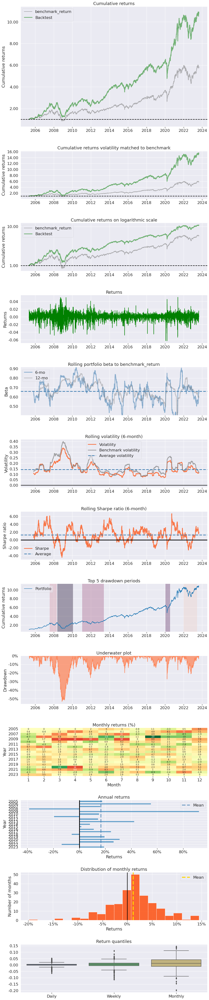

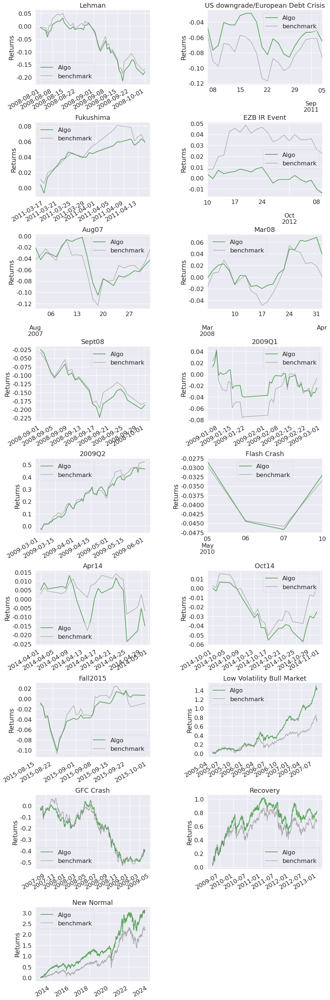

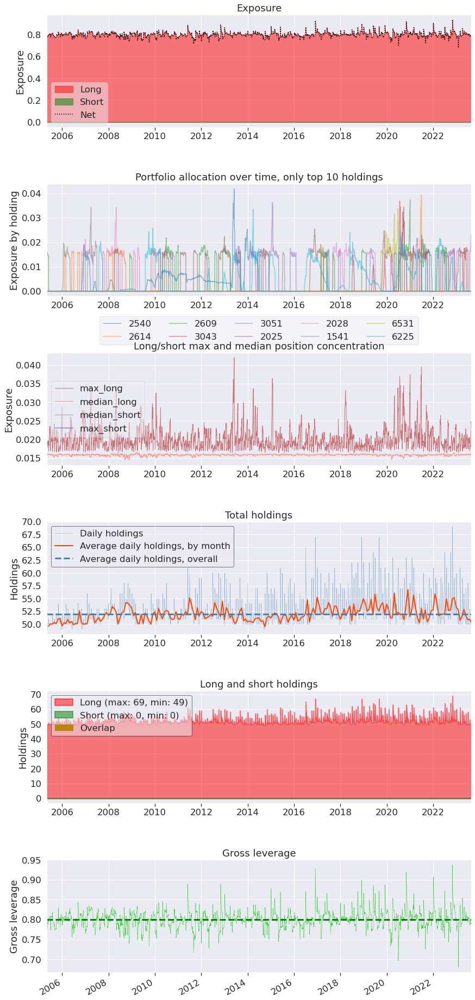

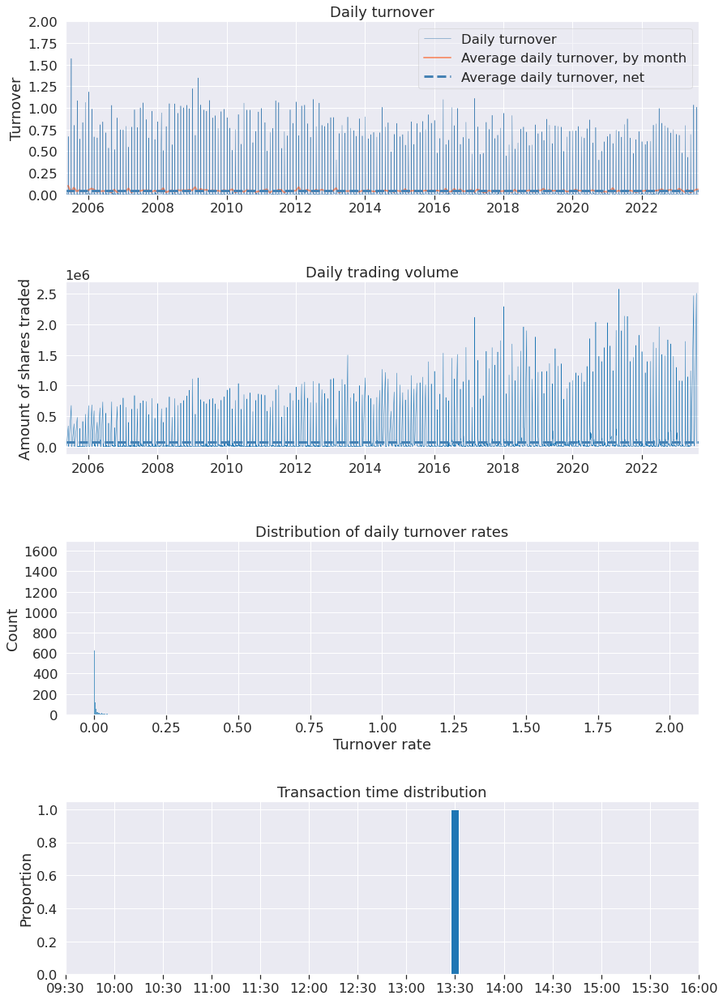

In [62]:
pyfolio.tears.create_full_tear_sheet(returns = returns_pf,
                                     positions = positions_pf,
                                     benchmark_rets = benchmark_pf,
                                     transactions = transactions_pf)

## Conclusion

- **報酬率**
  - 從`Cumulative returns`來看，投資組合的累積報酬在2007以後皆優於大盤。
  - 觀察`Distribution of monthly returns`可以發現平均月報酬率>0，且整體分布呈現左偏。
  - 從`Top 5 drawdown periods`及`Cumulative returns`來看可以發現5個比較大的大盤回檔期間投資組合報酬率也有回檔的現象，這個因子並沒有特別明顯的抗跌效果，然而最大回檔幅度略低於大盤（大盤MDD：-0.56）。  
  

- **波動率、調整後報酬及alpha／beta**  
  - 從`umulative returns volatility matched to benchmark`來看，波動率調整後的累積報酬率在2007年後皆優於大盤。說明投資組合有特別明顯的的選股能力或擇時能力。
  - 從`Rolling volatility`來看，投資組合波動性大多低於大盤。  
  - 從`Rolling portfolio beta to benchmark_return`來看，portfolio beta多數期間<1，平均約在0.7間。  
  - `Max drawdown`略低於大盤（portfolio：-0.53；benchmark：-0.56）。
  - `Alpha`為0.07，>0。`Sharpe ratio`為0.93，還不錯。

- **部位** 
  - 從`Exposures`來看，可以發現股票長部位曝險皆在0.6~0.9附近，這是因為回測時我們限制股票部位只能佔投資組合的大約8成。
  - 從`Long and short holdings`來看，可以發現帳上最多持有69檔且最少持有49檔股票的長部位，多數時候持有50檔股票左右。持股還算分散。